### BADASS Analysis: tea

Can we train an ML model to distinguish three different classes of tea (black, grey and green) from one another? And can the model recognise the class label of a subclass of analyte it did not see during training (e.g. can it identify Sainsbury's Gold as black tea when Sainsbury's Gold is not one of the tea brands used to train the model)? 

(In this dataset ("type split"), include only the median reading for each brand.)

#### Analytes

Black:
- Clipper
- Diplomat
- Dragonfly
- PG Tips
- Pukka
- Sainsbury's Gold
- Tesco
- Tetley
- Twinings
- Yorkshire

Earl Grey:
- Asda
- Clipper
- Coop
- Devonshire
- Diplomat
- Joe's
- Mand S
- Pukka
- Tesco
- Twinings

Green:
- Clipper
- Diplomat
- Double Dragon
- Dragonfly
- Hand B
- Joe's
- Qi
- Sainsbury's
- Tetley
- Twinings

In [1]:
# Import from array_sensing package
from subroutines.parse_array_data import ParseArrayData
from subroutines.train import RunML, draw_conf_matrices

In [2]:
import copy
import math
import os
import pickle
import random
import shutil
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from collections import OrderedDict
from IPython.display import display
from sklearn.ensemble import AdaBoostClassifier
from sklearn.metrics import (
    accuracy_score, recall_score, precision_score, f1_score, cohen_kappa_score, make_scorer
)
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import LinearSVC, SVC

%matplotlib inline
plt.rcParams['figure.figsize'] = (10, 10)  # Sets default figure size

#### Parse in input data

Tea data (standard array)

In [3]:
tea_fluor_data = ParseArrayData(
    data_dirs_dict={'DPH': '/home/ks17361/ML_environment/BADASS/Tea_data_standard_array/'
                           'Reformatted_tea_csvs_split_type/'},
    results_dir='/home/ks17361/ML_environment/BADASS/Tea_analysis_standard_array/Tea_split_type/'
                'Tea_plate_parsing_plots/',
    repeat_labels_list=['repeat_1', 'repeat_2', 'repeat_3', 'repeat_4', 'repeat_5', 'repeat_6', 'repeat_7',
                        'repeat_8', 'repeat_9', 'repeat_10'],
    peptide_dict = {'DPH': ['No Pep', 'GRP22', 'GRP35', 'GRP46', 'GRP51', 'GRP52', 'GRP63', 'GRP80',
                            'Pent', 'Hex', 'Hex2', 'Hept', '24D', '24E', '24K', '17K']},
    control_peptides={'DPH': ['GRP35']},
    control_analytes=[]
)

Locate xlsx files

In [4]:
tea_fluor_data.group_xlsx_repeats()

In [5]:
tea_fluor_data.repeat_dict

OrderedDict([('repeat_1',
              OrderedDict([('DPH',
                            ['Black_ClipperR1_repeat_1.xlsx',
                             'Black_ClipperR2_repeat_1.xlsx',
                             'Black_ClipperR3_repeat_1.xlsx',
                             'Black_ClipperR4_repeat_1.xlsx',
                             'Black_ClipperR5_repeat_1.xlsx',
                             'Black_ClipperR6_repeat_1.xlsx',
                             'Green_ClipperR1_repeat_1.xlsx',
                             'Green_ClipperR2_repeat_1.xlsx',
                             'Green_ClipperR3_repeat_1.xlsx',
                             'Green_ClipperR4_repeat_1.xlsx',
                             'Green_ClipperR5_repeat_1.xlsx',
                             'Green_ClipperR6_repeat_1.xlsx',
                             'Grey_AsdaR1_repeat_1.xlsx',
                             'Grey_AsdaR2_repeat_1.xlsx',
                             'Grey_AsdaR3_repeat_1.xlsx',
                     

Read the data in each xlsx file into a dataframe and perform min-max scaling

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Black_ClipperR1_repeat_1.xlsx
Drawing scatter plot of data spread for Black_ClipperR1_repeat_1 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

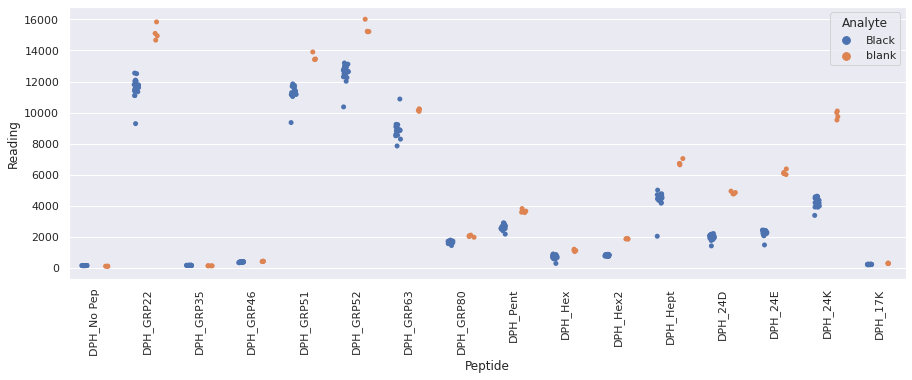

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Black_ClipperR2_repeat_1.xlsx
Drawing scatter plot of data spread for Black_ClipperR2_repeat_1 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

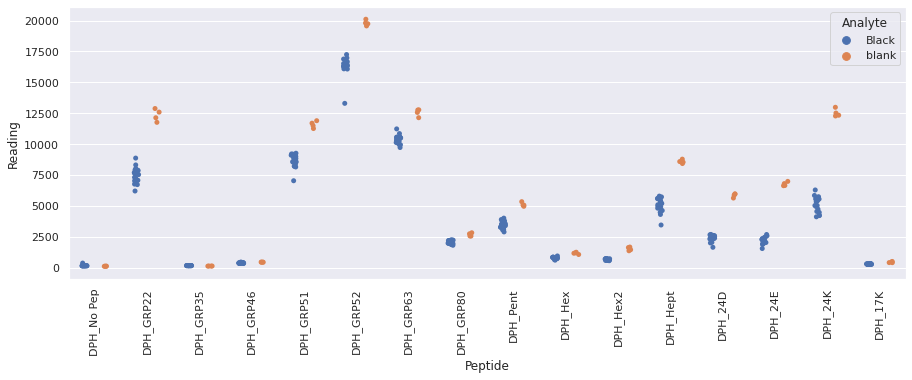

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Black_ClipperR3_repeat_1.xlsx
Drawing scatter plot of data spread for Black_ClipperR3_repeat_1 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

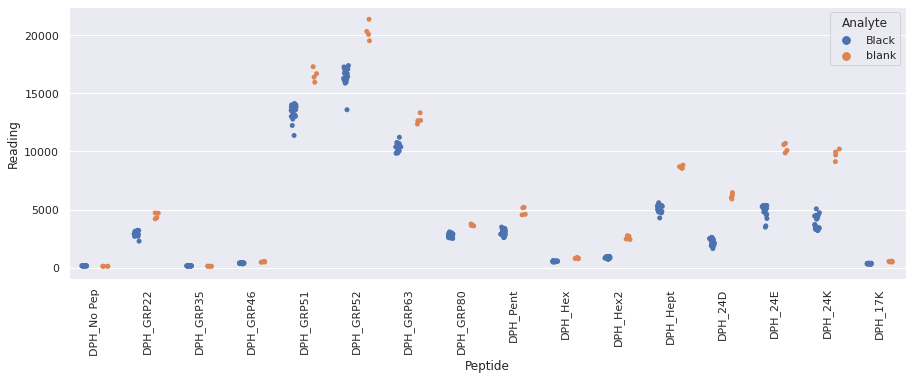

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Black_ClipperR4_repeat_1.xlsx
Drawing scatter plot of data spread for Black_ClipperR4_repeat_1 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

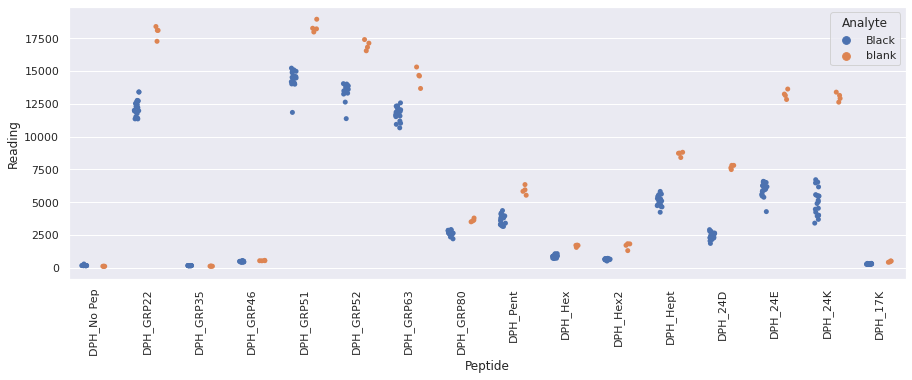

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Black_ClipperR5_repeat_1.xlsx
Drawing scatter plot of data spread for Black_ClipperR5_repeat_1 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

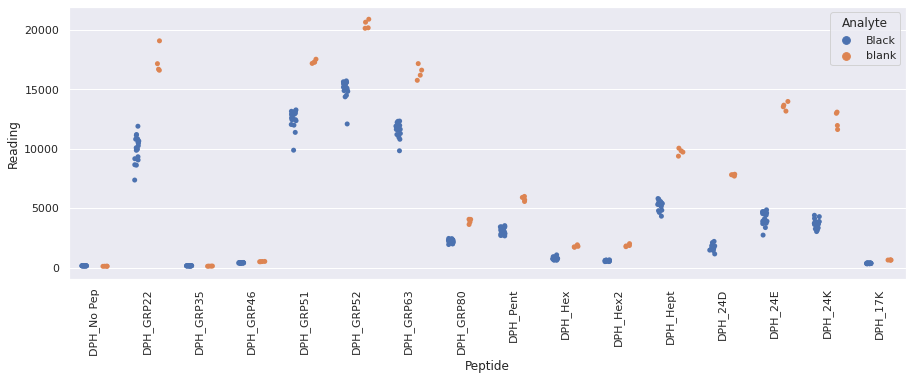

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Black_ClipperR6_repeat_1.xlsx
Drawing scatter plot of data spread for Black_ClipperR6_repeat_1 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

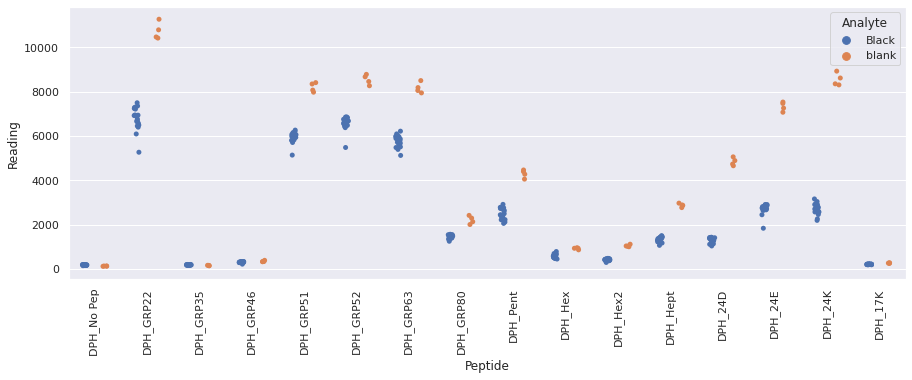

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Green_ClipperR1_repeat_1.xlsx
Drawing scatter plot of data spread for Green_ClipperR1_repeat_1 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

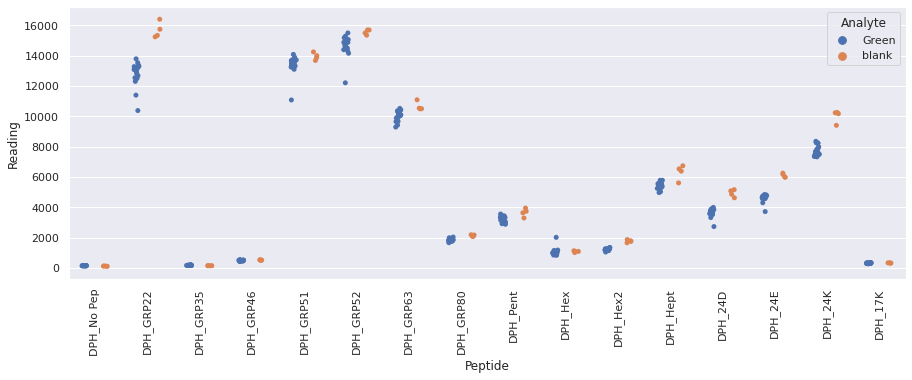

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Green_ClipperR2_repeat_1.xlsx
Drawing scatter plot of data spread for Green_ClipperR2_repeat_1 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

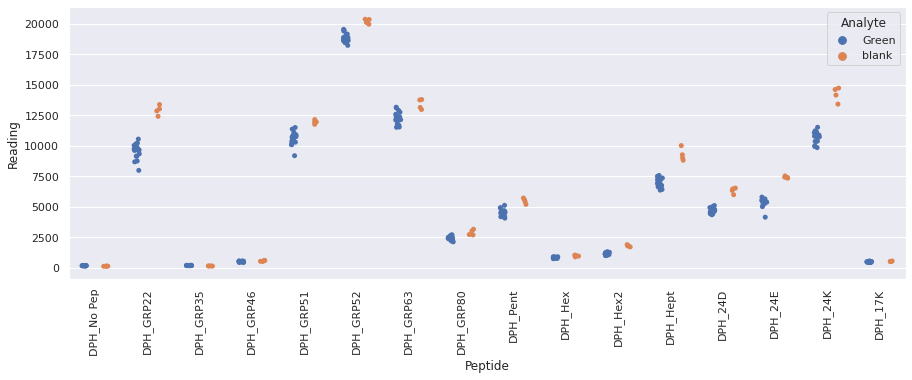

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Green_ClipperR3_repeat_1.xlsx
Drawing scatter plot of data spread for Green_ClipperR3_repeat_1 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

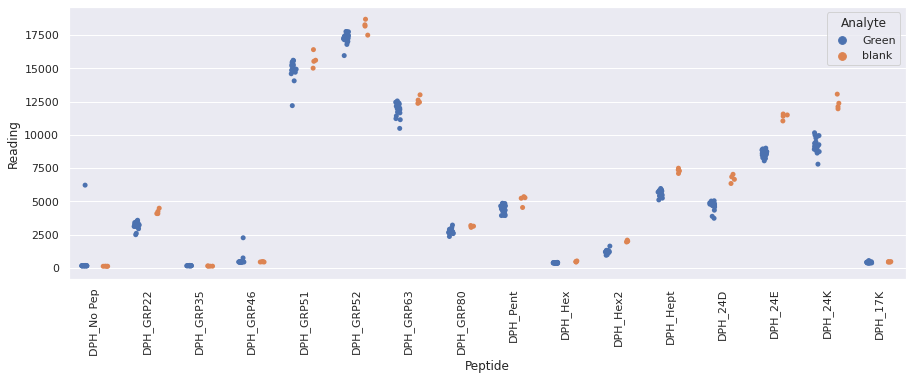

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Green_ClipperR4_repeat_1.xlsx
Drawing scatter plot of data spread for Green_ClipperR4_repeat_1 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

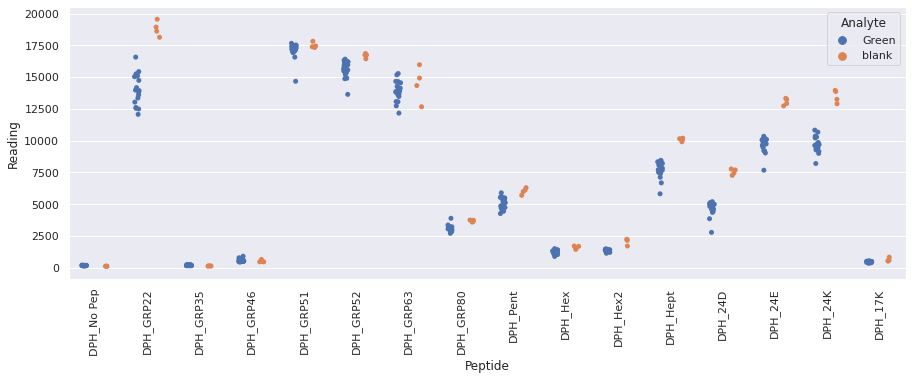

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Green_ClipperR5_repeat_1.xlsx
Drawing scatter plot of data spread for Green_ClipperR5_repeat_1 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

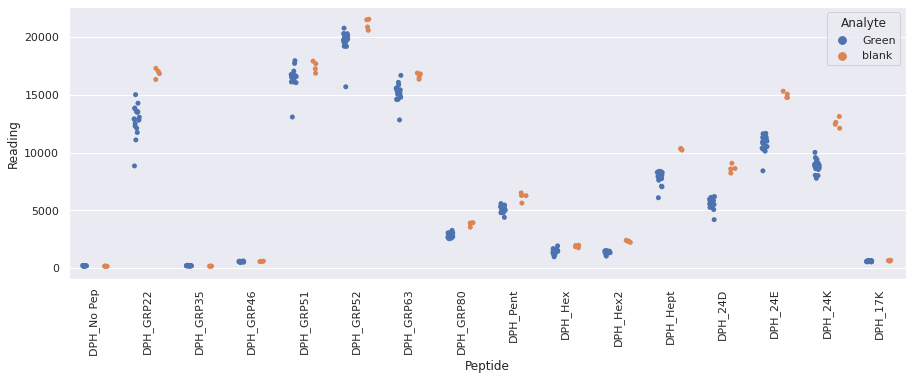

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Green_ClipperR6_repeat_1.xlsx
Drawing scatter plot of data spread for Green_ClipperR6_repeat_1 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

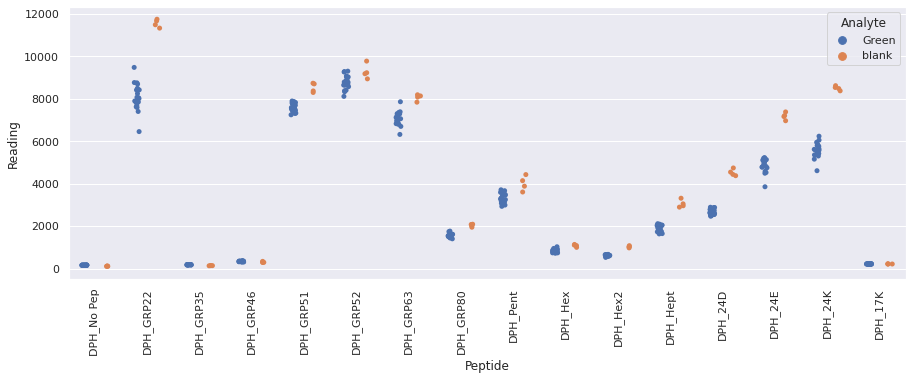

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Grey_AsdaR1_repeat_1.xlsx
Drawing scatter plot of data spread for Grey_AsdaR1_repeat_1 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

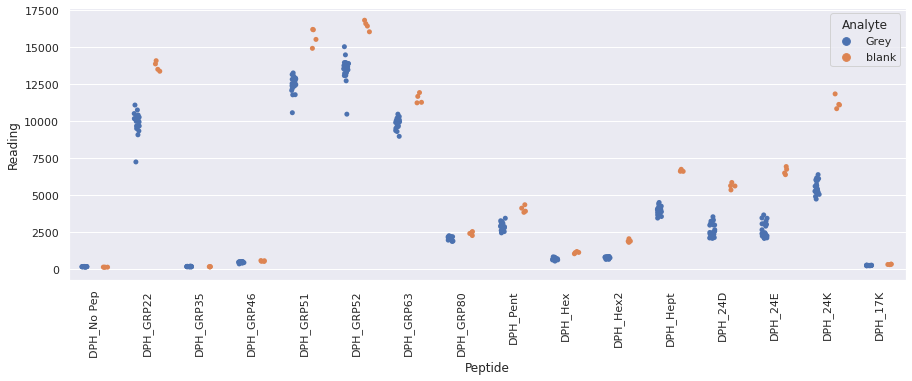

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Grey_AsdaR2_repeat_1.xlsx
Drawing scatter plot of data spread for Grey_AsdaR2_repeat_1 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

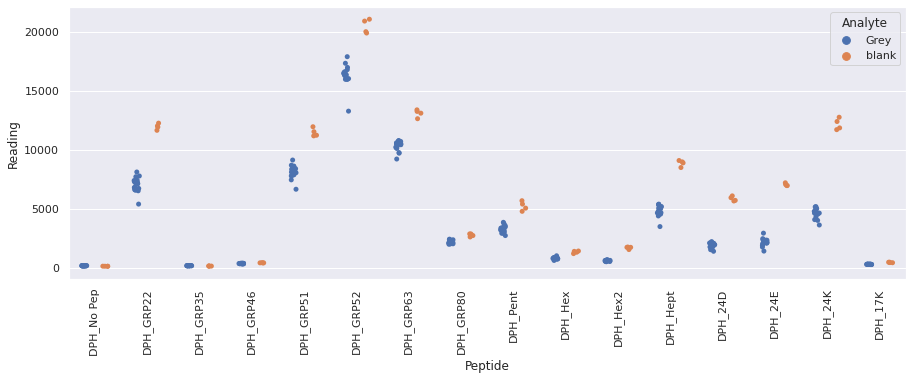

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Grey_AsdaR3_repeat_1.xlsx
Drawing scatter plot of data spread for Grey_AsdaR3_repeat_1 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

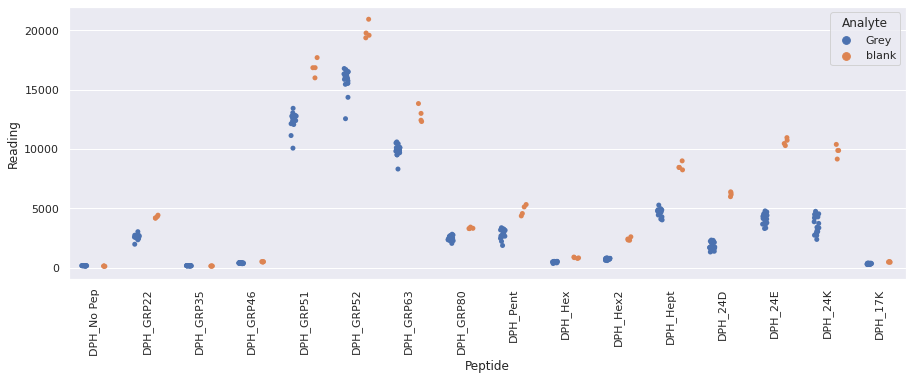

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Grey_AsdaR4_repeat_1.xlsx
Drawing scatter plot of data spread for Grey_AsdaR4_repeat_1 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

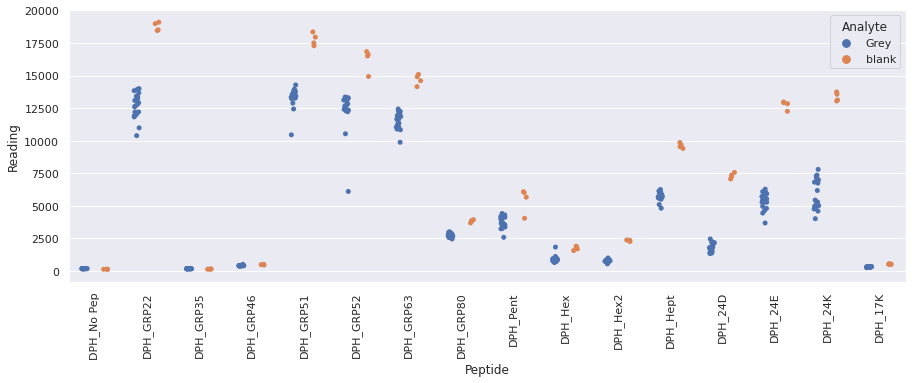

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Grey_AsdaR5_repeat_1.xlsx
Drawing scatter plot of data spread for Grey_AsdaR5_repeat_1 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

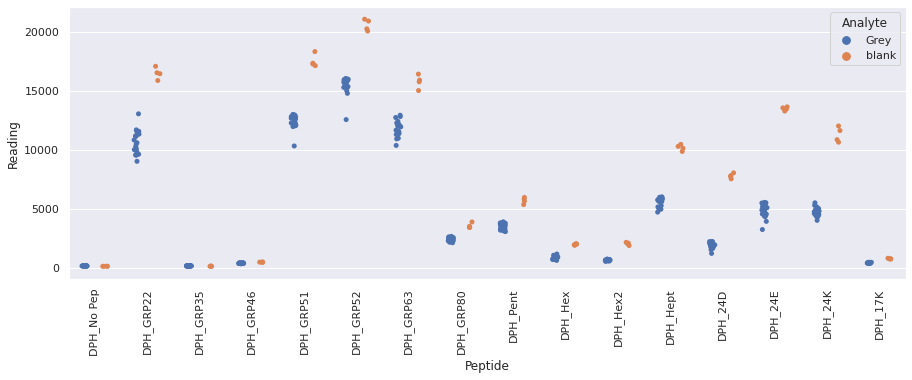

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Grey_AsdaR6_repeat_1.xlsx
Drawing scatter plot of data spread for Grey_AsdaR6_repeat_1 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

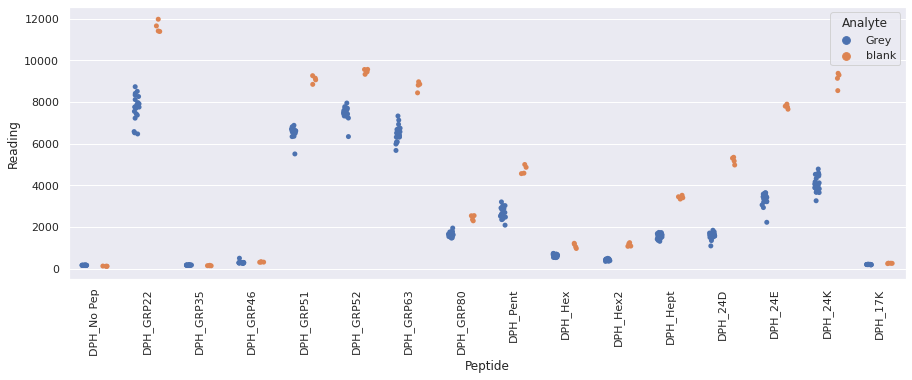

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Black_DiplomatR1_repeat_2.xlsx
Drawing scatter plot of data spread for Black_DiplomatR1_repeat_2 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

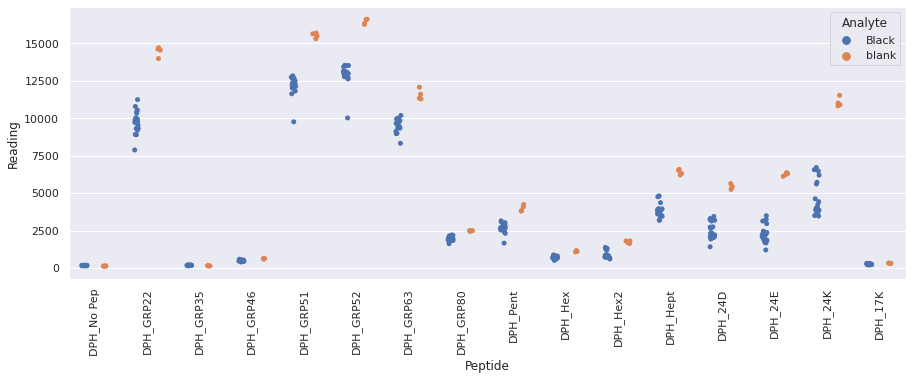

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Black_DiplomatR2_repeat_2.xlsx
Drawing scatter plot of data spread for Black_DiplomatR2_repeat_2 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

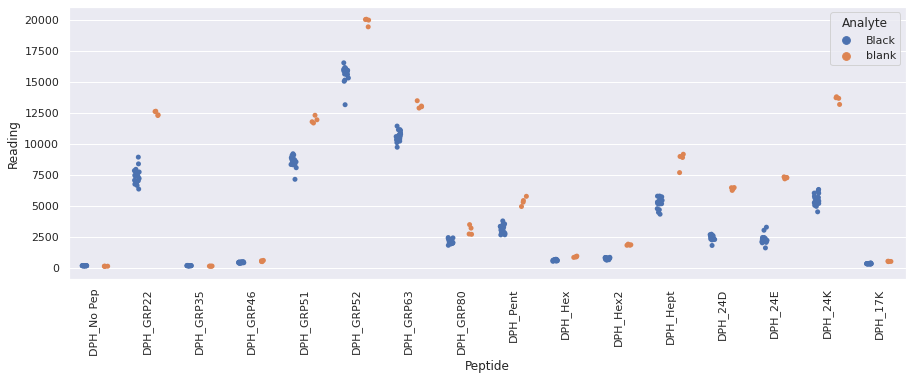

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Black_DiplomatR3_repeat_2.xlsx
Drawing scatter plot of data spread for Black_DiplomatR3_repeat_2 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

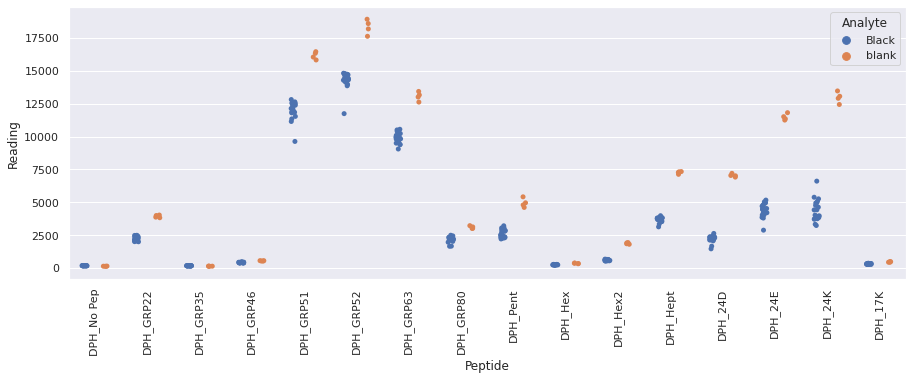

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Black_DiplomatR4_repeat_2.xlsx
Drawing scatter plot of data spread for Black_DiplomatR4_repeat_2 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

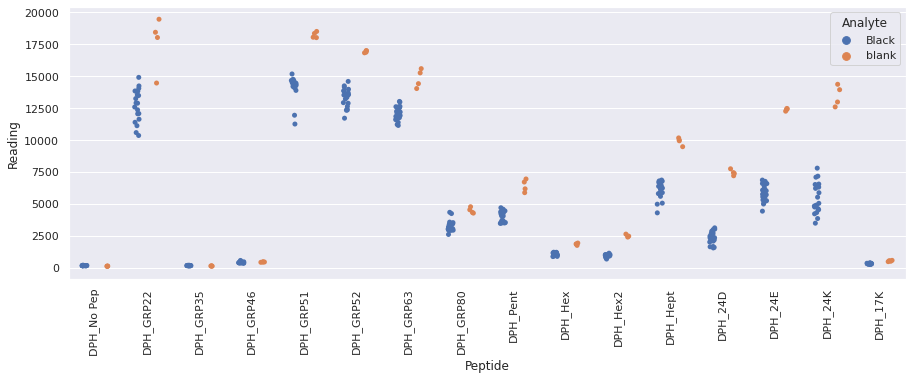

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Black_DiplomatR5_repeat_2.xlsx
Drawing scatter plot of data spread for Black_DiplomatR5_repeat_2 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

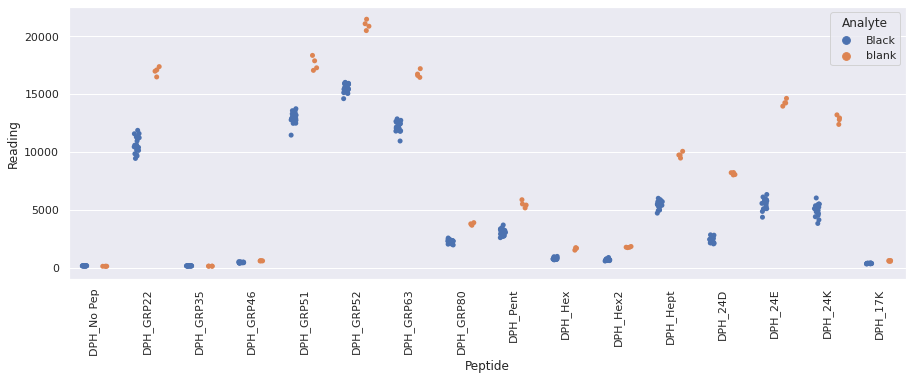

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Black_DiplomatR6_repeat_2.xlsx
Drawing scatter plot of data spread for Black_DiplomatR6_repeat_2 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

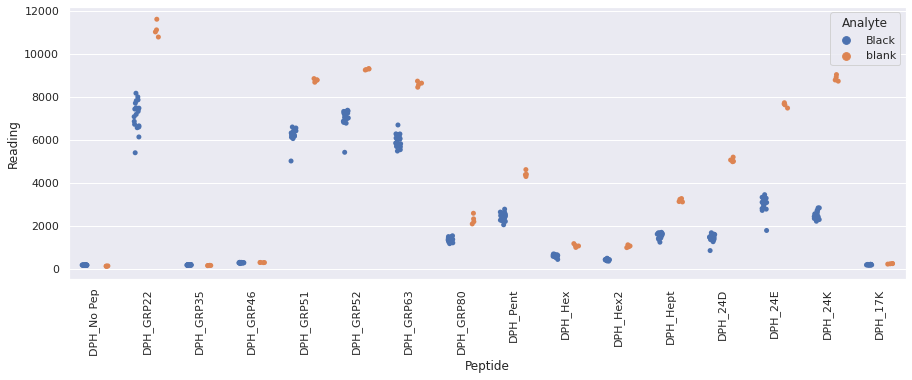

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Green_DiplomatR1_repeat_2.xlsx
Drawing scatter plot of data spread for Green_DiplomatR1_repeat_2 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

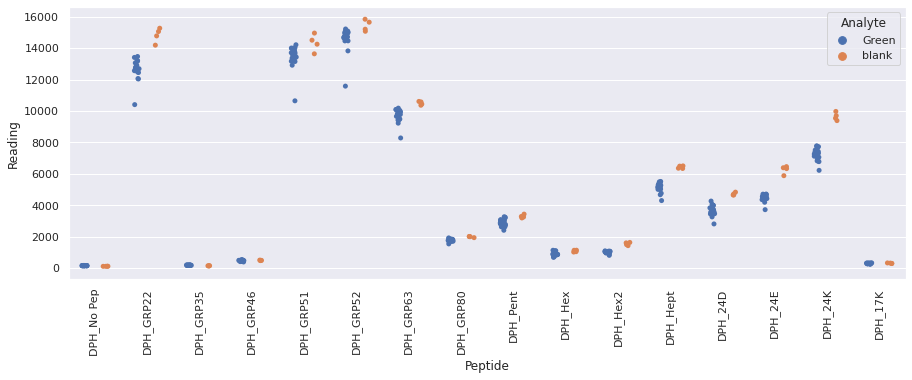

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Green_DiplomatR2_repeat_2.xlsx
Drawing scatter plot of data spread for Green_DiplomatR2_repeat_2 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

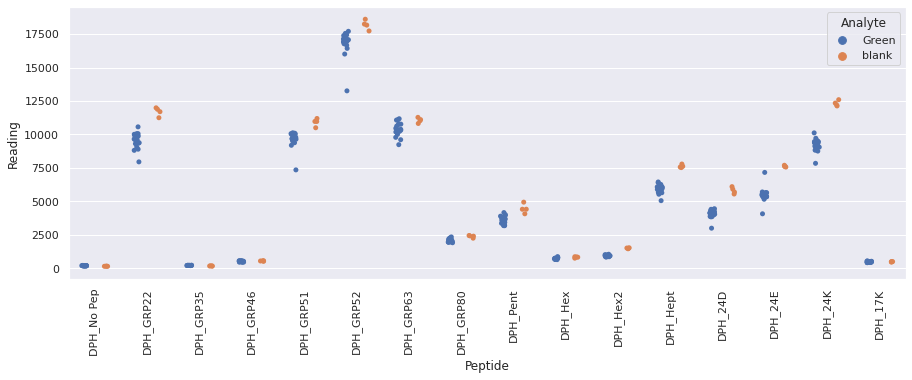

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Green_DiplomatR3_repeat_2.xlsx
Drawing scatter plot of data spread for Green_DiplomatR3_repeat_2 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

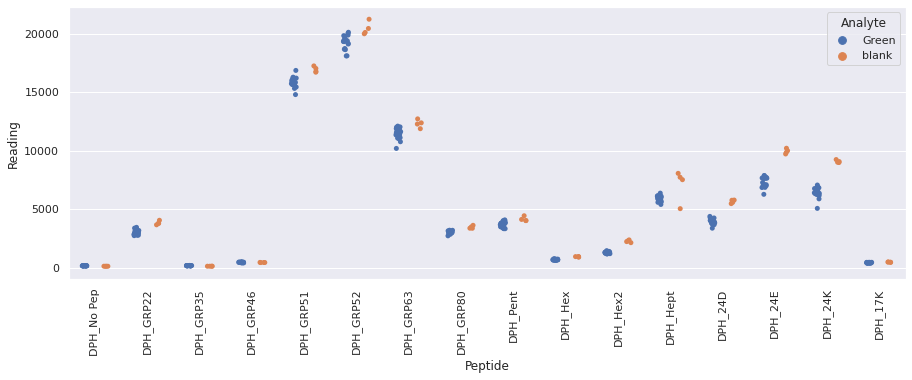

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Green_DiplomatR4_repeat_2.xlsx
Drawing scatter plot of data spread for Green_DiplomatR4_repeat_2 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

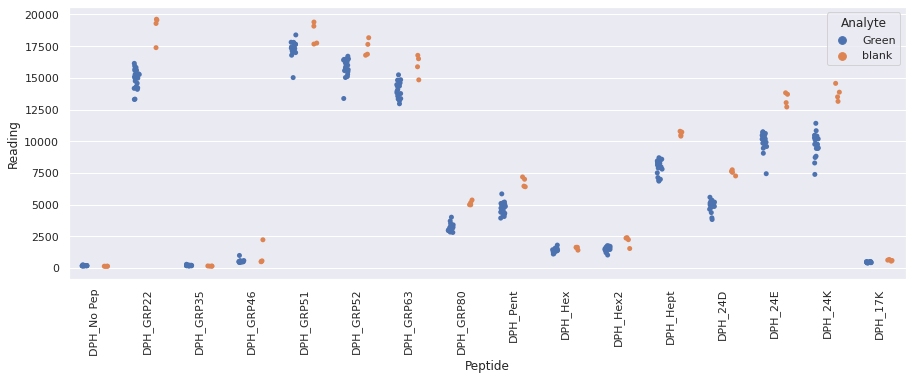

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Green_DiplomatR5_repeat_2.xlsx
Drawing scatter plot of data spread for Green_DiplomatR5_repeat_2 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

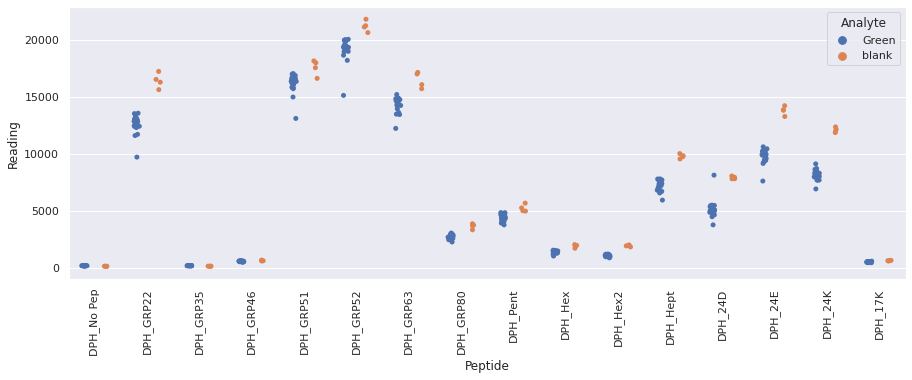

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Green_DiplomatR6_repeat_2.xlsx
Drawing scatter plot of data spread for Green_DiplomatR6_repeat_2 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

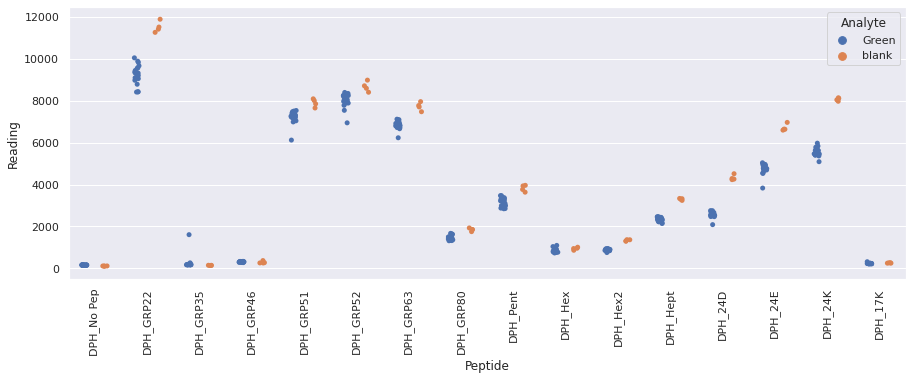

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Grey_ClipperR1_repeat_2.xlsx
Drawing scatter plot of data spread for Grey_ClipperR1_repeat_2 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

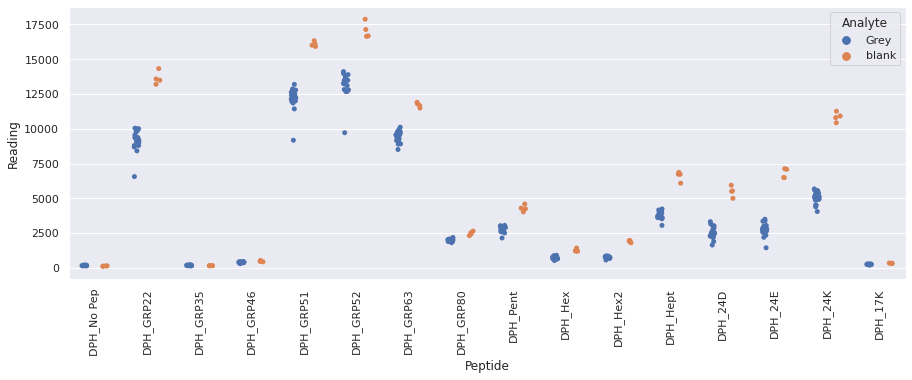

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Grey_ClipperR2_repeat_2.xlsx
Drawing scatter plot of data spread for Grey_ClipperR2_repeat_2 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

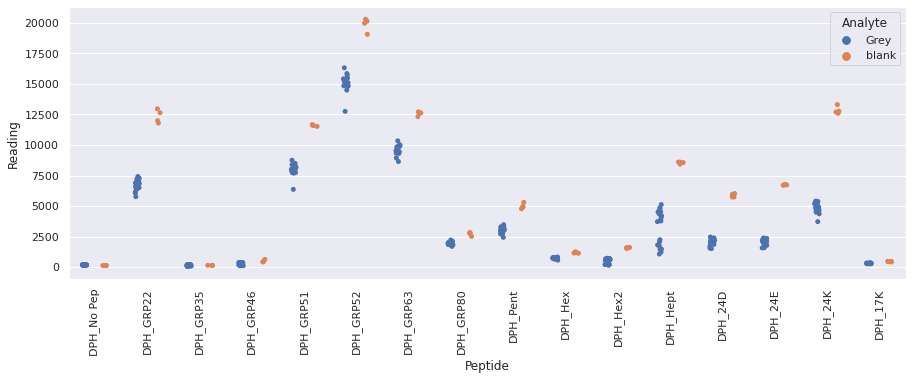

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Grey_ClipperR3_repeat_2.xlsx
Drawing scatter plot of data spread for Grey_ClipperR3_repeat_2 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

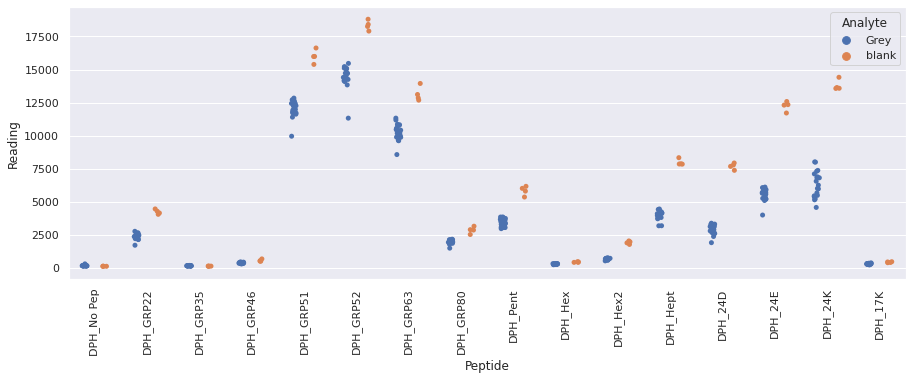

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Grey_ClipperR4_repeat_2.xlsx
Drawing scatter plot of data spread for Grey_ClipperR4_repeat_2 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

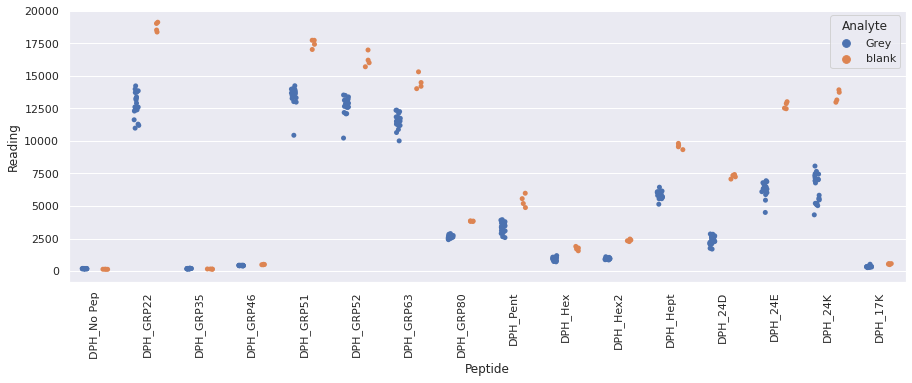

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Grey_ClipperR5_repeat_2.xlsx
Drawing scatter plot of data spread for Grey_ClipperR5_repeat_2 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

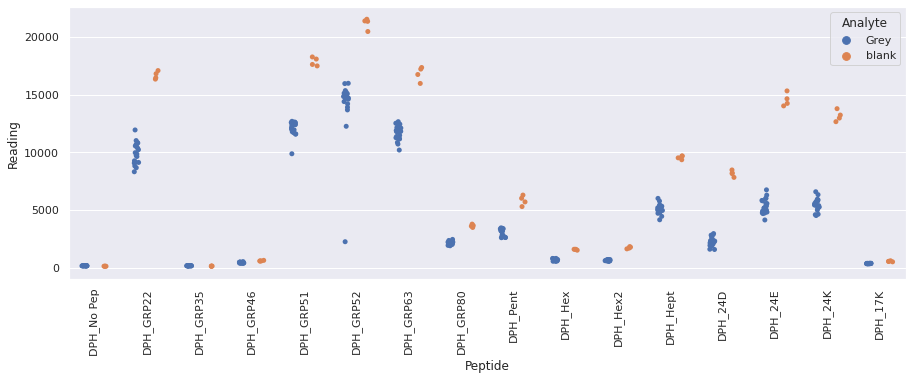

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Grey_ClipperR6_repeat_2.xlsx
Drawing scatter plot of data spread for Grey_ClipperR6_repeat_2 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

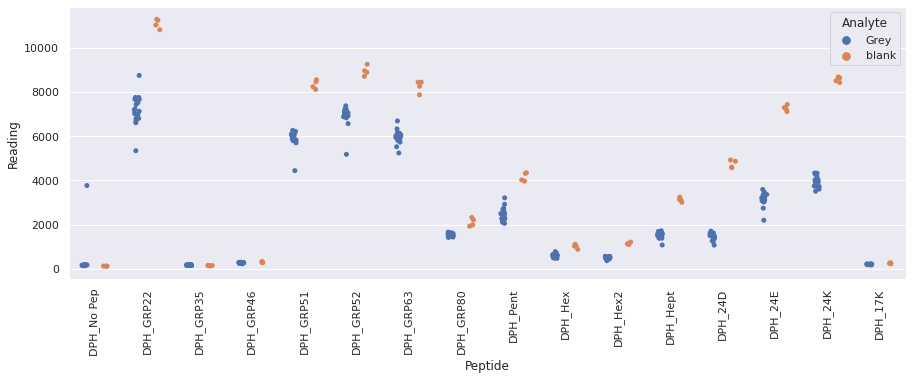

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Black_DragonflyR1_repeat_3.xlsx
Drawing scatter plot of data spread for Black_DragonflyR1_repeat_3 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

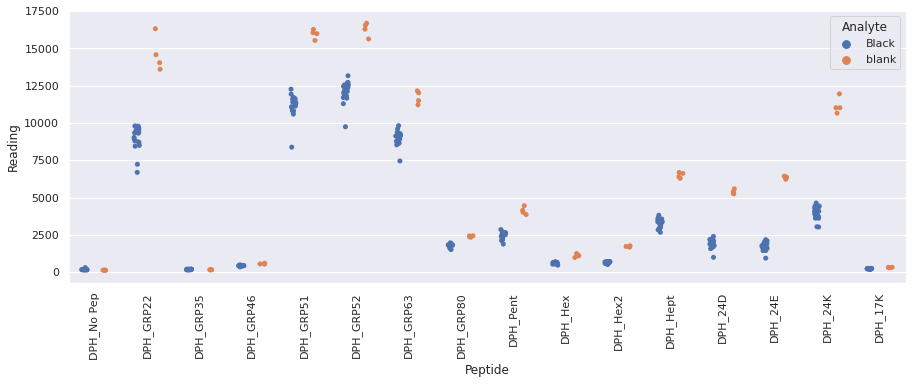

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Black_DragonflyR2_repeat_3.xlsx
Drawing scatter plot of data spread for Black_DragonflyR2_repeat_3 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

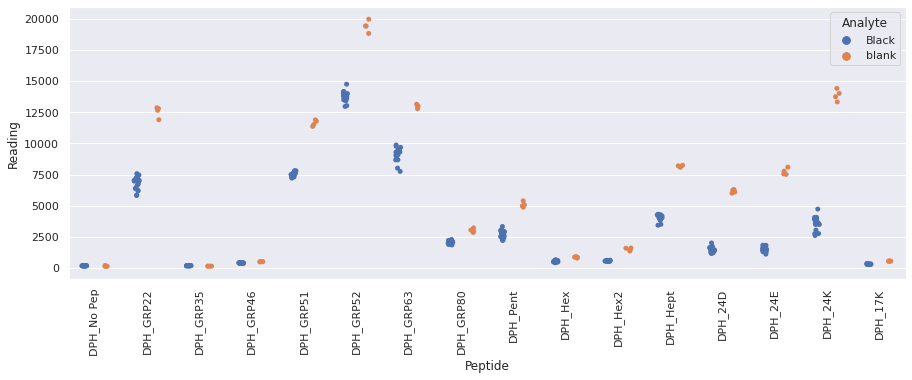

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Black_DragonflyR3_repeat_3.xlsx
Drawing scatter plot of data spread for Black_DragonflyR3_repeat_3 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

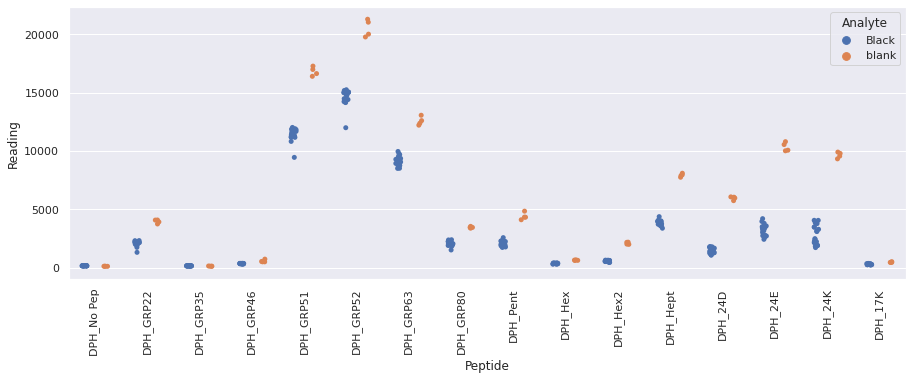

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Black_DragonflyR4_repeat_3.xlsx
Drawing scatter plot of data spread for Black_DragonflyR4_repeat_3 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

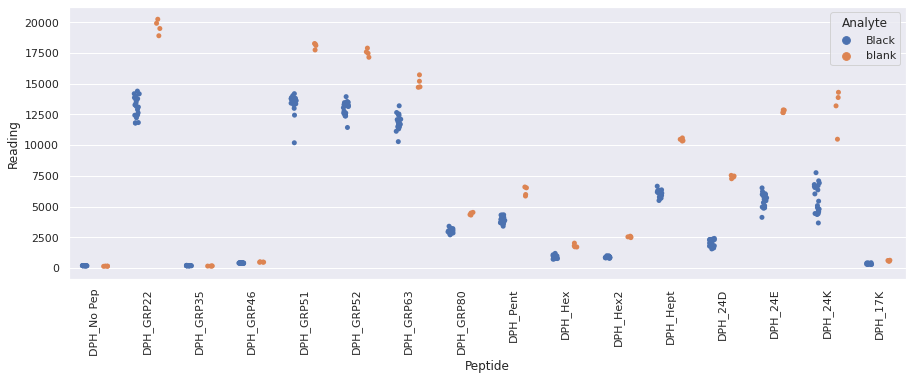

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Black_DragonflyR5_repeat_3.xlsx
Drawing scatter plot of data spread for Black_DragonflyR5_repeat_3 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

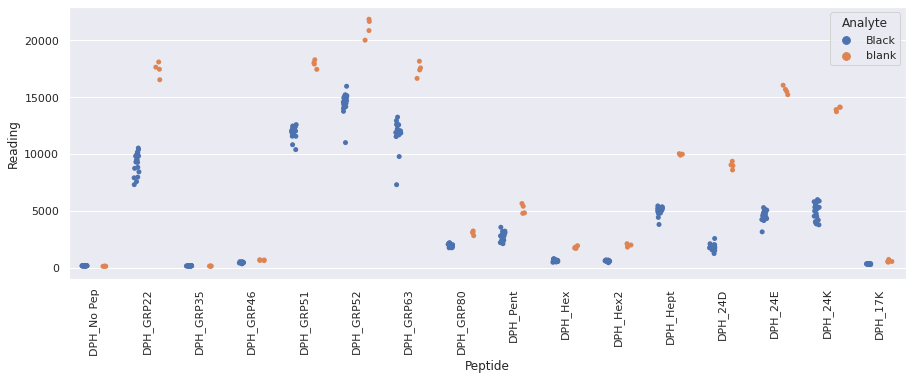

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Black_DragonflyR6_repeat_3.xlsx
Drawing scatter plot of data spread for Black_DragonflyR6_repeat_3 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

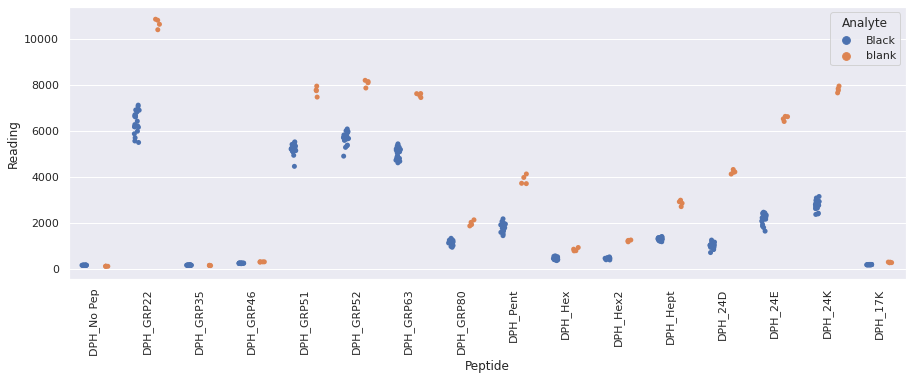

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Green_DoubledragonR1_repeat_3.xlsx
Drawing scatter plot of data spread for Green_DoubledragonR1_repeat_3 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

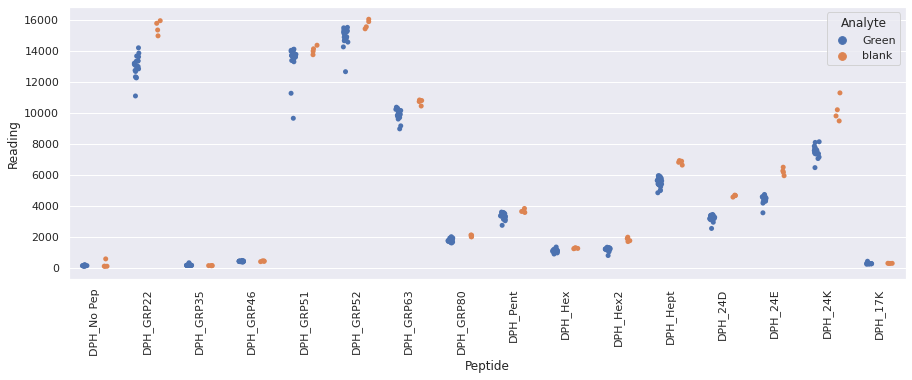

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Green_DoubledragonR2_repeat_3.xlsx
Drawing scatter plot of data spread for Green_DoubledragonR2_repeat_3 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

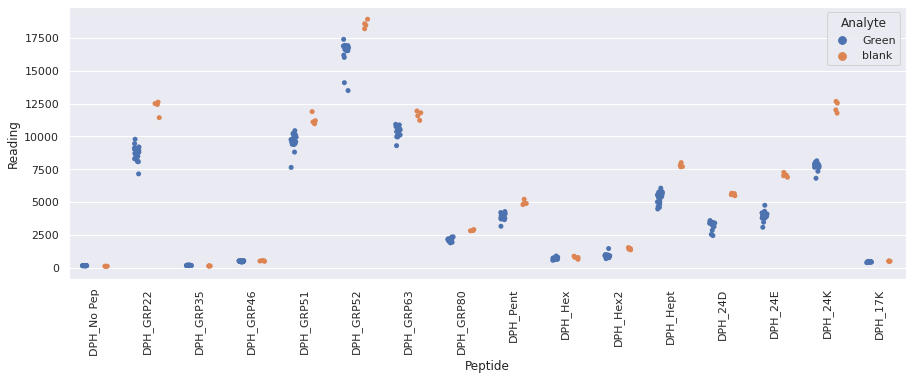

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Green_DoubledragonR3_repeat_3.xlsx
Drawing scatter plot of data spread for Green_DoubledragonR3_repeat_3 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

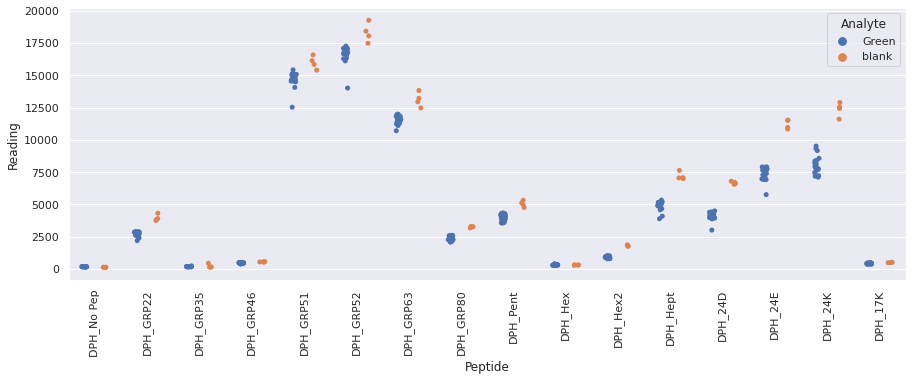

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Green_DoubledragonR4_repeat_3.xlsx
Drawing scatter plot of data spread for Green_DoubledragonR4_repeat_3 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

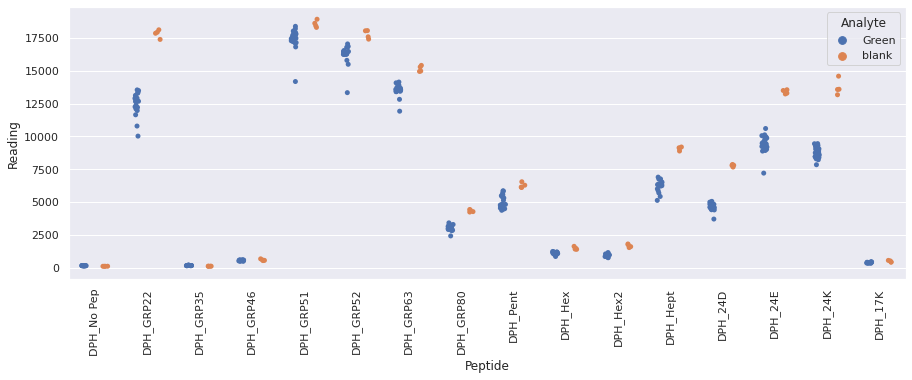

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Green_DoubledragonR5_repeat_3.xlsx
Drawing scatter plot of data spread for Green_DoubledragonR5_repeat_3 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

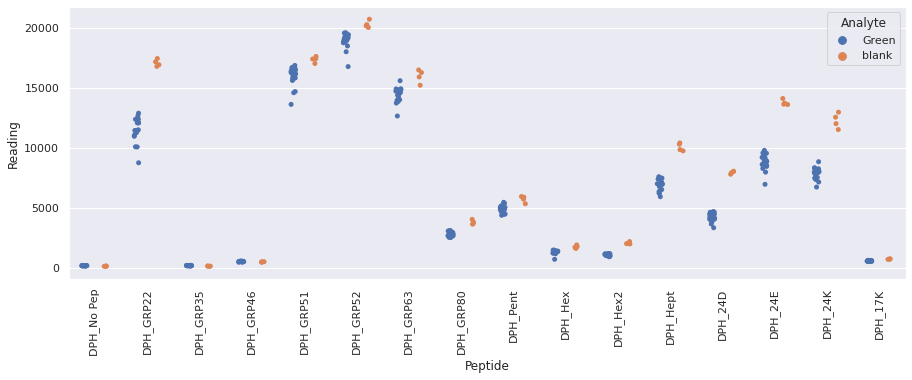

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Green_DoubledragonR6_repeat_3.xlsx
Drawing scatter plot of data spread for Green_DoubledragonR6_repeat_3 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

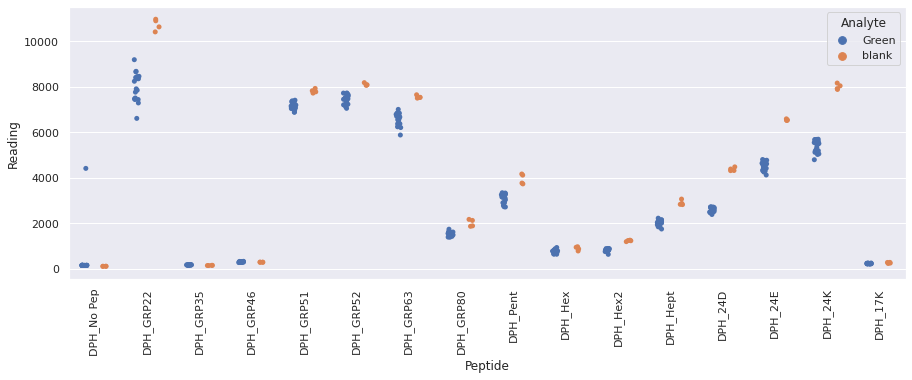

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Grey_CoopR1_repeat_3.xlsx
Drawing scatter plot of data spread for Grey_CoopR1_repeat_3 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

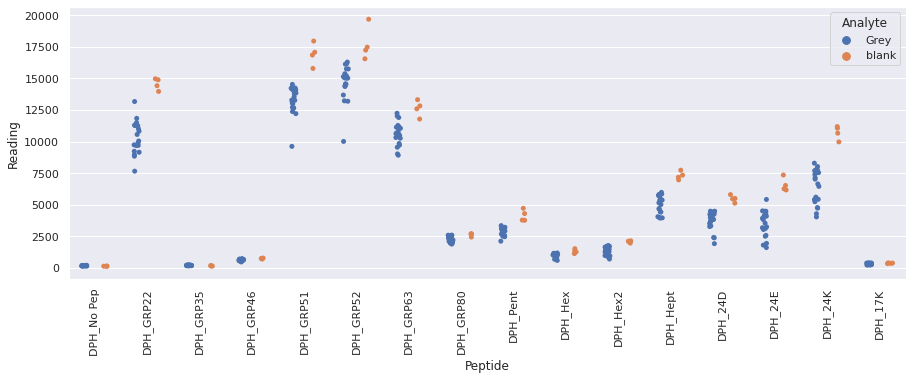

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Grey_CoopR2_repeat_3.xlsx
Drawing scatter plot of data spread for Grey_CoopR2_repeat_3 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

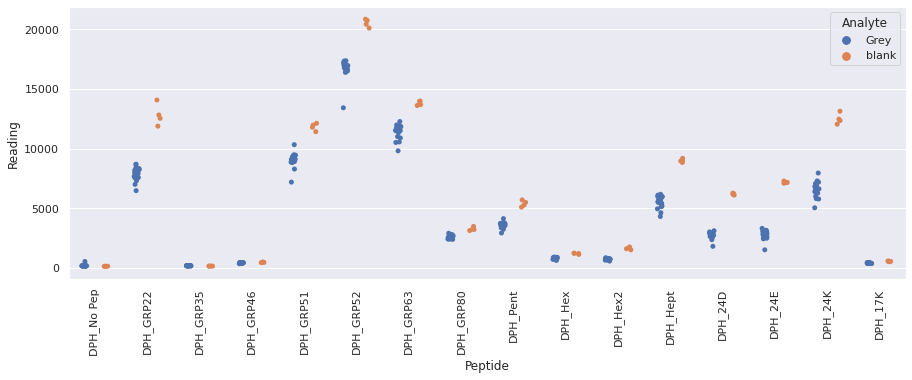

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Grey_CoopR3_repeat_3.xlsx
Drawing scatter plot of data spread for Grey_CoopR3_repeat_3 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

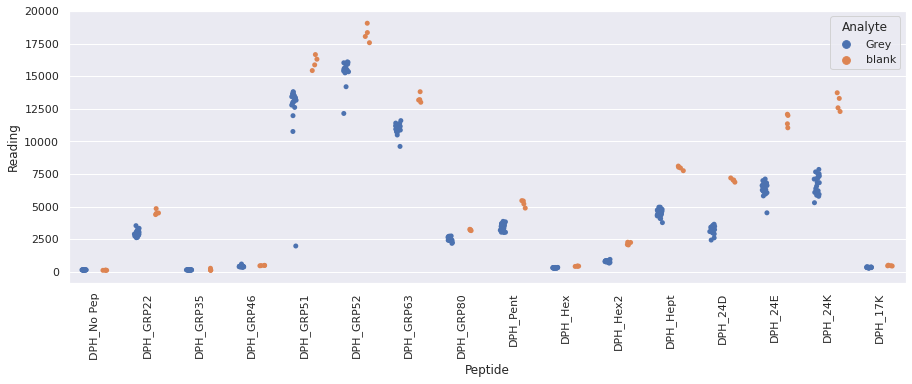

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Grey_CoopR4_repeat_3.xlsx
Drawing scatter plot of data spread for Grey_CoopR4_repeat_3 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

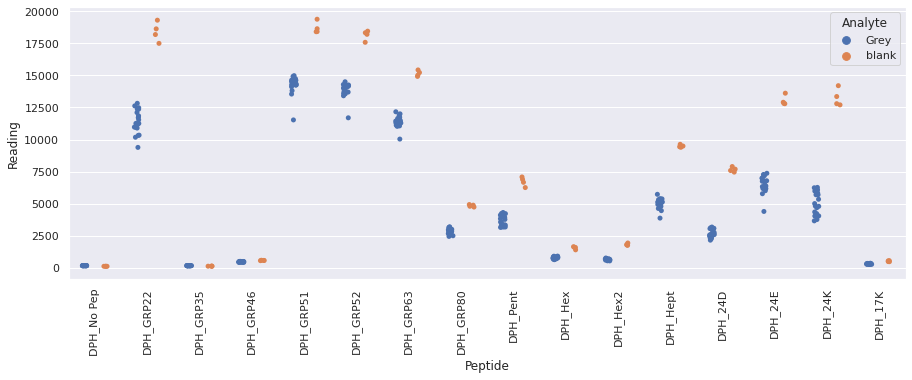

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Grey_CoopR5_repeat_3.xlsx
Drawing scatter plot of data spread for Grey_CoopR5_repeat_3 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

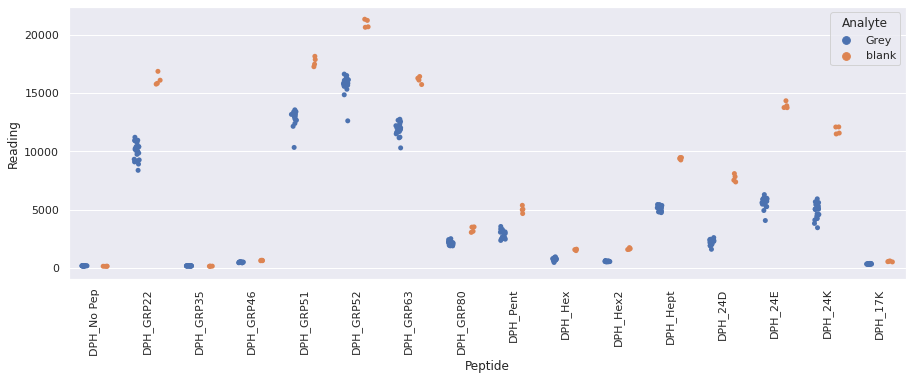

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Grey_CoopR6_repeat_3.xlsx
Drawing scatter plot of data spread for Grey_CoopR6_repeat_3 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

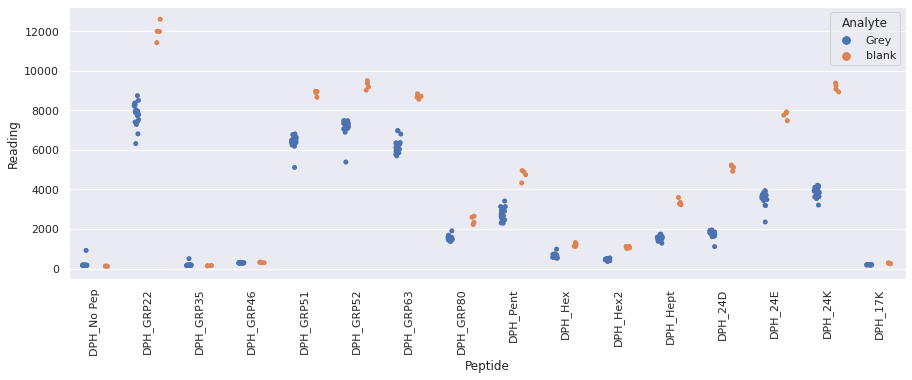

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Black_PgtipsR1_repeat_4.xlsx
Drawing scatter plot of data spread for Black_PgtipsR1_repeat_4 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

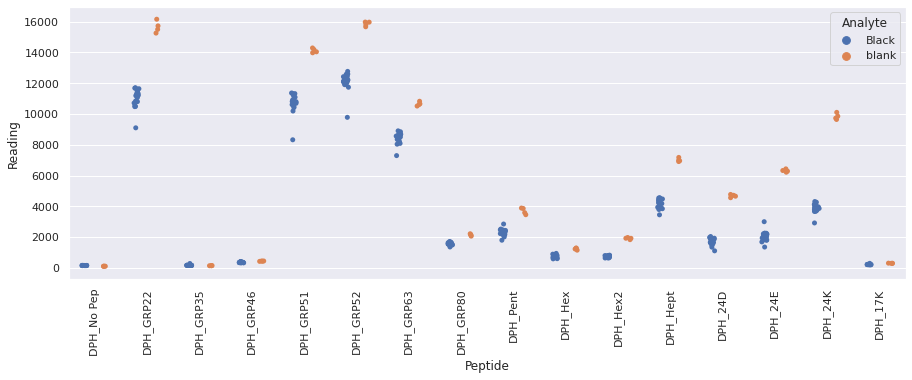

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Black_PgtipsR2_repeat_4.xlsx
Drawing scatter plot of data spread for Black_PgtipsR2_repeat_4 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

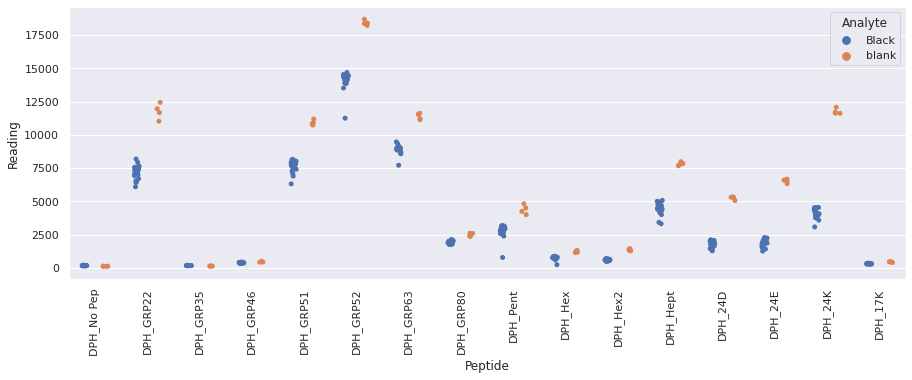

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Black_PgtipsR3_repeat_4.xlsx
Drawing scatter plot of data spread for Black_PgtipsR3_repeat_4 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

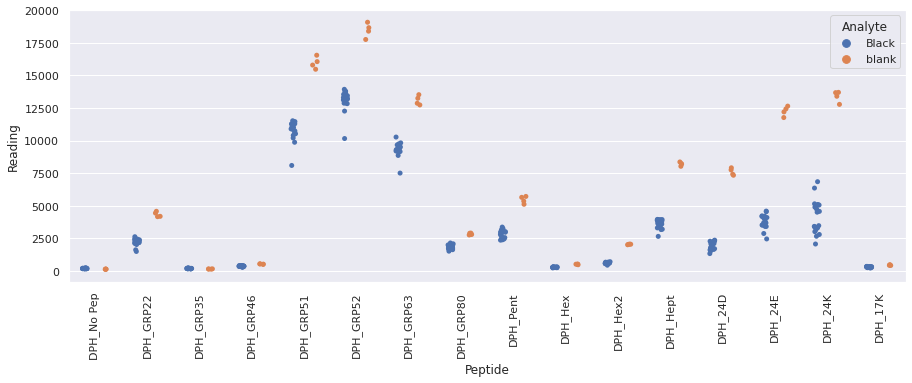

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Black_PgtipsR4_repeat_4.xlsx
Drawing scatter plot of data spread for Black_PgtipsR4_repeat_4 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

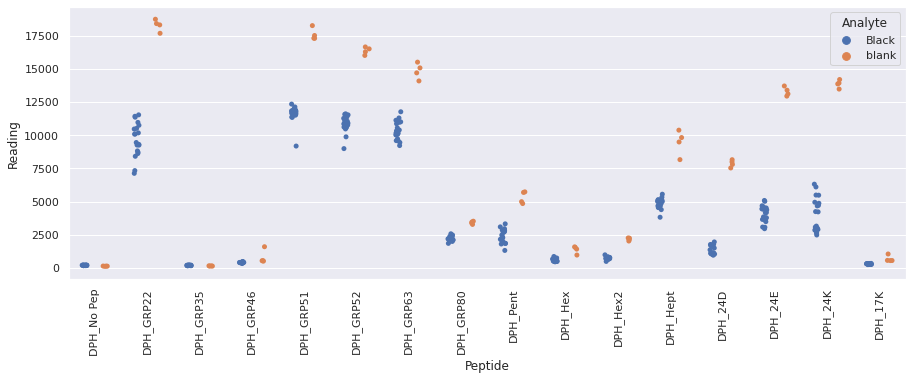

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Black_PgtipsR5_repeat_4.xlsx
Drawing scatter plot of data spread for Black_PgtipsR5_repeat_4 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

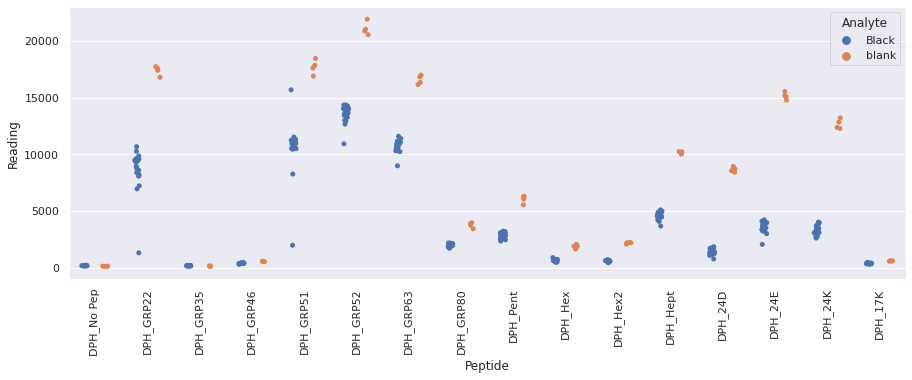

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Black_PgtipsR6_repeat_4.xlsx
Drawing scatter plot of data spread for Black_PgtipsR6_repeat_4 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

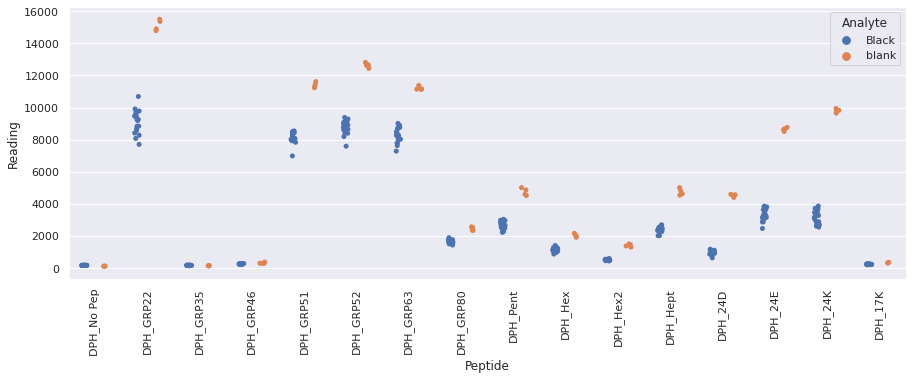

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Green_DragonflyR1_repeat_4.xlsx
Drawing scatter plot of data spread for Green_DragonflyR1_repeat_4 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

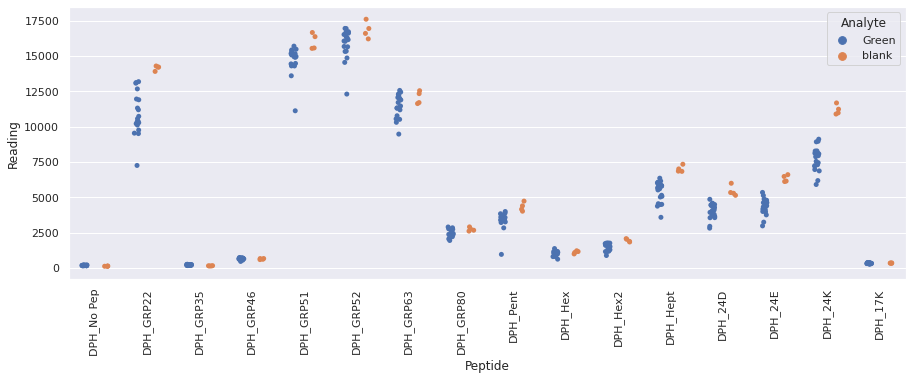

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Green_DragonflyR2_repeat_4.xlsx
Drawing scatter plot of data spread for Green_DragonflyR2_repeat_4 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

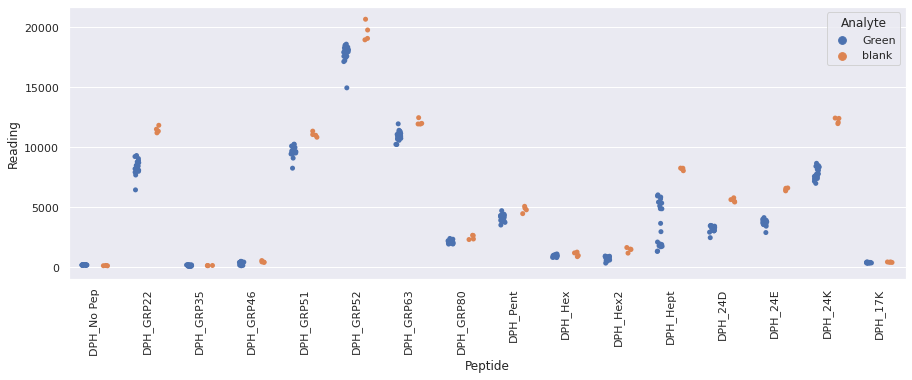

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Green_DragonflyR3_repeat_4.xlsx
Drawing scatter plot of data spread for Green_DragonflyR3_repeat_4 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

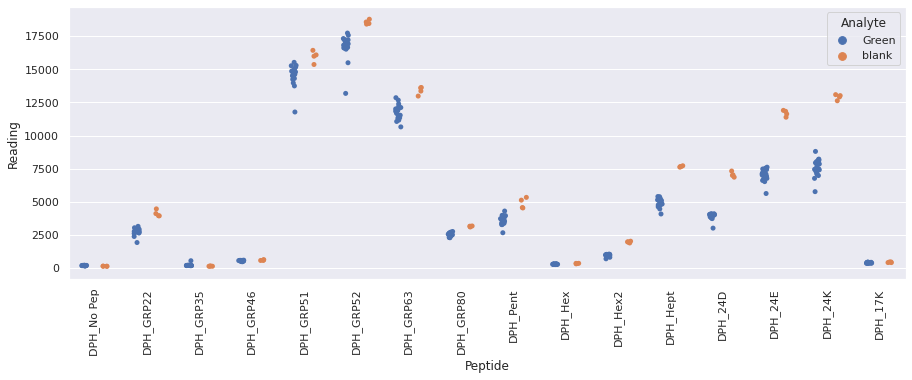

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Green_DragonflyR4_repeat_4.xlsx
Drawing scatter plot of data spread for Green_DragonflyR4_repeat_4 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

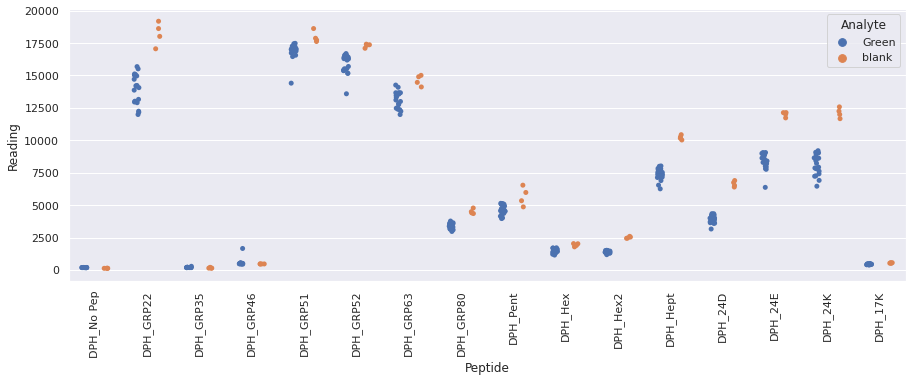

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Green_DragonflyR5_repeat_4.xlsx
Drawing scatter plot of data spread for Green_DragonflyR5_repeat_4 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

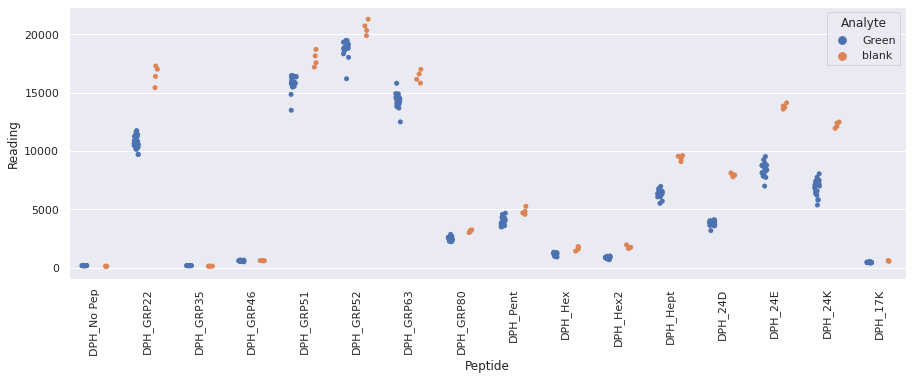

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Green_DragonflyR6_repeat_4.xlsx
Drawing scatter plot of data spread for Green_DragonflyR6_repeat_4 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

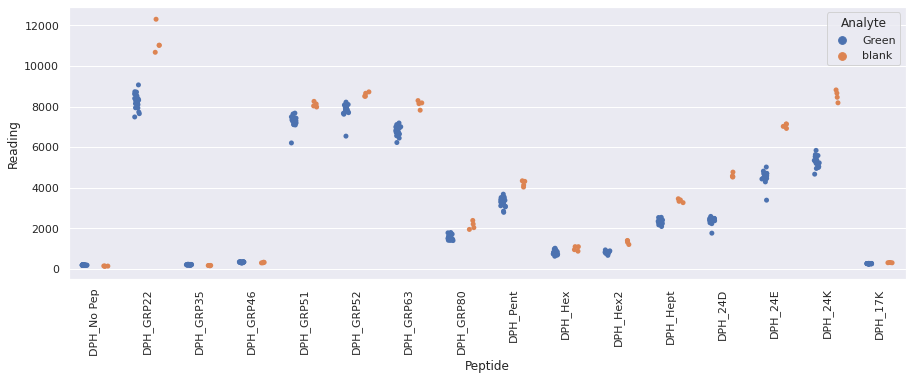

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Grey_DevonshireR1_repeat_4.xlsx
Drawing scatter plot of data spread for Grey_DevonshireR1_repeat_4 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

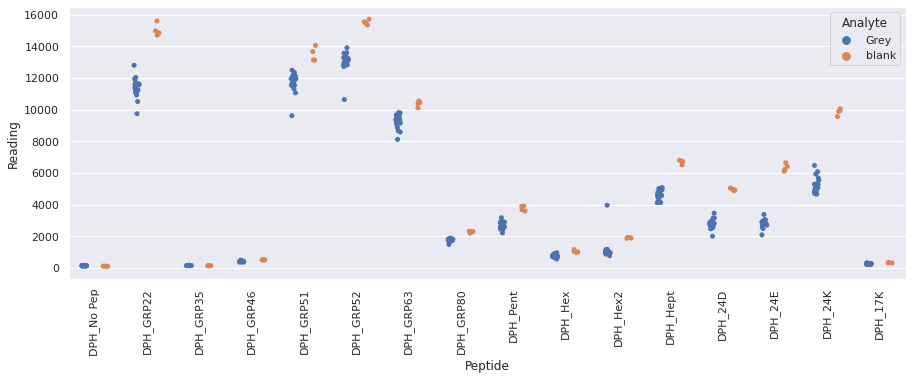

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Grey_DevonshireR2_repeat_4.xlsx
Drawing scatter plot of data spread for Grey_DevonshireR2_repeat_4 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

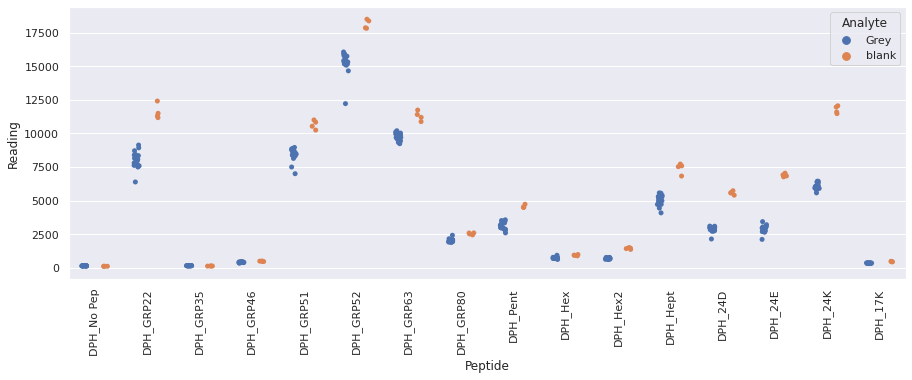

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Grey_DevonshireR3_repeat_4.xlsx
Drawing scatter plot of data spread for Grey_DevonshireR3_repeat_4 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

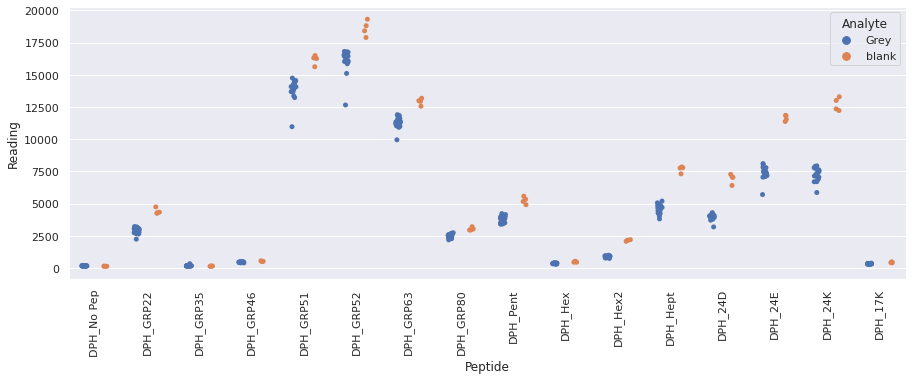

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Grey_DevonshireR4_repeat_4.xlsx
Drawing scatter plot of data spread for Grey_DevonshireR4_repeat_4 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

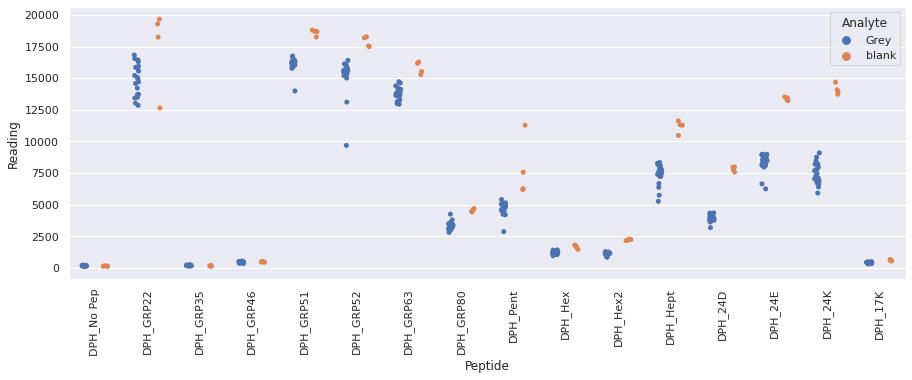

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Grey_DevonshireR5_repeat_4.xlsx
Drawing scatter plot of data spread for Grey_DevonshireR5_repeat_4 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

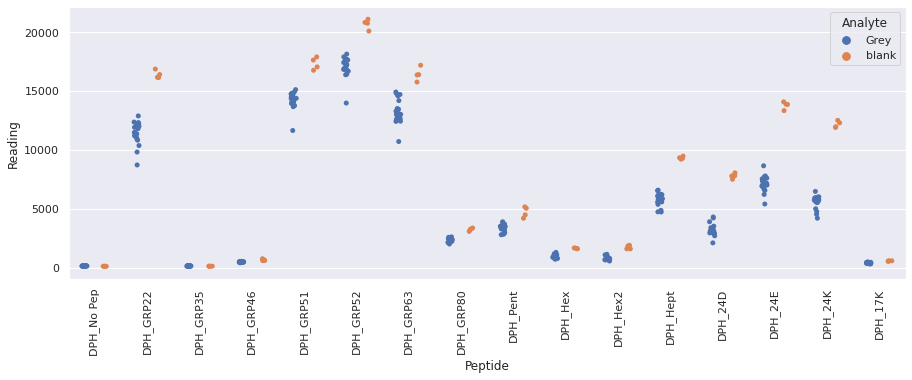

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Grey_DevonshireR6_repeat_4.xlsx
Drawing scatter plot of data spread for Grey_DevonshireR6_repeat_4 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

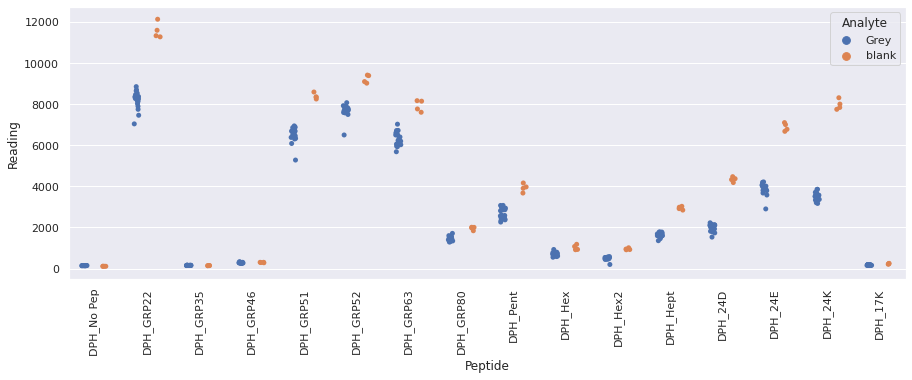

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Black_PukkaR1_repeat_5.xlsx
Drawing scatter plot of data spread for Black_PukkaR1_repeat_5 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

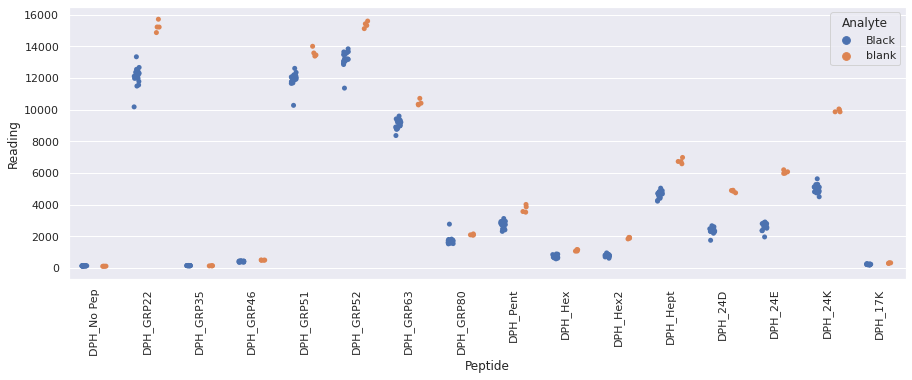

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Black_PukkaR2_repeat_5.xlsx
Drawing scatter plot of data spread for Black_PukkaR2_repeat_5 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

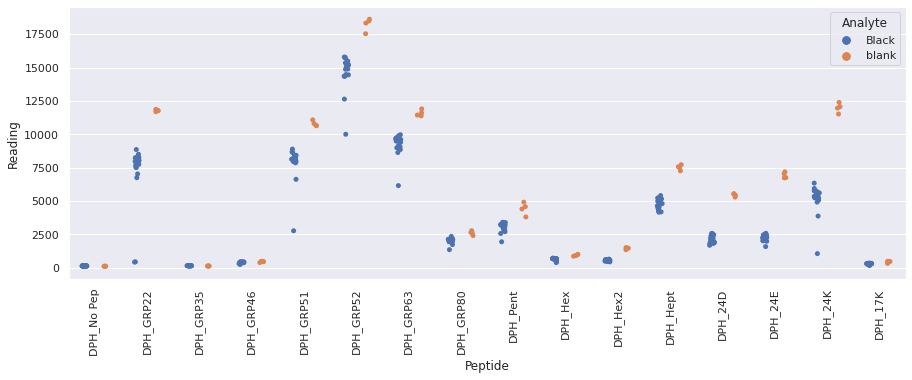

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Black_PukkaR3_repeat_5.xlsx
Drawing scatter plot of data spread for Black_PukkaR3_repeat_5 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

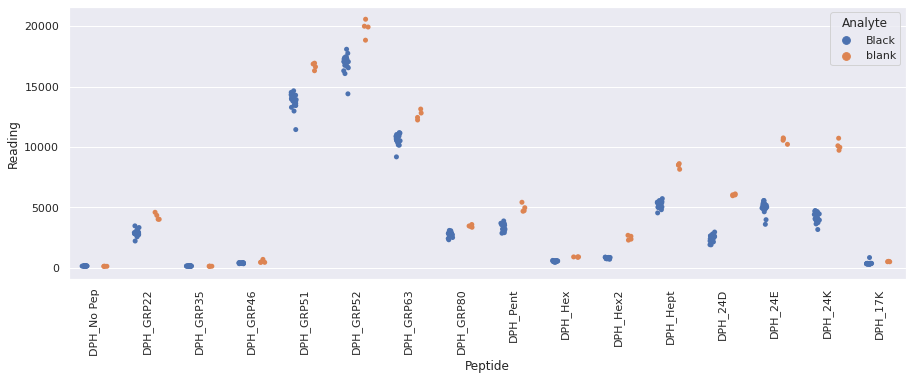

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Black_PukkaR4_repeat_5.xlsx
Drawing scatter plot of data spread for Black_PukkaR4_repeat_5 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

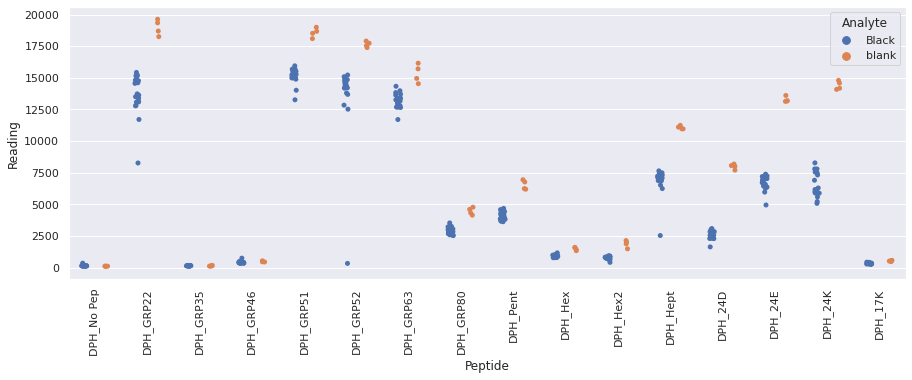

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Black_PukkaR5_repeat_5.xlsx
Drawing scatter plot of data spread for Black_PukkaR5_repeat_5 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

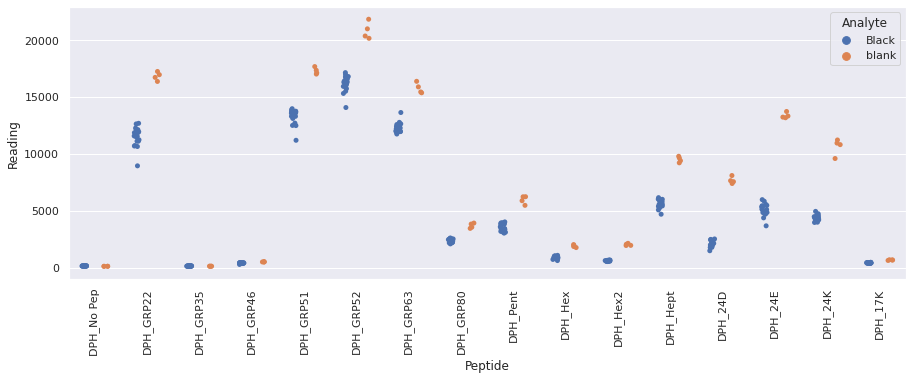

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Black_PukkaR6_repeat_5.xlsx
Drawing scatter plot of data spread for Black_PukkaR6_repeat_5 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

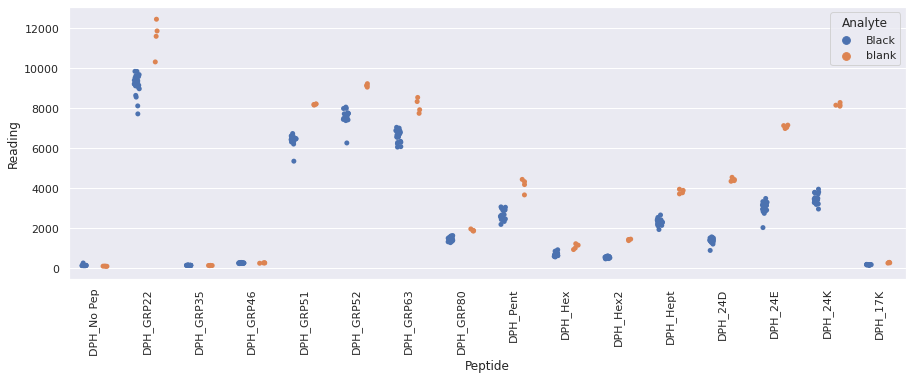

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Green_HandbR1_repeat_5.xlsx
Drawing scatter plot of data spread for Green_HandbR1_repeat_5 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

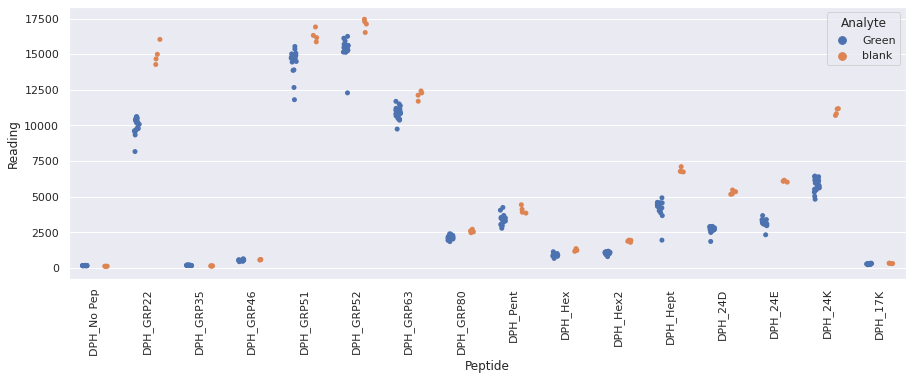

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Green_HandbR2_repeat_5.xlsx
Drawing scatter plot of data spread for Green_HandbR2_repeat_5 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

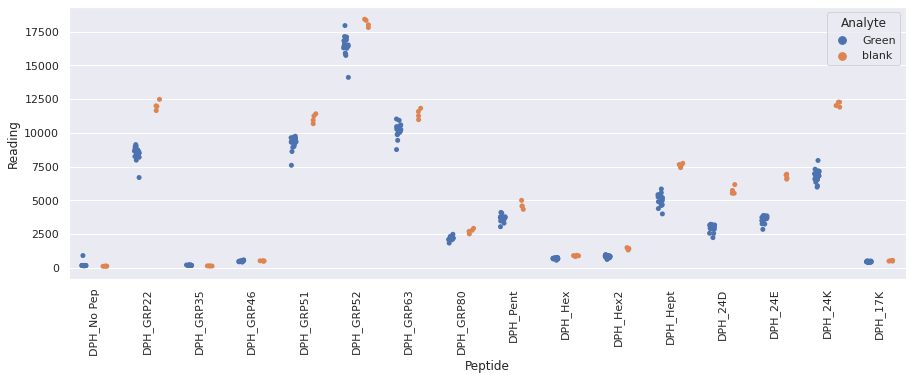

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Green_HandbR3_repeat_5.xlsx
Drawing scatter plot of data spread for Green_HandbR3_repeat_5 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

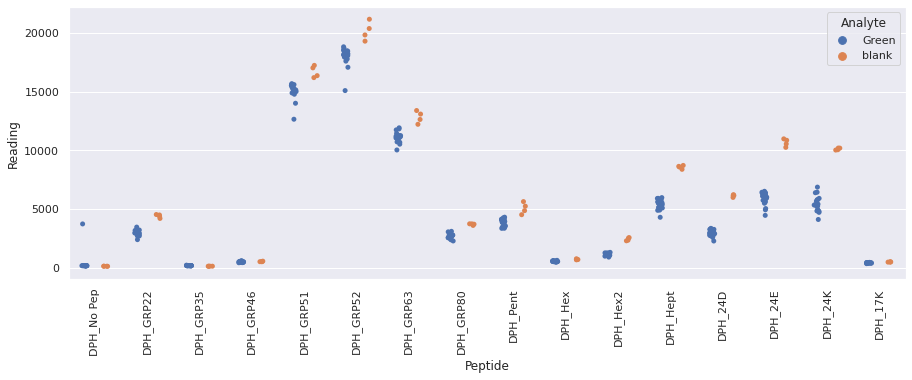

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Green_HandbR4_repeat_5.xlsx
Drawing scatter plot of data spread for Green_HandbR4_repeat_5 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

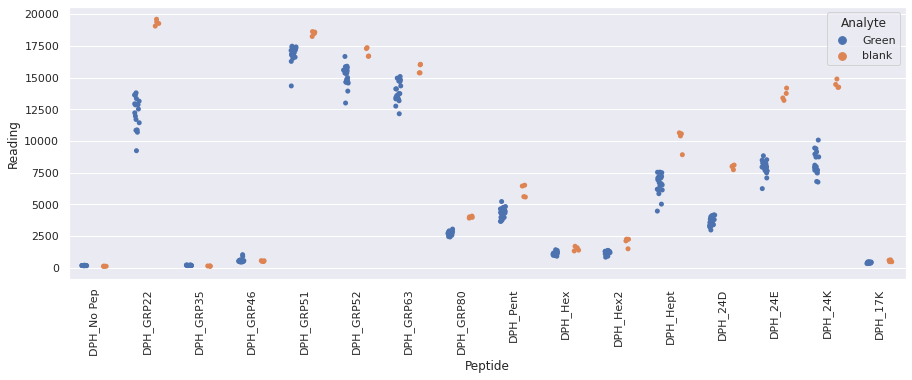

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Green_HandbR5_repeat_5.xlsx
Drawing scatter plot of data spread for Green_HandbR5_repeat_5 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

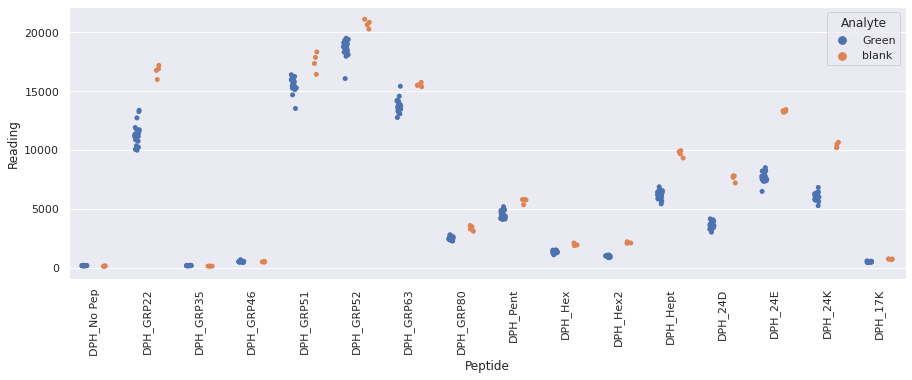

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Green_HandbR6_repeat_5.xlsx
Drawing scatter plot of data spread for Green_HandbR6_repeat_5 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

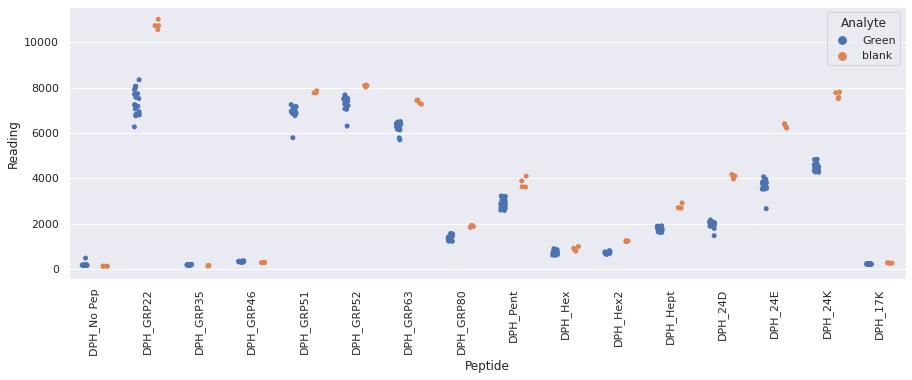

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Grey_DiplomatR1_repeat_5.xlsx
Drawing scatter plot of data spread for Grey_DiplomatR1_repeat_5 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

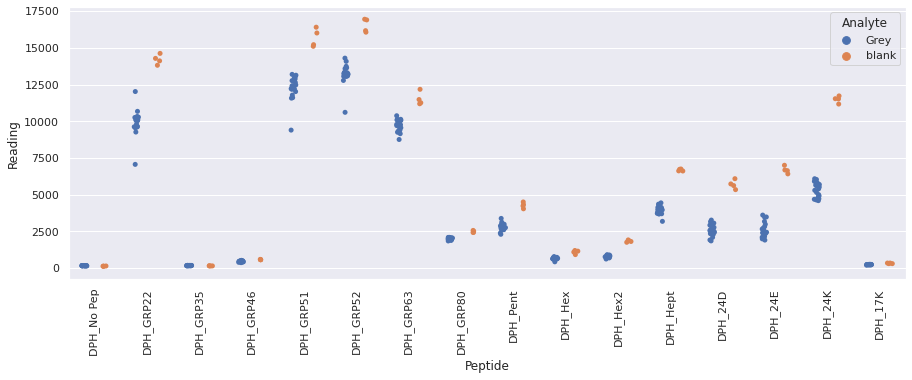

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Grey_DiplomatR2_repeat_5.xlsx
Drawing scatter plot of data spread for Grey_DiplomatR2_repeat_5 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

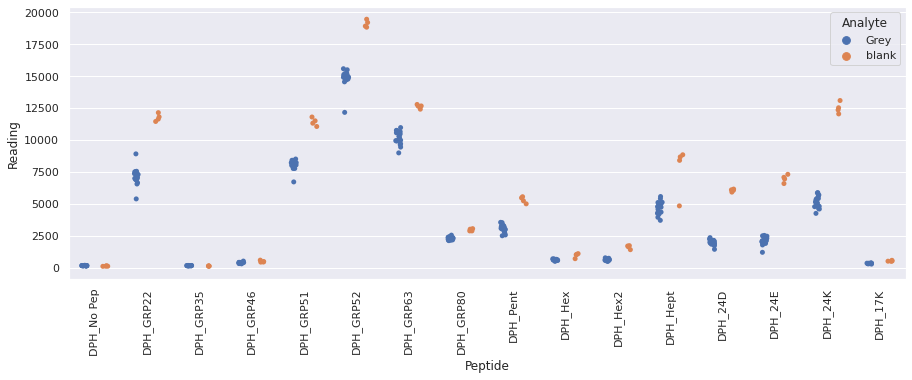

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Grey_DiplomatR3_repeat_5.xlsx
Drawing scatter plot of data spread for Grey_DiplomatR3_repeat_5 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

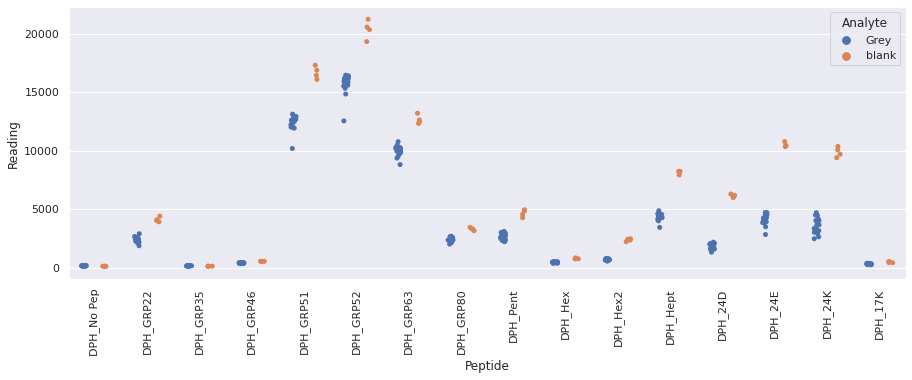

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Grey_DiplomatR4_repeat_5.xlsx
Drawing scatter plot of data spread for Grey_DiplomatR4_repeat_5 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

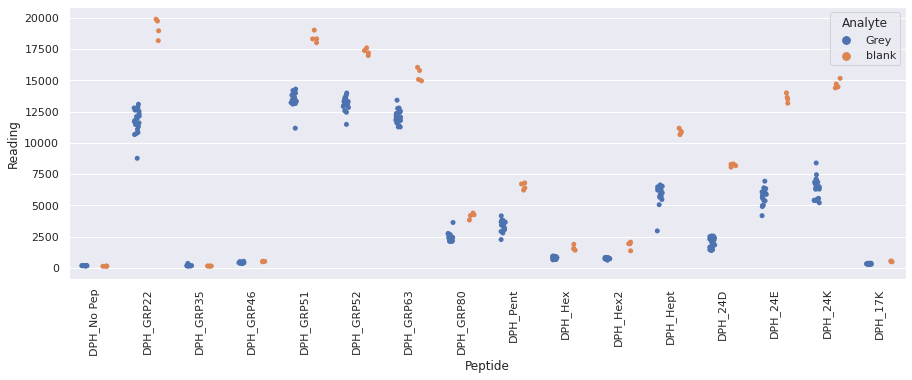

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Grey_DiplomatR5_repeat_5.xlsx
Drawing scatter plot of data spread for Grey_DiplomatR5_repeat_5 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

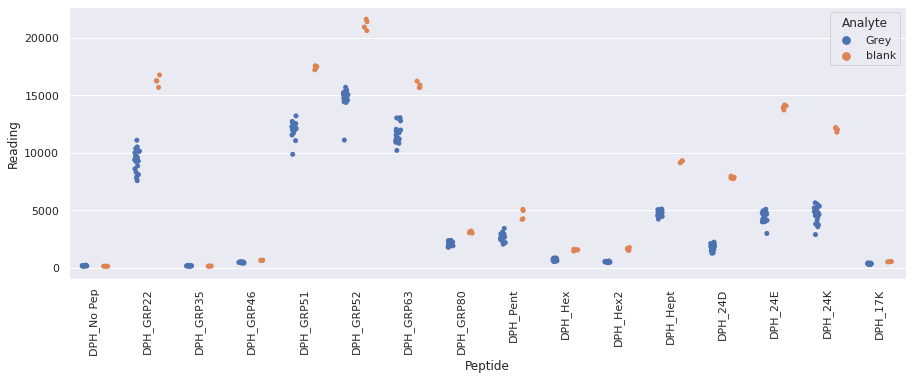

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Grey_DiplomatR6_repeat_5.xlsx
Drawing scatter plot of data spread for Grey_DiplomatR6_repeat_5 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

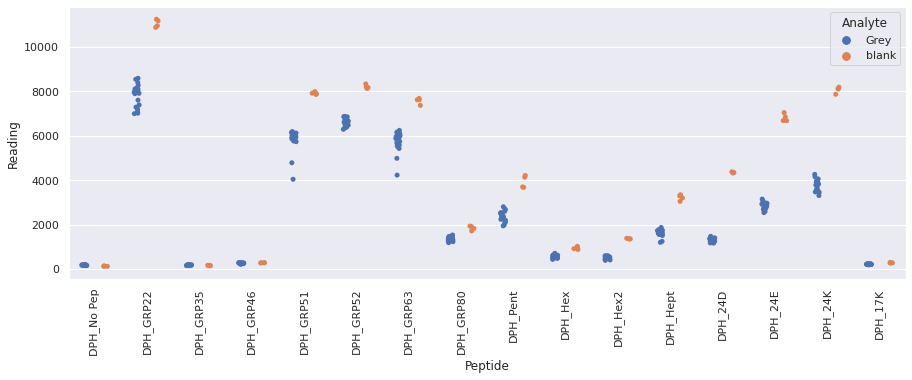

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Black_SainsburysgoldR1_repeat_6.xlsx
Drawing scatter plot of data spread for Black_SainsburysgoldR1_repeat_6 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

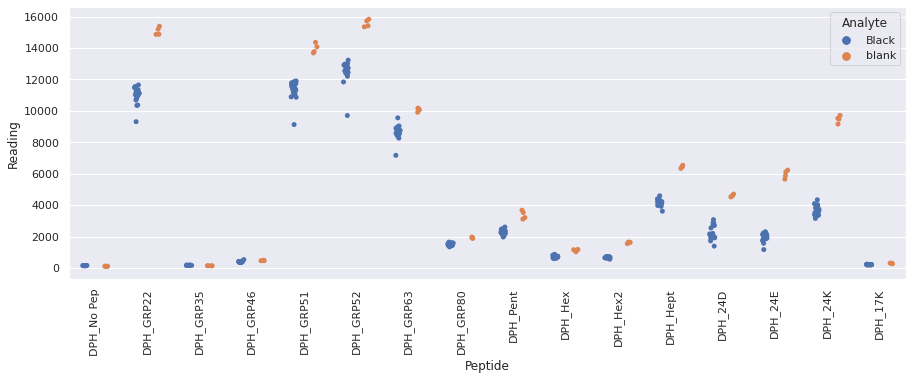

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Black_SainsburysgoldR2_repeat_6.xlsx
Drawing scatter plot of data spread for Black_SainsburysgoldR2_repeat_6 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

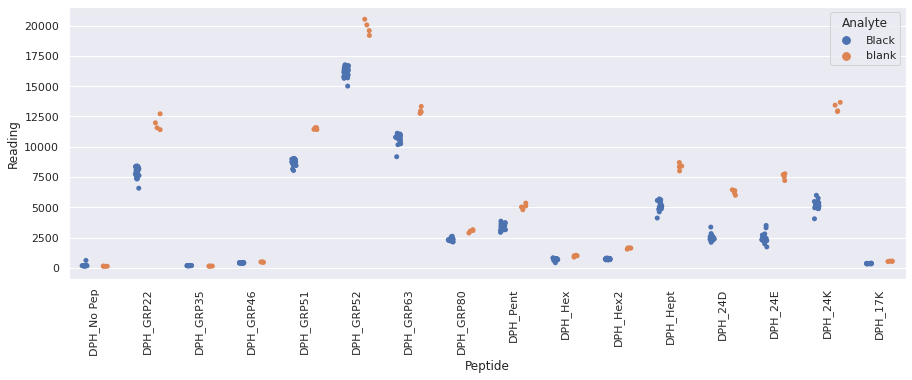

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Black_SainsburysgoldR3_repeat_6.xlsx
Drawing scatter plot of data spread for Black_SainsburysgoldR3_repeat_6 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

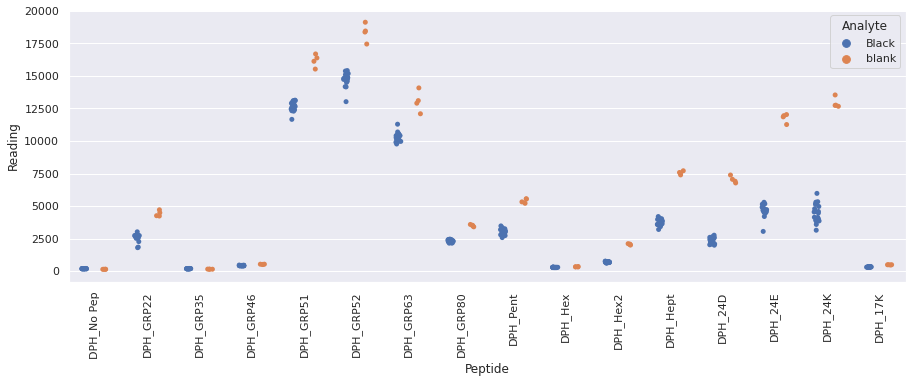

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Black_SainsburysgoldR4_repeat_6.xlsx
Drawing scatter plot of data spread for Black_SainsburysgoldR4_repeat_6 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

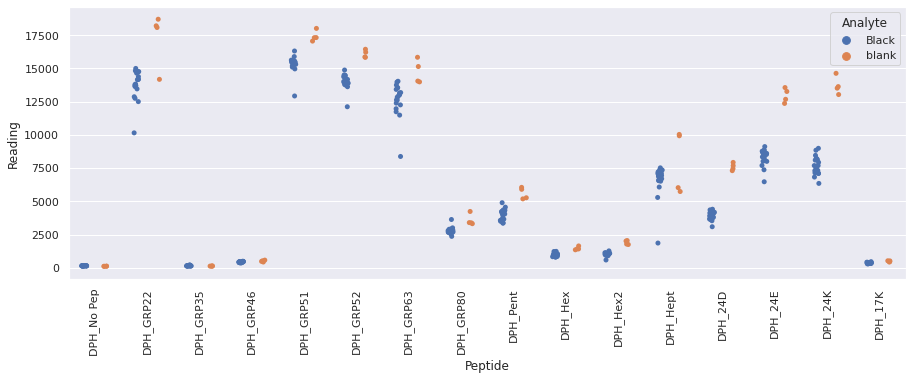

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Black_SainsburysgoldR5_repeat_6.xlsx
Drawing scatter plot of data spread for Black_SainsburysgoldR5_repeat_6 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

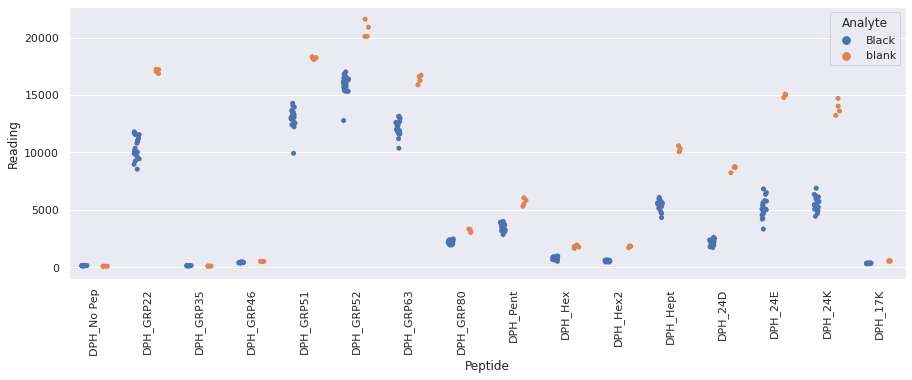

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Black_SainsburysgoldR6_repeat_6.xlsx
Drawing scatter plot of data spread for Black_SainsburysgoldR6_repeat_6 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

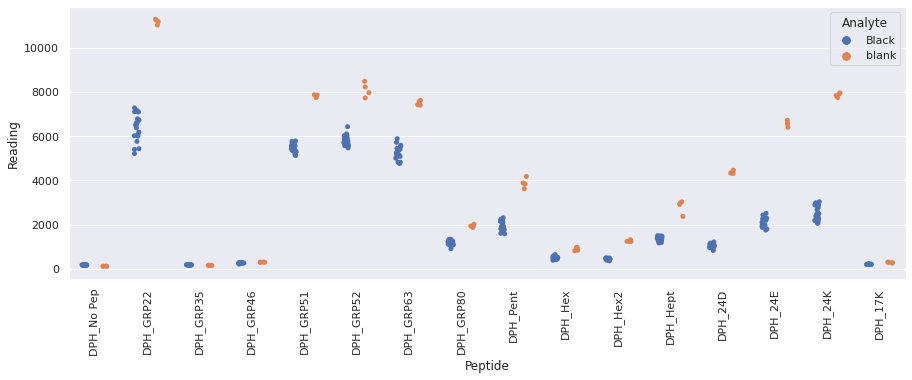

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Green_JoesR1_repeat_6.xlsx
Drawing scatter plot of data spread for Green_JoesR1_repeat_6 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

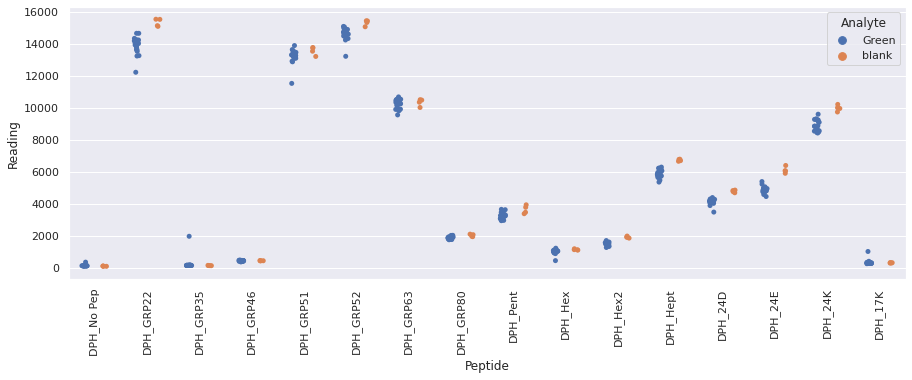

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Green_JoesR2_repeat_6.xlsx
Drawing scatter plot of data spread for Green_JoesR2_repeat_6 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

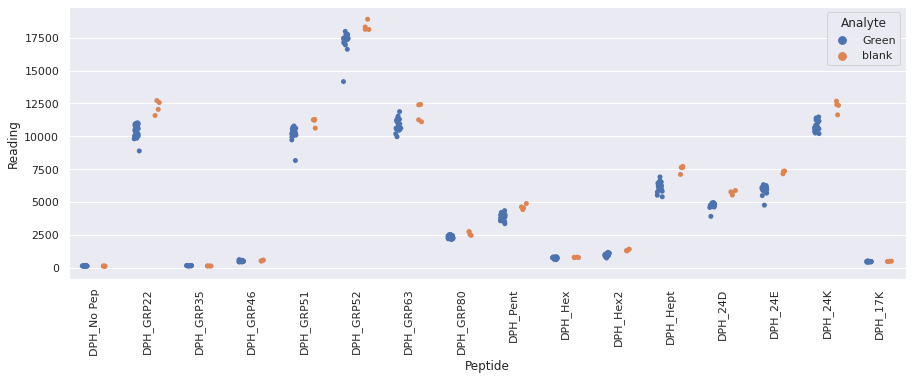

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Green_JoesR3_repeat_6.xlsx
Drawing scatter plot of data spread for Green_JoesR3_repeat_6 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

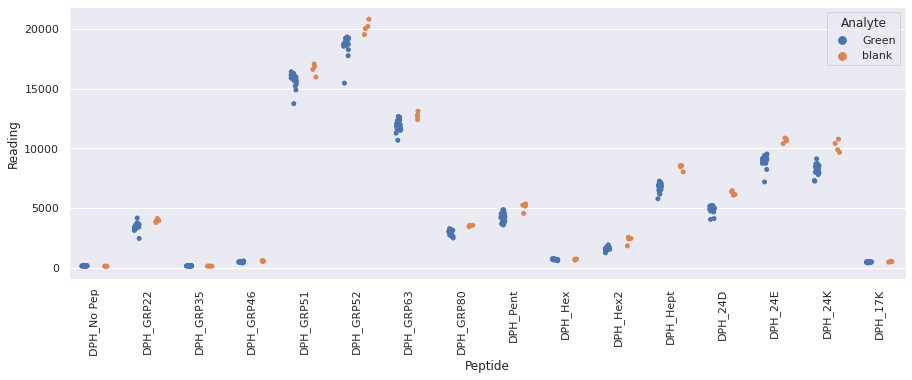

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Green_JoesR4_repeat_6.xlsx
Drawing scatter plot of data spread for Green_JoesR4_repeat_6 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

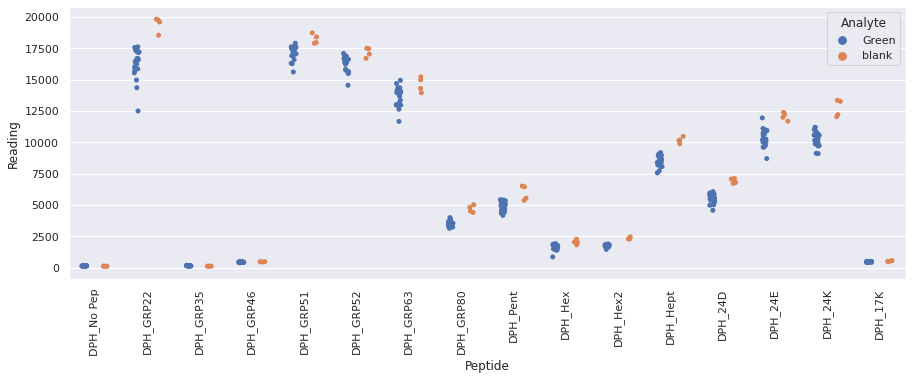

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Green_JoesR5_repeat_6.xlsx
Drawing scatter plot of data spread for Green_JoesR5_repeat_6 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

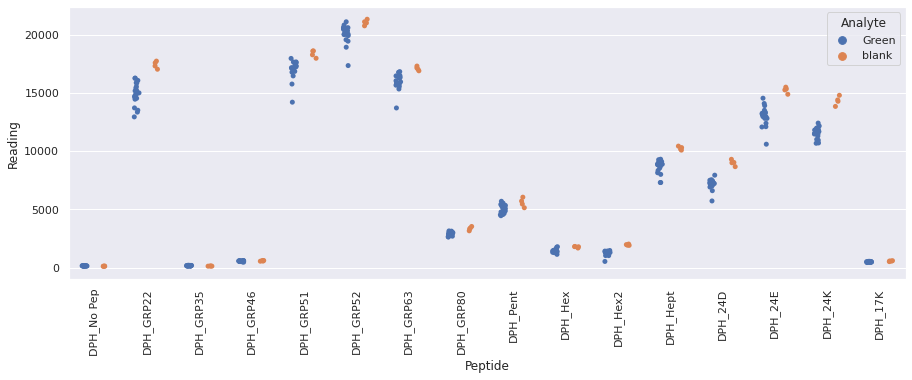

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Green_JoesR6_repeat_6.xlsx
Drawing scatter plot of data spread for Green_JoesR6_repeat_6 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

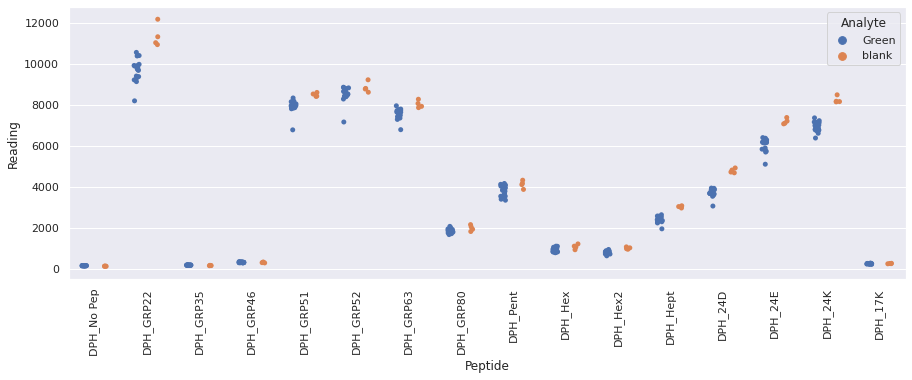

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Grey_JoesR1_repeat_6.xlsx
Drawing scatter plot of data spread for Grey_JoesR1_repeat_6 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

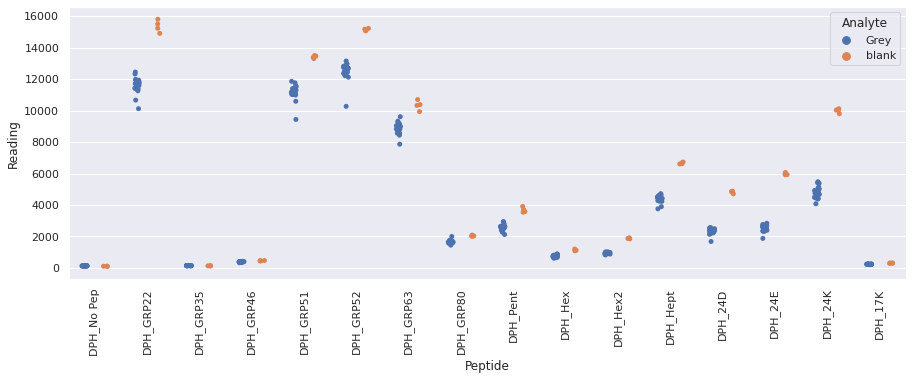

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Grey_JoesR2_repeat_6.xlsx
Drawing scatter plot of data spread for Grey_JoesR2_repeat_6 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

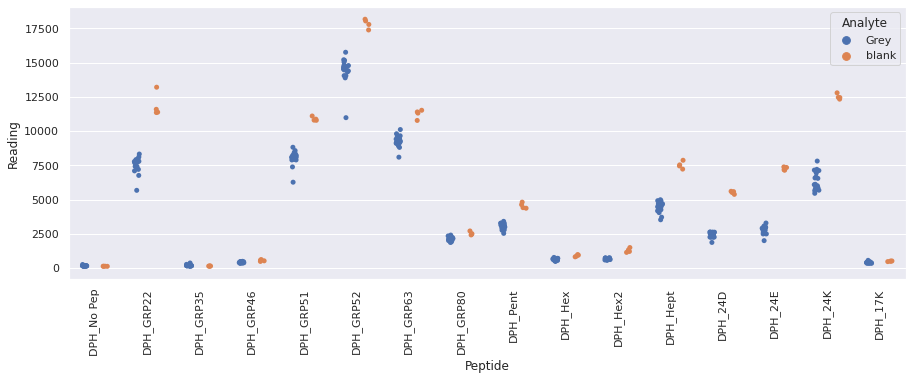

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Grey_JoesR3_repeat_6.xlsx
Drawing scatter plot of data spread for Grey_JoesR3_repeat_6 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

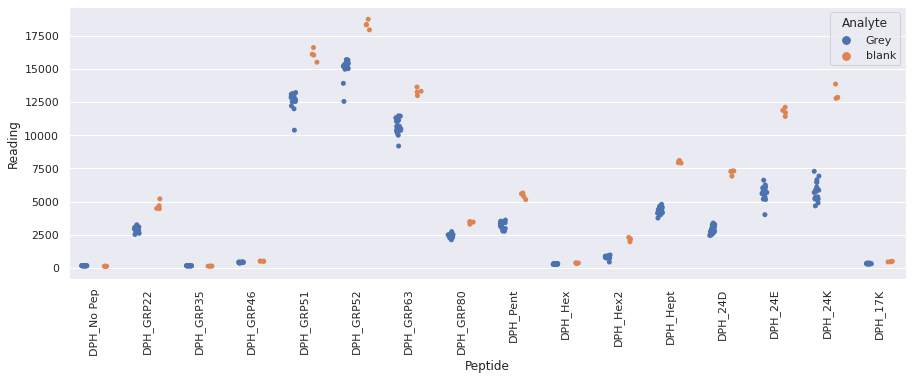

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Grey_JoesR4_repeat_6.xlsx
Drawing scatter plot of data spread for Grey_JoesR4_repeat_6 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

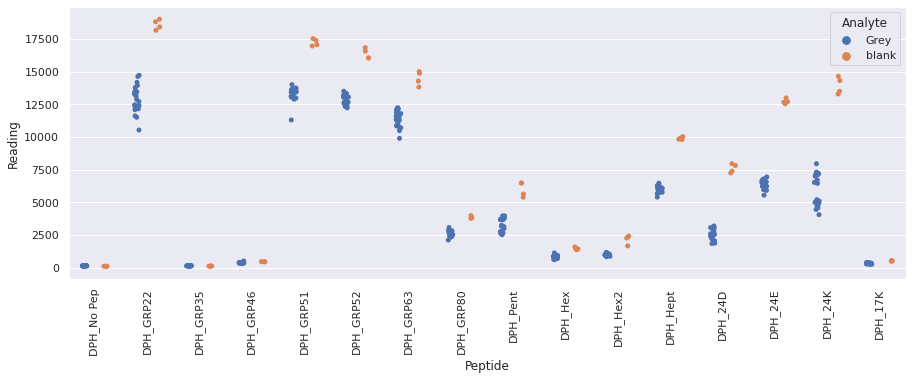

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Grey_JoesR5_repeat_6.xlsx
Drawing scatter plot of data spread for Grey_JoesR5_repeat_6 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

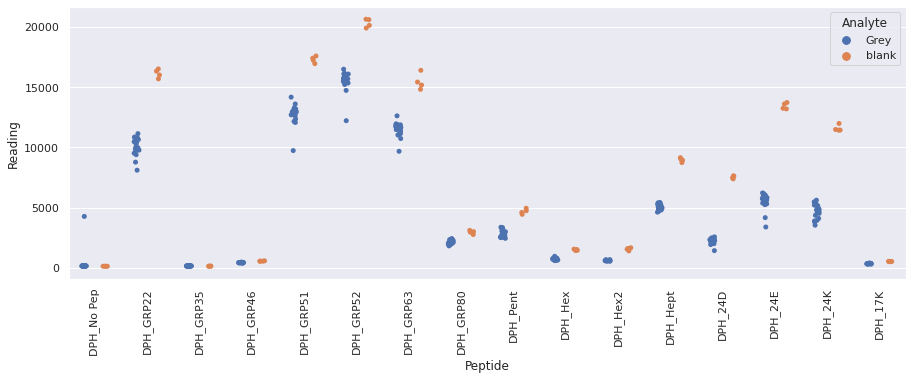

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Grey_JoesR6_repeat_6.xlsx
Drawing scatter plot of data spread for Grey_JoesR6_repeat_6 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

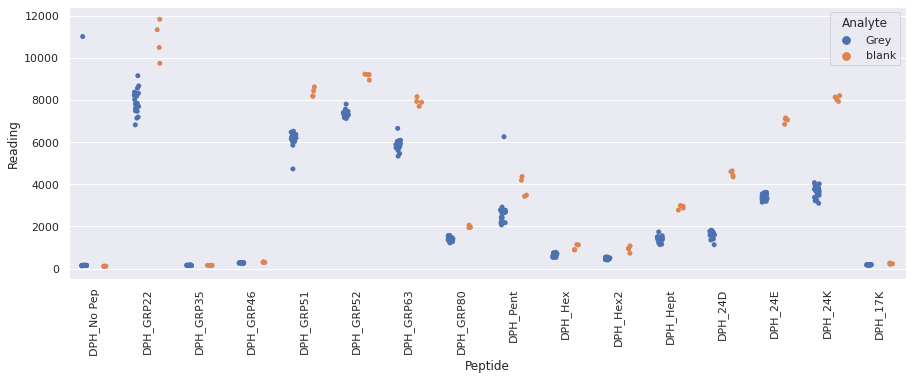

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Black_TescoR1_repeat_7.xlsx
Drawing scatter plot of data spread for Black_TescoR1_repeat_7 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

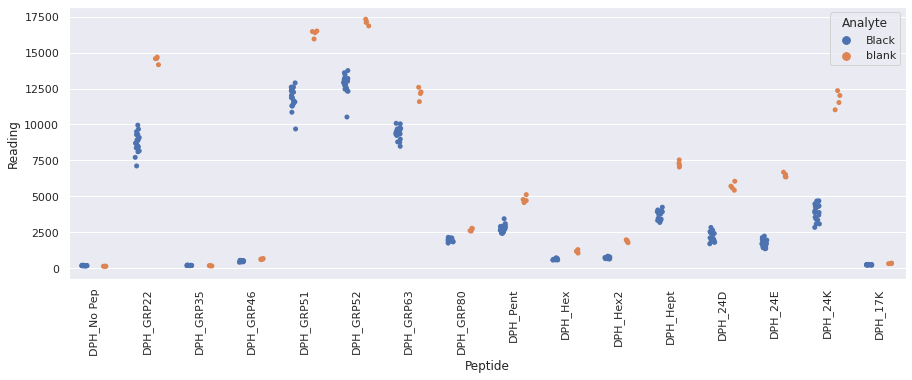

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Black_TescoR2_repeat_7.xlsx
Drawing scatter plot of data spread for Black_TescoR2_repeat_7 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

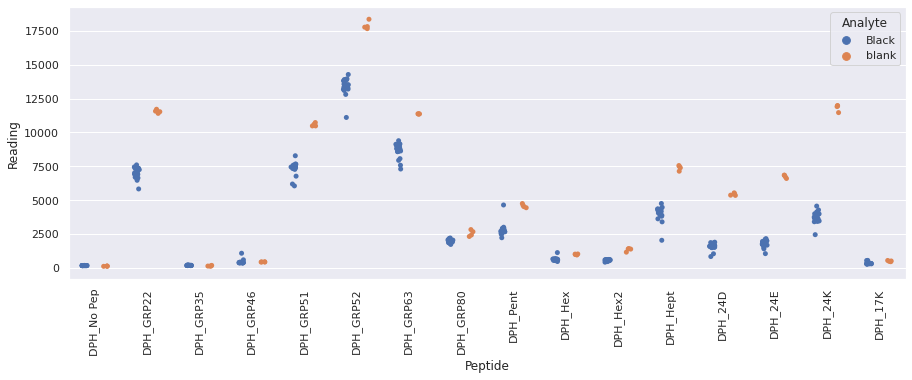

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Black_TescoR3_repeat_7.xlsx
Drawing scatter plot of data spread for Black_TescoR3_repeat_7 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

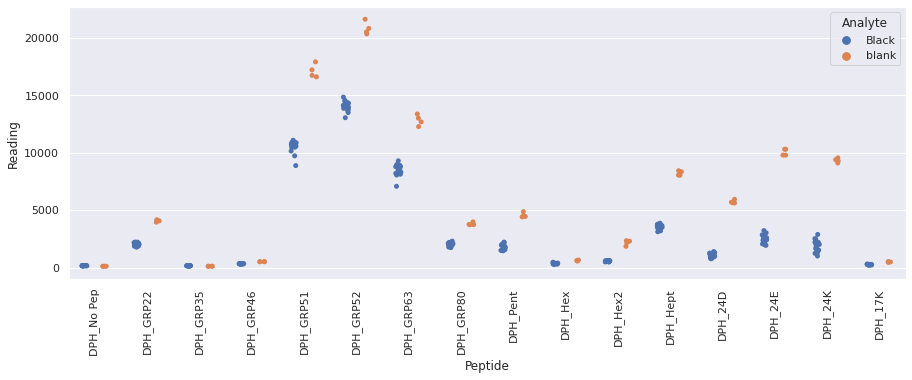

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Black_TescoR4_repeat_7.xlsx
Drawing scatter plot of data spread for Black_TescoR4_repeat_7 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

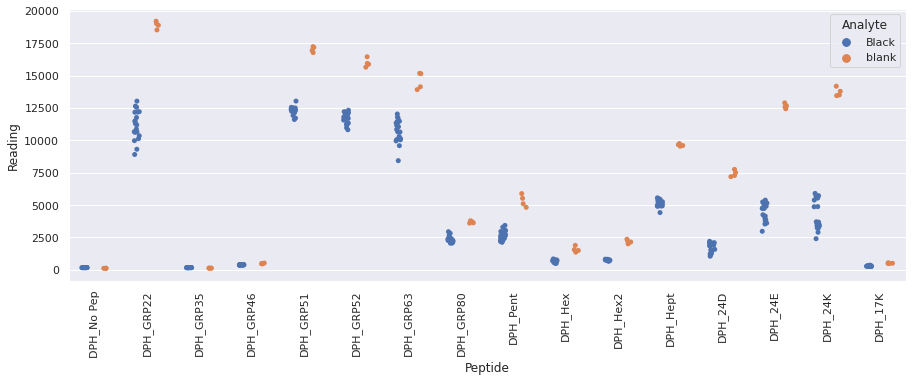

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Black_TescoR5_repeat_7.xlsx
Drawing scatter plot of data spread for Black_TescoR5_repeat_7 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

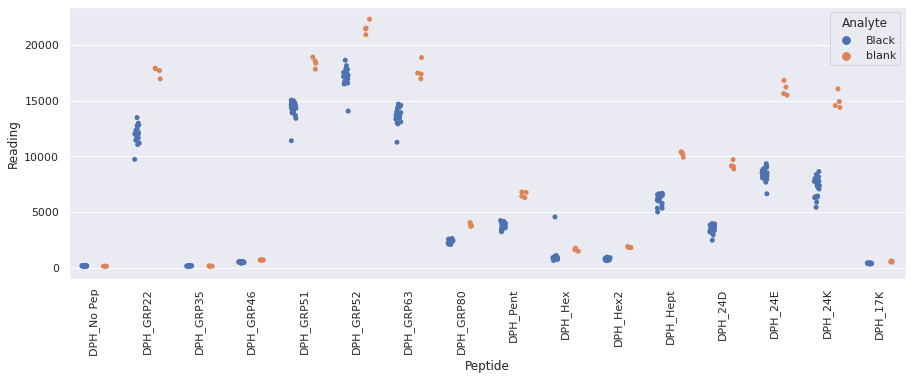

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Black_TescoR6_repeat_7.xlsx
Drawing scatter plot of data spread for Black_TescoR6_repeat_7 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

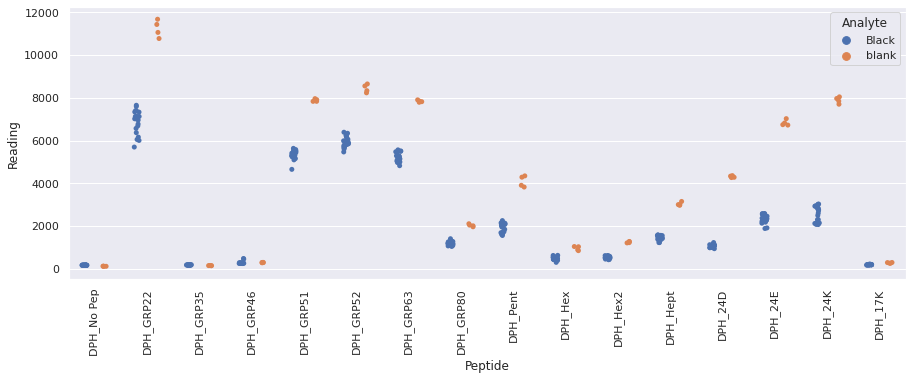

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Green_QiR1_repeat_7.xlsx
Drawing scatter plot of data spread for Green_QiR1_repeat_7 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

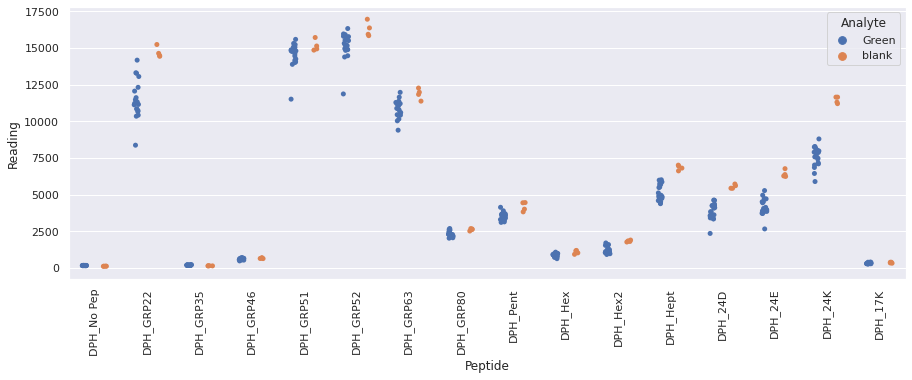

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Green_QiR2_repeat_7.xlsx
Drawing scatter plot of data spread for Green_QiR2_repeat_7 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

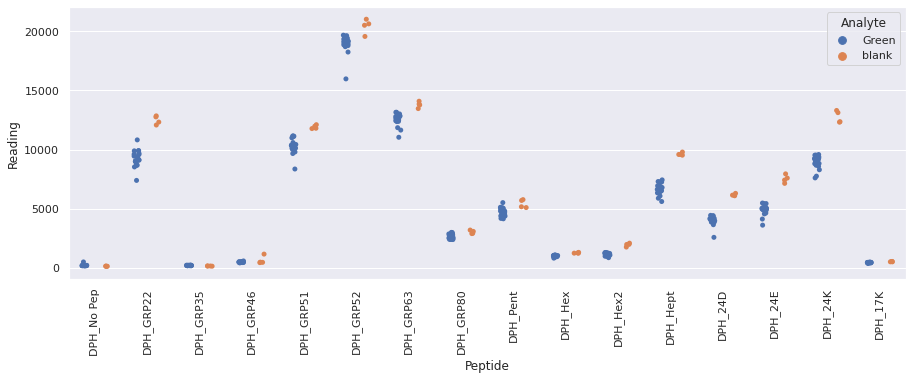

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Green_QiR3_repeat_7.xlsx
Drawing scatter plot of data spread for Green_QiR3_repeat_7 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

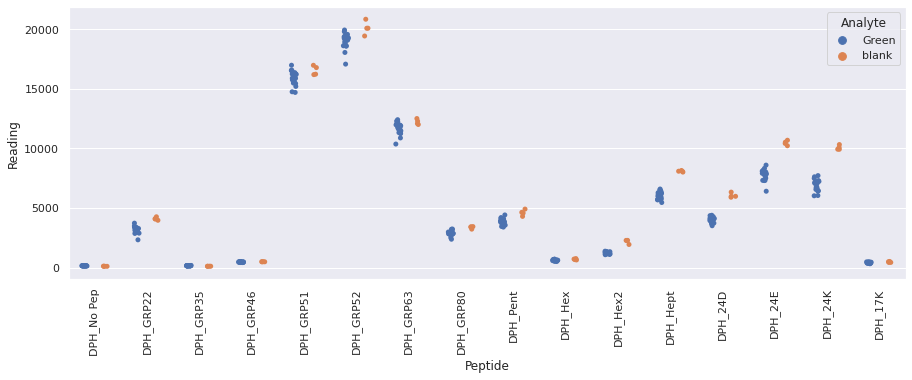

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Green_QiR4_repeat_7.xlsx
Drawing scatter plot of data spread for Green_QiR4_repeat_7 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

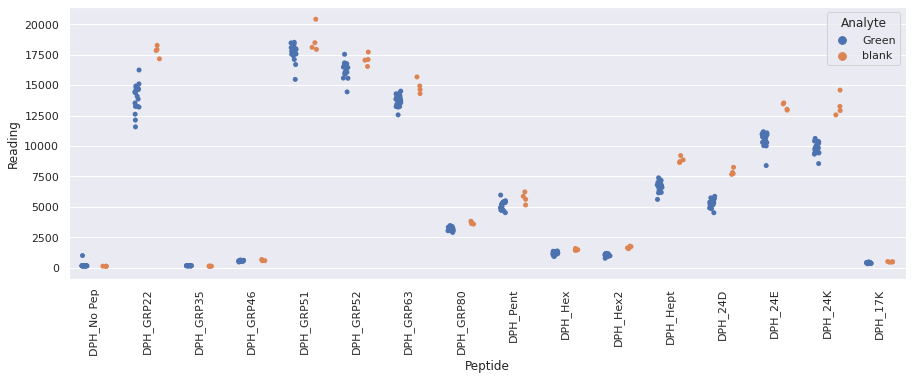

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Green_QiR5_repeat_7.xlsx
Drawing scatter plot of data spread for Green_QiR5_repeat_7 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

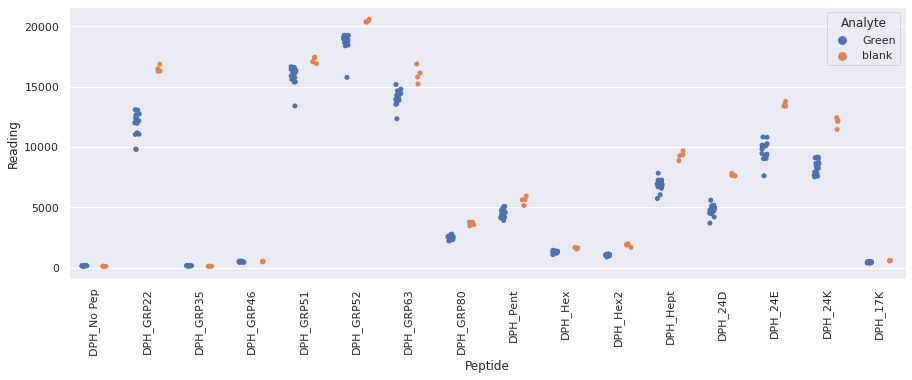

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Green_QiR6_repeat_7.xlsx
Drawing scatter plot of data spread for Green_QiR6_repeat_7 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

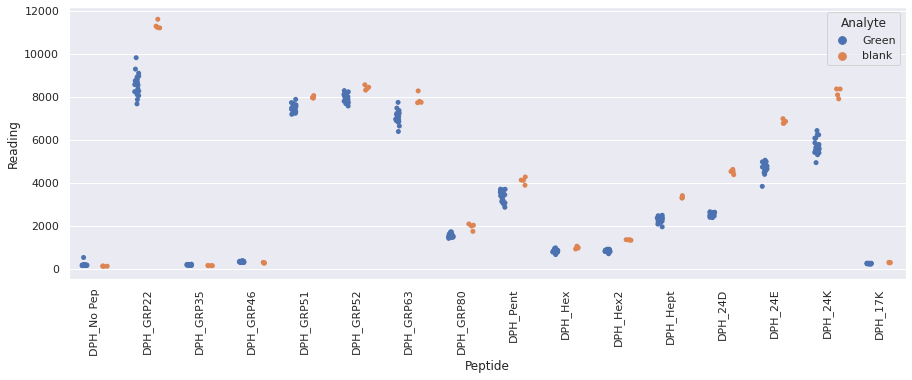

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Grey_MandsR1_repeat_7.xlsx
Drawing scatter plot of data spread for Grey_MandsR1_repeat_7 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

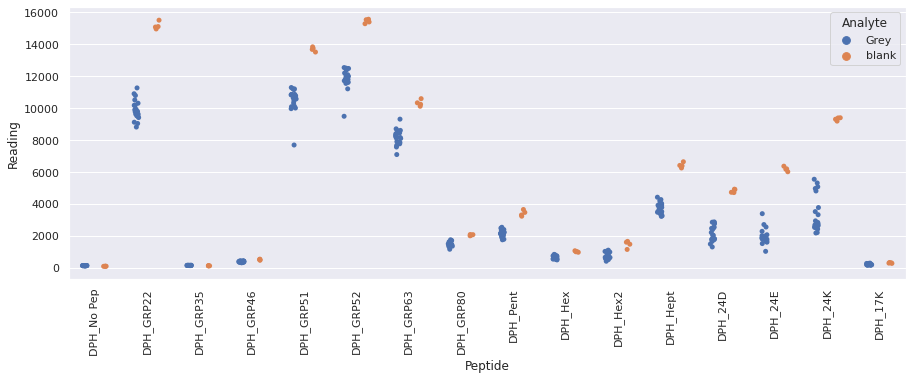

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Grey_MandsR2_repeat_7.xlsx
Drawing scatter plot of data spread for Grey_MandsR2_repeat_7 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

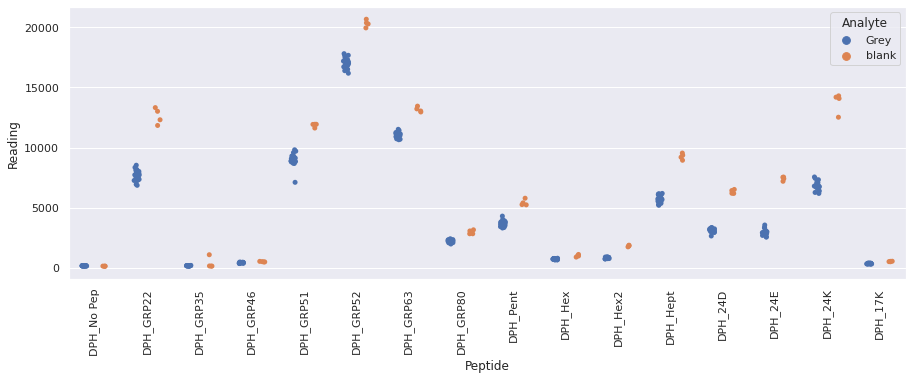

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Grey_MandsR3_repeat_7.xlsx
Drawing scatter plot of data spread for Grey_MandsR3_repeat_7 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

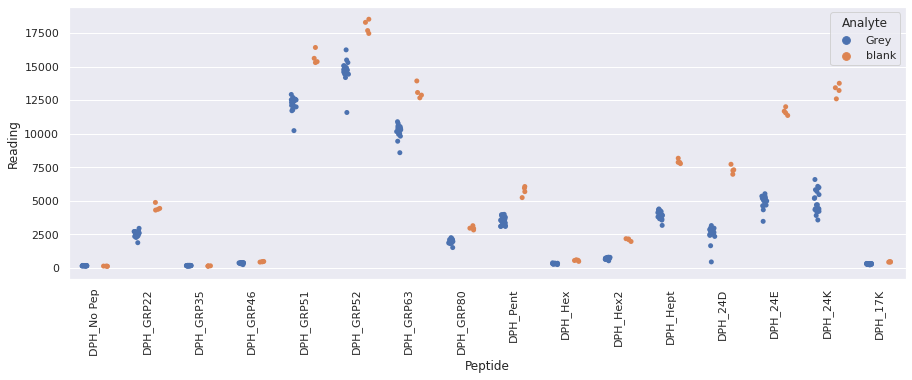

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Grey_MandsR4_repeat_7.xlsx
Drawing scatter plot of data spread for Grey_MandsR4_repeat_7 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

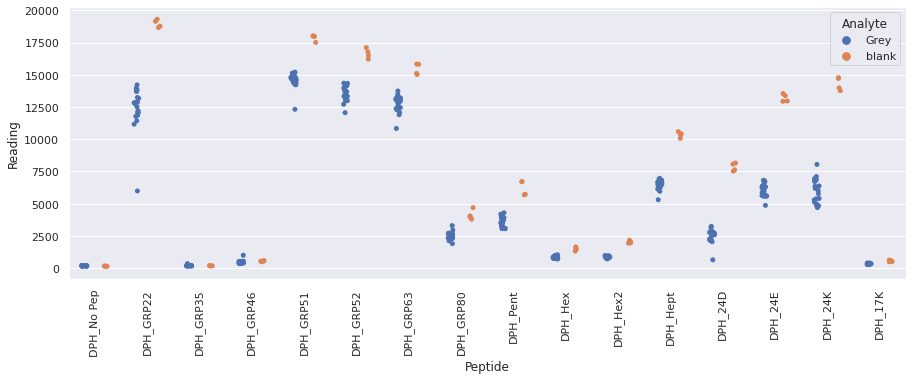

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Grey_MandsR5_repeat_7.xlsx
Drawing scatter plot of data spread for Grey_MandsR5_repeat_7 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

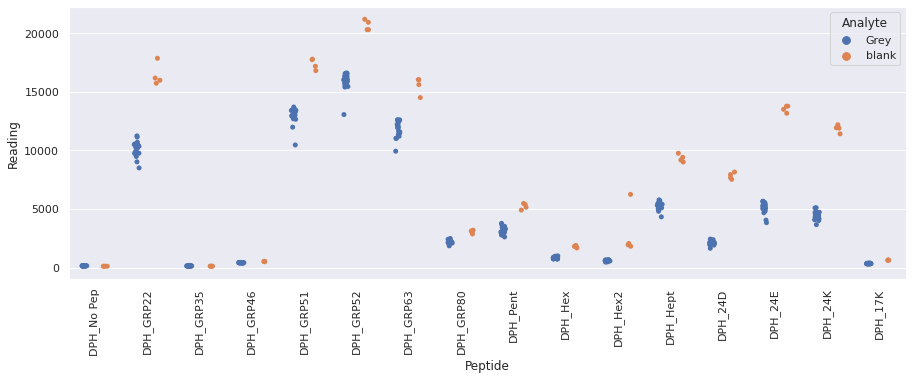

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Grey_MandsR6_repeat_7.xlsx
Drawing scatter plot of data spread for Grey_MandsR6_repeat_7 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

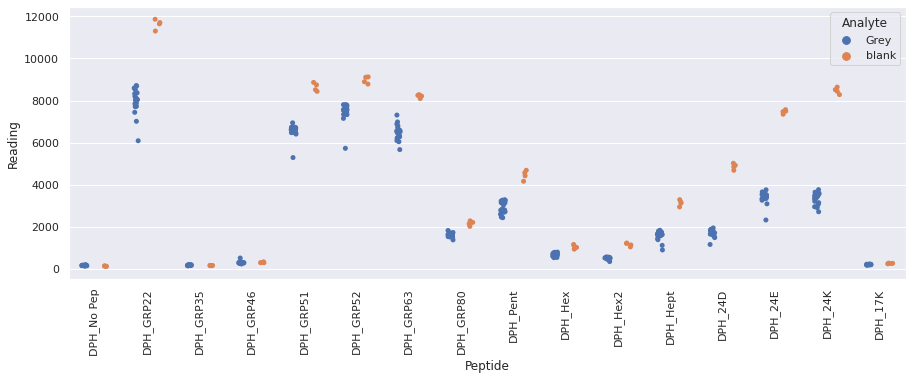

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Black_TetleyR1_repeat_8.xlsx
Drawing scatter plot of data spread for Black_TetleyR1_repeat_8 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

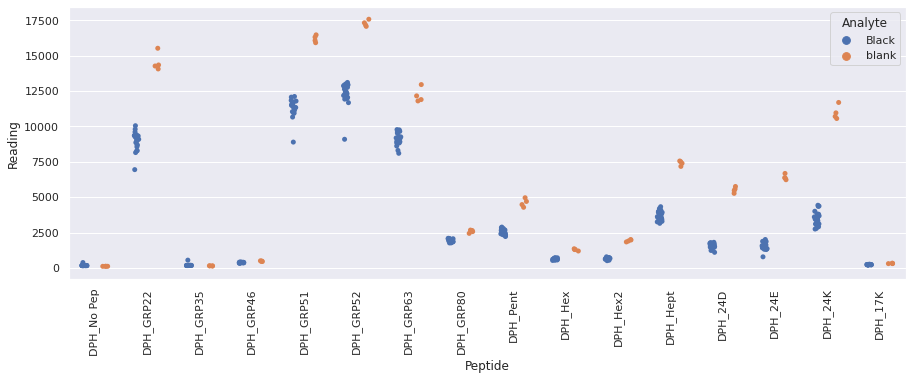

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Black_TetleyR2_repeat_8.xlsx
Drawing scatter plot of data spread for Black_TetleyR2_repeat_8 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

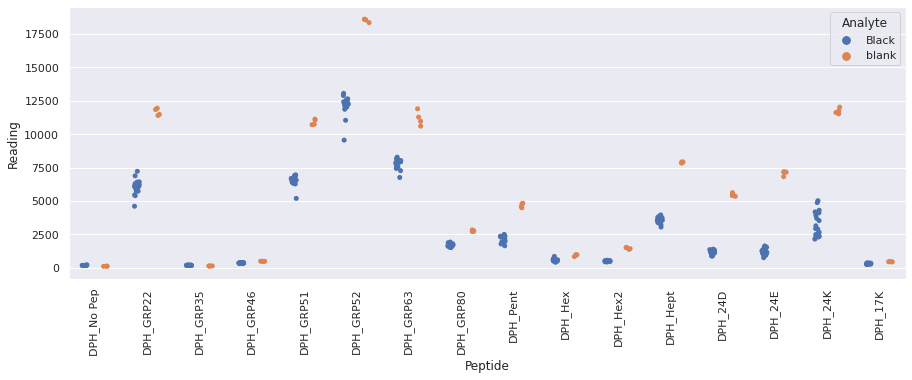

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Black_TetleyR3_repeat_8.xlsx
Drawing scatter plot of data spread for Black_TetleyR3_repeat_8 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

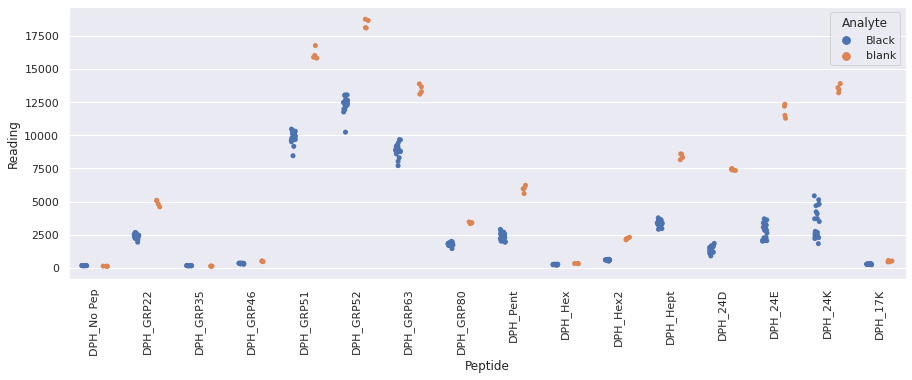

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Black_TetleyR4_repeat_8.xlsx
Drawing scatter plot of data spread for Black_TetleyR4_repeat_8 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

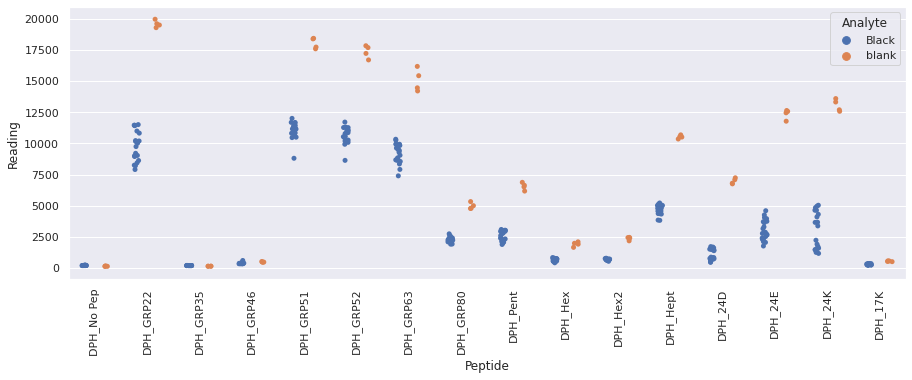

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Black_TetleyR5_repeat_8.xlsx
Drawing scatter plot of data spread for Black_TetleyR5_repeat_8 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

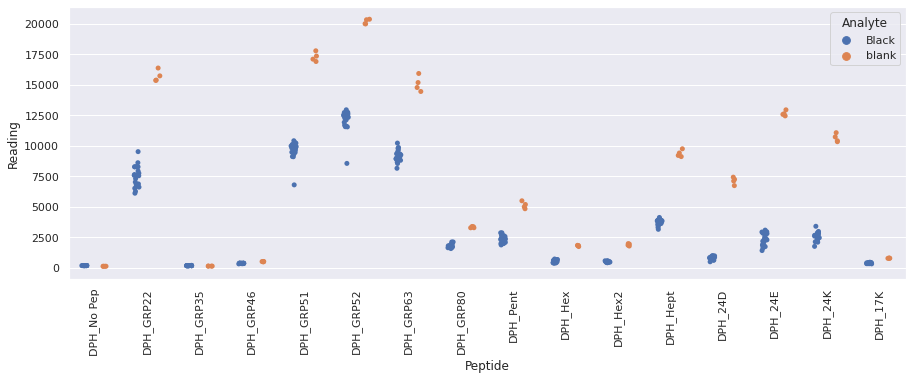

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Black_TetleyR6_repeat_8.xlsx
Drawing scatter plot of data spread for Black_TetleyR6_repeat_8 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

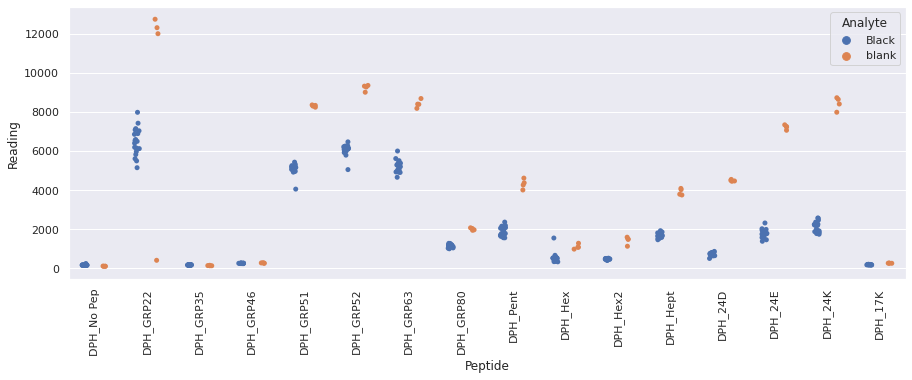

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Green_SainsburysR1_repeat_8.xlsx
Drawing scatter plot of data spread for Green_SainsburysR1_repeat_8 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

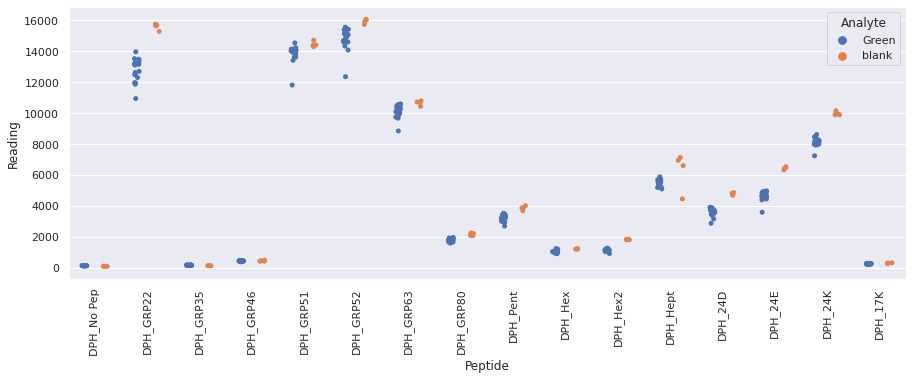

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Green_SainsburysR2_repeat_8.xlsx
Drawing scatter plot of data spread for Green_SainsburysR2_repeat_8 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

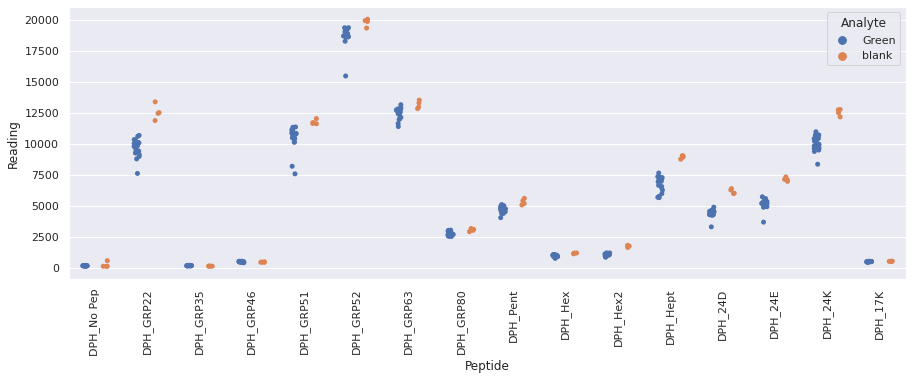

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Green_SainsburysR3_repeat_8.xlsx
Drawing scatter plot of data spread for Green_SainsburysR3_repeat_8 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

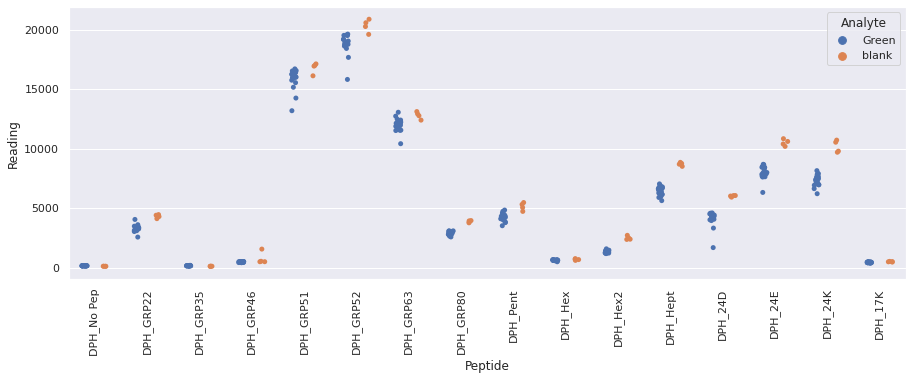

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Green_SainsburysR4_repeat_8.xlsx
Drawing scatter plot of data spread for Green_SainsburysR4_repeat_8 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

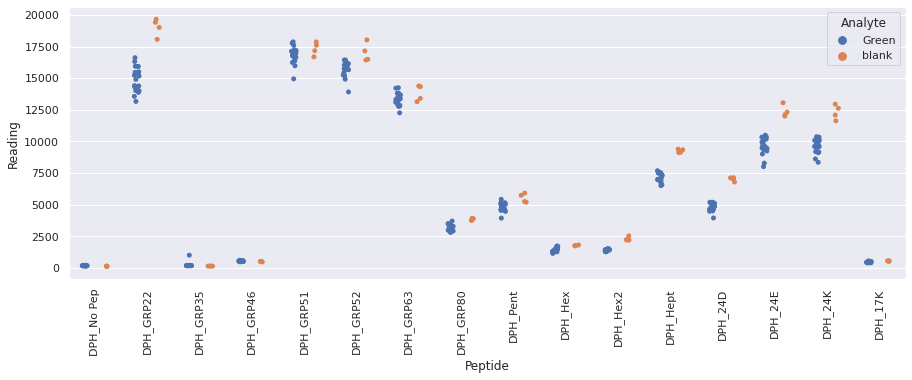

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Green_SainsburysR5_repeat_8.xlsx
Drawing scatter plot of data spread for Green_SainsburysR5_repeat_8 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

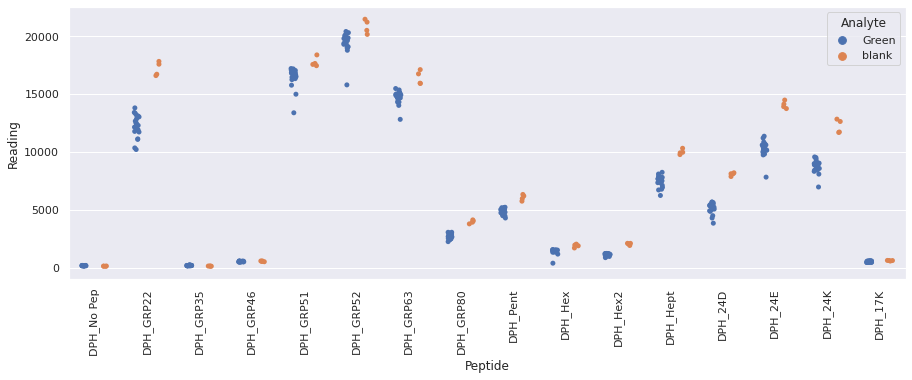

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Green_SainsburysR6_repeat_8.xlsx
Drawing scatter plot of data spread for Green_SainsburysR6_repeat_8 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

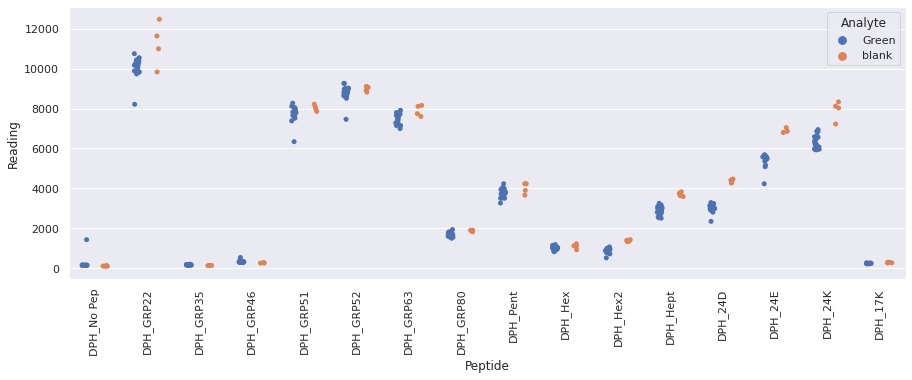

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Grey_PukkaR1_repeat_8.xlsx
Drawing scatter plot of data spread for Grey_PukkaR1_repeat_8 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

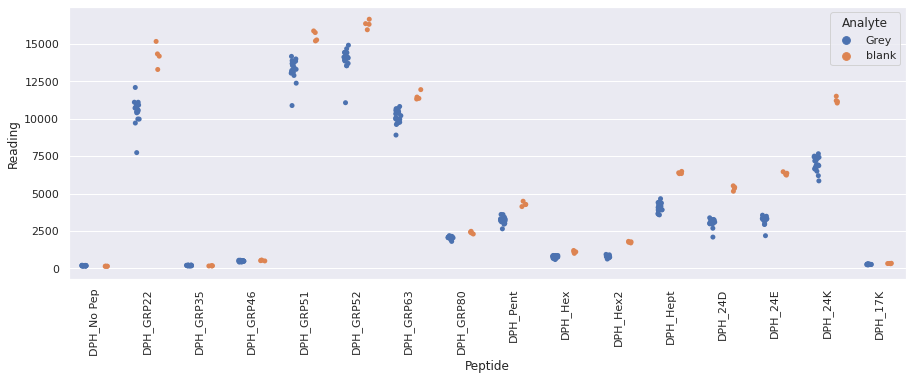

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Grey_PukkaR2_repeat_8.xlsx
Drawing scatter plot of data spread for Grey_PukkaR2_repeat_8 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

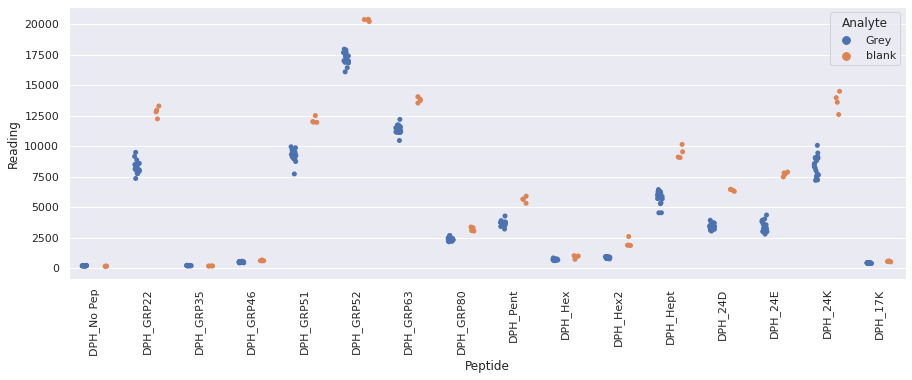

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Grey_PukkaR3_repeat_8.xlsx
Drawing scatter plot of data spread for Grey_PukkaR3_repeat_8 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

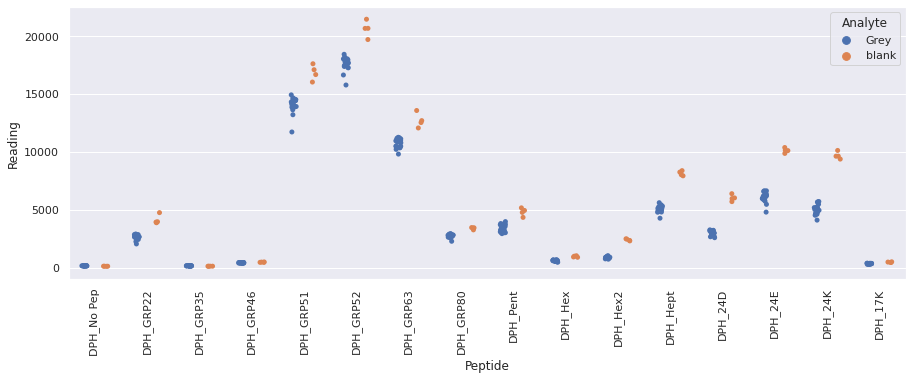

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Grey_PukkaR4_repeat_8.xlsx
Drawing scatter plot of data spread for Grey_PukkaR4_repeat_8 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

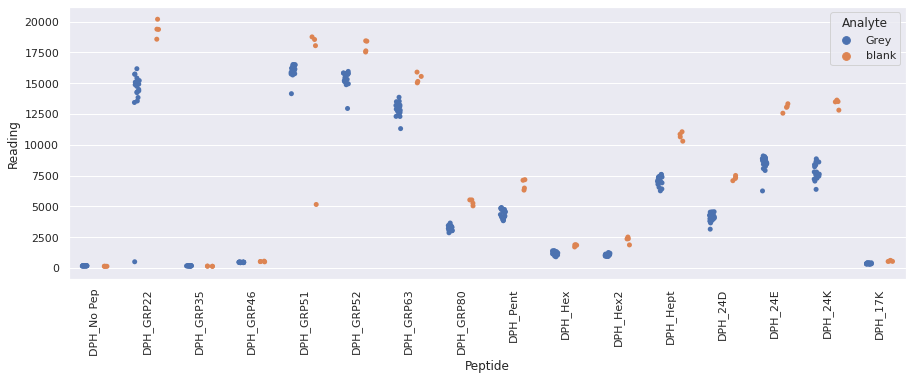

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Grey_PukkaR5_repeat_8.xlsx
Drawing scatter plot of data spread for Grey_PukkaR5_repeat_8 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

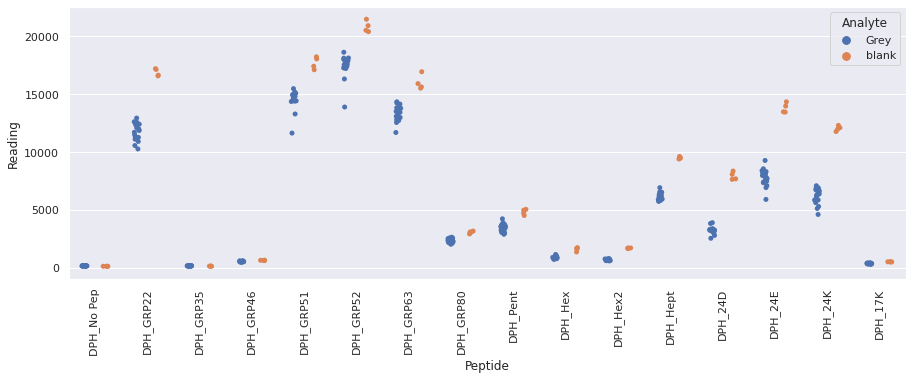

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Grey_PukkaR6_repeat_8.xlsx
Drawing scatter plot of data spread for Grey_PukkaR6_repeat_8 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

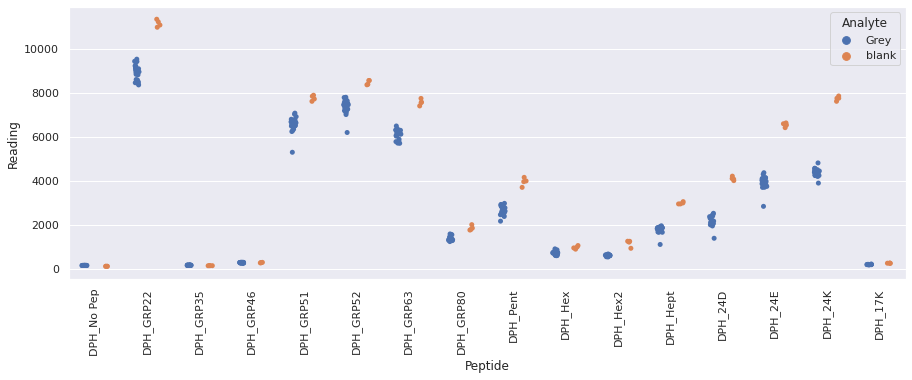

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Black_TwiningsR1_repeat_9.xlsx
Drawing scatter plot of data spread for Black_TwiningsR1_repeat_9 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

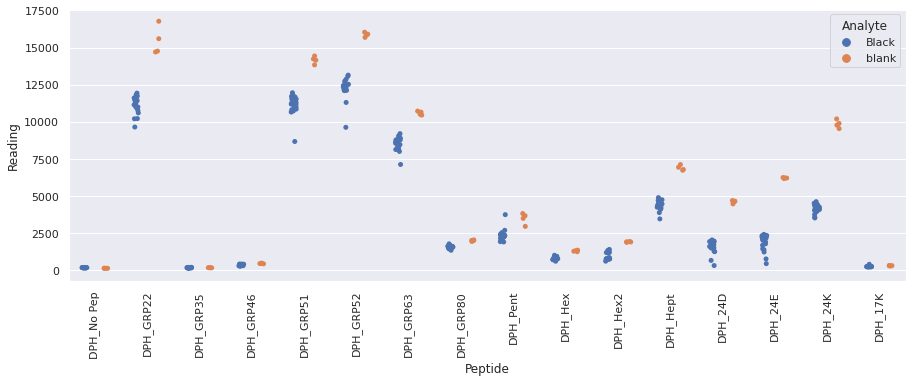

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Black_TwiningsR2_repeat_9.xlsx
Drawing scatter plot of data spread for Black_TwiningsR2_repeat_9 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

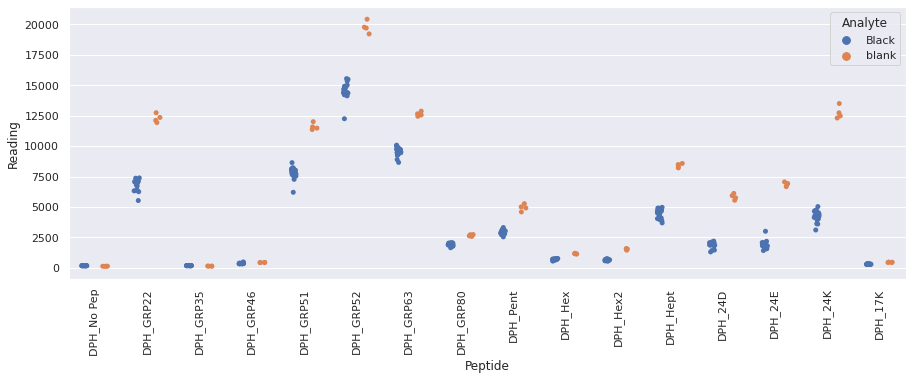

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Black_TwiningsR3_repeat_9.xlsx
Drawing scatter plot of data spread for Black_TwiningsR3_repeat_9 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

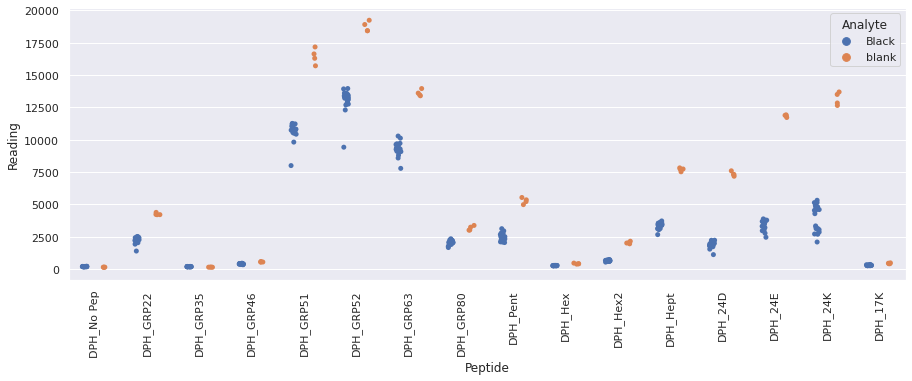

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Black_TwiningsR4_repeat_9.xlsx
Drawing scatter plot of data spread for Black_TwiningsR4_repeat_9 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

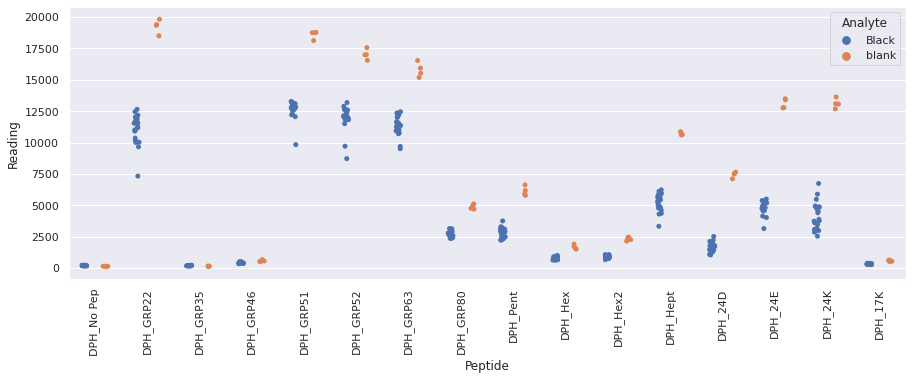

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Black_TwiningsR5_repeat_9.xlsx
Drawing scatter plot of data spread for Black_TwiningsR5_repeat_9 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

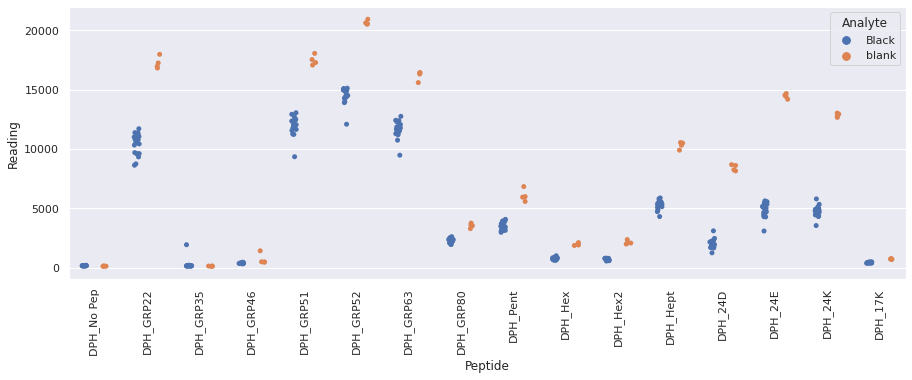

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Black_TwiningsR6_repeat_9.xlsx
Drawing scatter plot of data spread for Black_TwiningsR6_repeat_9 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

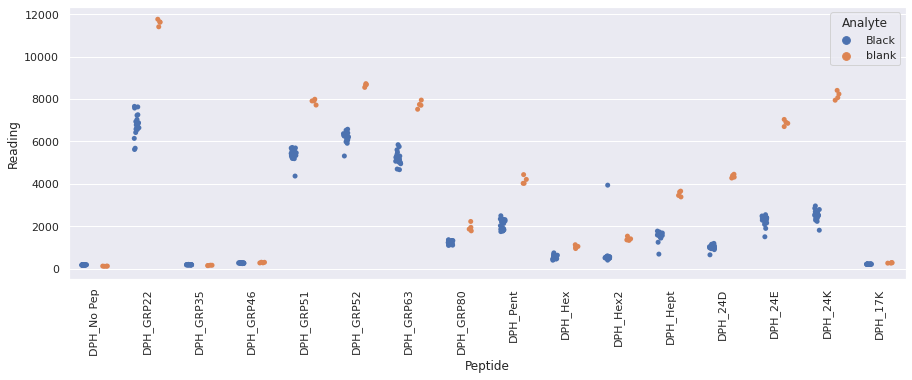

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Green_TetleyR1_repeat_9.xlsx
Drawing scatter plot of data spread for Green_TetleyR1_repeat_9 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

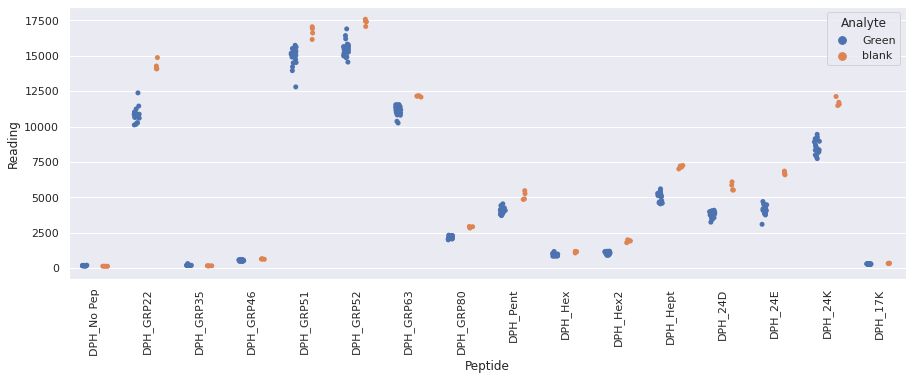

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Green_TetleyR2_repeat_9.xlsx
Drawing scatter plot of data spread for Green_TetleyR2_repeat_9 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

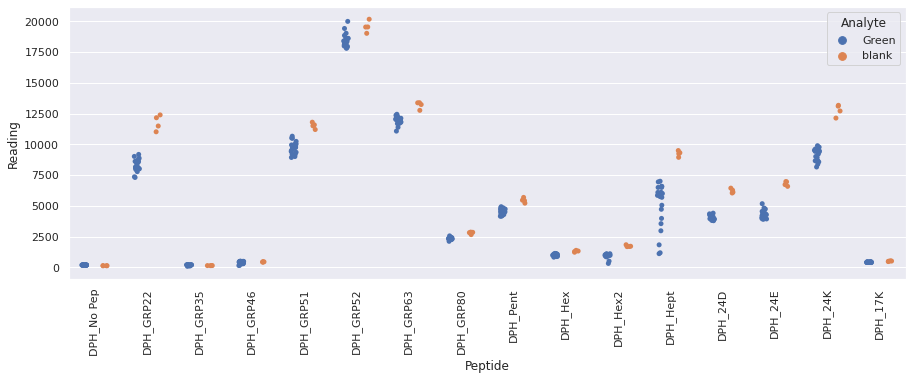

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Green_TetleyR3_repeat_9.xlsx
Drawing scatter plot of data spread for Green_TetleyR3_repeat_9 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

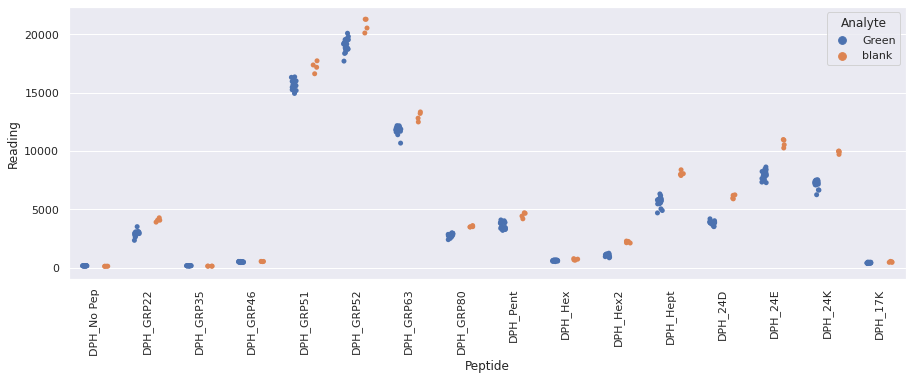

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Green_TetleyR4_repeat_9.xlsx
Drawing scatter plot of data spread for Green_TetleyR4_repeat_9 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

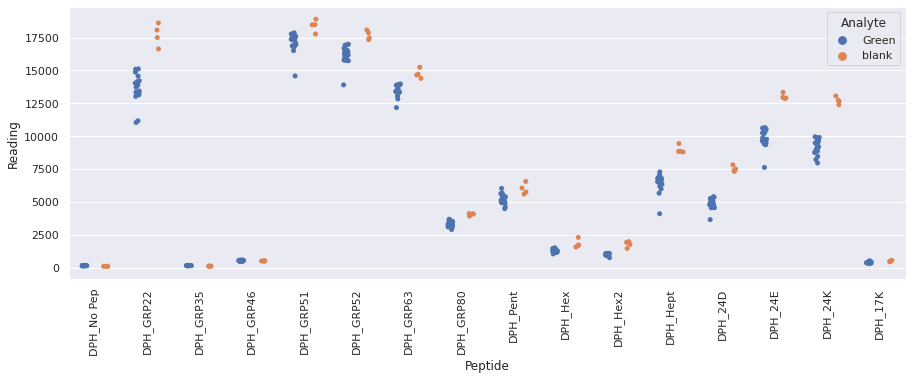

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Green_TetleyR5_repeat_9.xlsx
Drawing scatter plot of data spread for Green_TetleyR5_repeat_9 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

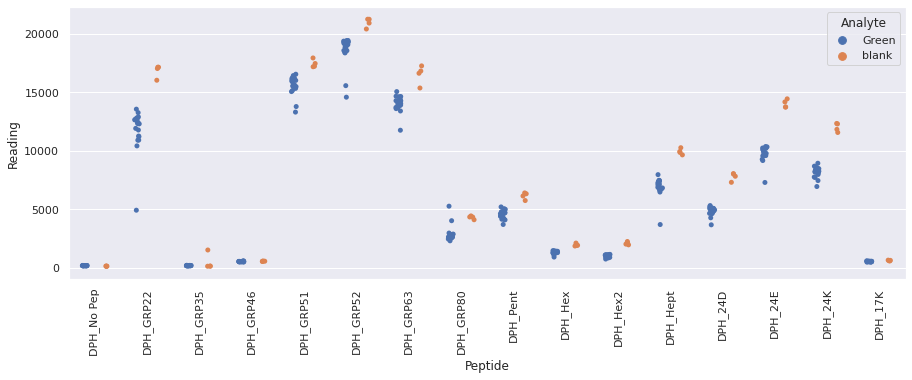

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Green_TetleyR6_repeat_9.xlsx
Drawing scatter plot of data spread for Green_TetleyR6_repeat_9 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

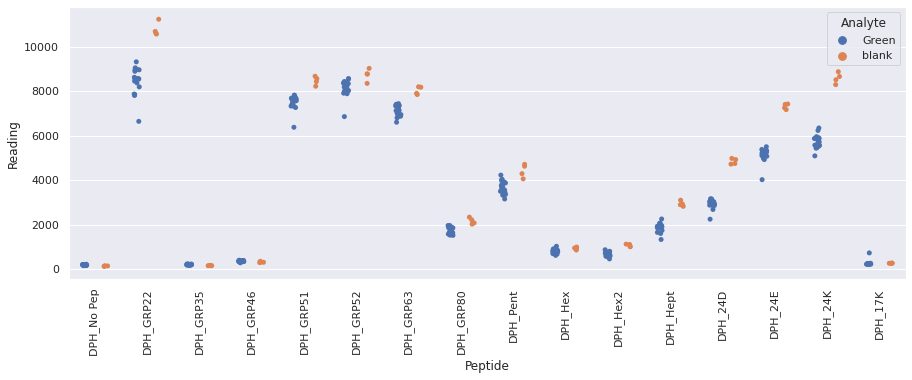

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Grey_TescoR1_repeat_9.xlsx
Drawing scatter plot of data spread for Grey_TescoR1_repeat_9 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

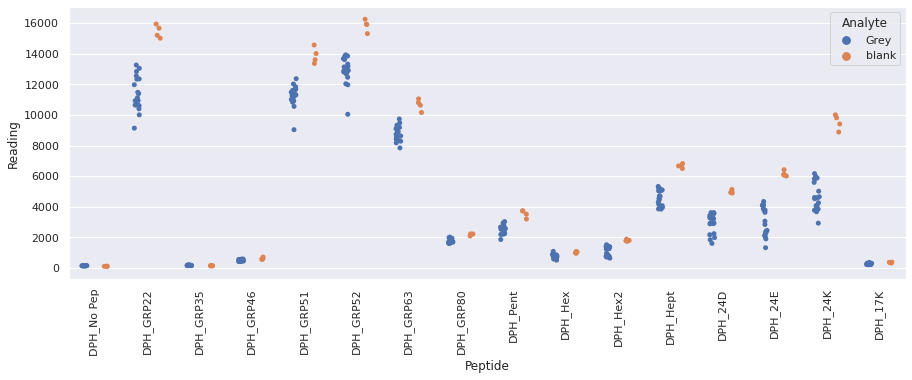

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Grey_TescoR2_repeat_9.xlsx
Drawing scatter plot of data spread for Grey_TescoR2_repeat_9 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

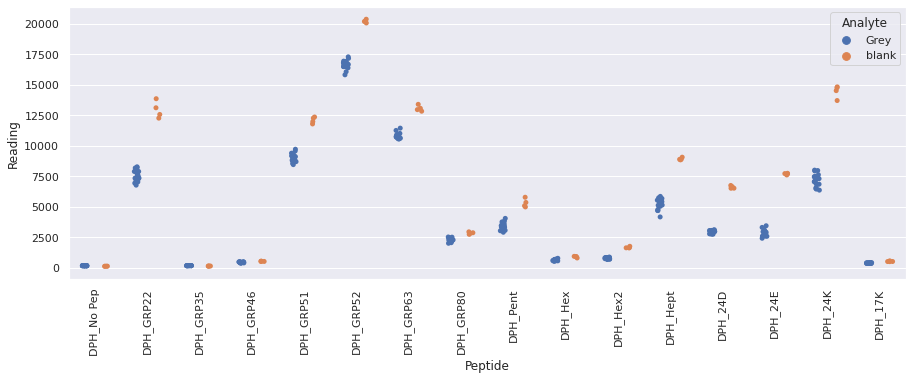

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Grey_TescoR3_repeat_9.xlsx
Drawing scatter plot of data spread for Grey_TescoR3_repeat_9 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

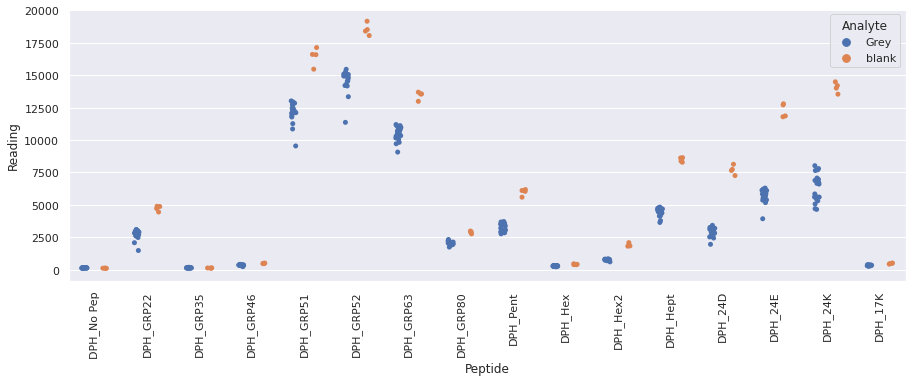

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Grey_TescoR4_repeat_9.xlsx
Drawing scatter plot of data spread for Grey_TescoR4_repeat_9 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

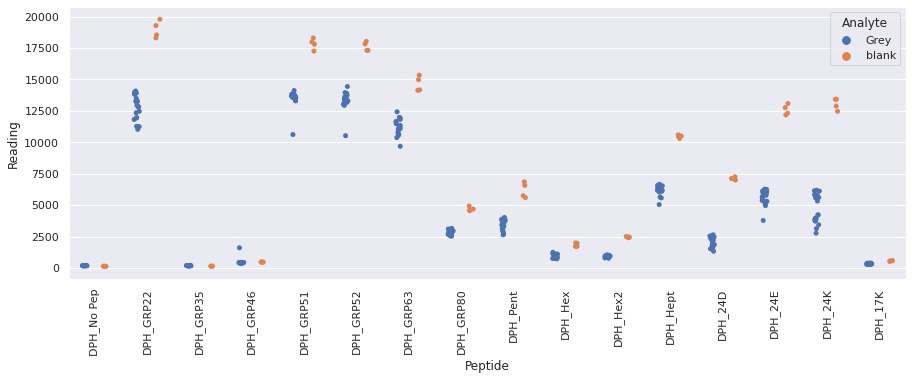

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Grey_TescoR5_repeat_9.xlsx
Drawing scatter plot of data spread for Grey_TescoR5_repeat_9 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

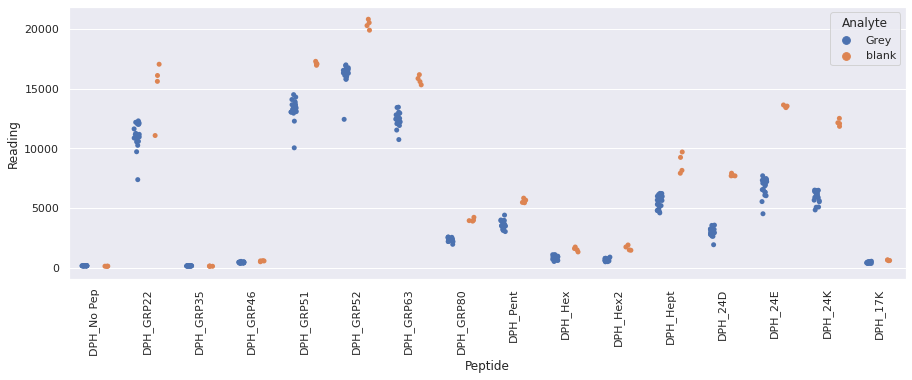

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Grey_TescoR6_repeat_9.xlsx
Drawing scatter plot of data spread for Grey_TescoR6_repeat_9 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

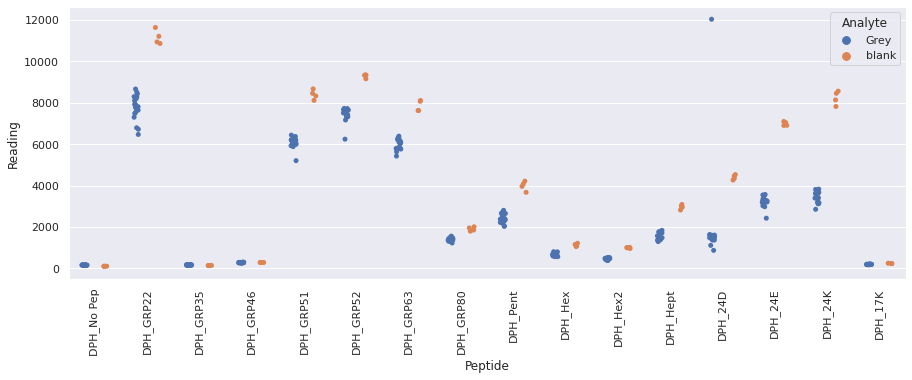

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Black_YorkshireR1_repeat_10.xlsx
Drawing scatter plot of data spread for Black_YorkshireR1_repeat_10 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

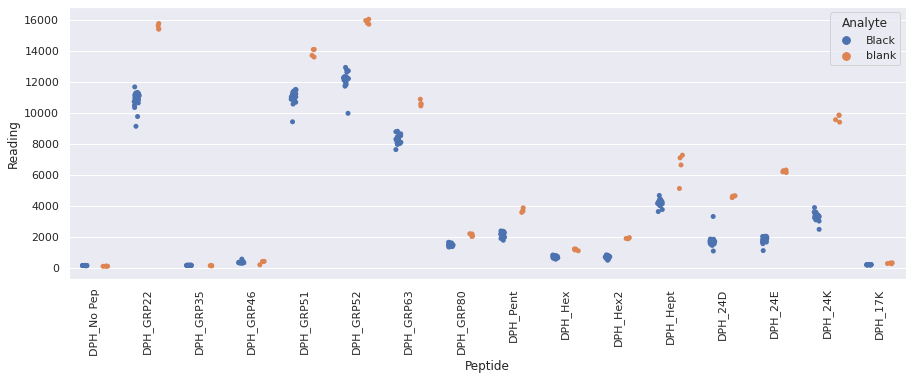

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Black_YorkshireR2_repeat_10.xlsx
Drawing scatter plot of data spread for Black_YorkshireR2_repeat_10 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

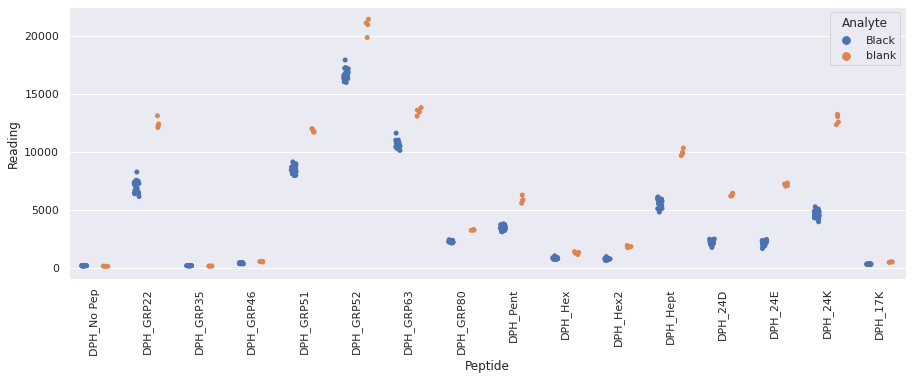

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Black_YorkshireR3_repeat_10.xlsx
Drawing scatter plot of data spread for Black_YorkshireR3_repeat_10 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

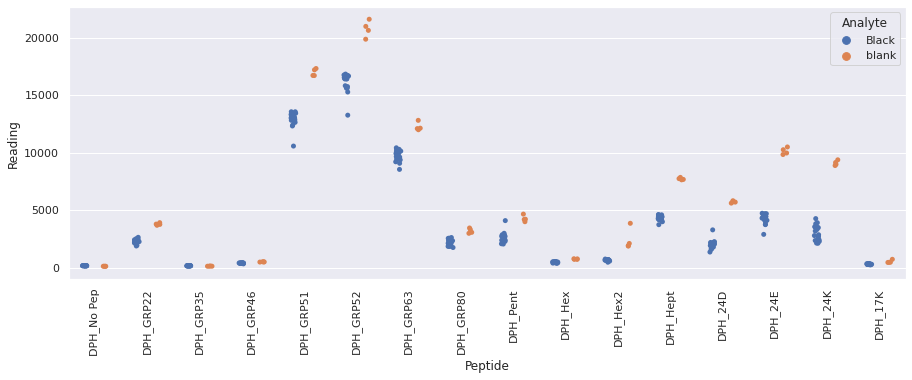

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Black_YorkshireR4_repeat_10.xlsx
Drawing scatter plot of data spread for Black_YorkshireR4_repeat_10 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

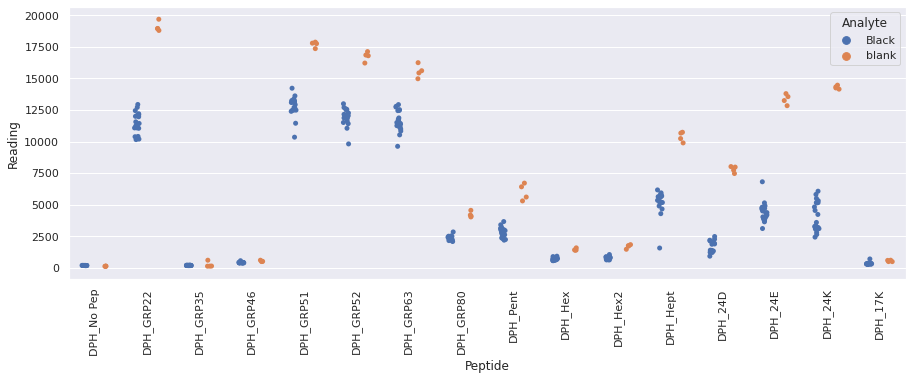

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Black_YorkshireR5_repeat_10.xlsx
Drawing scatter plot of data spread for Black_YorkshireR5_repeat_10 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

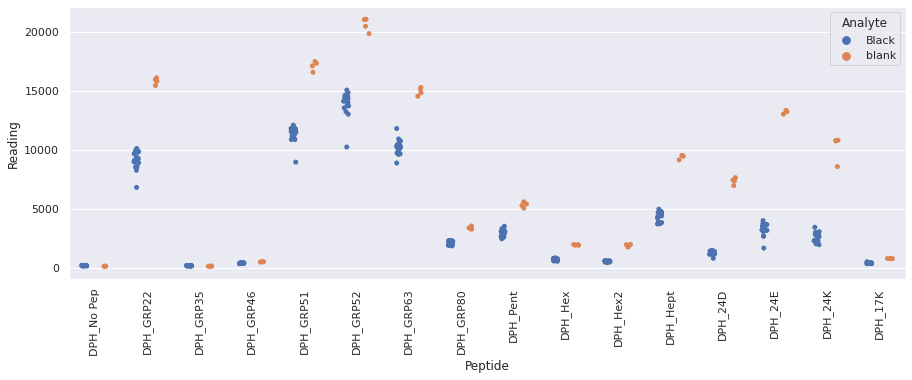

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Black_YorkshireR6_repeat_10.xlsx
Drawing scatter plot of data spread for Black_YorkshireR6_repeat_10 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

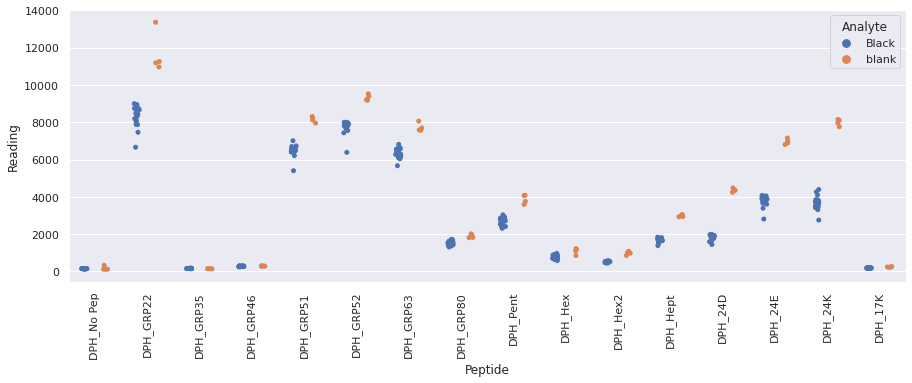

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Green_TwiningsR1_repeat_10.xlsx
Drawing scatter plot of data spread for Green_TwiningsR1_repeat_10 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

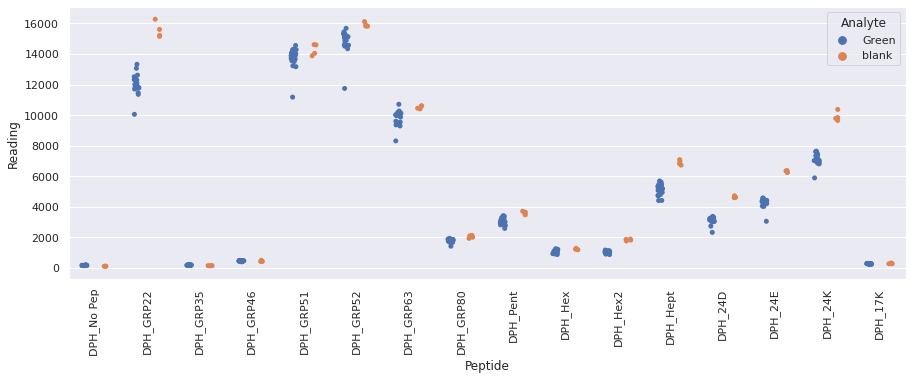

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Green_TwiningsR2_repeat_10.xlsx
Drawing scatter plot of data spread for Green_TwiningsR2_repeat_10 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

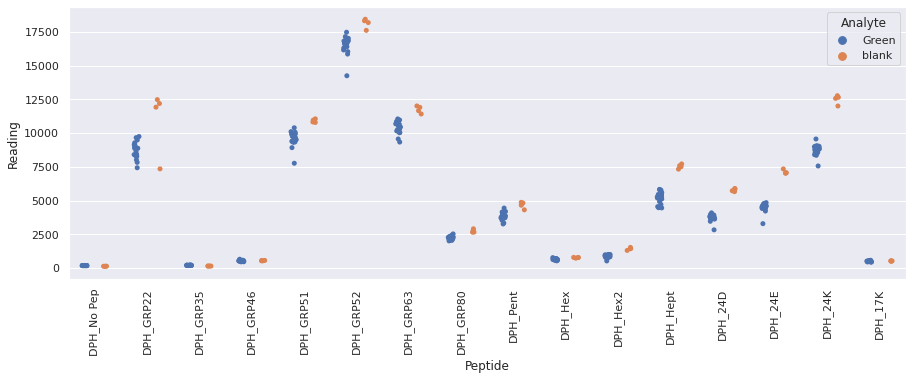

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Green_TwiningsR3_repeat_10.xlsx
Drawing scatter plot of data spread for Green_TwiningsR3_repeat_10 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

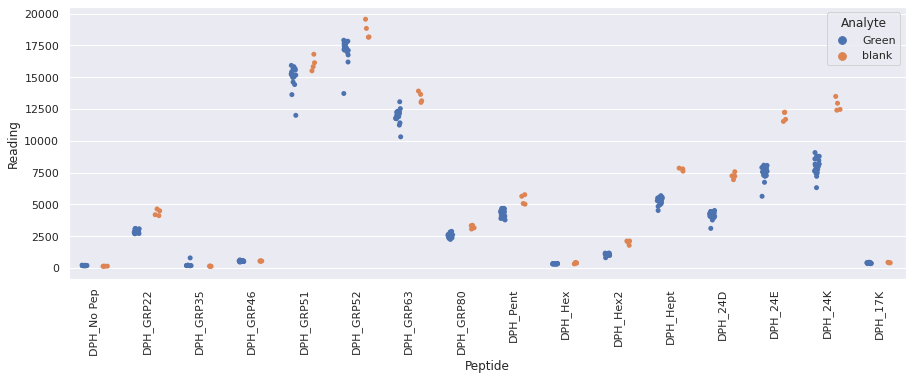

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Green_TwiningsR4_repeat_10.xlsx
Drawing scatter plot of data spread for Green_TwiningsR4_repeat_10 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

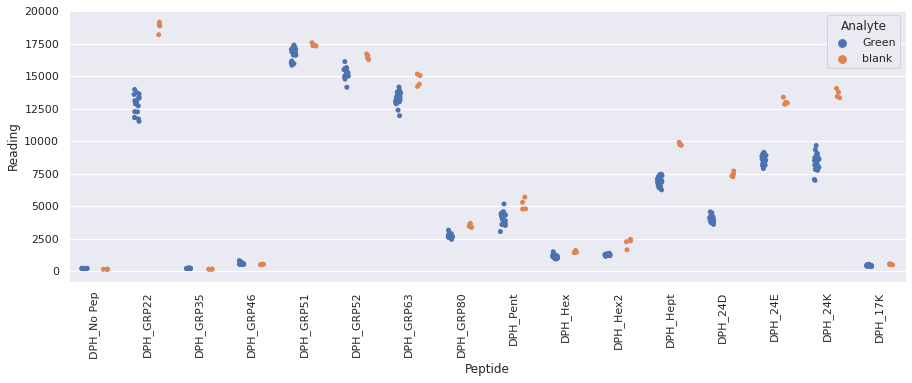

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Green_TwiningsR5_repeat_10.xlsx
Drawing scatter plot of data spread for Green_TwiningsR5_repeat_10 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

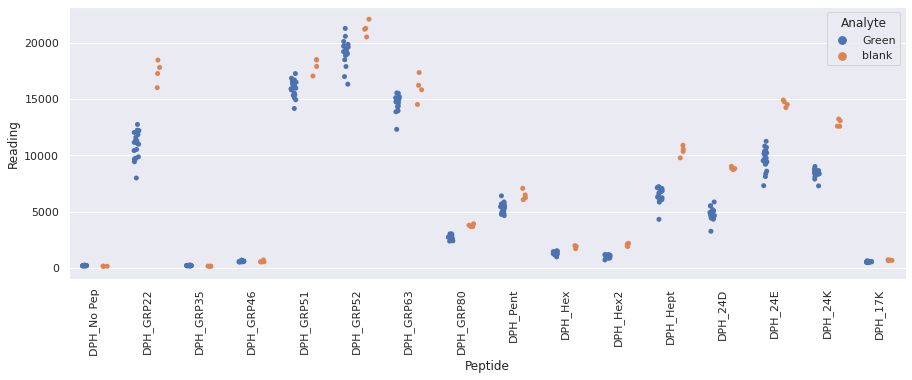

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Green_TwiningsR6_repeat_10.xlsx
Drawing scatter plot of data spread for Green_TwiningsR6_repeat_10 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

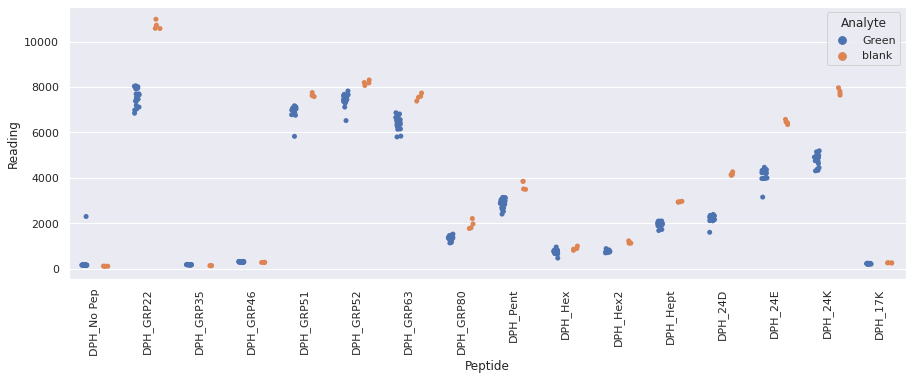

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Grey_TwiningsR1_repeat_10.xlsx
Drawing scatter plot of data spread for Grey_TwiningsR1_repeat_10 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

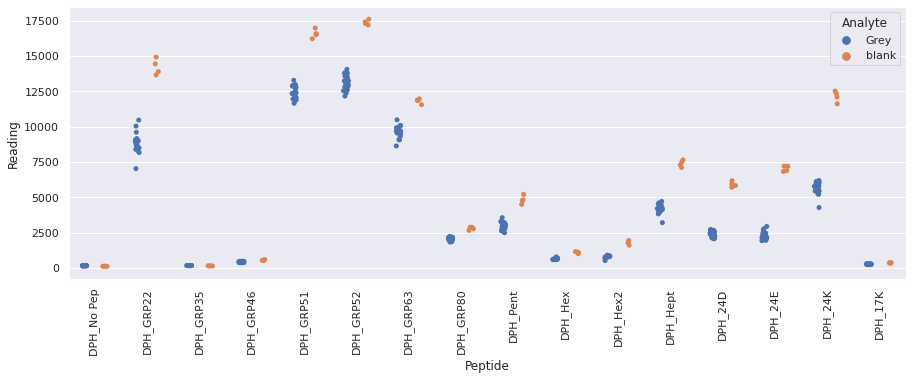

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Grey_TwiningsR2_repeat_10.xlsx
Drawing scatter plot of data spread for Grey_TwiningsR2_repeat_10 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

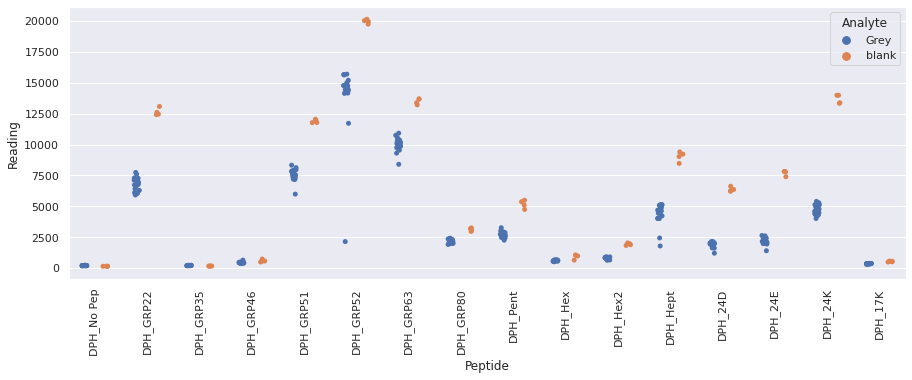

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Grey_TwiningsR3_repeat_10.xlsx
Drawing scatter plot of data spread for Grey_TwiningsR3_repeat_10 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

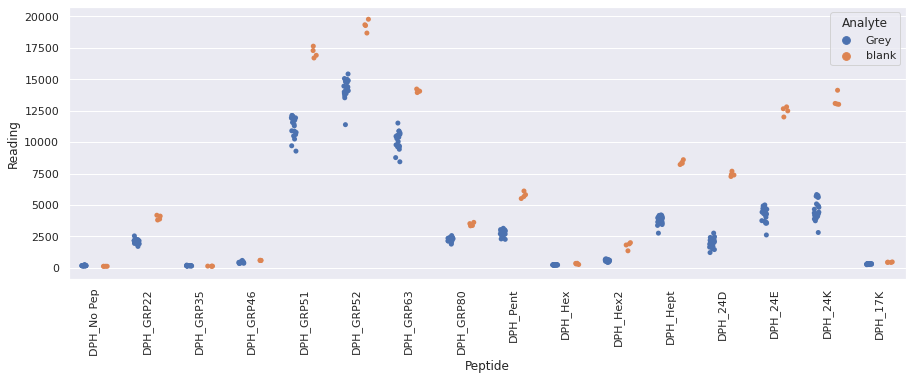

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Grey_TwiningsR4_repeat_10.xlsx
Drawing scatter plot of data spread for Grey_TwiningsR4_repeat_10 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

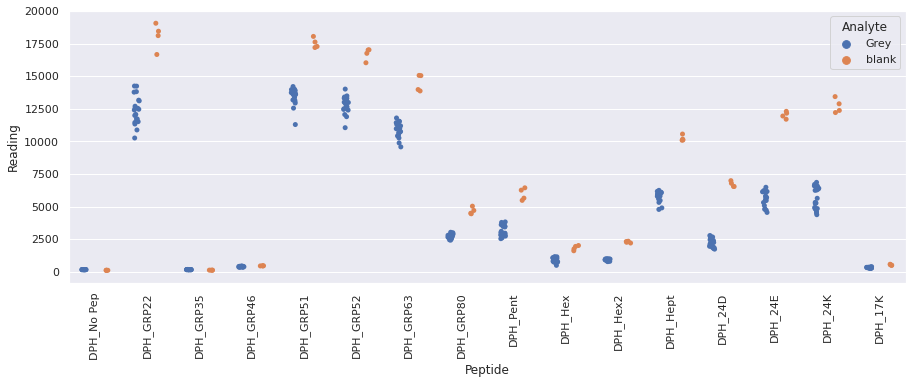

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Grey_TwiningsR5_repeat_10.xlsx
Drawing scatter plot of data spread for Grey_TwiningsR5_repeat_10 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

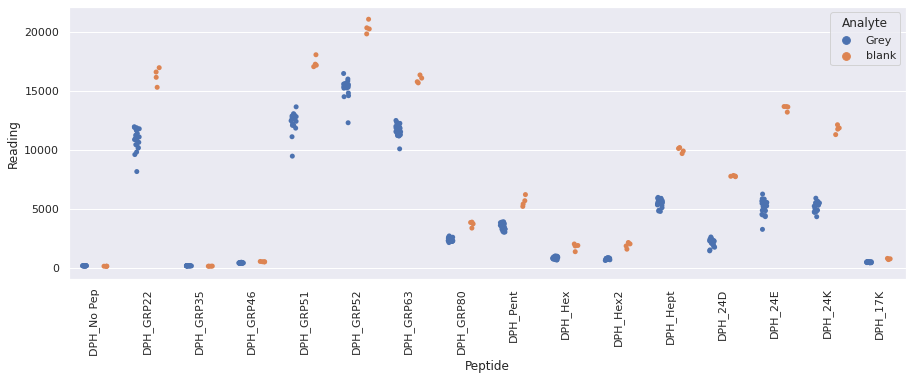

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Grey_TwiningsR6_repeat_10.xlsx
Drawing scatter plot of data spread for Grey_TwiningsR6_repeat_10 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

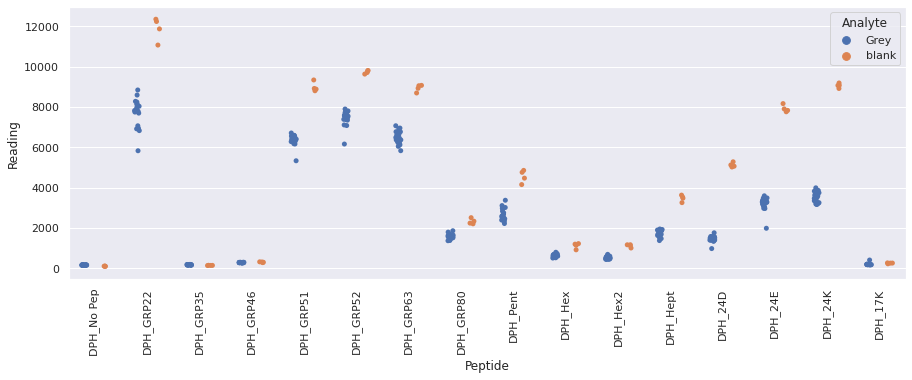

Drawing scatter plot of data spread for Black_ClipperR1_repeat_1 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

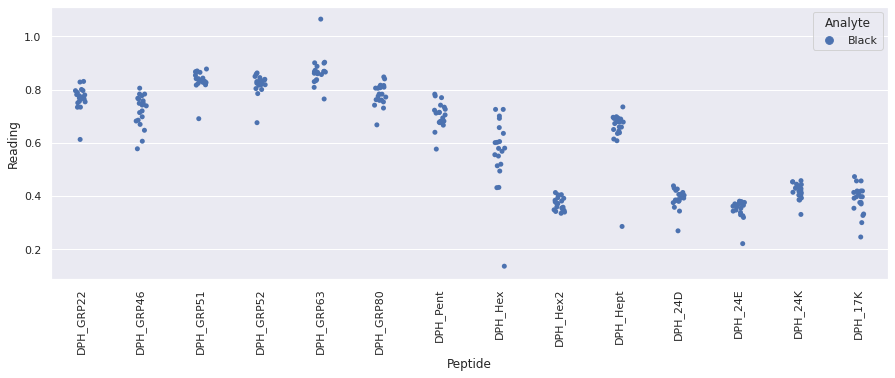

Drawing scatter plot of data spread for Black_ClipperR2_repeat_1 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

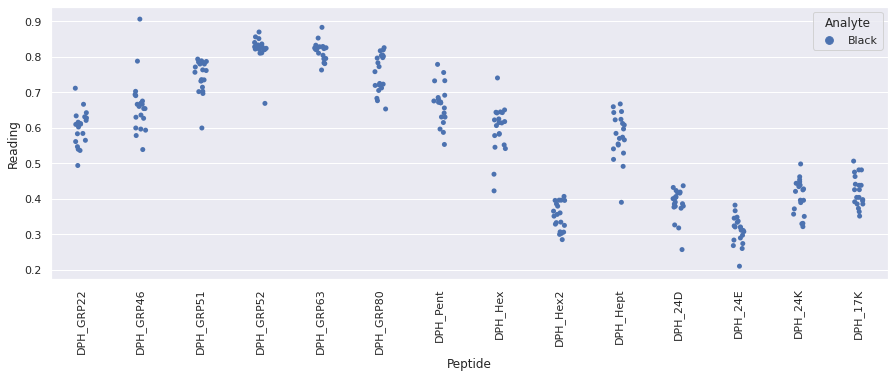

Drawing scatter plot of data spread for Black_ClipperR3_repeat_1 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

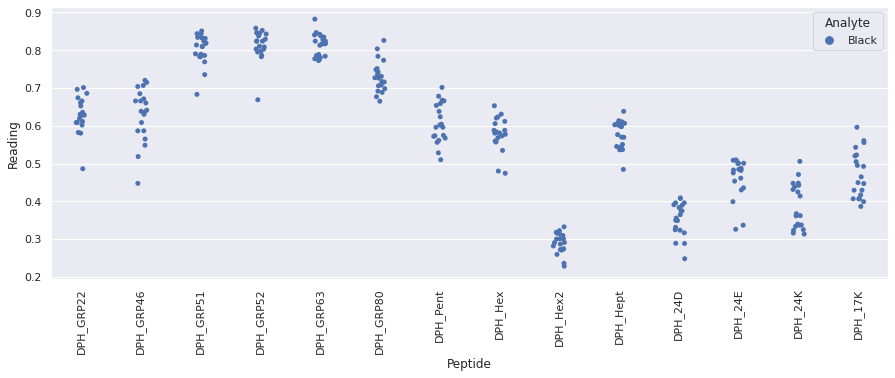

Drawing scatter plot of data spread for Black_ClipperR4_repeat_1 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

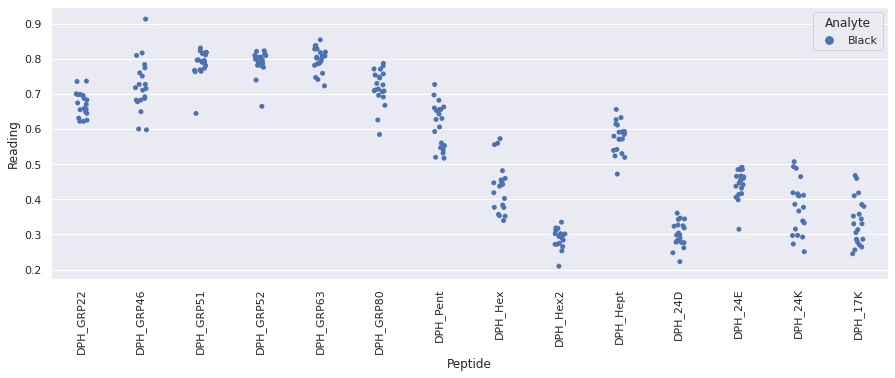

Drawing scatter plot of data spread for Black_ClipperR5_repeat_1 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

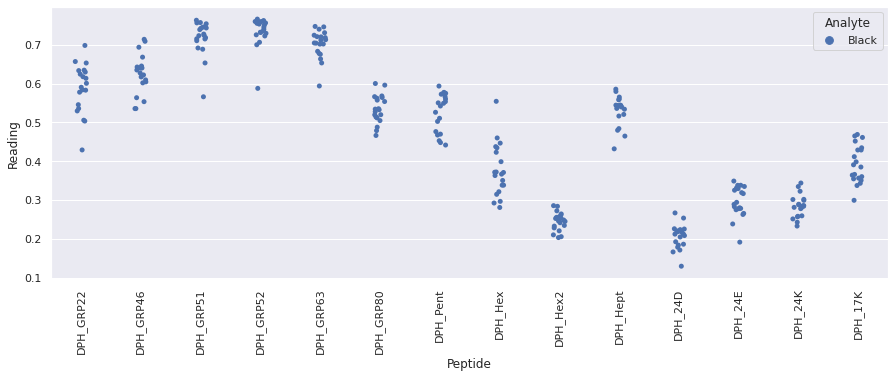

Drawing scatter plot of data spread for Black_ClipperR6_repeat_1 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

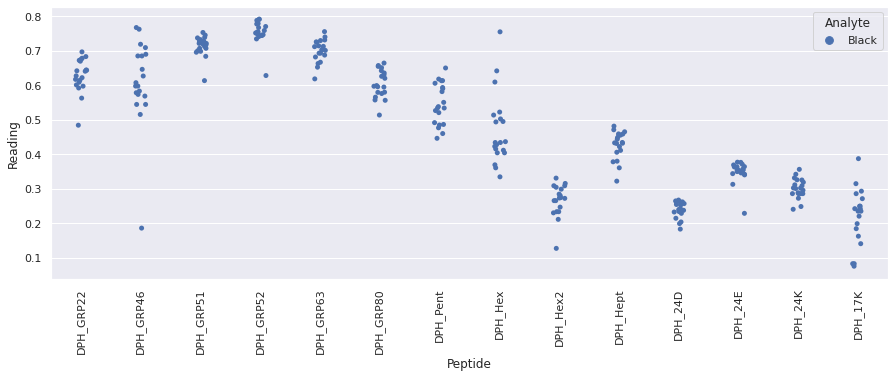

Drawing scatter plot of data spread for Green_ClipperR1_repeat_1 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

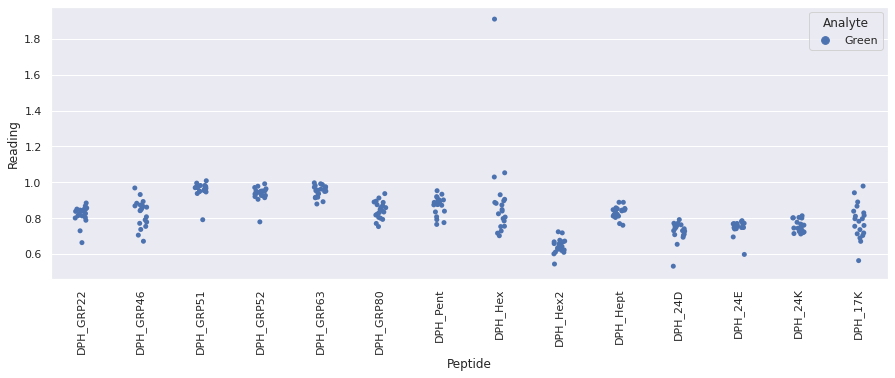

Drawing scatter plot of data spread for Green_ClipperR2_repeat_1 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

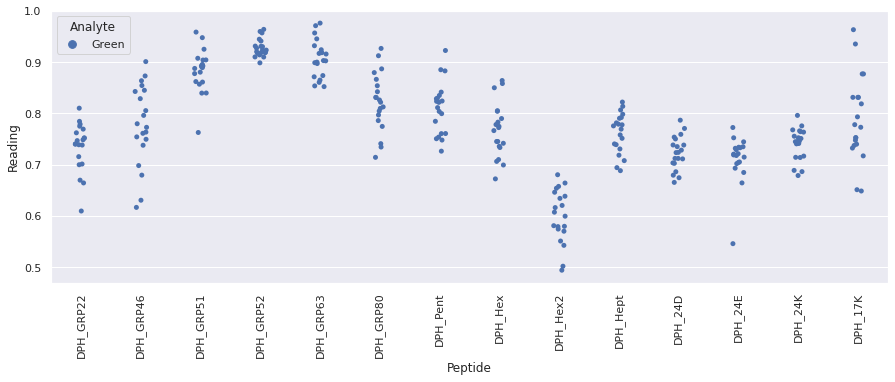

Drawing scatter plot of data spread for Green_ClipperR3_repeat_1 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

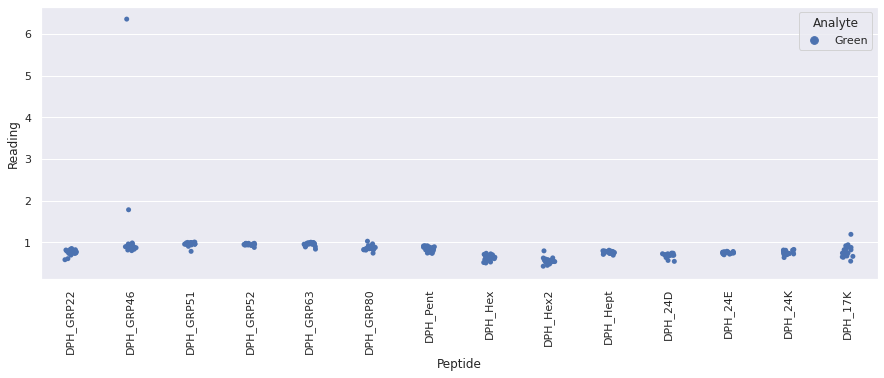

Drawing scatter plot of data spread for Green_ClipperR4_repeat_1 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

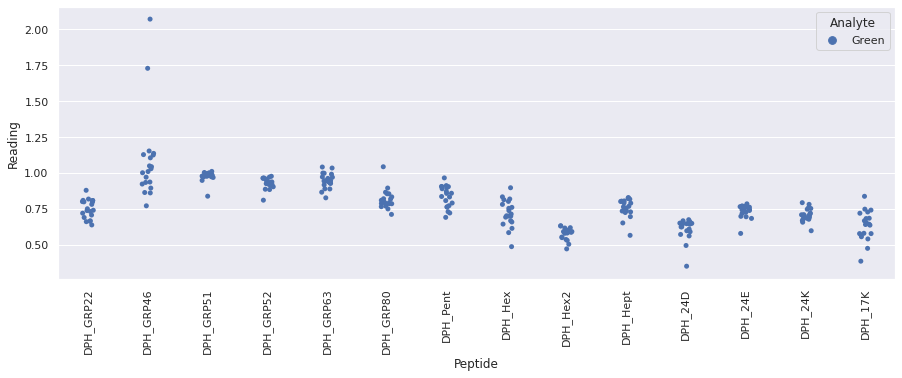

Drawing scatter plot of data spread for Green_ClipperR5_repeat_1 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

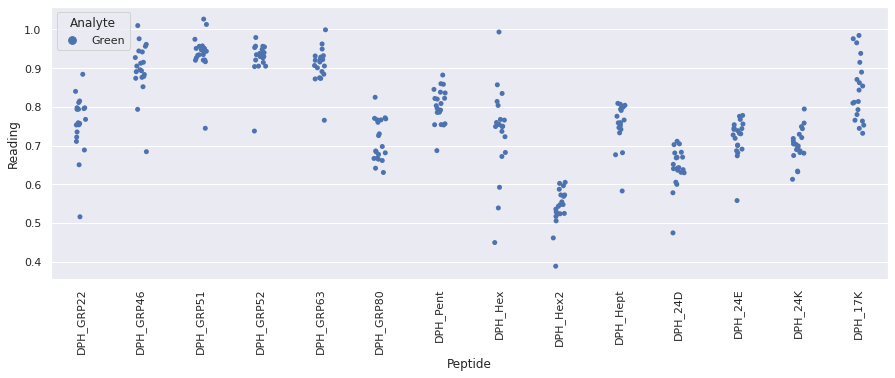

Drawing scatter plot of data spread for Green_ClipperR6_repeat_1 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

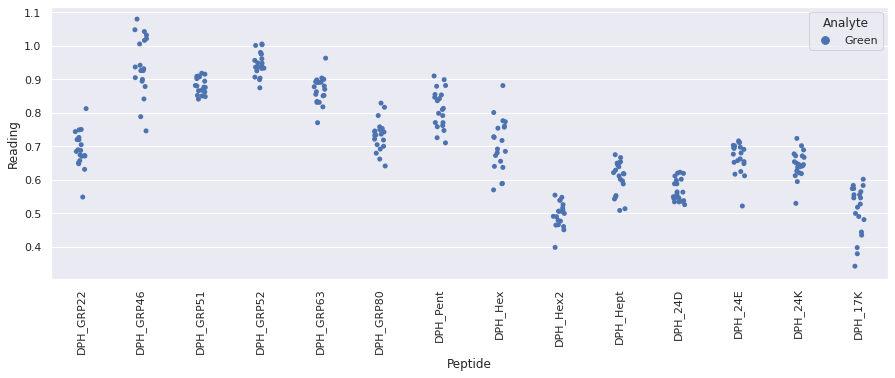

Drawing scatter plot of data spread for Grey_AsdaR1_repeat_1 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

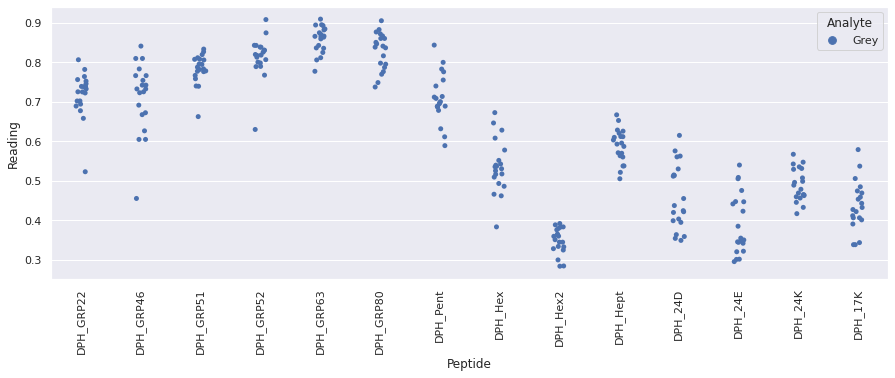

Drawing scatter plot of data spread for Grey_AsdaR2_repeat_1 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

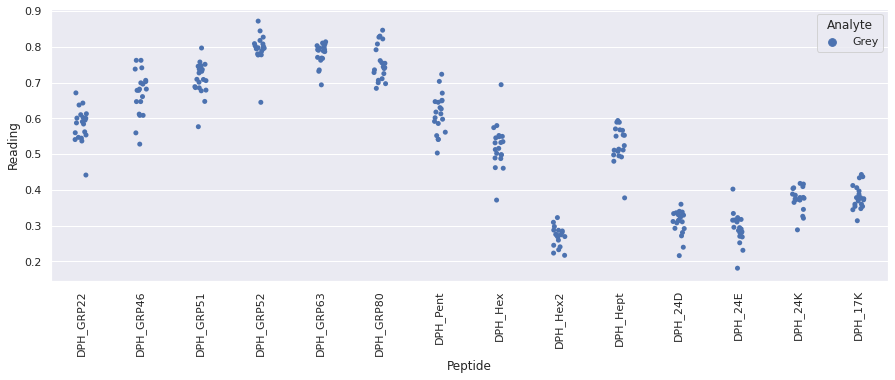

Drawing scatter plot of data spread for Grey_AsdaR3_repeat_1 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

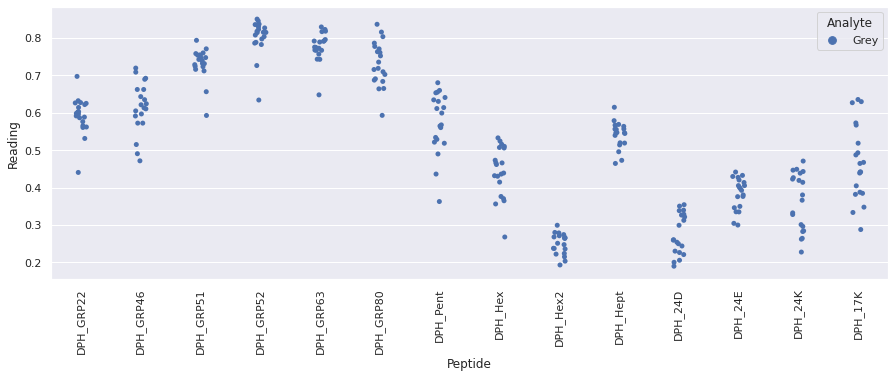

Drawing scatter plot of data spread for Grey_AsdaR4_repeat_1 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

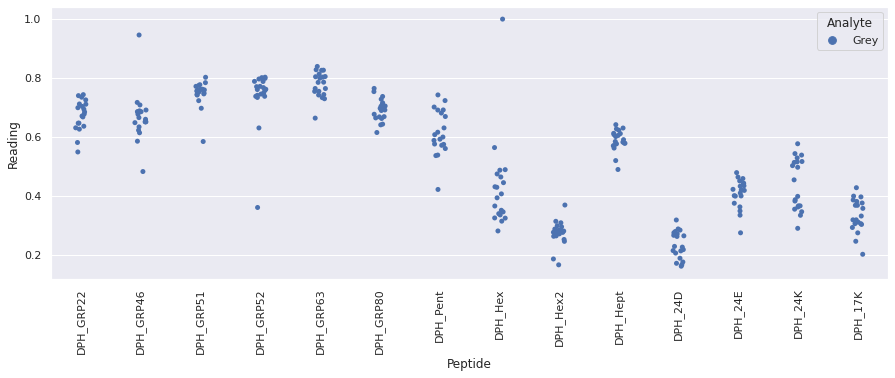

Drawing scatter plot of data spread for Grey_AsdaR5_repeat_1 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

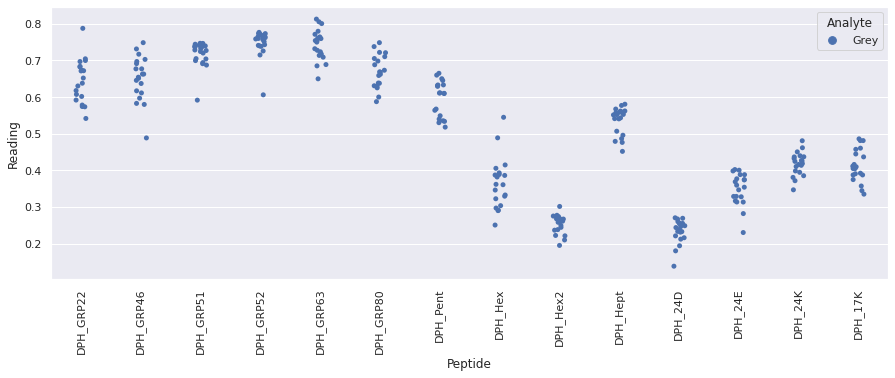

Drawing scatter plot of data spread for Grey_AsdaR6_repeat_1 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

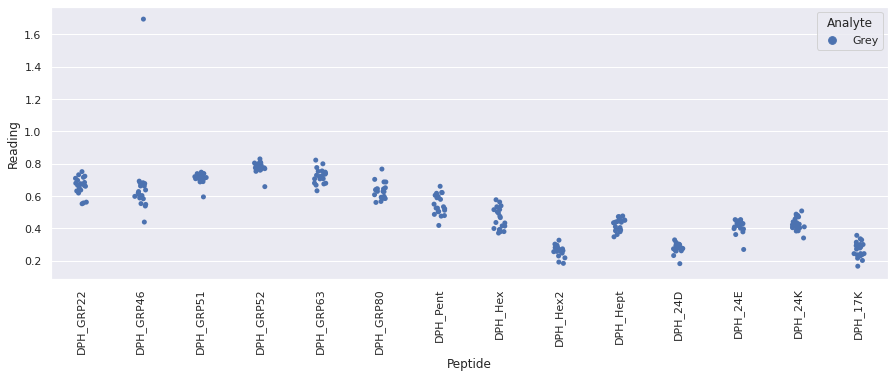

Drawing scatter plot of data spread for Black_DiplomatR1_repeat_2 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

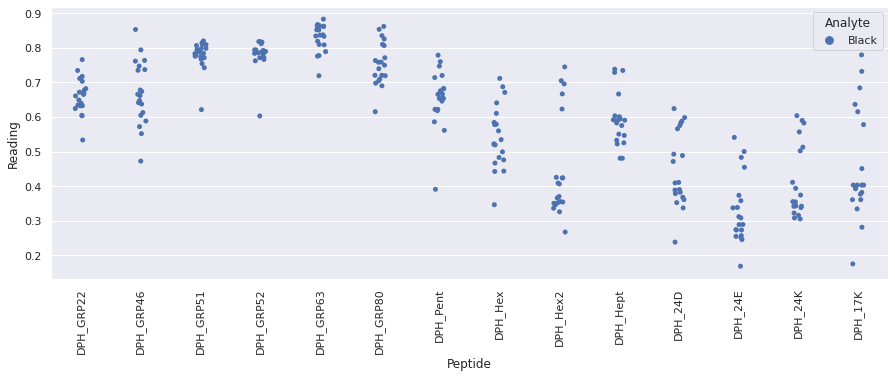

Drawing scatter plot of data spread for Black_DiplomatR2_repeat_2 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

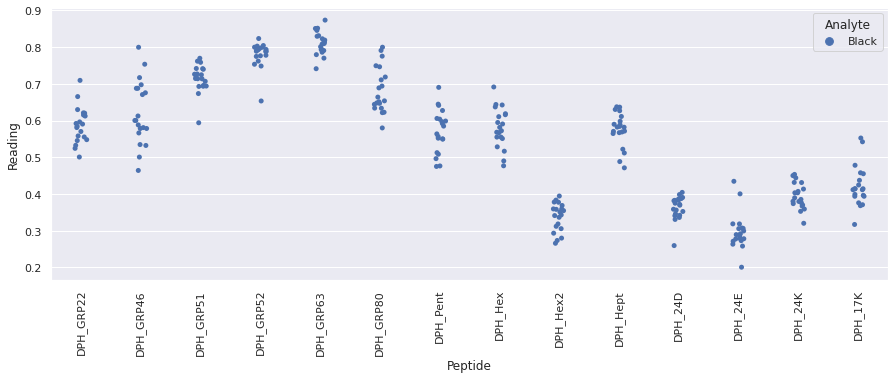

Drawing scatter plot of data spread for Black_DiplomatR3_repeat_2 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

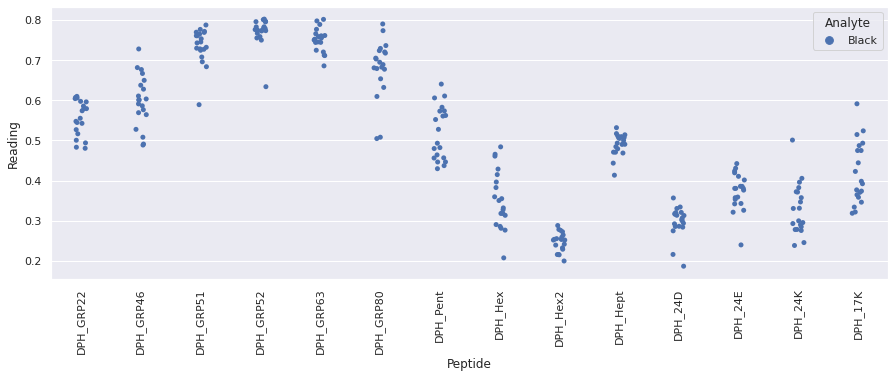

Drawing scatter plot of data spread for Black_DiplomatR4_repeat_2 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

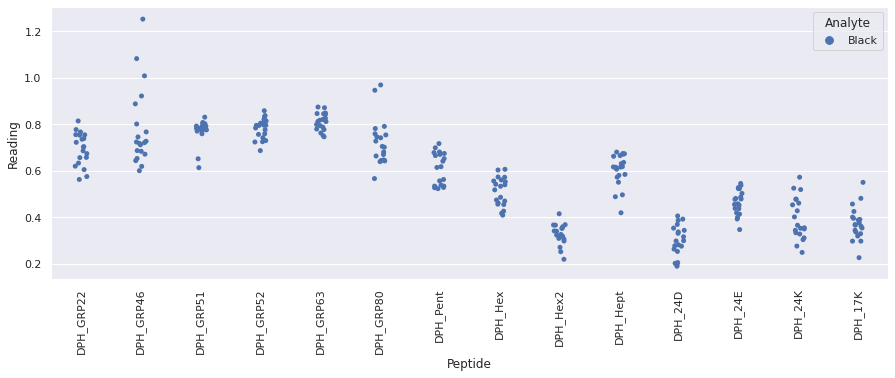

Drawing scatter plot of data spread for Black_DiplomatR5_repeat_2 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

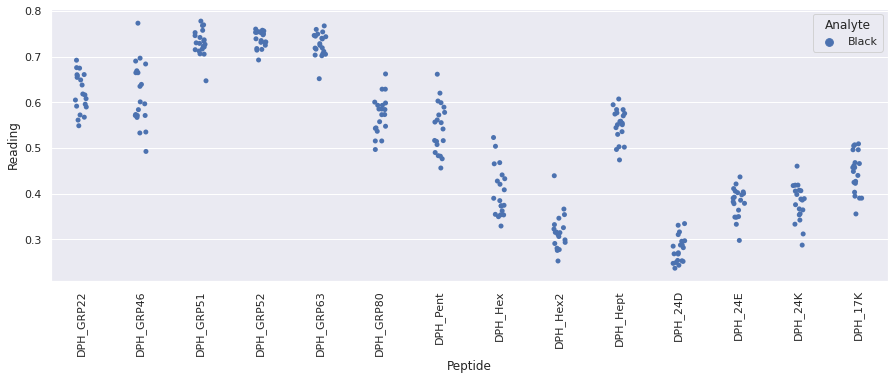

Drawing scatter plot of data spread for Black_DiplomatR6_repeat_2 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

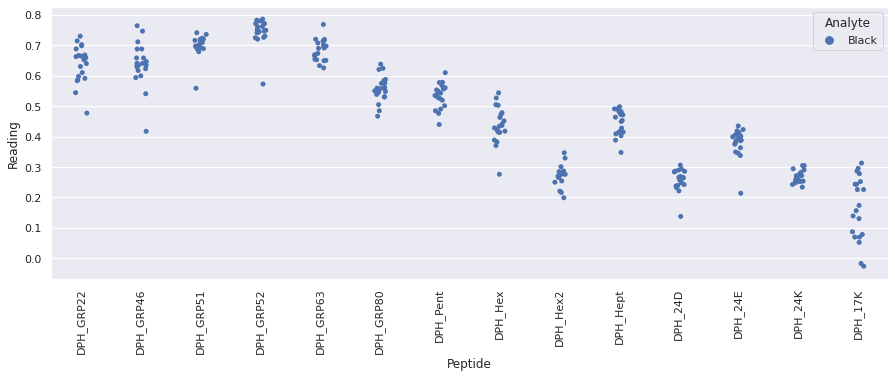

Drawing scatter plot of data spread for Green_DiplomatR1_repeat_2 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

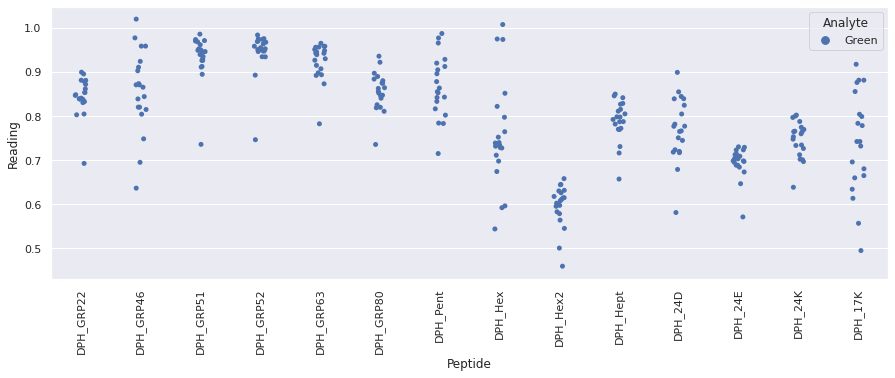

Drawing scatter plot of data spread for Green_DiplomatR2_repeat_2 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

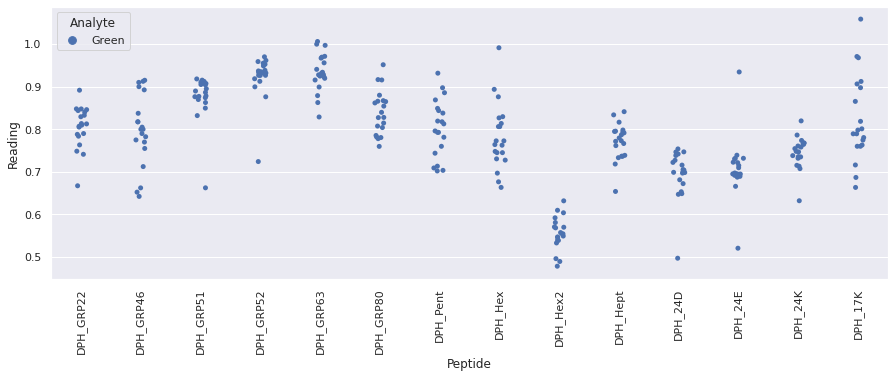

Drawing scatter plot of data spread for Green_DiplomatR3_repeat_2 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

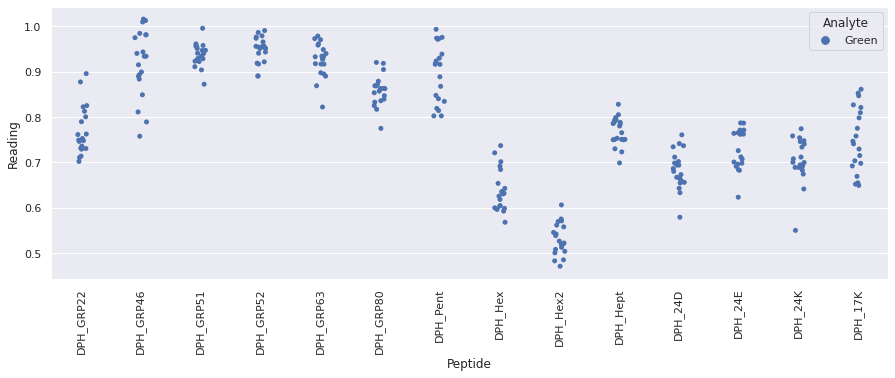

Drawing scatter plot of data spread for Green_DiplomatR4_repeat_2 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

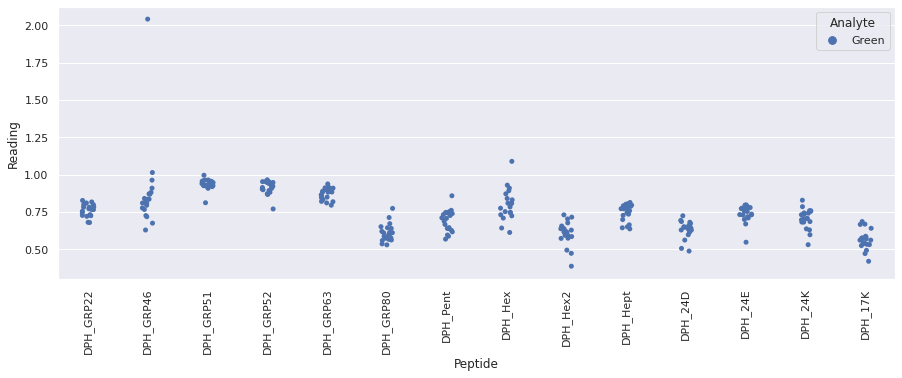

Drawing scatter plot of data spread for Green_DiplomatR5_repeat_2 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

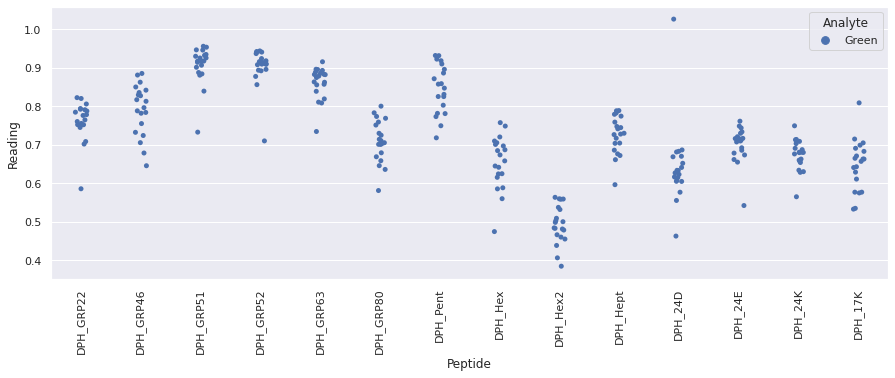

Drawing scatter plot of data spread for Green_DiplomatR6_repeat_2 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

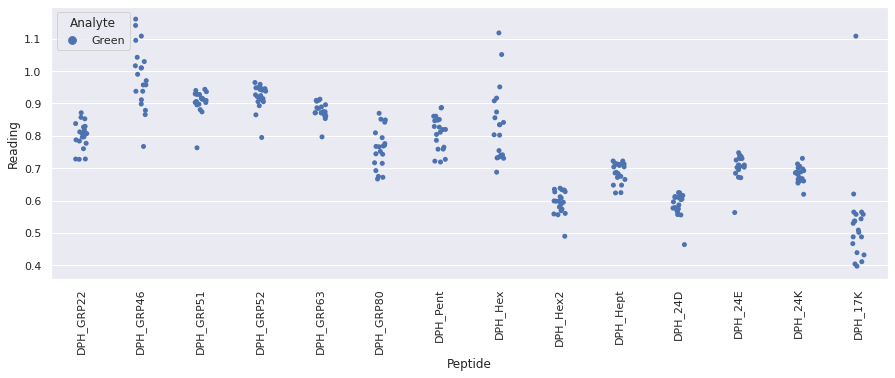

Drawing scatter plot of data spread for Grey_ClipperR1_repeat_2 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

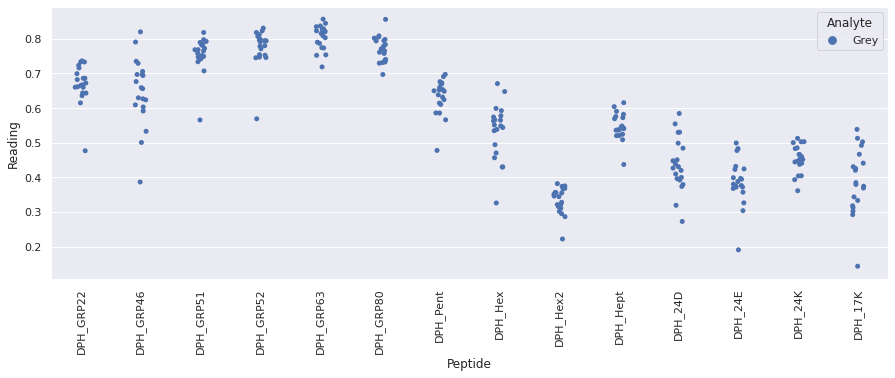

Drawing scatter plot of data spread for Grey_ClipperR2_repeat_2 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

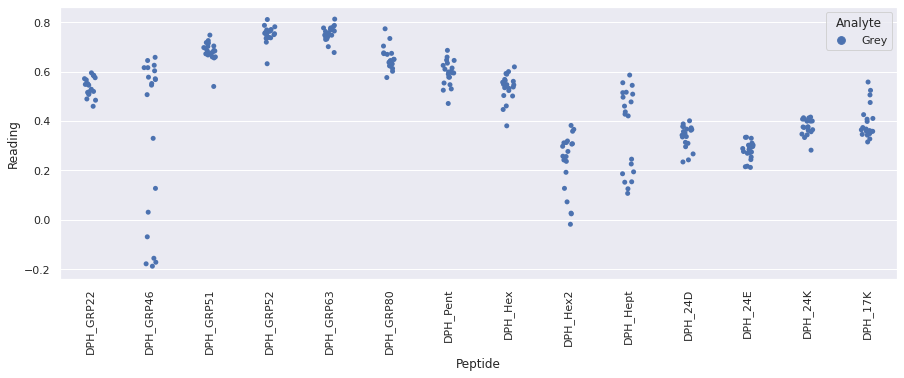

Drawing scatter plot of data spread for Grey_ClipperR3_repeat_2 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

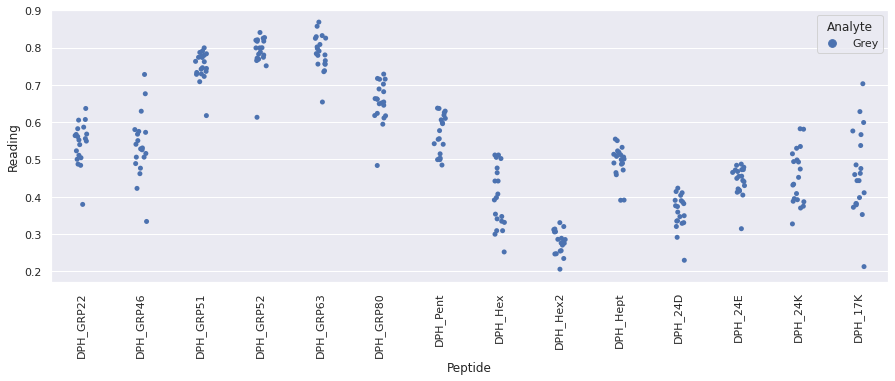

Drawing scatter plot of data spread for Grey_ClipperR4_repeat_2 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

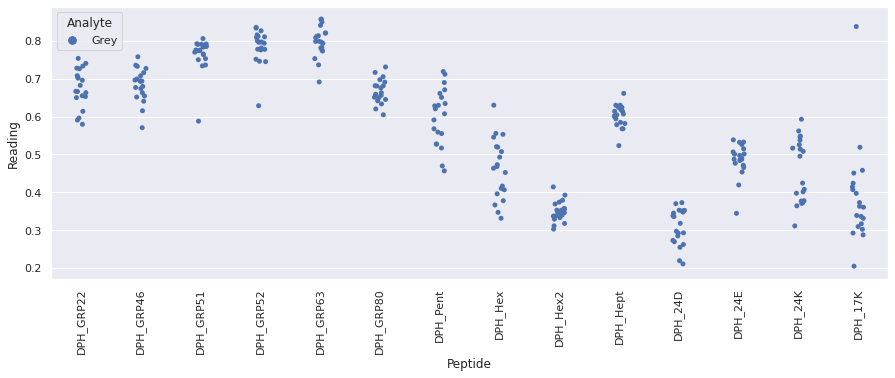

Drawing scatter plot of data spread for Grey_ClipperR5_repeat_2 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

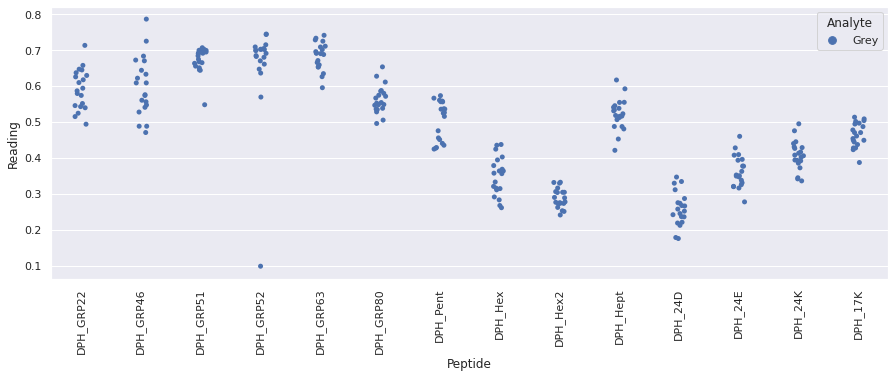

Drawing scatter plot of data spread for Grey_ClipperR6_repeat_2 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

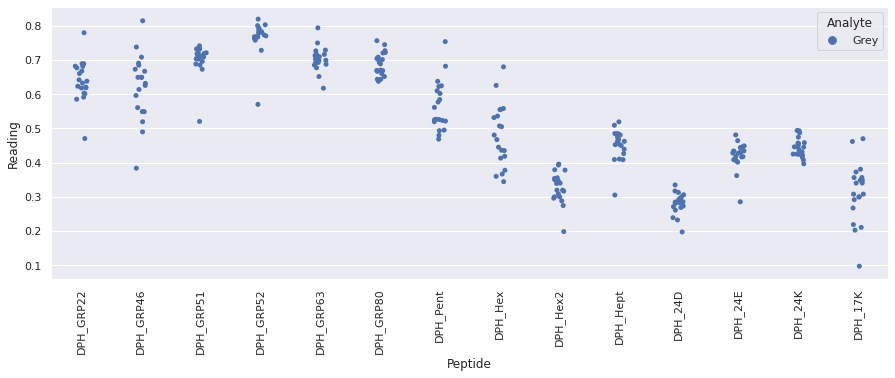

Drawing scatter plot of data spread for Black_DragonflyR1_repeat_3 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

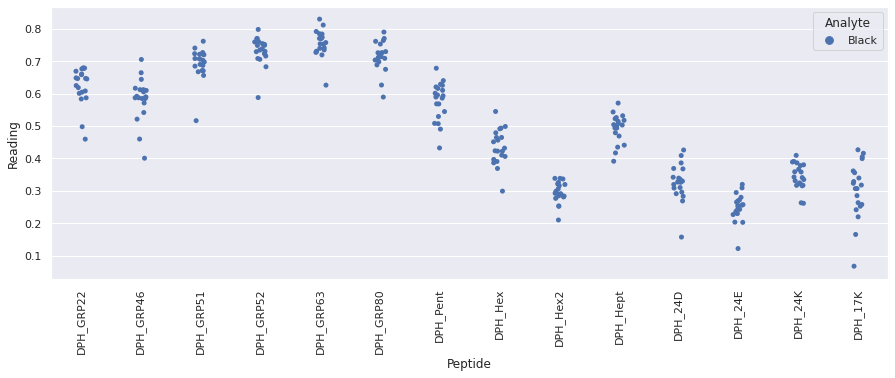

Drawing scatter plot of data spread for Black_DragonflyR2_repeat_3 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

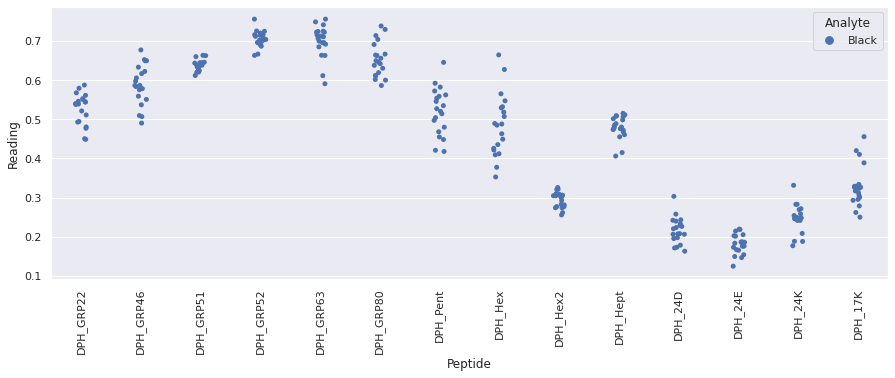

Drawing scatter plot of data spread for Black_DragonflyR3_repeat_3 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

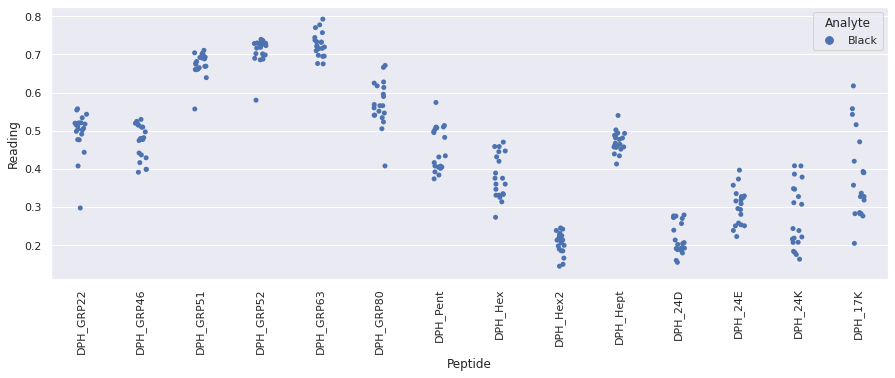

Drawing scatter plot of data spread for Black_DragonflyR4_repeat_3 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

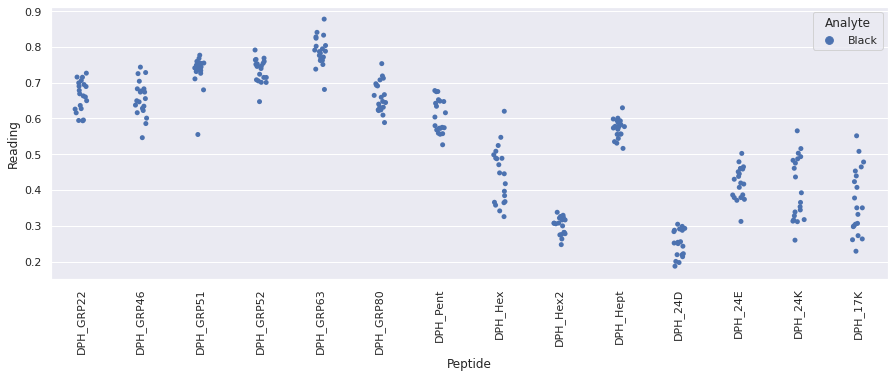

Drawing scatter plot of data spread for Black_DragonflyR5_repeat_3 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

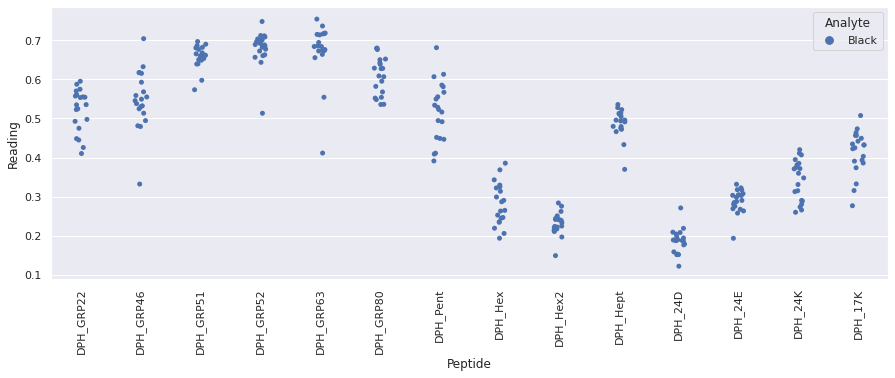

Drawing scatter plot of data spread for Black_DragonflyR6_repeat_3 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

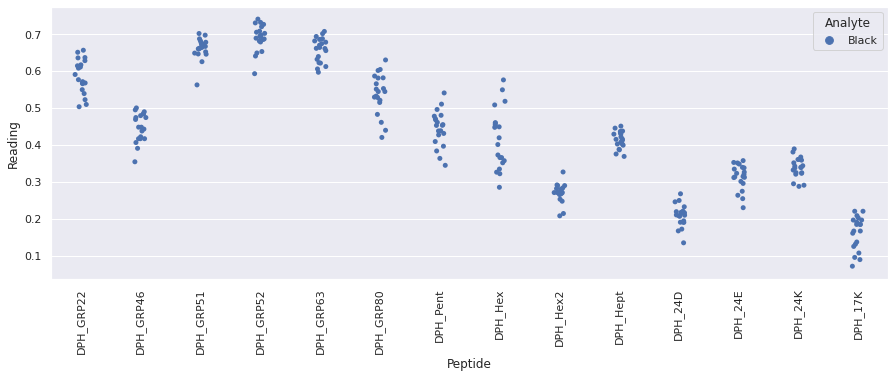

Drawing scatter plot of data spread for Green_DoubledragonR1_repeat_3 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

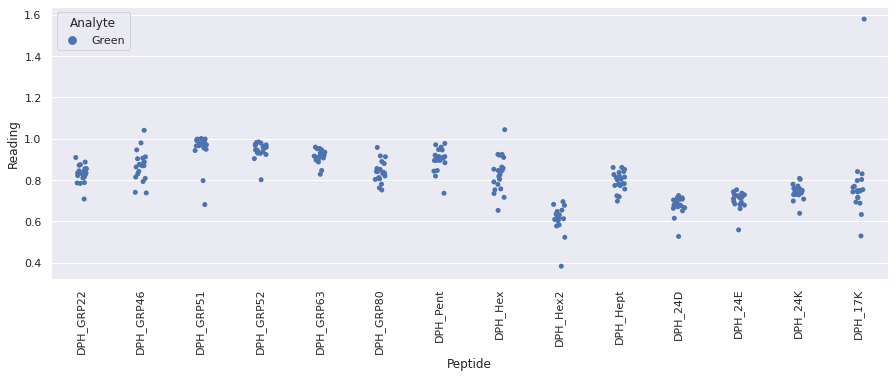

Drawing scatter plot of data spread for Green_DoubledragonR2_repeat_3 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

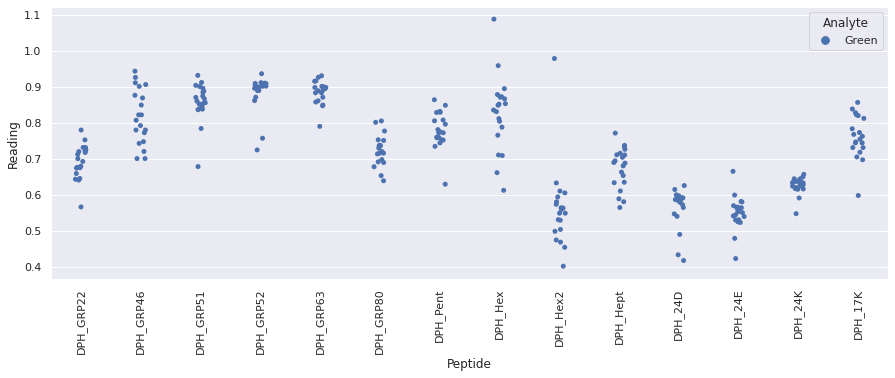

Drawing scatter plot of data spread for Green_DoubledragonR3_repeat_3 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

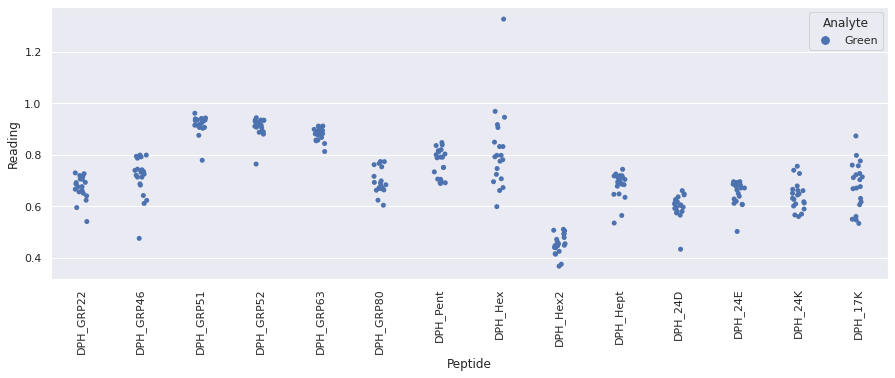

Drawing scatter plot of data spread for Green_DoubledragonR4_repeat_3 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

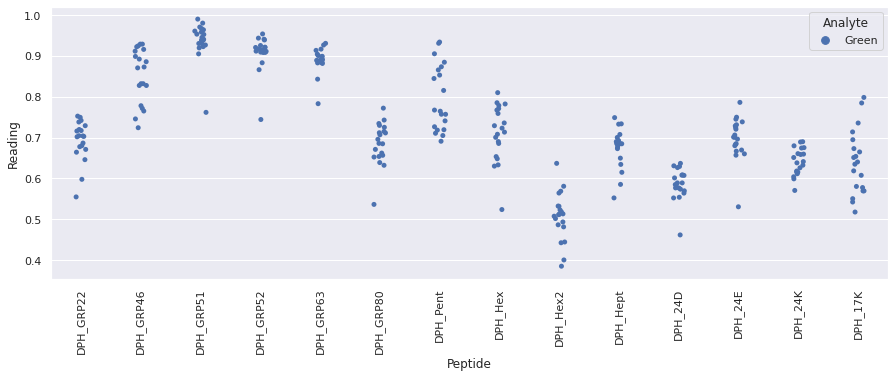

Drawing scatter plot of data spread for Green_DoubledragonR5_repeat_3 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

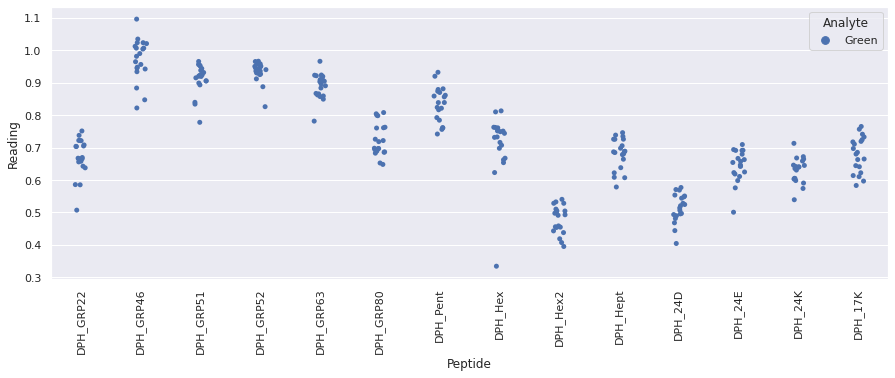

Drawing scatter plot of data spread for Green_DoubledragonR6_repeat_3 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

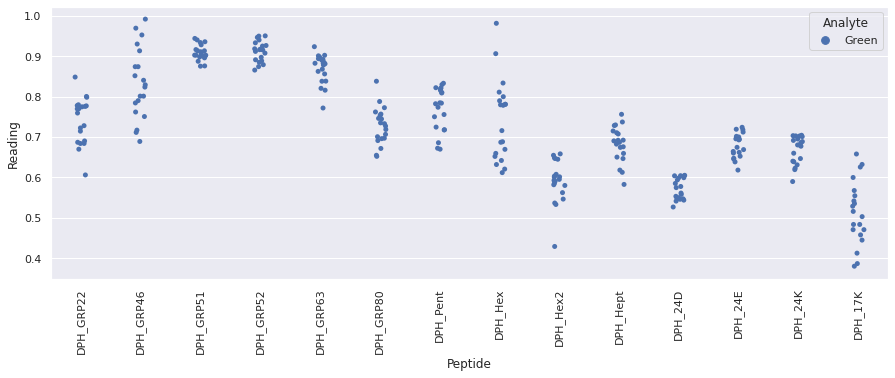

Drawing scatter plot of data spread for Grey_CoopR1_repeat_3 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

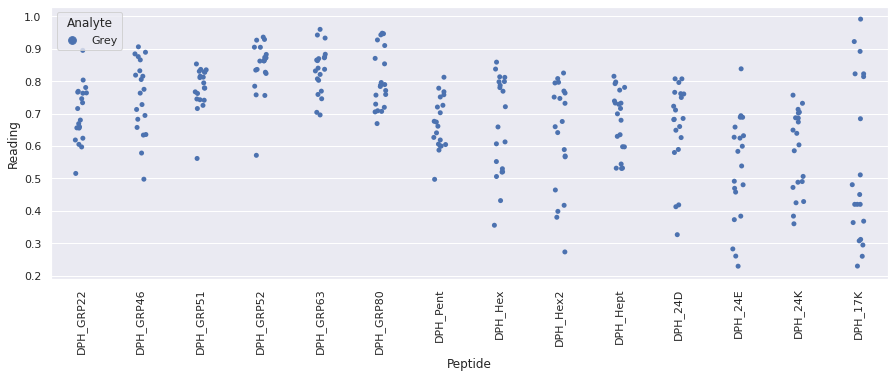

Drawing scatter plot of data spread for Grey_CoopR2_repeat_3 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

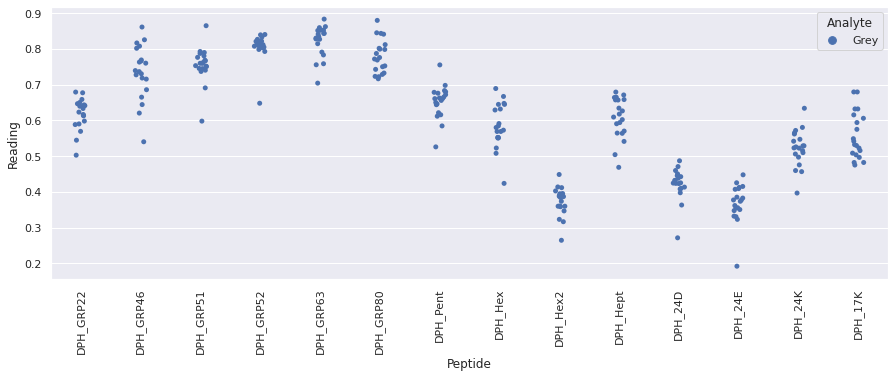

Drawing scatter plot of data spread for Grey_CoopR3_repeat_3 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

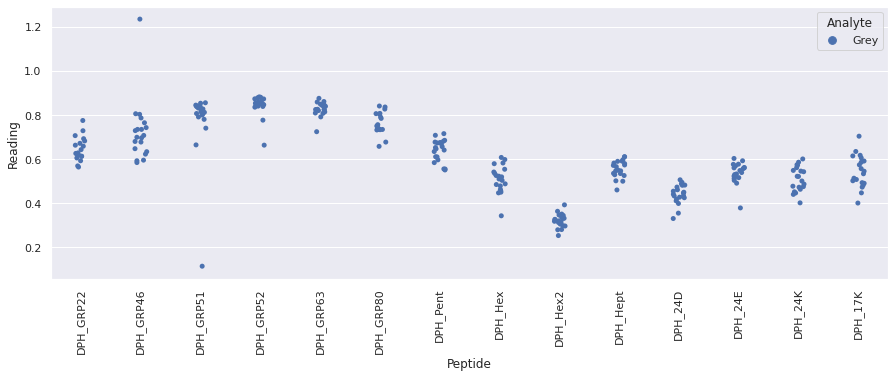

Drawing scatter plot of data spread for Grey_CoopR4_repeat_3 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

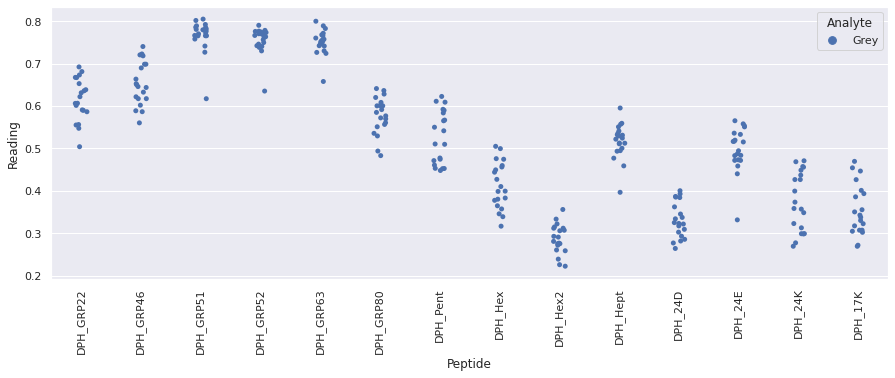

Drawing scatter plot of data spread for Grey_CoopR5_repeat_3 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

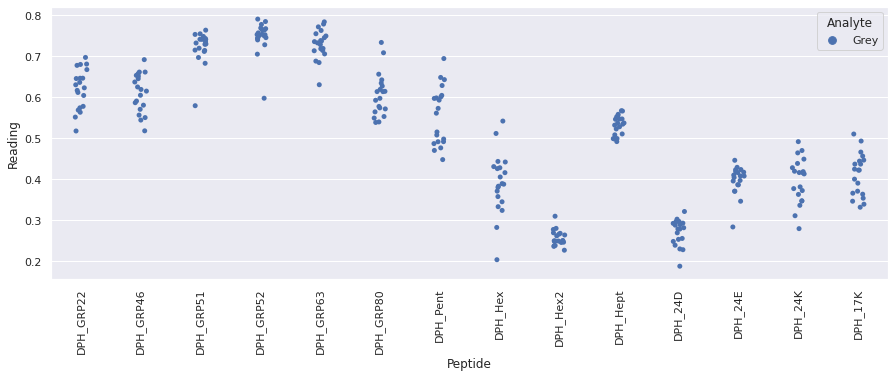

Drawing scatter plot of data spread for Grey_CoopR6_repeat_3 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

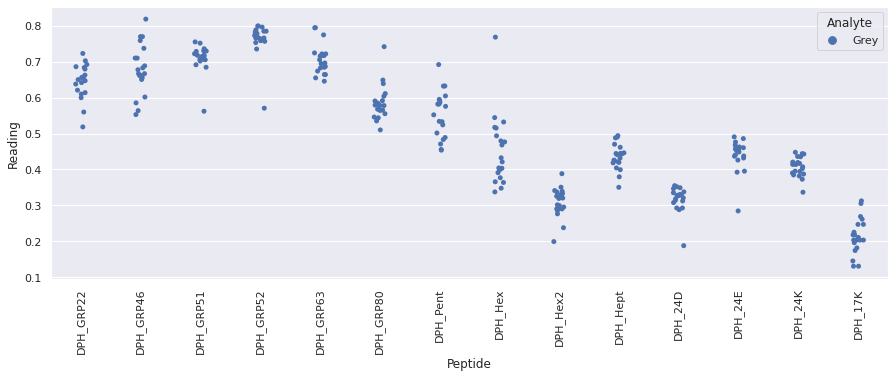

Drawing scatter plot of data spread for Black_PgtipsR1_repeat_4 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

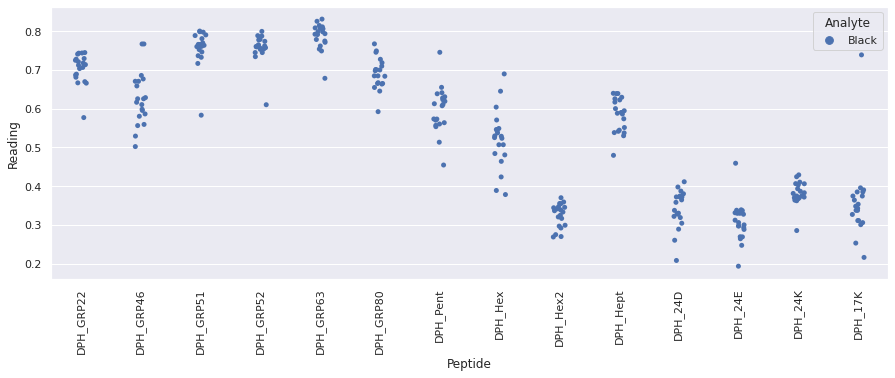

Drawing scatter plot of data spread for Black_PgtipsR2_repeat_4 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

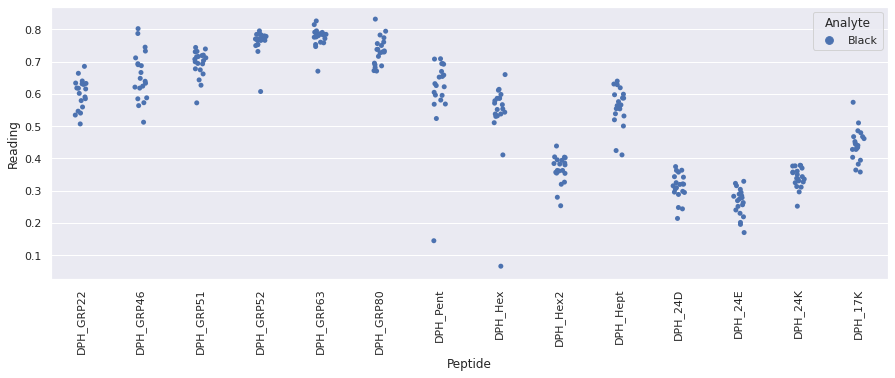

Drawing scatter plot of data spread for Black_PgtipsR3_repeat_4 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

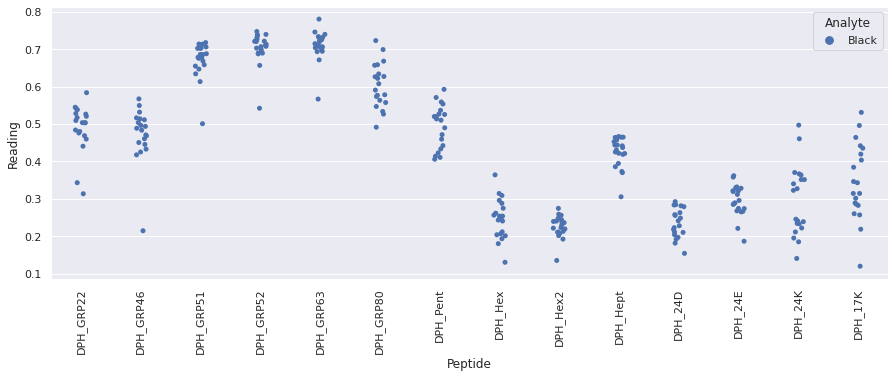

Drawing scatter plot of data spread for Black_PgtipsR4_repeat_4 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

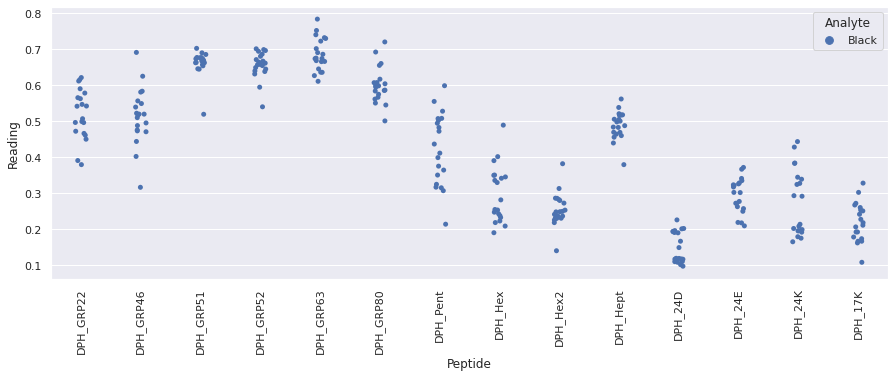

Drawing scatter plot of data spread for Black_PgtipsR5_repeat_4 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

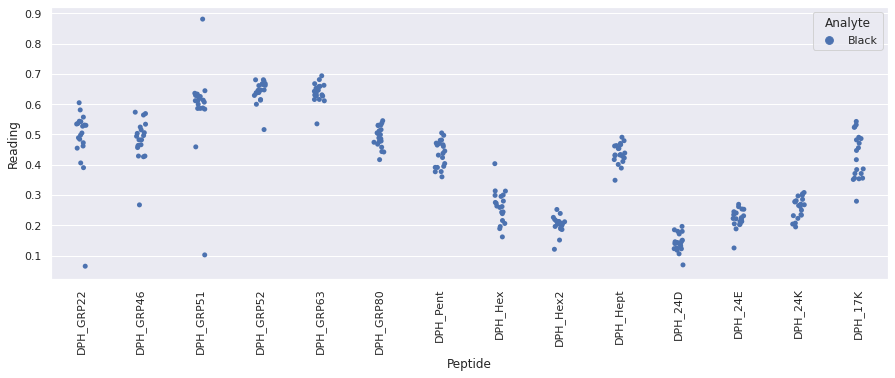

Drawing scatter plot of data spread for Black_PgtipsR6_repeat_4 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

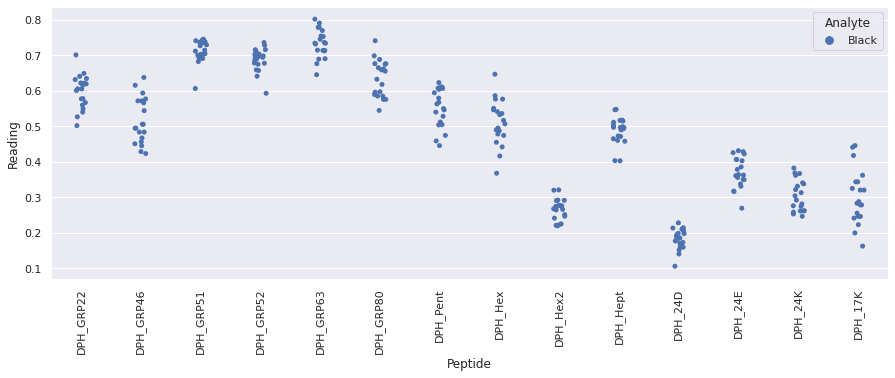

Drawing scatter plot of data spread for Green_DragonflyR1_repeat_4 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

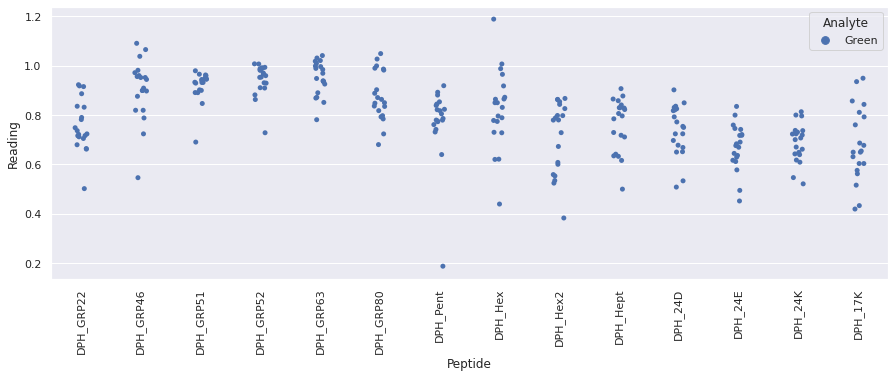

Drawing scatter plot of data spread for Green_DragonflyR2_repeat_4 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

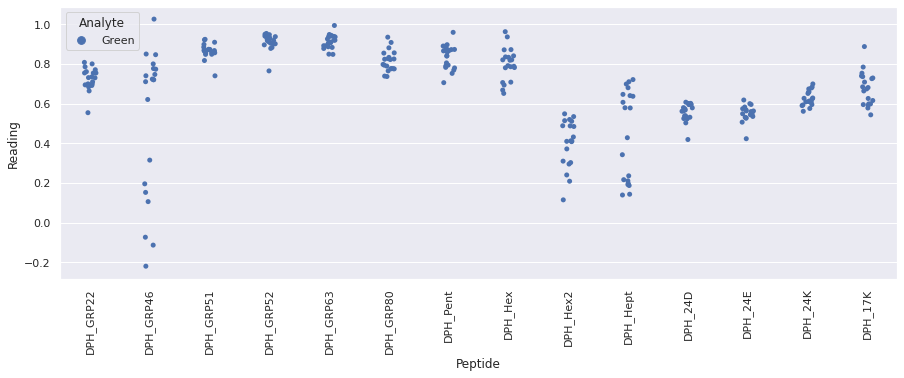

Drawing scatter plot of data spread for Green_DragonflyR3_repeat_4 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

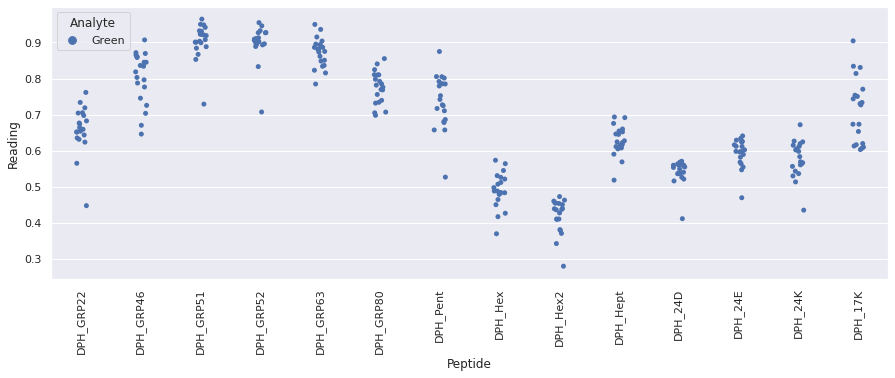

Drawing scatter plot of data spread for Green_DragonflyR4_repeat_4 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

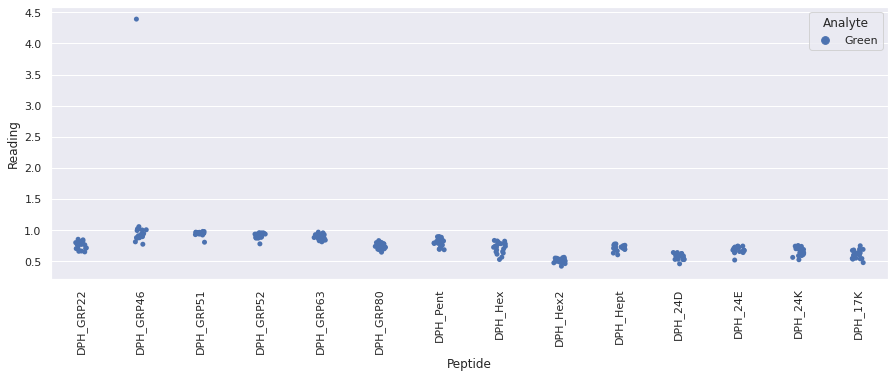

Drawing scatter plot of data spread for Green_DragonflyR5_repeat_4 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

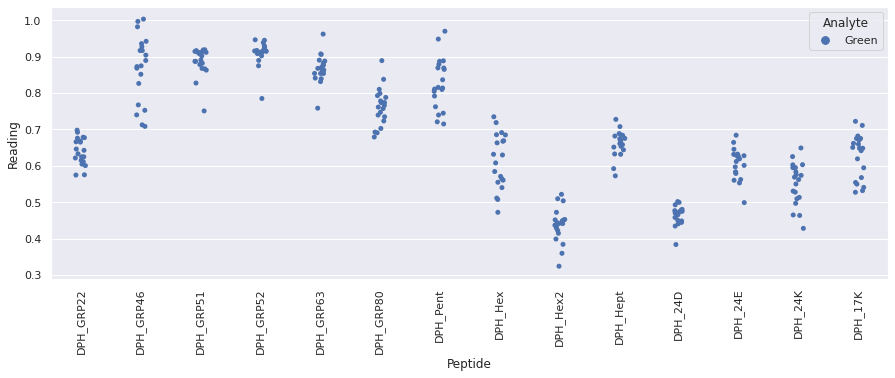

Drawing scatter plot of data spread for Green_DragonflyR6_repeat_4 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

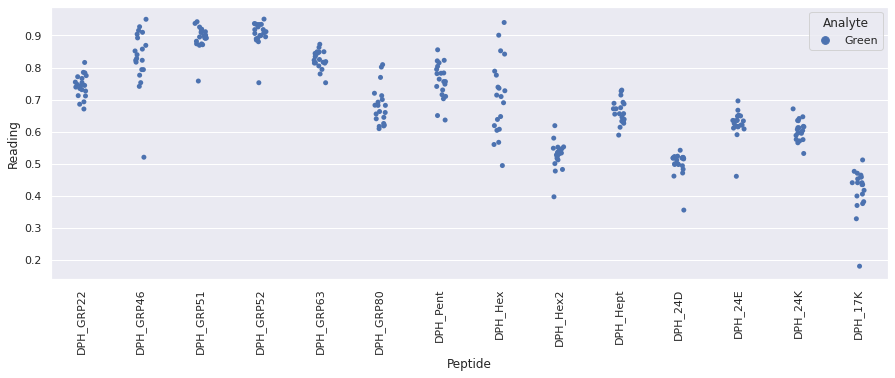

Drawing scatter plot of data spread for Grey_DevonshireR1_repeat_4 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

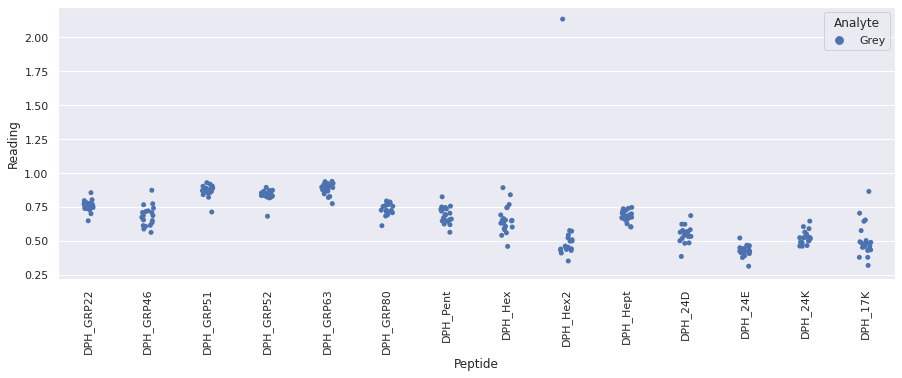

Drawing scatter plot of data spread for Grey_DevonshireR2_repeat_4 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

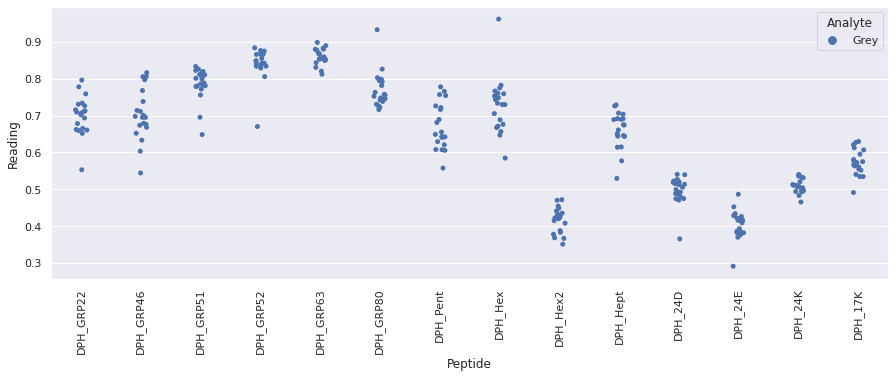

Drawing scatter plot of data spread for Grey_DevonshireR3_repeat_4 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

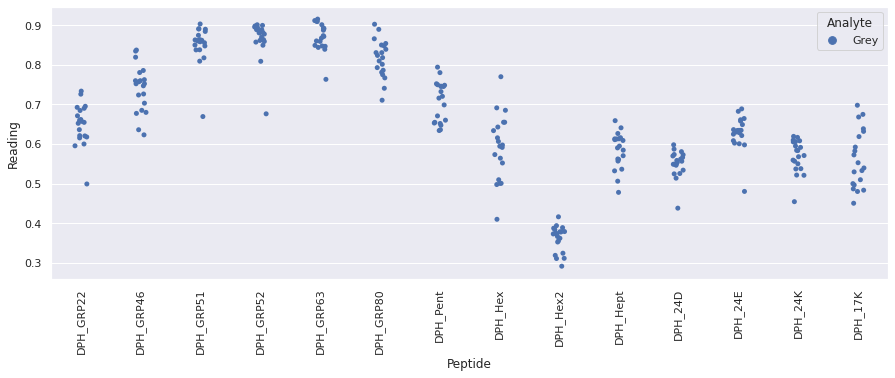

Drawing scatter plot of data spread for Grey_DevonshireR4_repeat_4 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

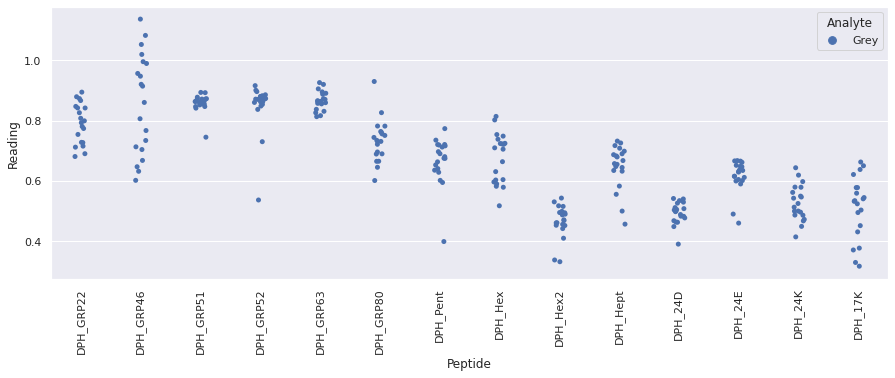

Drawing scatter plot of data spread for Grey_DevonshireR5_repeat_4 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

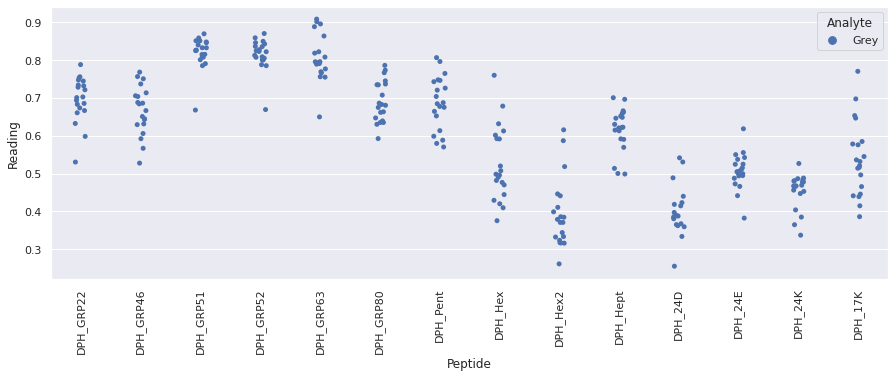

Drawing scatter plot of data spread for Grey_DevonshireR6_repeat_4 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

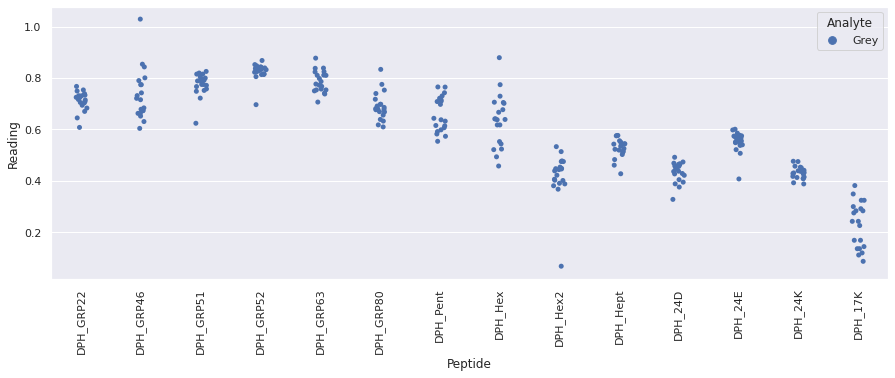

Drawing scatter plot of data spread for Black_PukkaR1_repeat_5 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

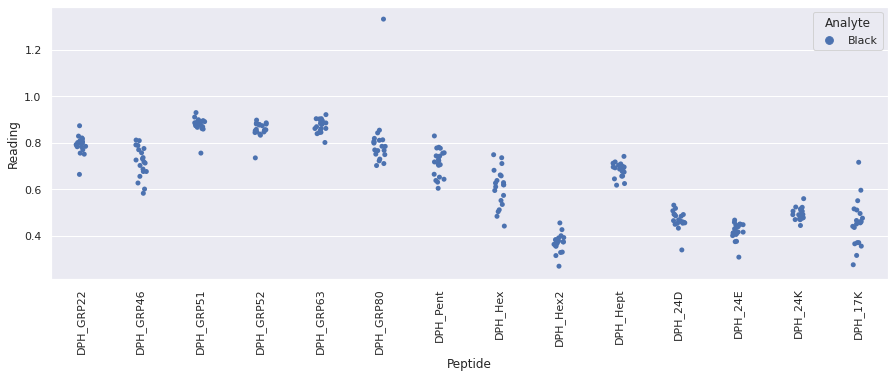

Drawing scatter plot of data spread for Black_PukkaR2_repeat_5 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

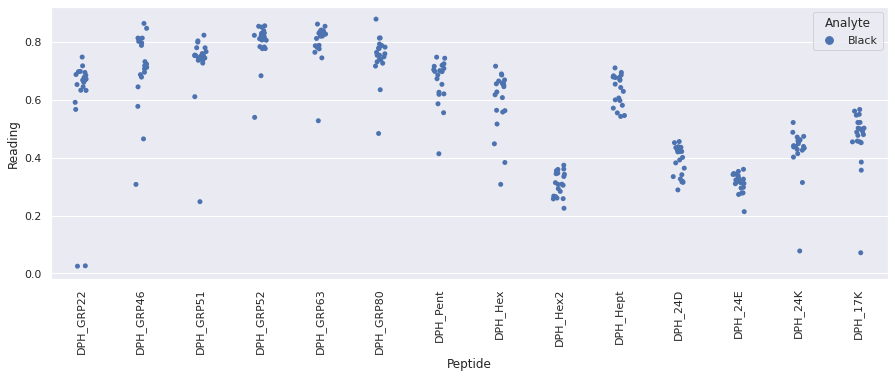

Drawing scatter plot of data spread for Black_PukkaR3_repeat_5 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

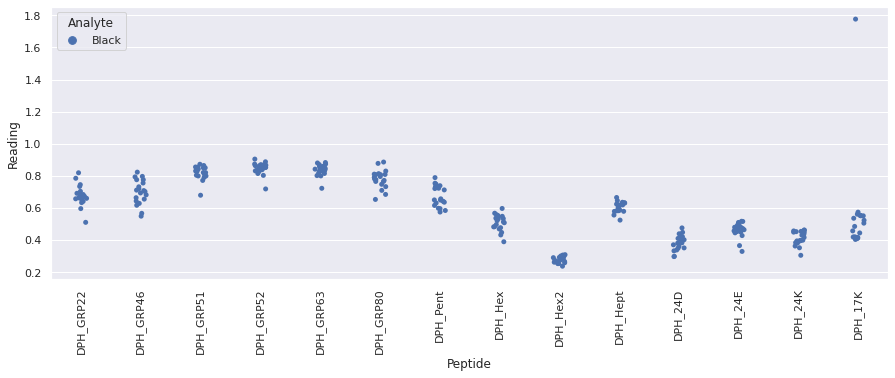

Drawing scatter plot of data spread for Black_PukkaR4_repeat_5 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

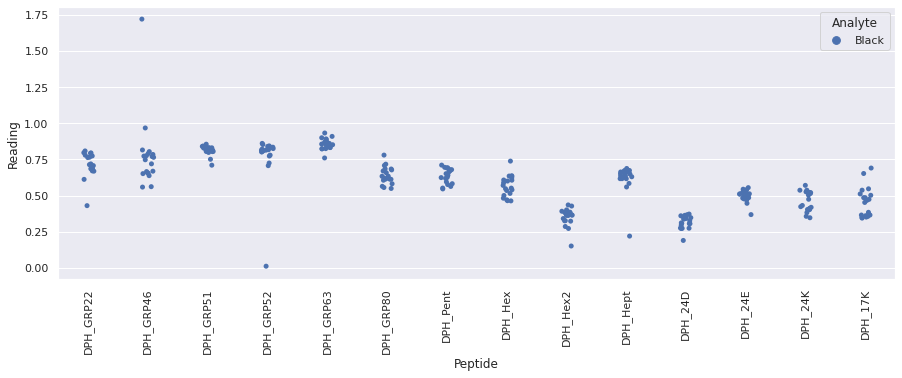

Drawing scatter plot of data spread for Black_PukkaR5_repeat_5 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

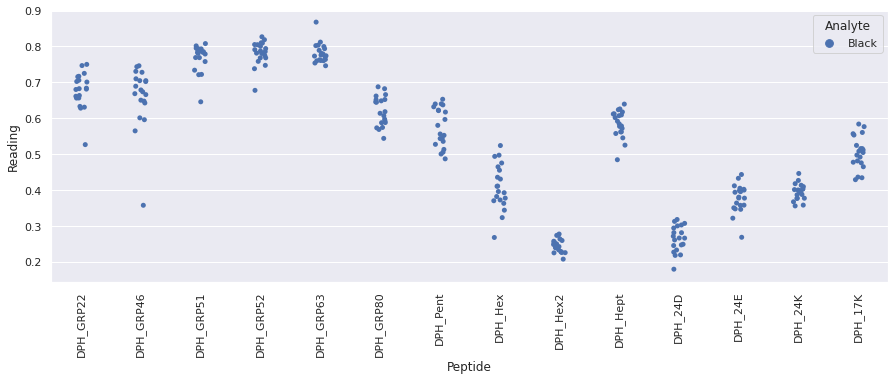

Drawing scatter plot of data spread for Black_PukkaR6_repeat_5 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

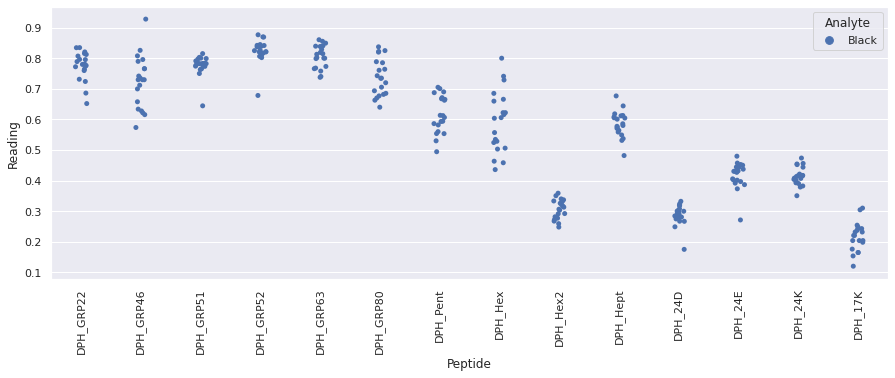

Drawing scatter plot of data spread for Green_HandbR1_repeat_5 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

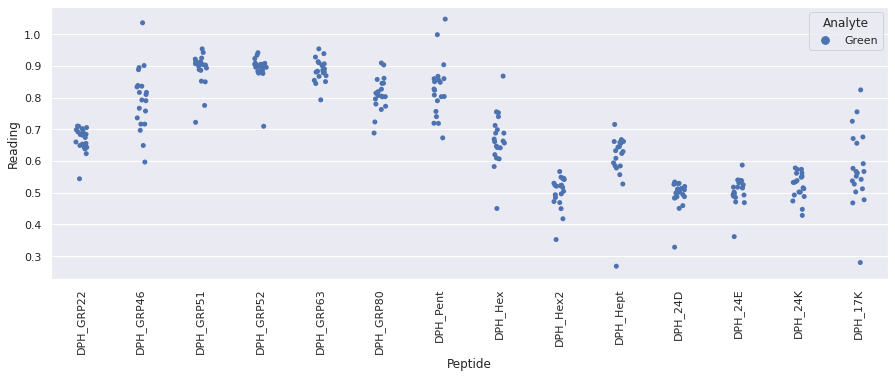

Drawing scatter plot of data spread for Green_HandbR2_repeat_5 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

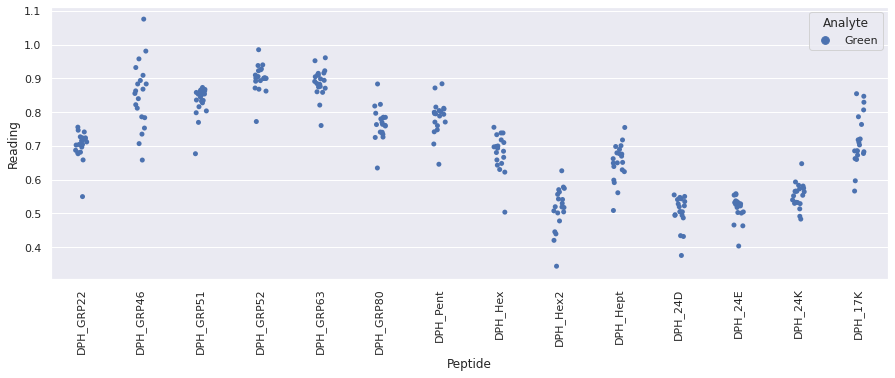

Drawing scatter plot of data spread for Green_HandbR3_repeat_5 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

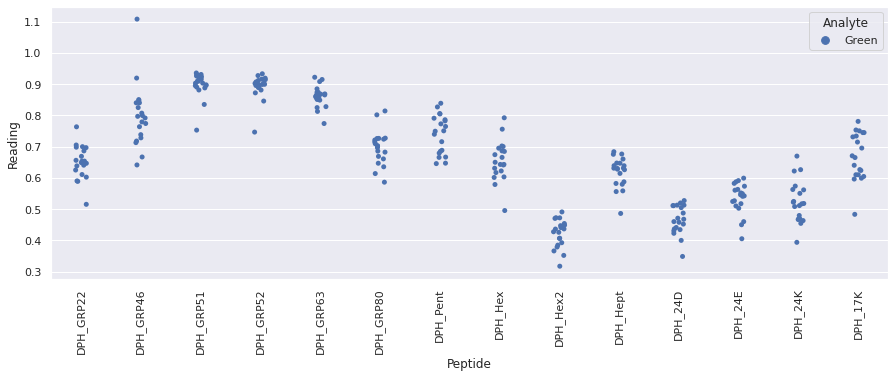

Drawing scatter plot of data spread for Green_HandbR4_repeat_5 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

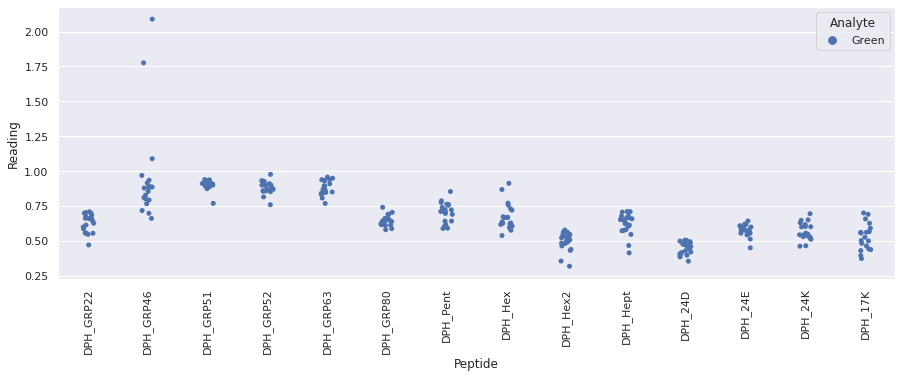

Drawing scatter plot of data spread for Green_HandbR5_repeat_5 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

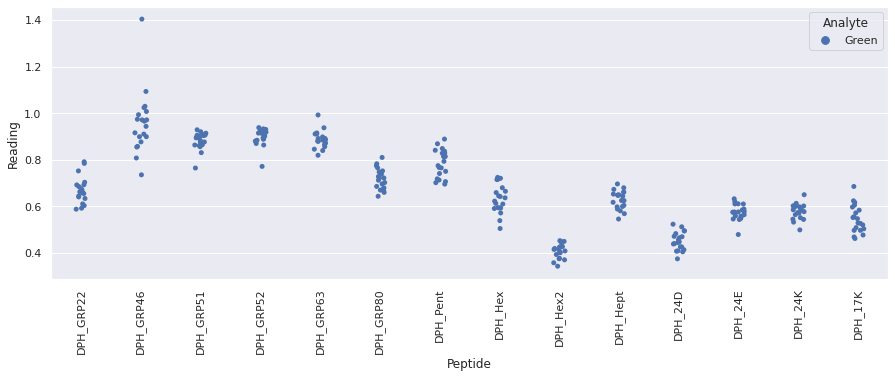

Drawing scatter plot of data spread for Green_HandbR6_repeat_5 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

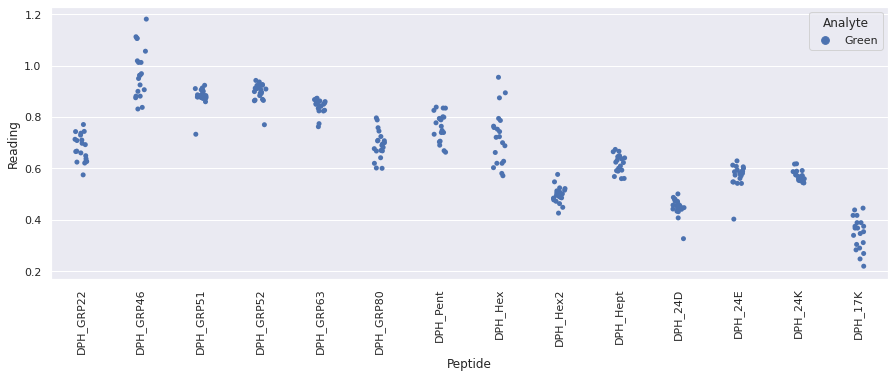

Drawing scatter plot of data spread for Grey_DiplomatR1_repeat_5 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

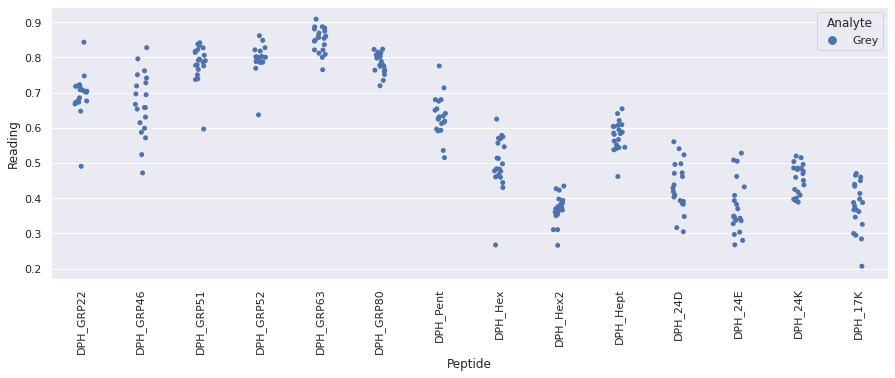

Drawing scatter plot of data spread for Grey_DiplomatR2_repeat_5 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

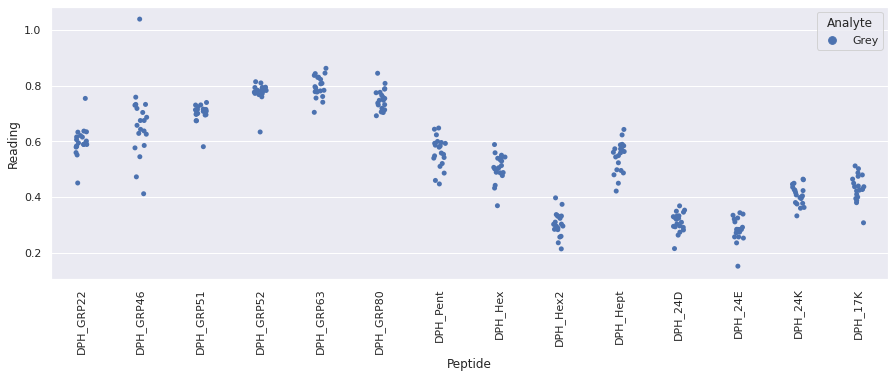

Drawing scatter plot of data spread for Grey_DiplomatR3_repeat_5 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

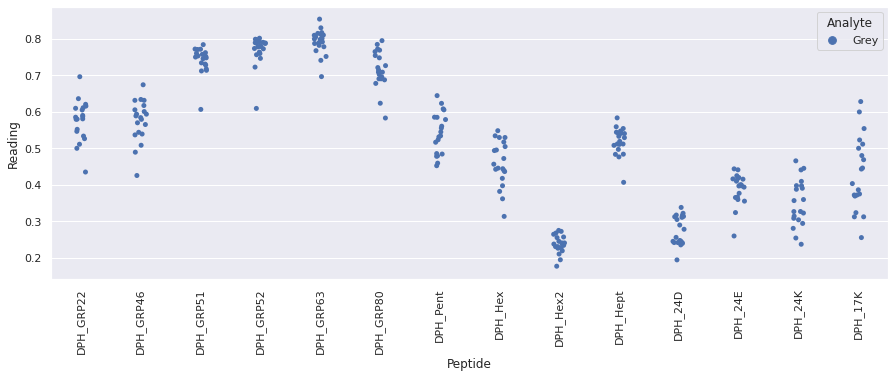

Drawing scatter plot of data spread for Grey_DiplomatR4_repeat_5 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

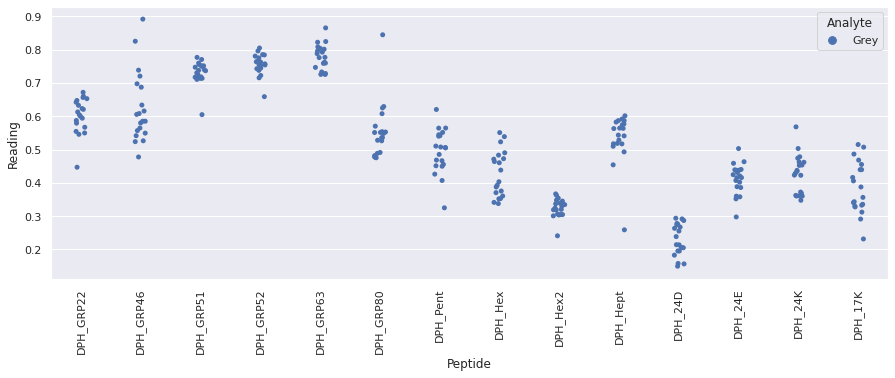

Drawing scatter plot of data spread for Grey_DiplomatR5_repeat_5 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

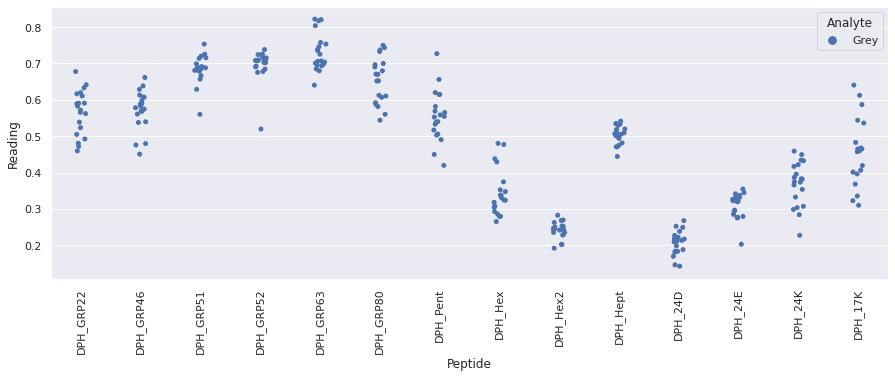

Drawing scatter plot of data spread for Grey_DiplomatR6_repeat_5 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

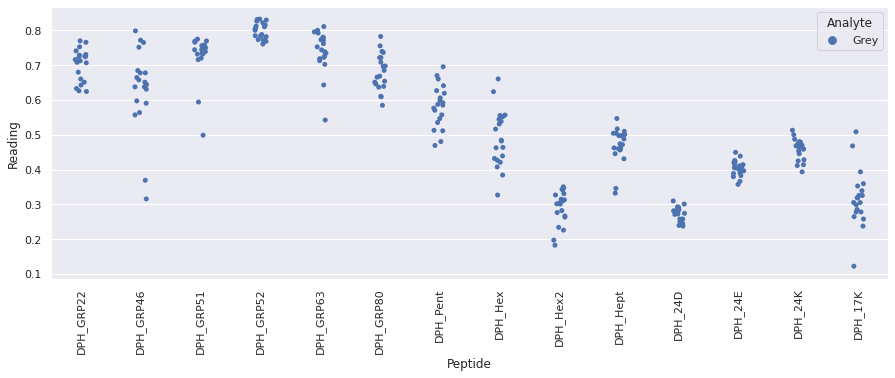

Drawing scatter plot of data spread for Black_SainsburysgoldR1_repeat_6 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

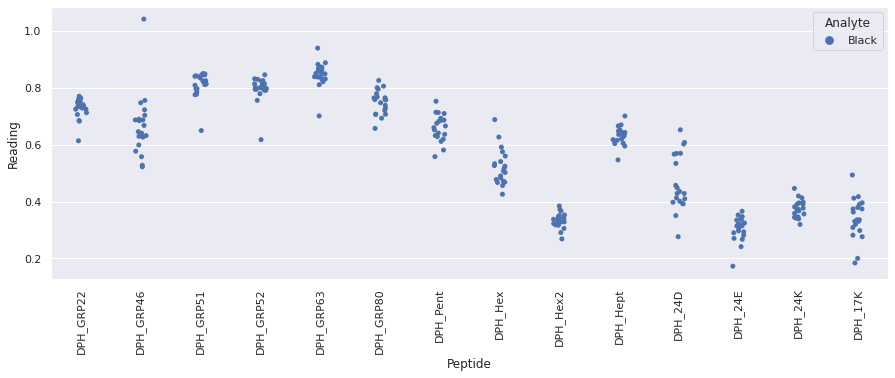

Drawing scatter plot of data spread for Black_SainsburysgoldR2_repeat_6 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

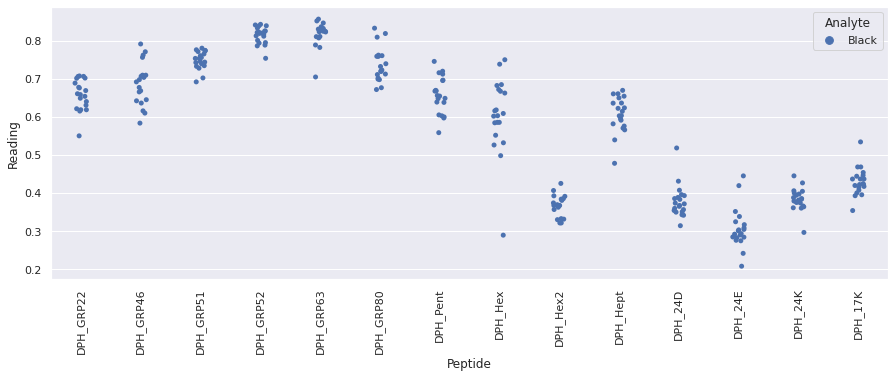

Drawing scatter plot of data spread for Black_SainsburysgoldR3_repeat_6 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

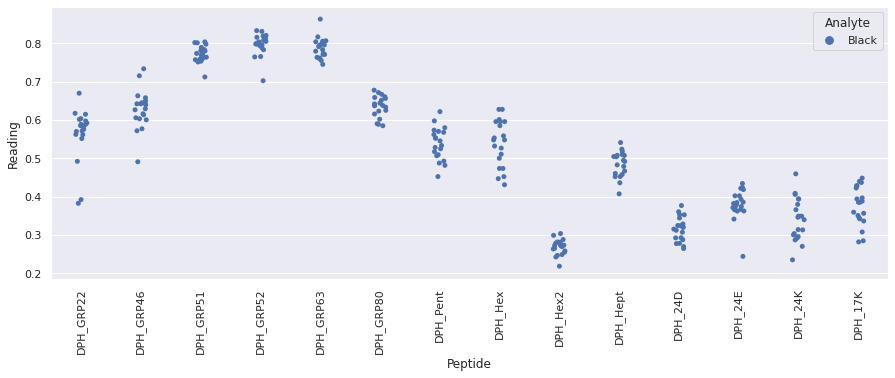

Drawing scatter plot of data spread for Black_SainsburysgoldR4_repeat_6 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

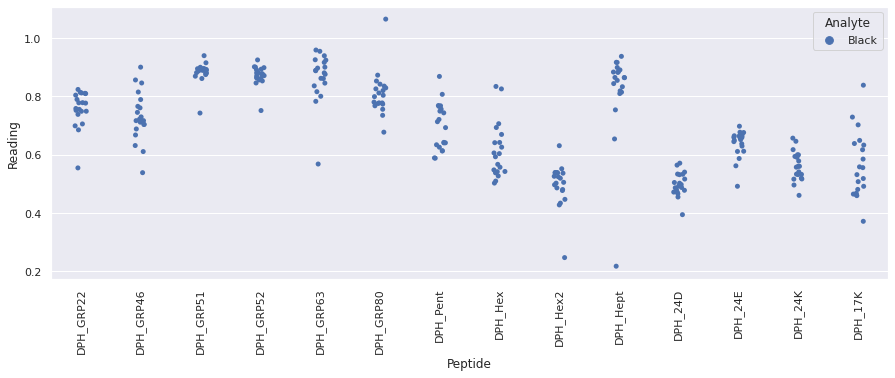

Drawing scatter plot of data spread for Black_SainsburysgoldR5_repeat_6 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

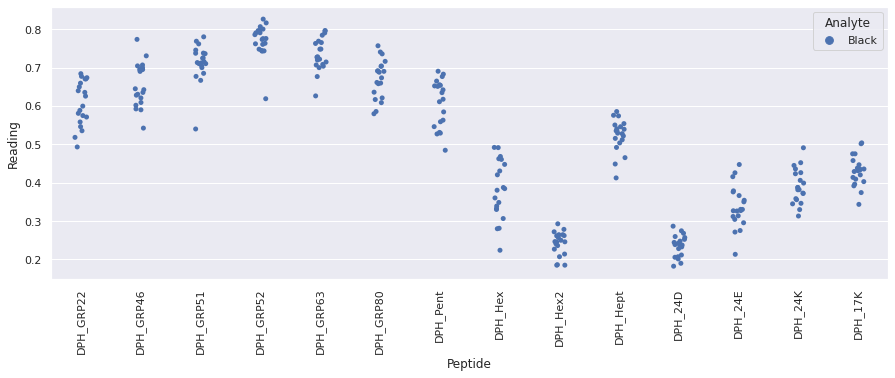

Drawing scatter plot of data spread for Black_SainsburysgoldR6_repeat_6 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

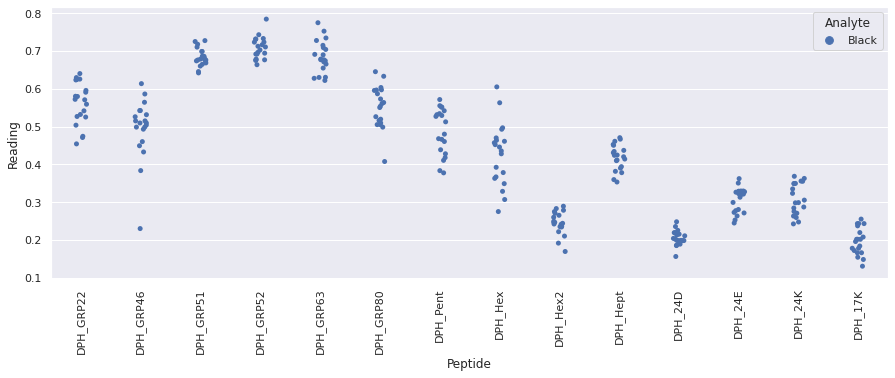

Drawing scatter plot of data spread for Green_JoesR1_repeat_6 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

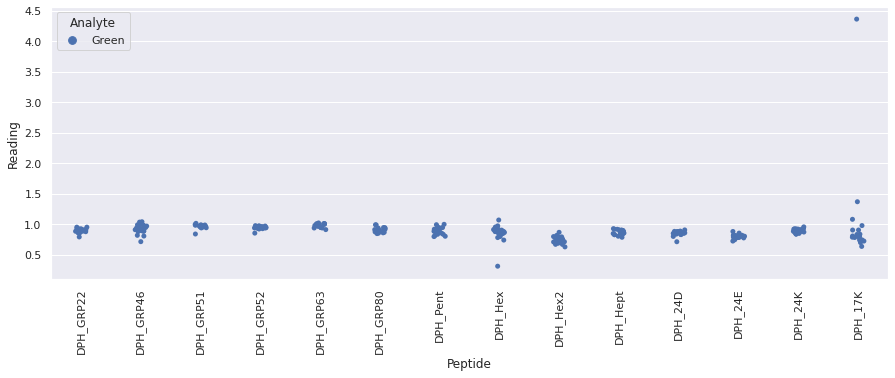

Drawing scatter plot of data spread for Green_JoesR2_repeat_6 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

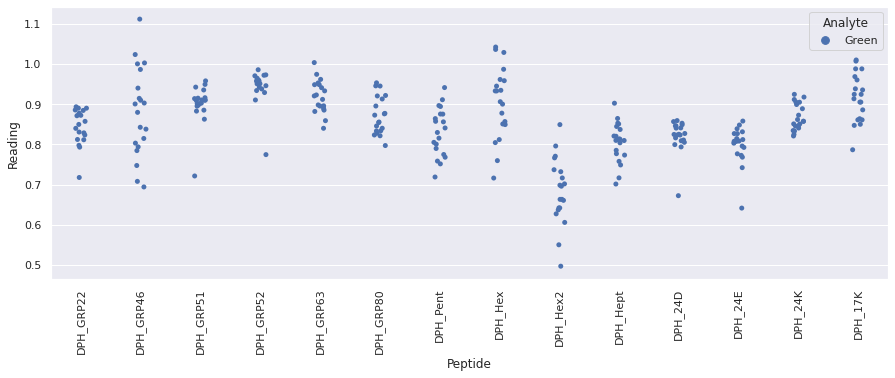

Drawing scatter plot of data spread for Green_JoesR3_repeat_6 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

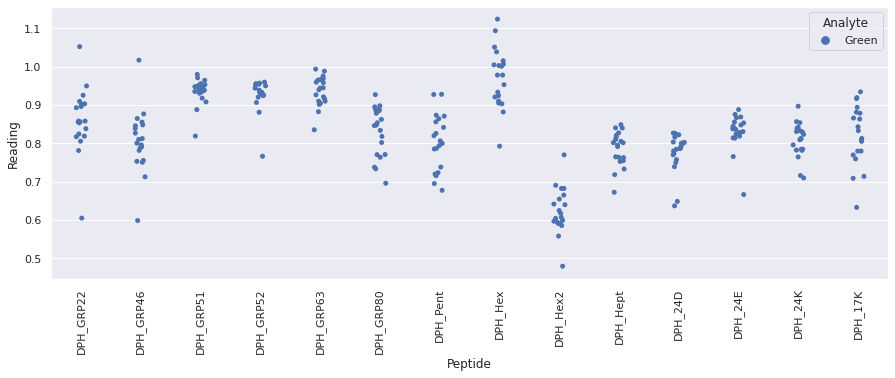

Drawing scatter plot of data spread for Green_JoesR4_repeat_6 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

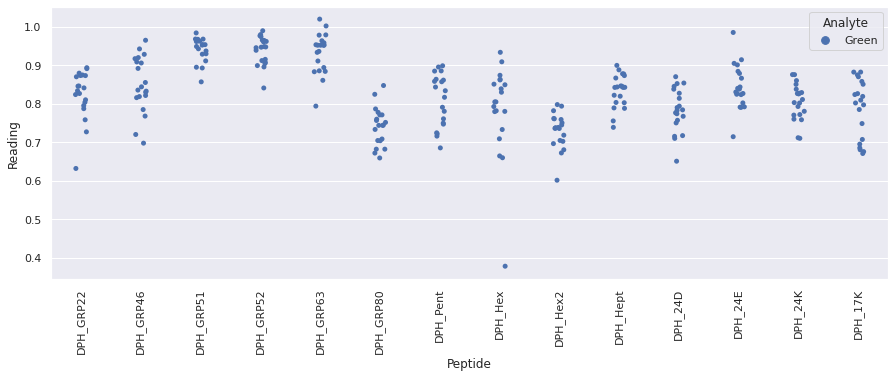

Drawing scatter plot of data spread for Green_JoesR5_repeat_6 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

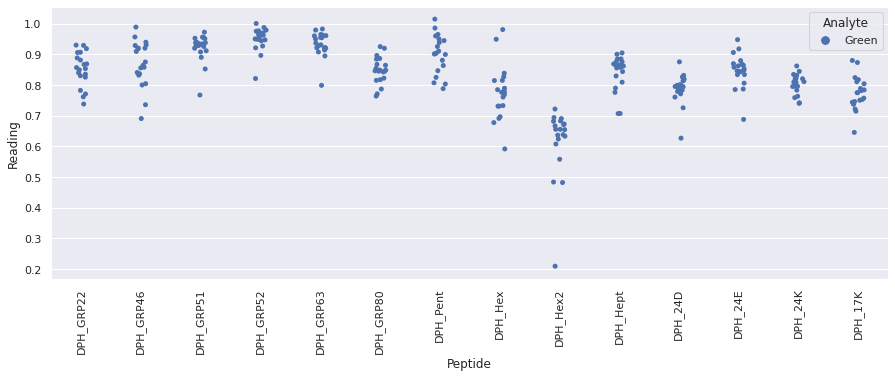

Drawing scatter plot of data spread for Green_JoesR6_repeat_6 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

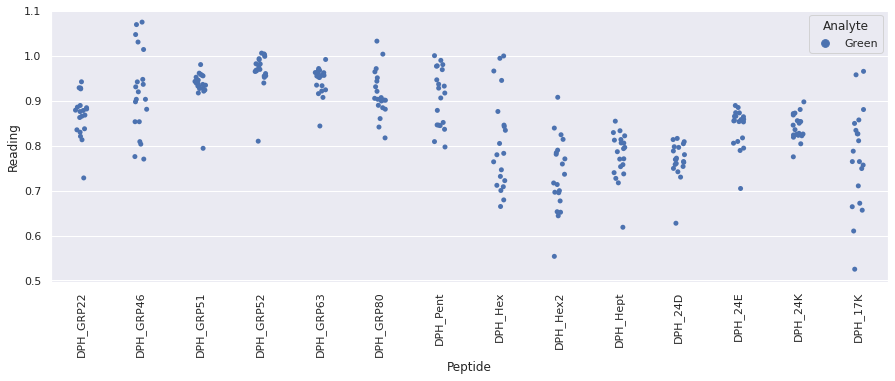

Drawing scatter plot of data spread for Grey_JoesR1_repeat_6 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

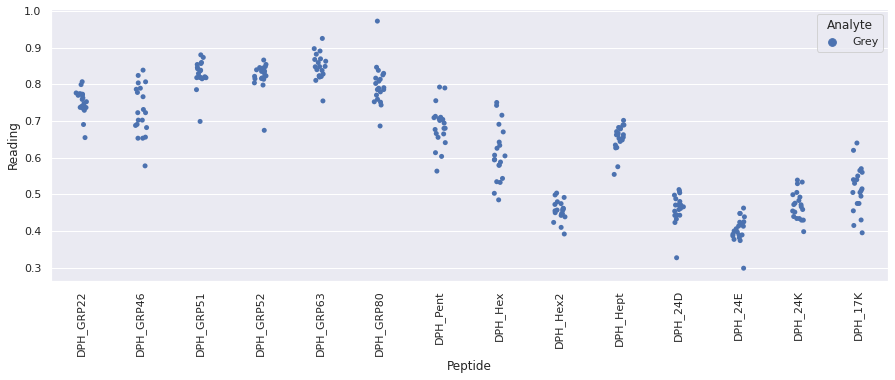

Drawing scatter plot of data spread for Grey_JoesR2_repeat_6 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

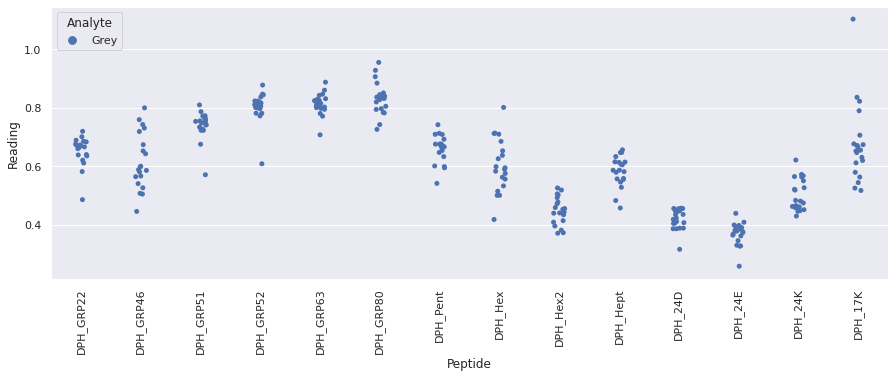

Drawing scatter plot of data spread for Grey_JoesR3_repeat_6 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

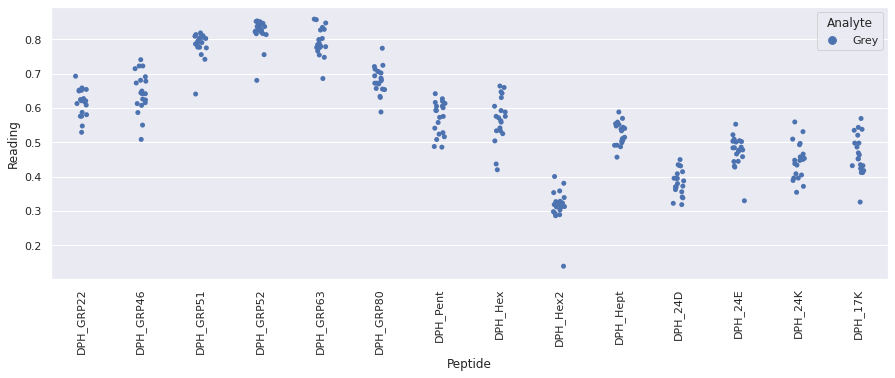

Drawing scatter plot of data spread for Grey_JoesR4_repeat_6 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

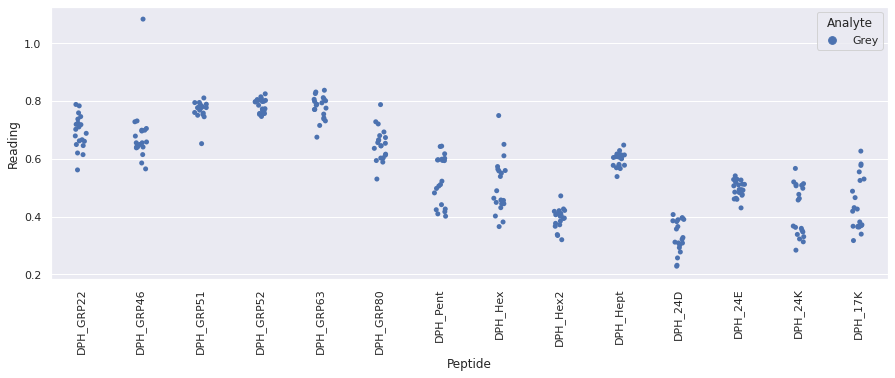

Drawing scatter plot of data spread for Grey_JoesR5_repeat_6 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

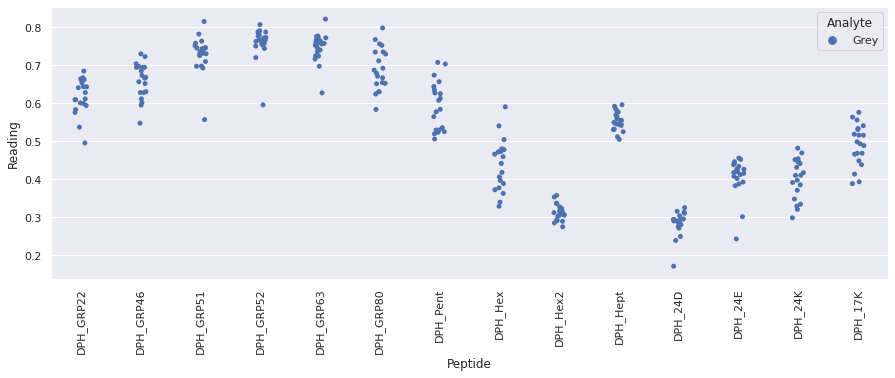

Drawing scatter plot of data spread for Grey_JoesR6_repeat_6 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

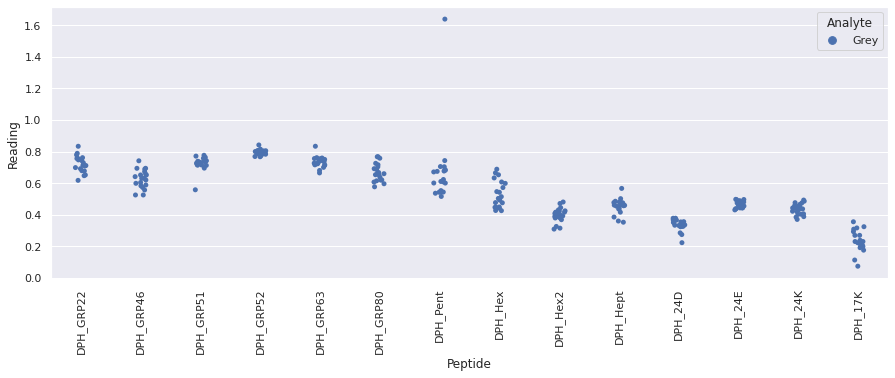

Drawing scatter plot of data spread for Black_TescoR1_repeat_7 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

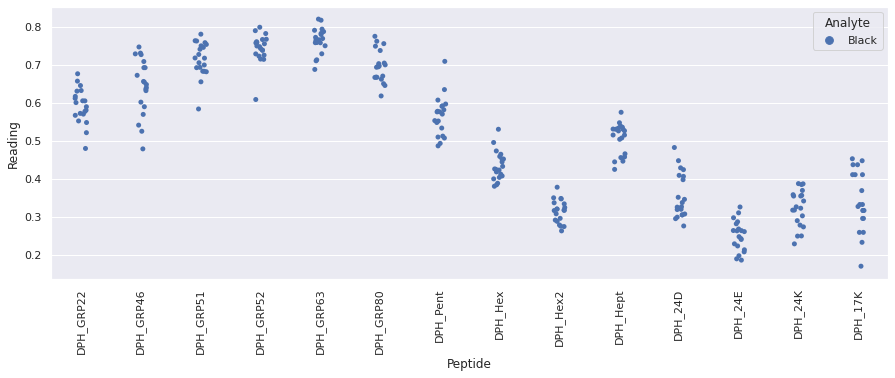

Drawing scatter plot of data spread for Black_TescoR2_repeat_7 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

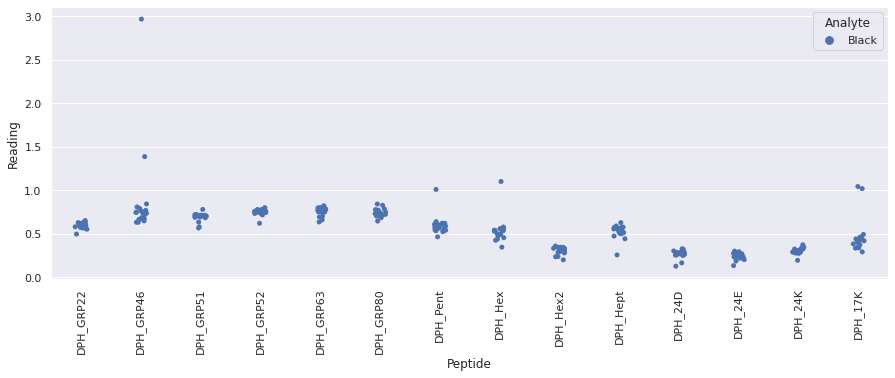

Drawing scatter plot of data spread for Black_TescoR3_repeat_7 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

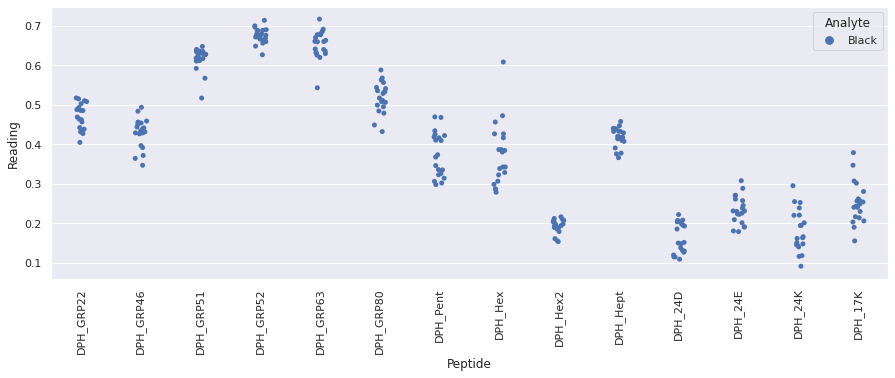

Drawing scatter plot of data spread for Black_TescoR4_repeat_7 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

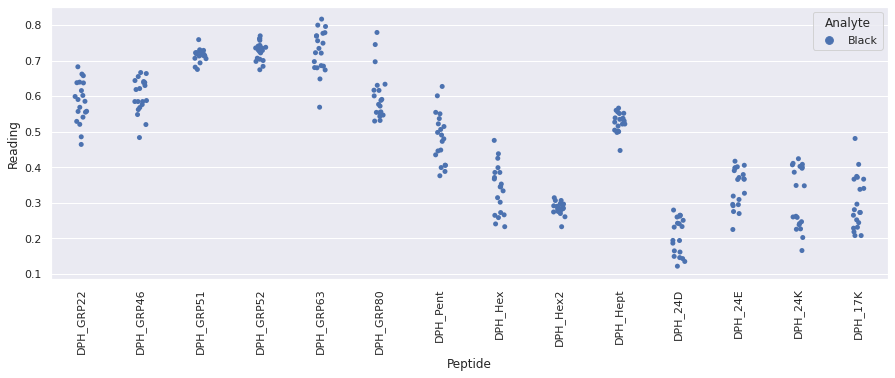

Drawing scatter plot of data spread for Black_TescoR5_repeat_7 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

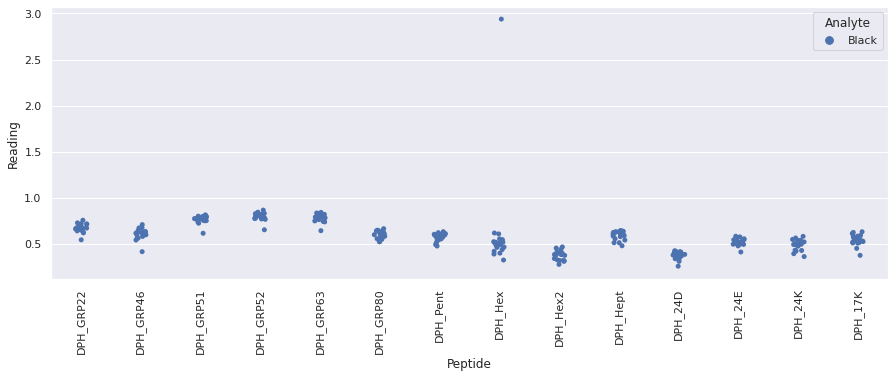

Drawing scatter plot of data spread for Black_TescoR6_repeat_7 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

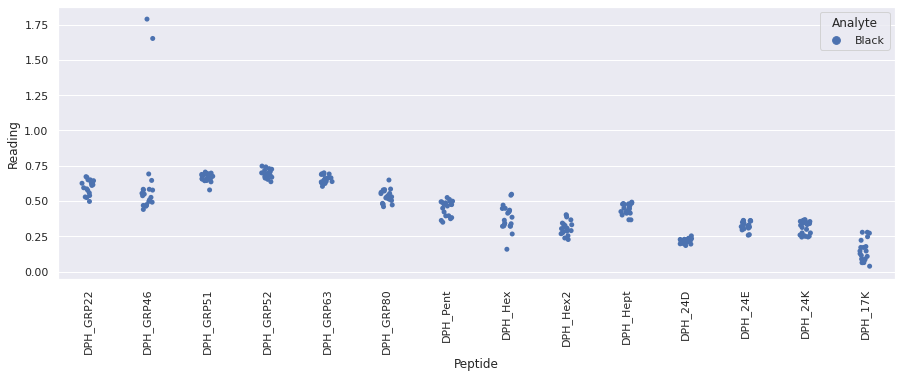

Drawing scatter plot of data spread for Green_QiR1_repeat_7 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

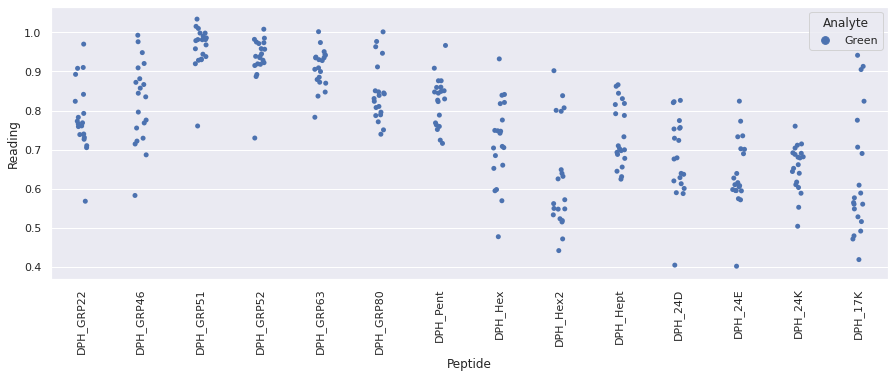

Drawing scatter plot of data spread for Green_QiR2_repeat_7 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

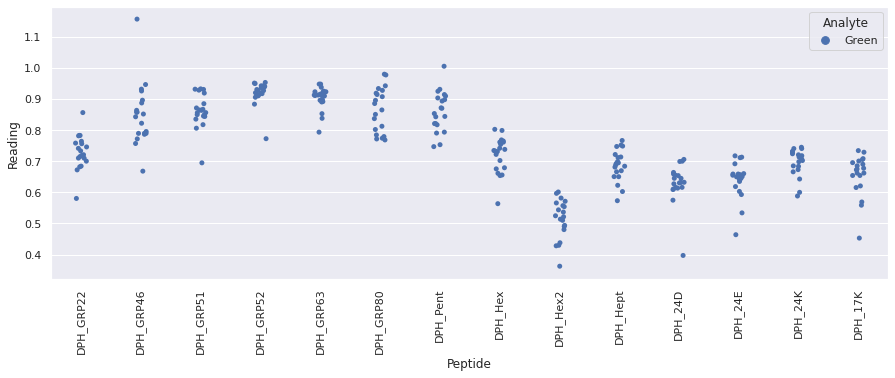

Drawing scatter plot of data spread for Green_QiR3_repeat_7 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

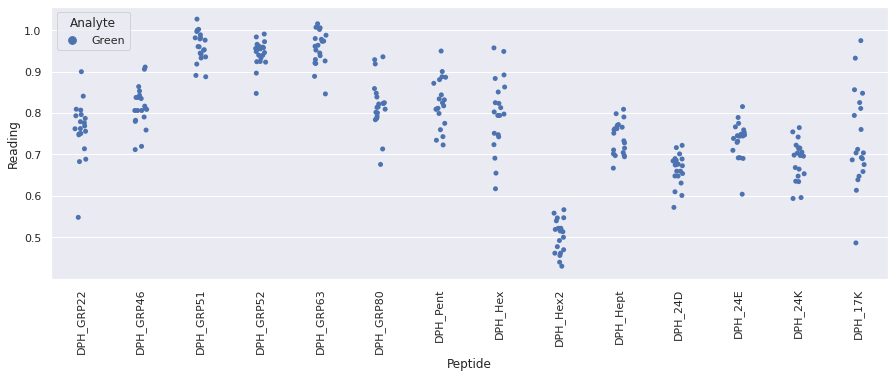

Drawing scatter plot of data spread for Green_QiR4_repeat_7 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

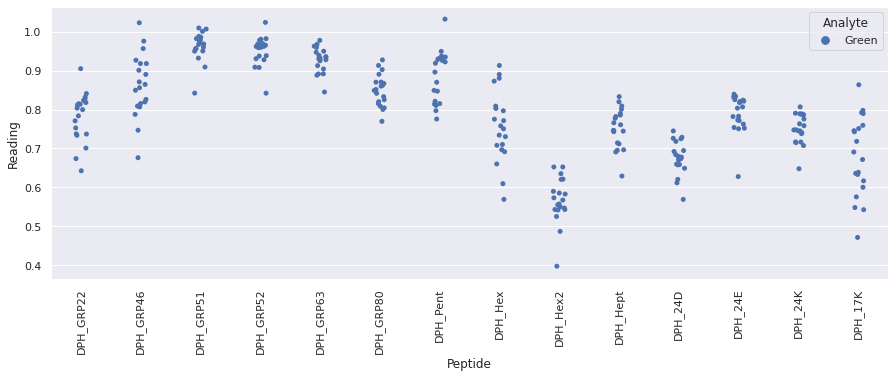

Drawing scatter plot of data spread for Green_QiR5_repeat_7 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

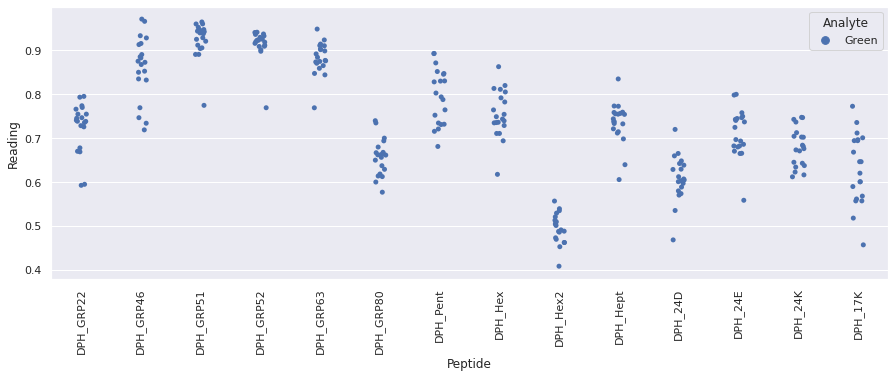

Drawing scatter plot of data spread for Green_QiR6_repeat_7 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

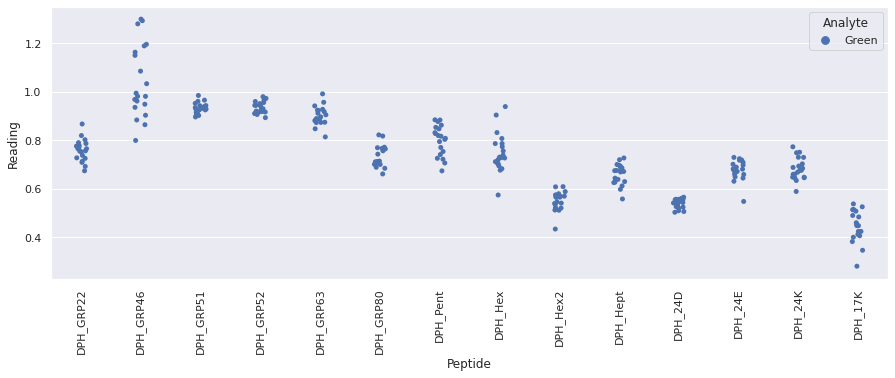

Drawing scatter plot of data spread for Grey_MandsR1_repeat_7 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

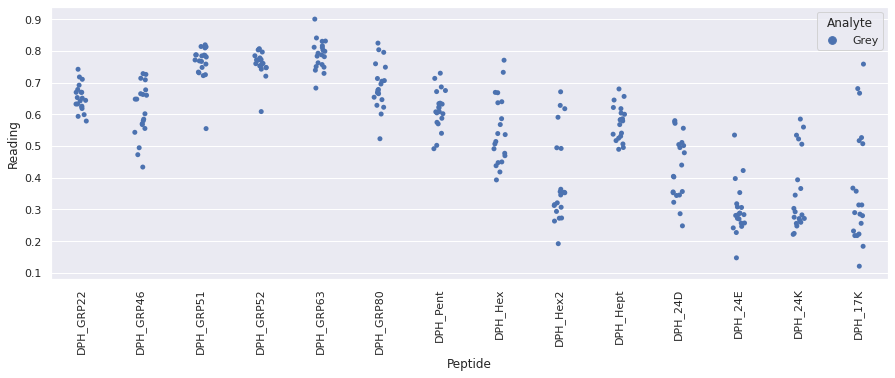

Drawing scatter plot of data spread for Grey_MandsR2_repeat_7 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

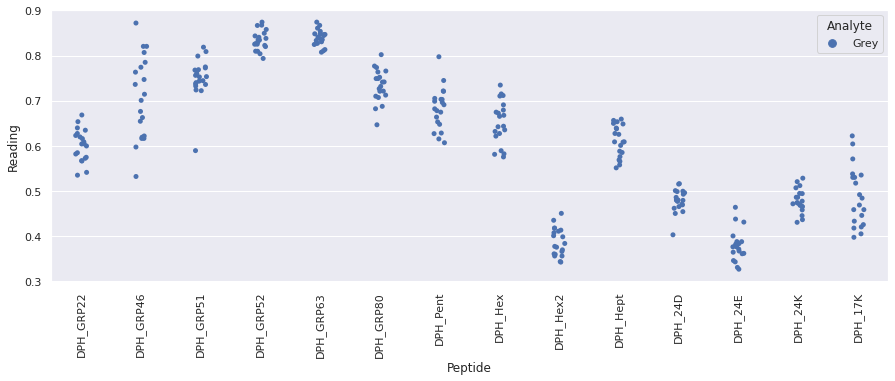

Drawing scatter plot of data spread for Grey_MandsR3_repeat_7 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

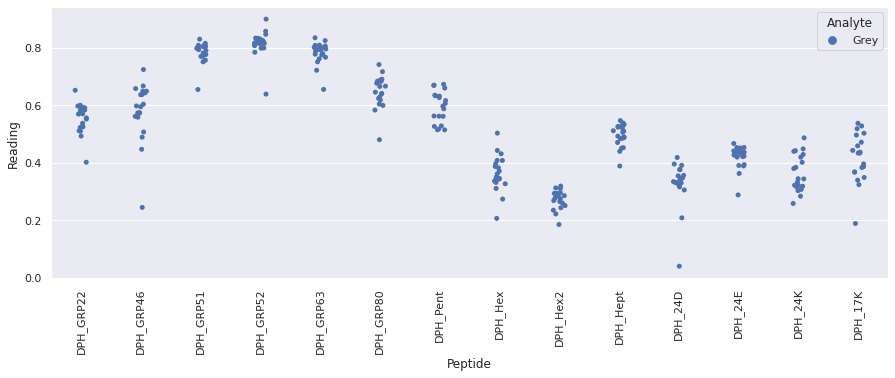

Drawing scatter plot of data spread for Grey_MandsR4_repeat_7 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

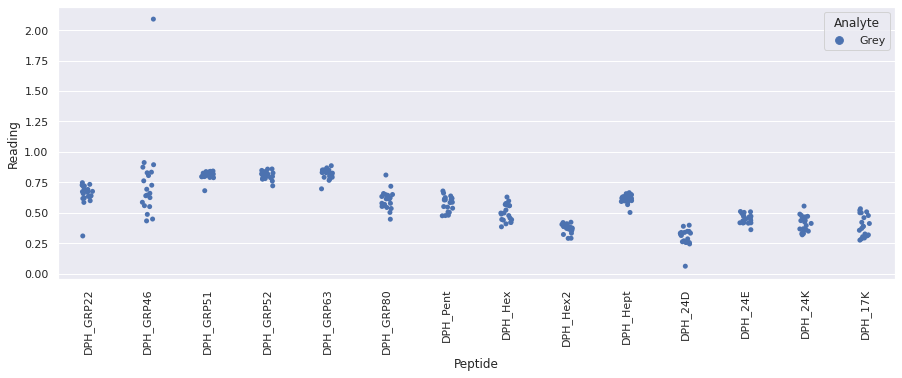

Drawing scatter plot of data spread for Grey_MandsR5_repeat_7 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

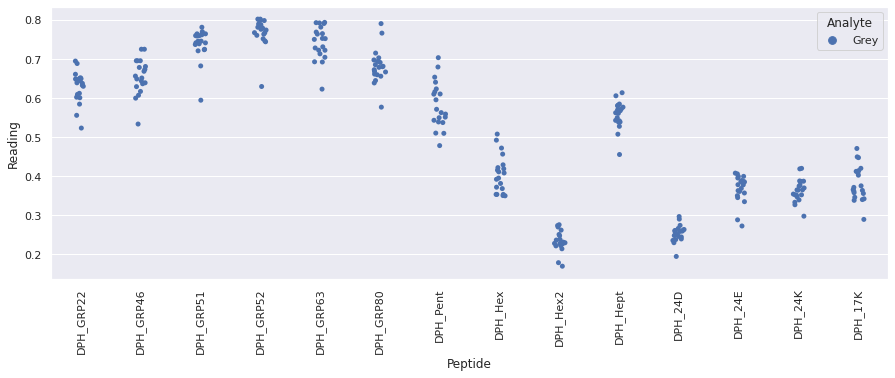

Drawing scatter plot of data spread for Grey_MandsR6_repeat_7 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

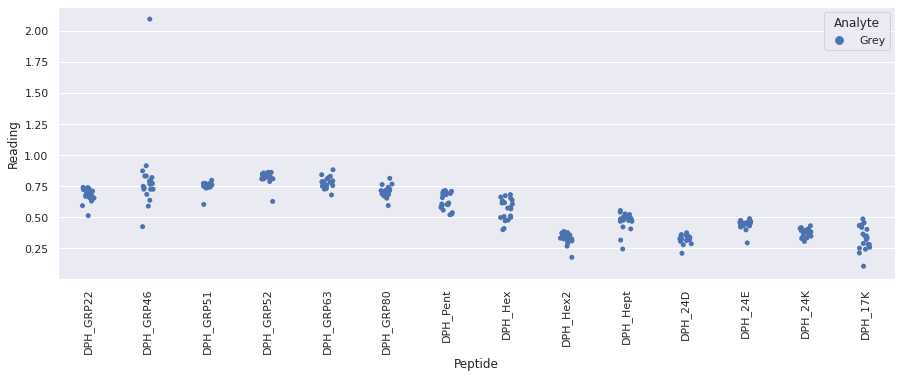

Drawing scatter plot of data spread for Black_TetleyR1_repeat_8 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

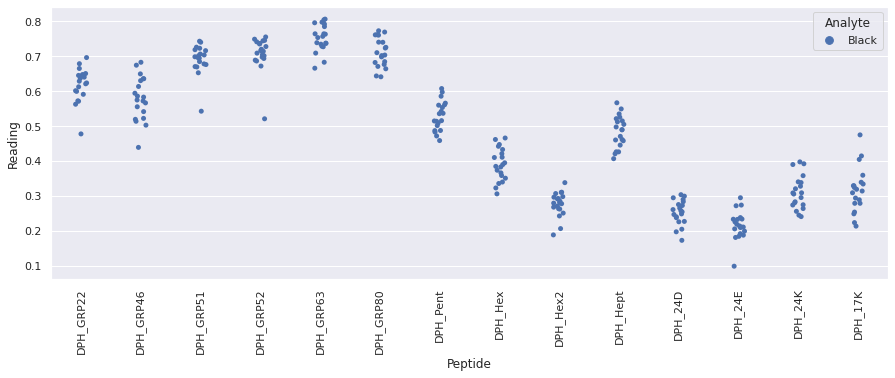

Drawing scatter plot of data spread for Black_TetleyR2_repeat_8 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

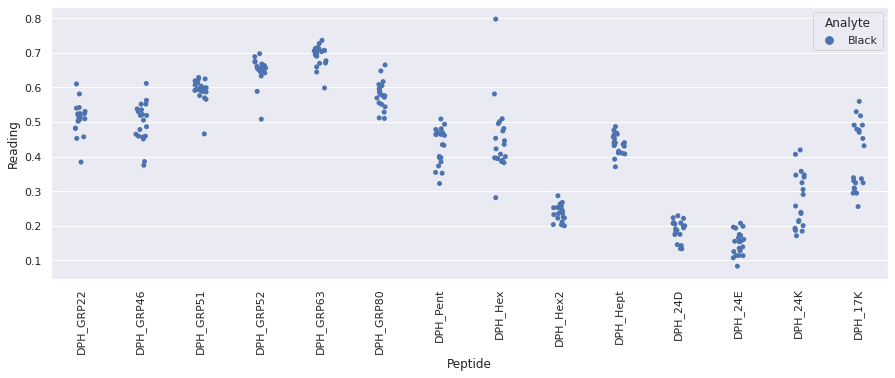

Drawing scatter plot of data spread for Black_TetleyR3_repeat_8 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

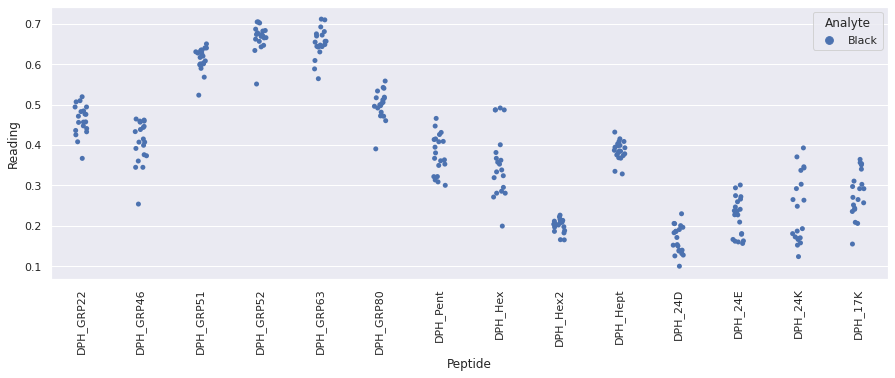

Drawing scatter plot of data spread for Black_TetleyR4_repeat_8 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

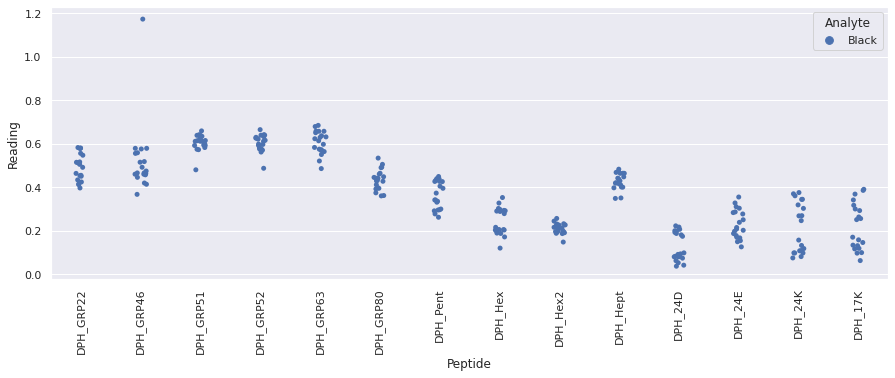

Drawing scatter plot of data spread for Black_TetleyR5_repeat_8 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

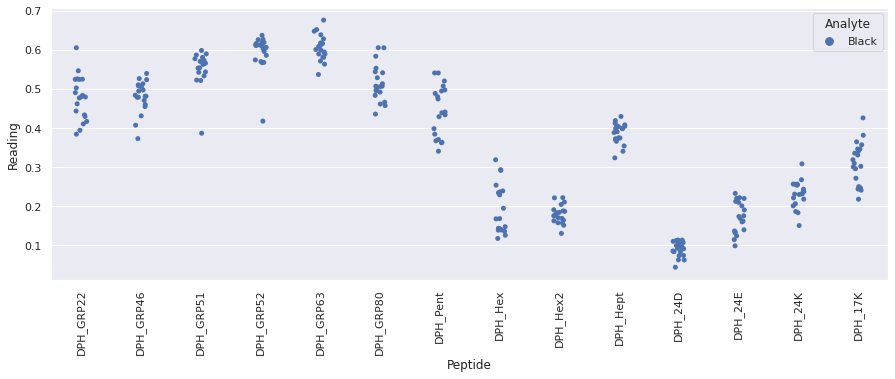

Drawing scatter plot of data spread for Black_TetleyR6_repeat_8 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

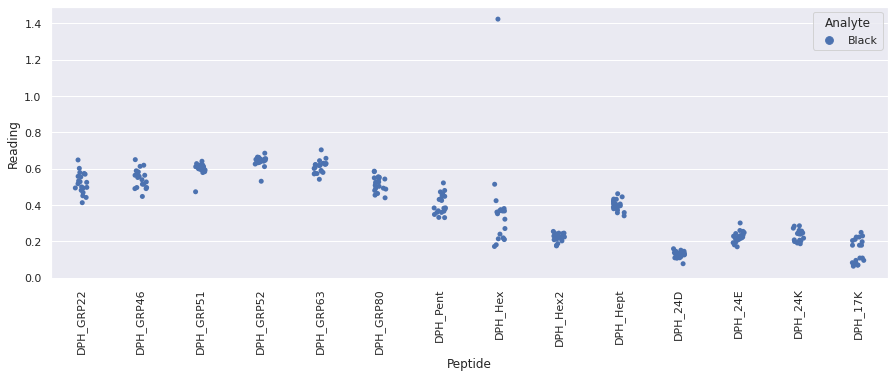

Drawing scatter plot of data spread for Green_SainsburysR1_repeat_8 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

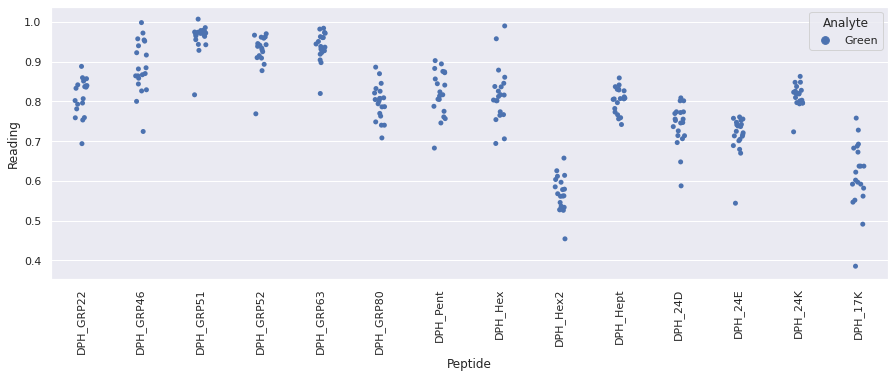

Drawing scatter plot of data spread for Green_SainsburysR2_repeat_8 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

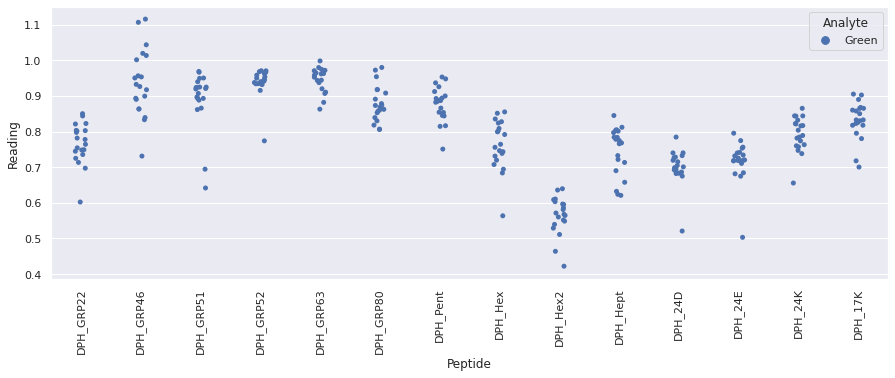

Drawing scatter plot of data spread for Green_SainsburysR3_repeat_8 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

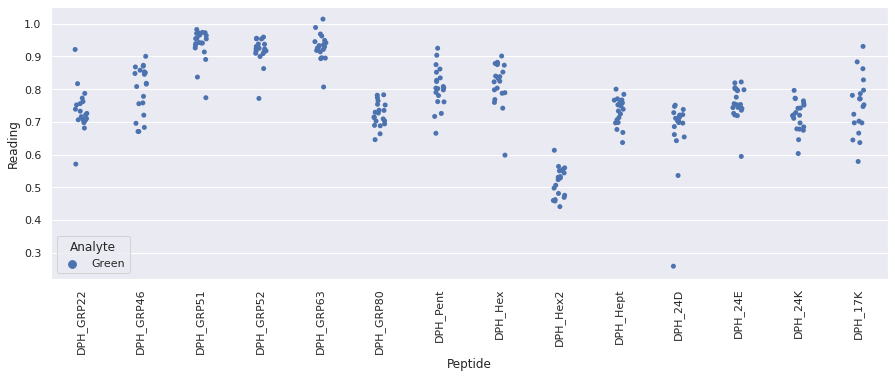

Drawing scatter plot of data spread for Green_SainsburysR4_repeat_8 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

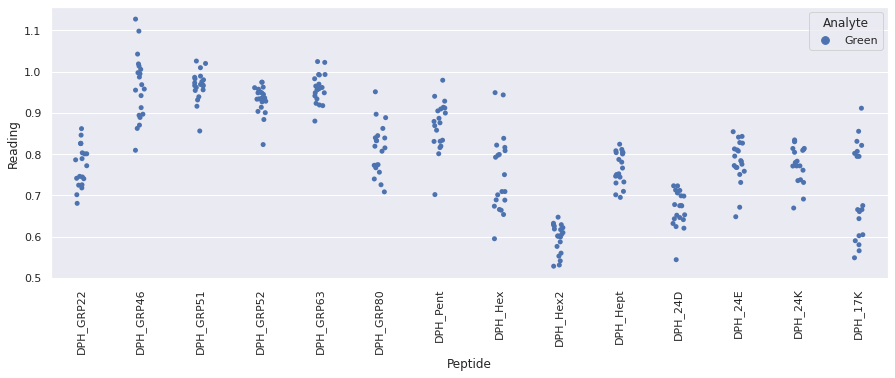

Drawing scatter plot of data spread for Green_SainsburysR5_repeat_8 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

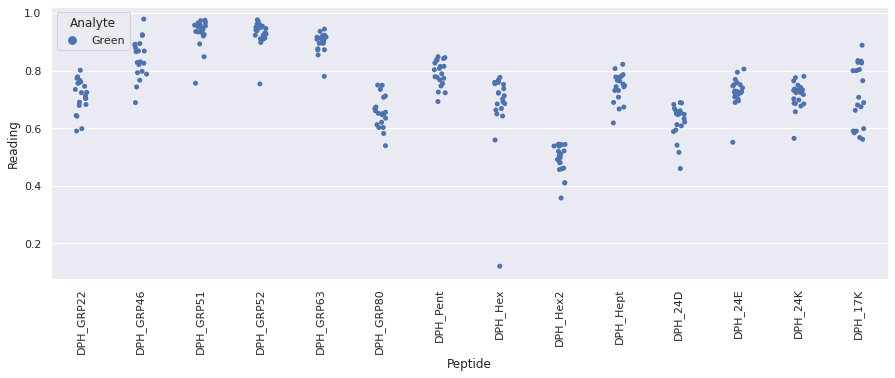

Drawing scatter plot of data spread for Green_SainsburysR6_repeat_8 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

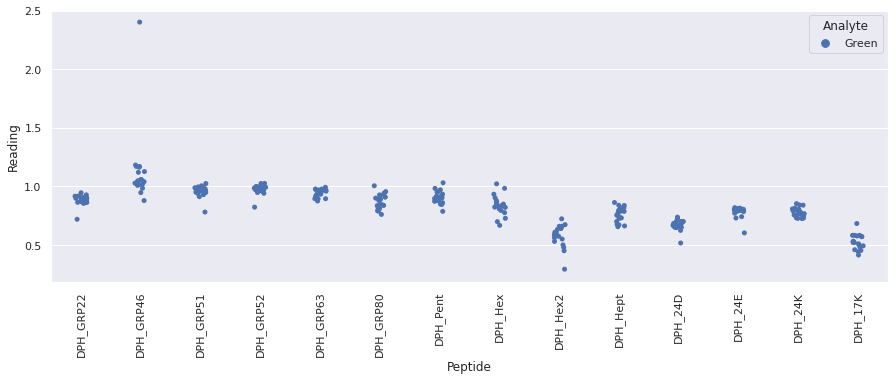

Drawing scatter plot of data spread for Grey_PukkaR1_repeat_8 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

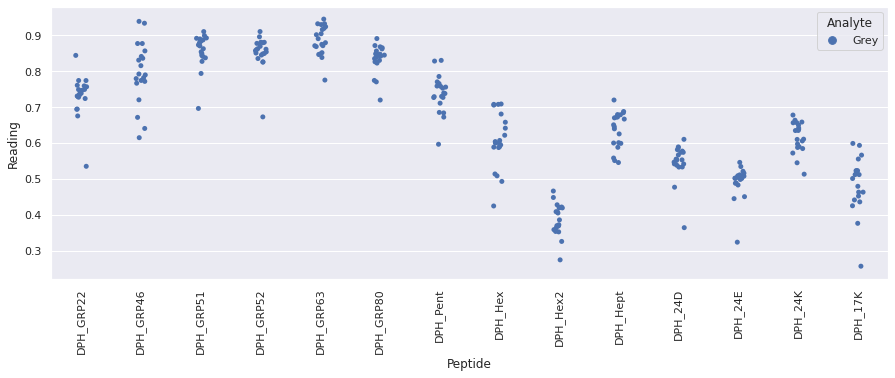

Drawing scatter plot of data spread for Grey_PukkaR2_repeat_8 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

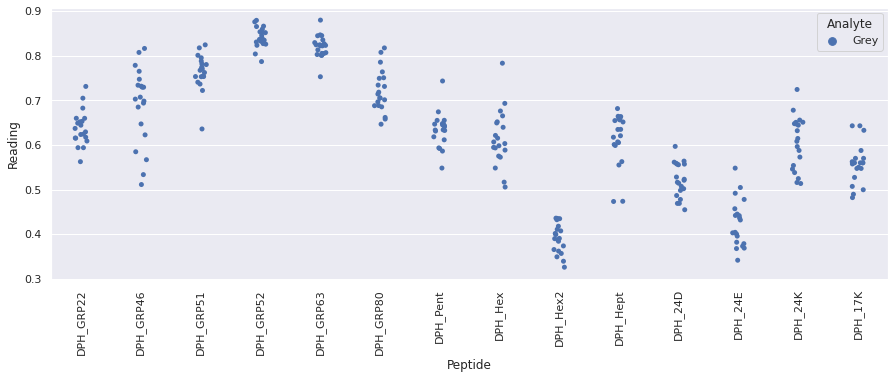

Drawing scatter plot of data spread for Grey_PukkaR3_repeat_8 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

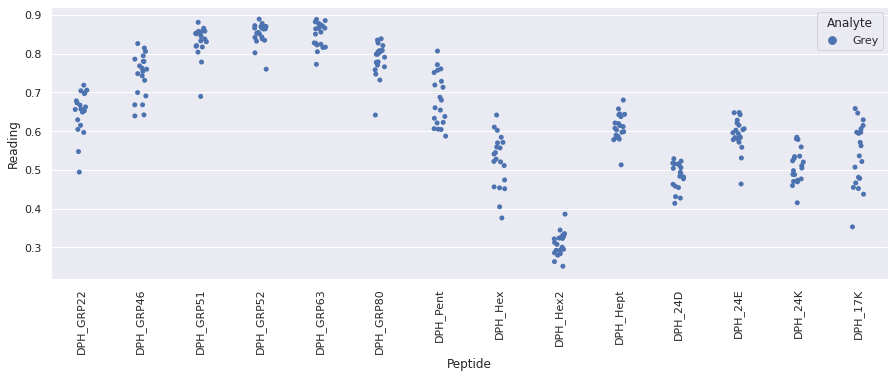

Drawing scatter plot of data spread for Grey_PukkaR4_repeat_8 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

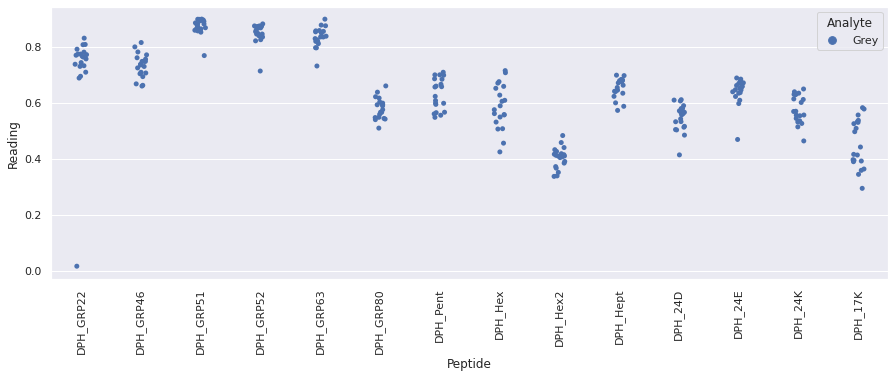

Drawing scatter plot of data spread for Grey_PukkaR5_repeat_8 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

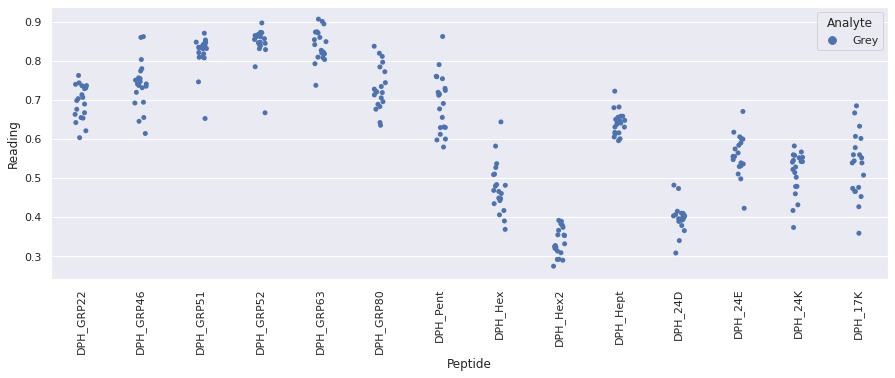

Drawing scatter plot of data spread for Grey_PukkaR6_repeat_8 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

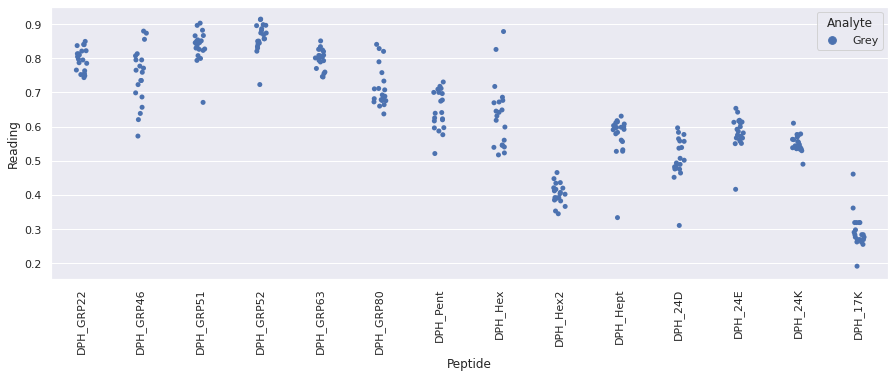

Drawing scatter plot of data spread for Black_TwiningsR1_repeat_9 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

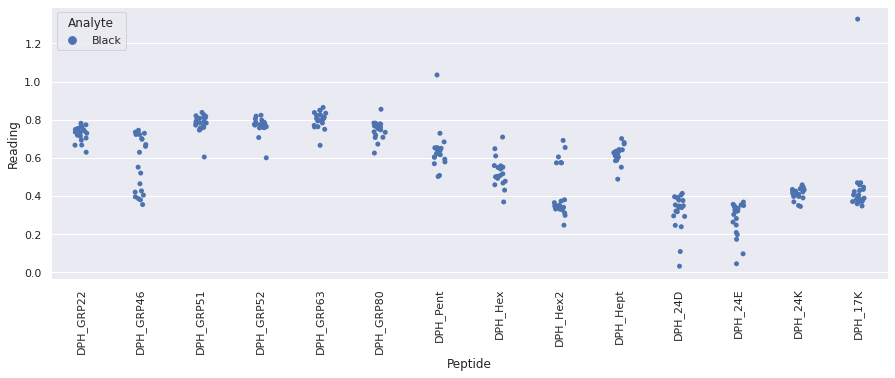

Drawing scatter plot of data spread for Black_TwiningsR2_repeat_9 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

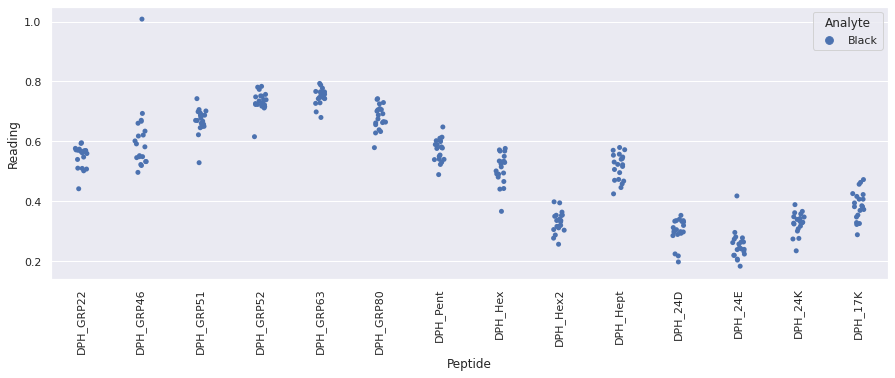

Drawing scatter plot of data spread for Black_TwiningsR3_repeat_9 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

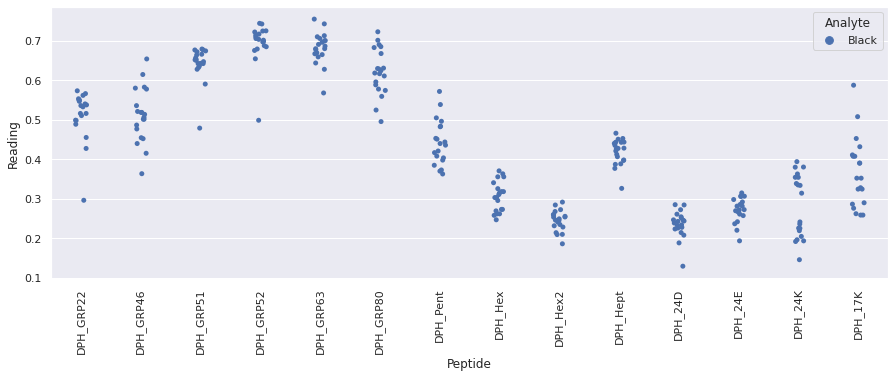

Drawing scatter plot of data spread for Black_TwiningsR4_repeat_9 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

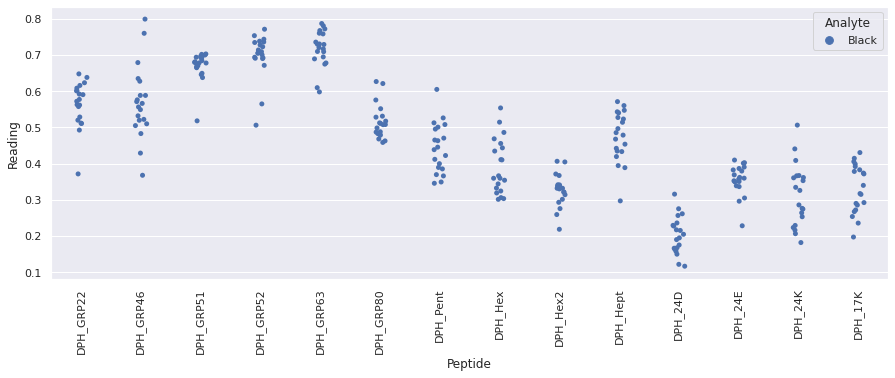

Drawing scatter plot of data spread for Black_TwiningsR5_repeat_9 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

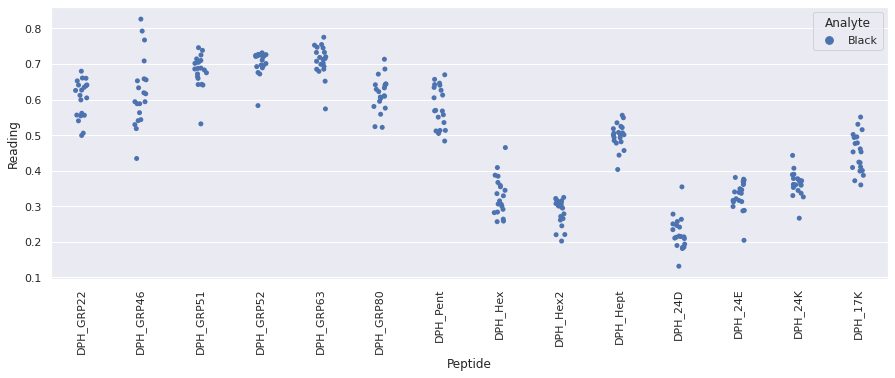

Drawing scatter plot of data spread for Black_TwiningsR6_repeat_9 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

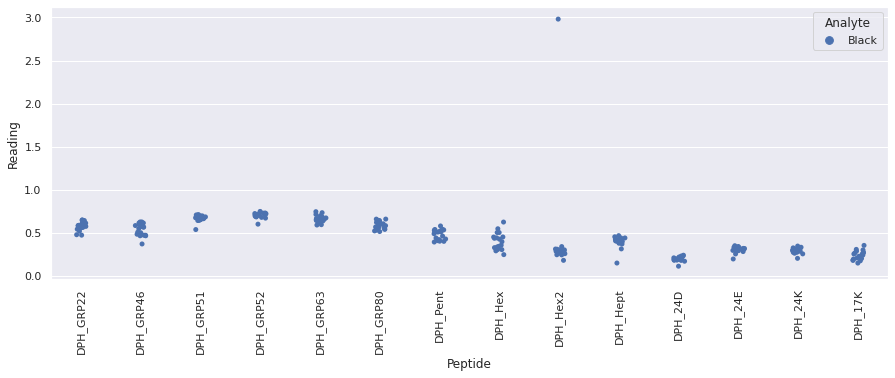

Drawing scatter plot of data spread for Green_TetleyR1_repeat_9 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

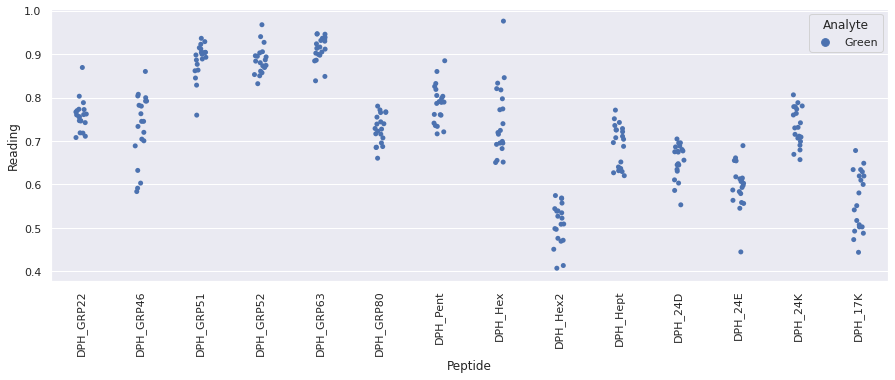

Drawing scatter plot of data spread for Green_TetleyR2_repeat_9 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

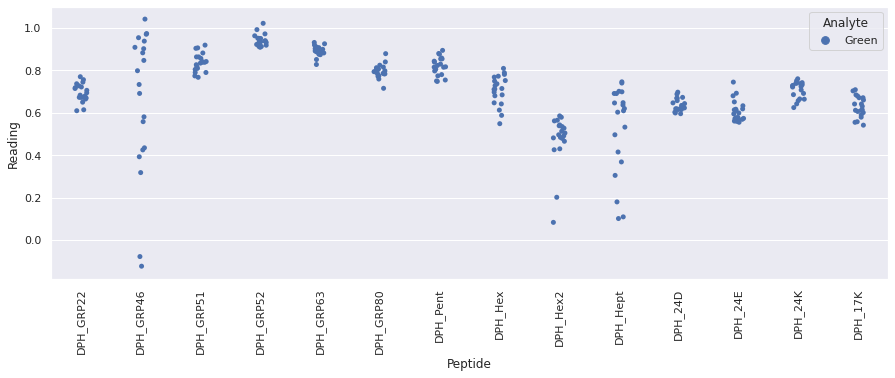

Drawing scatter plot of data spread for Green_TetleyR3_repeat_9 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

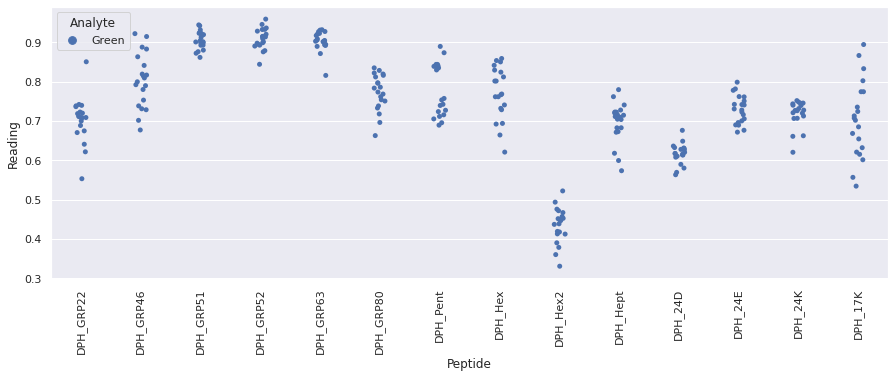

Drawing scatter plot of data spread for Green_TetleyR4_repeat_9 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

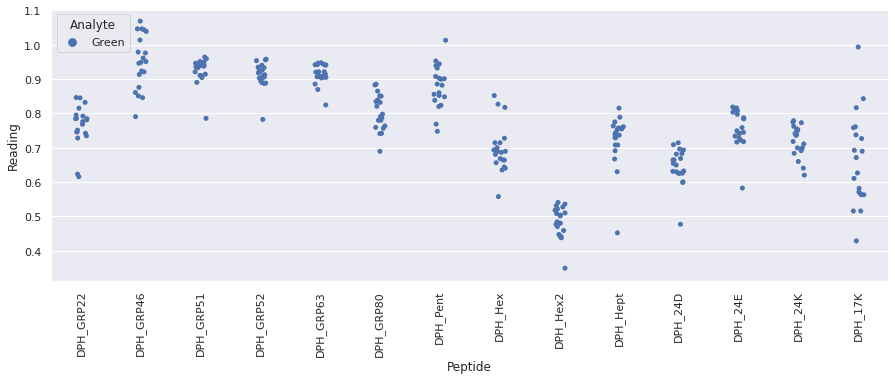

Drawing scatter plot of data spread for Green_TetleyR5_repeat_9 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

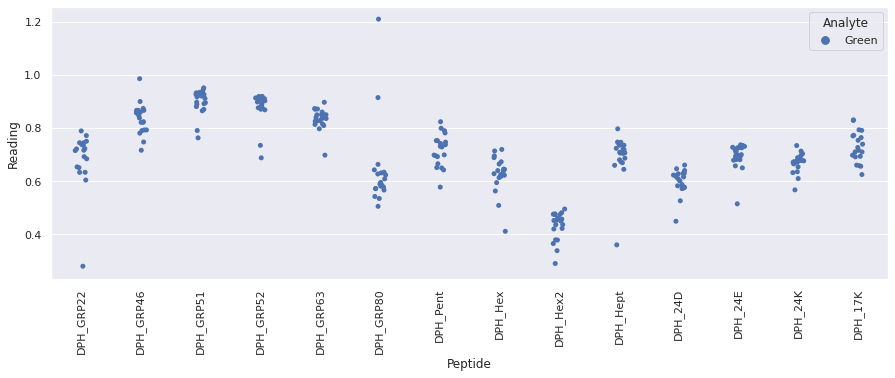

Drawing scatter plot of data spread for Green_TetleyR6_repeat_9 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

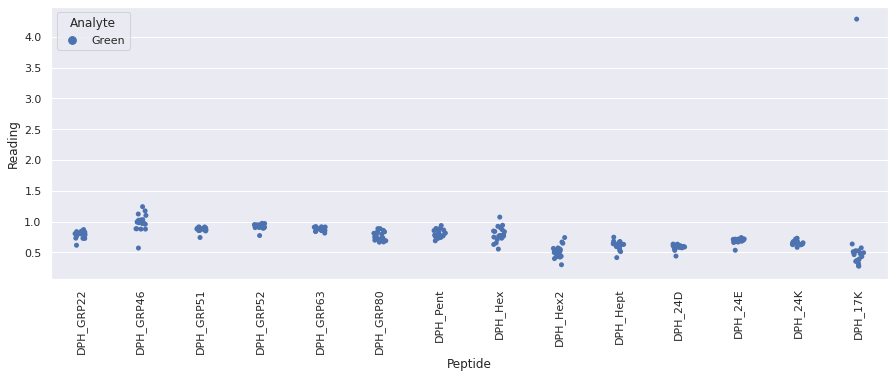

Drawing scatter plot of data spread for Grey_TescoR1_repeat_9 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

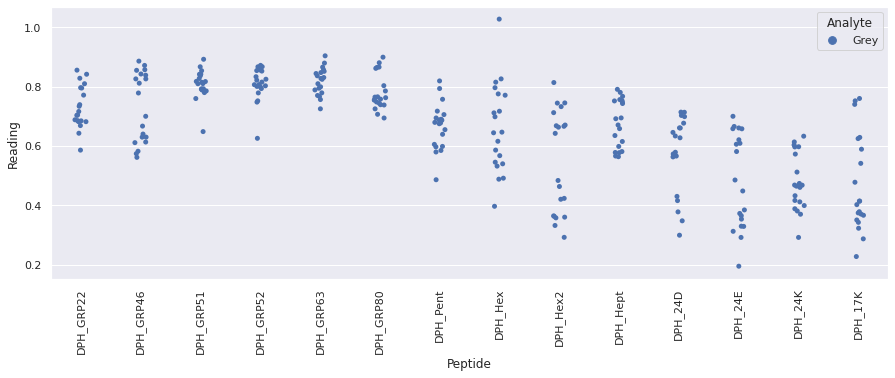

Drawing scatter plot of data spread for Grey_TescoR2_repeat_9 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

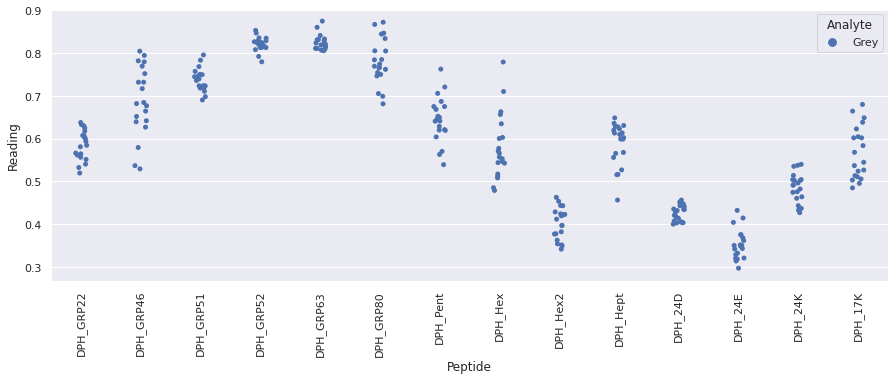

Drawing scatter plot of data spread for Grey_TescoR3_repeat_9 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

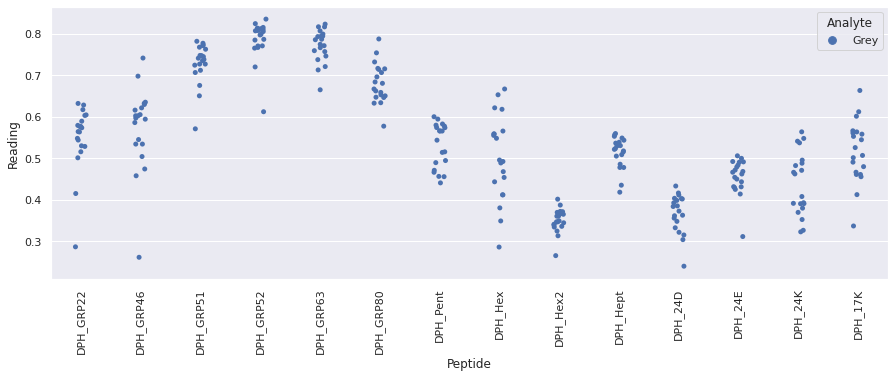

Drawing scatter plot of data spread for Grey_TescoR4_repeat_9 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

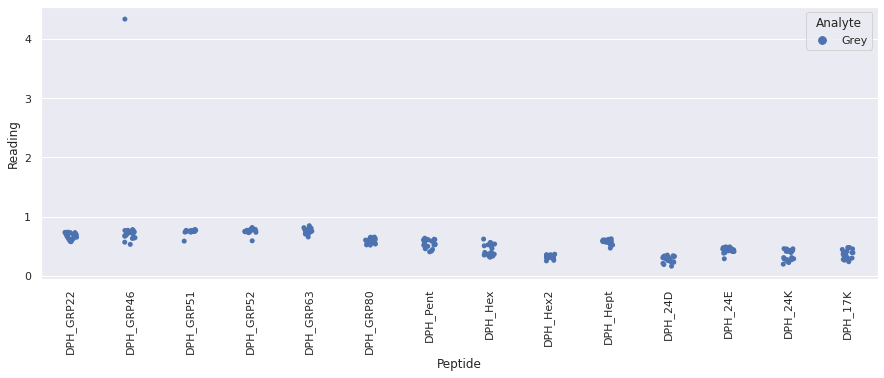

Drawing scatter plot of data spread for Grey_TescoR5_repeat_9 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

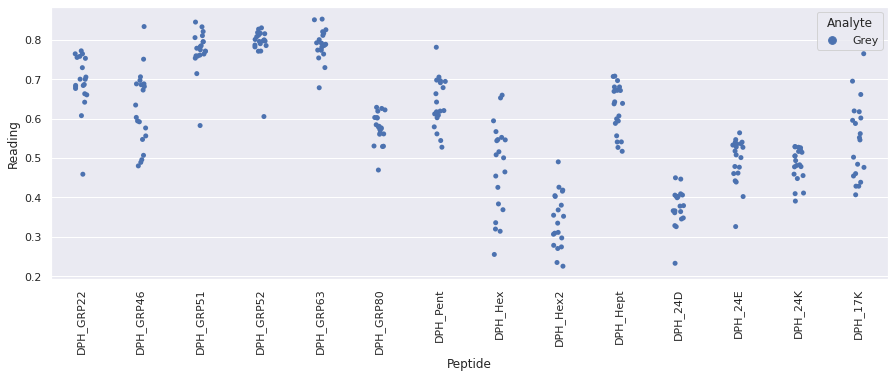

Drawing scatter plot of data spread for Grey_TescoR6_repeat_9 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

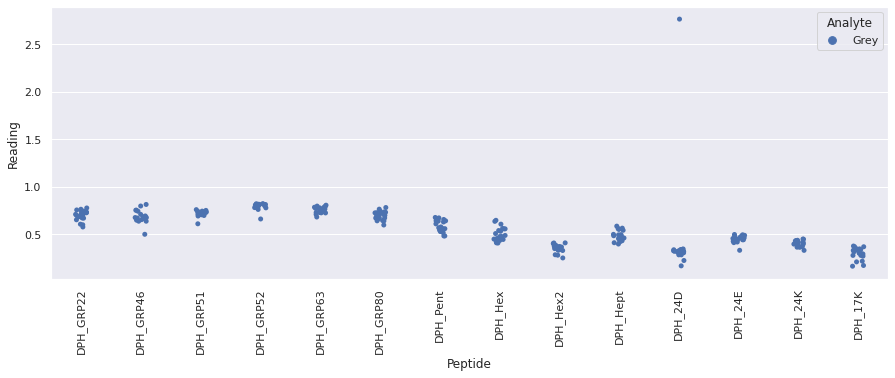

Drawing scatter plot of data spread for Black_YorkshireR1_repeat_10 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

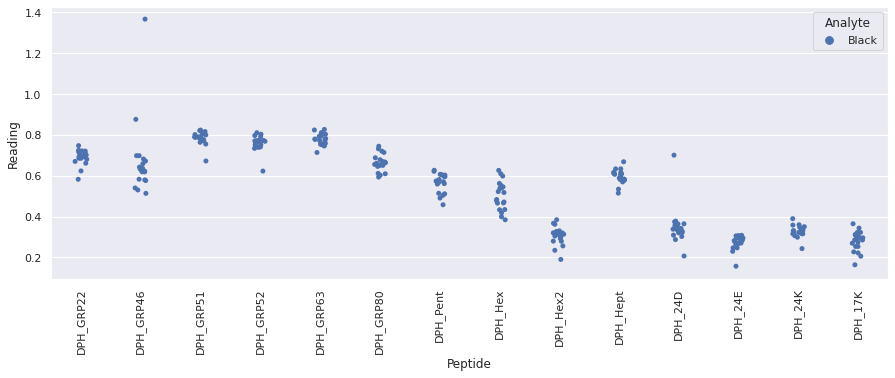

Drawing scatter plot of data spread for Black_YorkshireR2_repeat_10 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

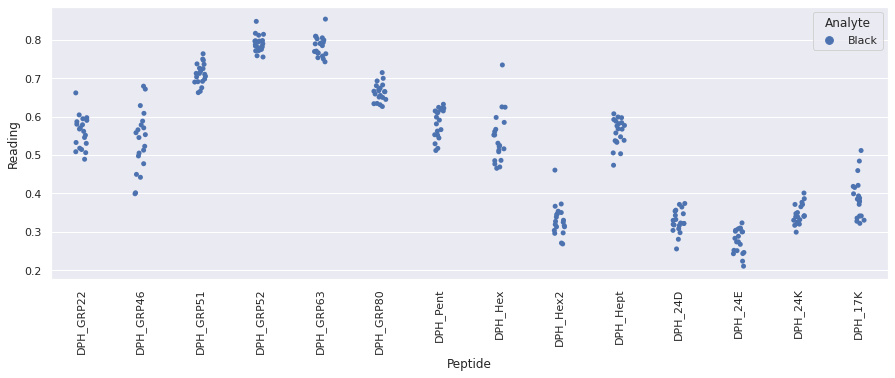

Drawing scatter plot of data spread for Black_YorkshireR3_repeat_10 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

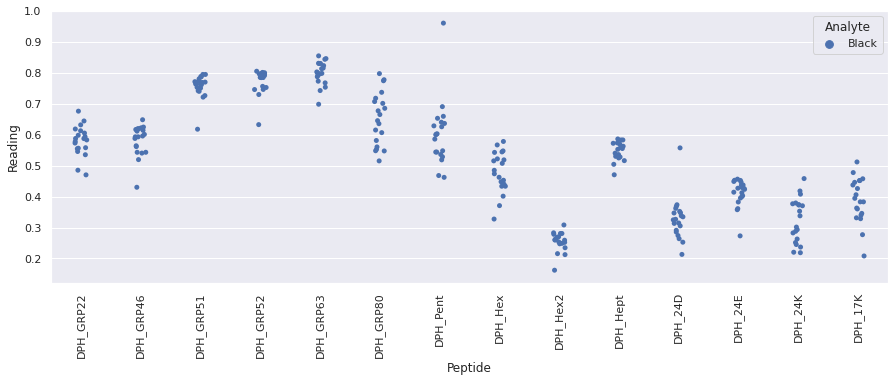

Drawing scatter plot of data spread for Black_YorkshireR4_repeat_10 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

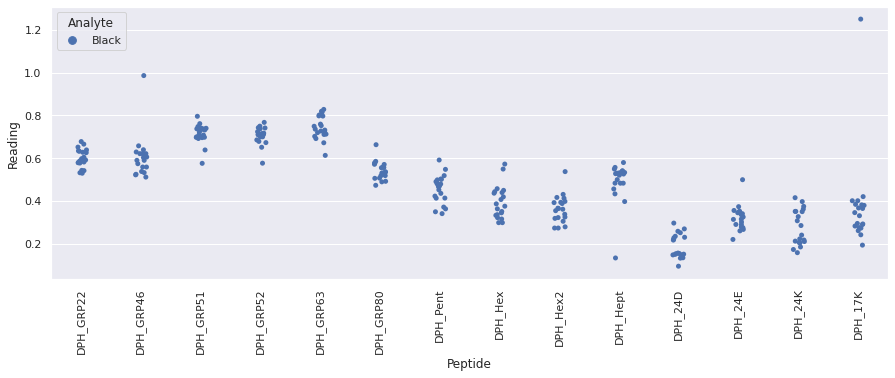

Drawing scatter plot of data spread for Black_YorkshireR5_repeat_10 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

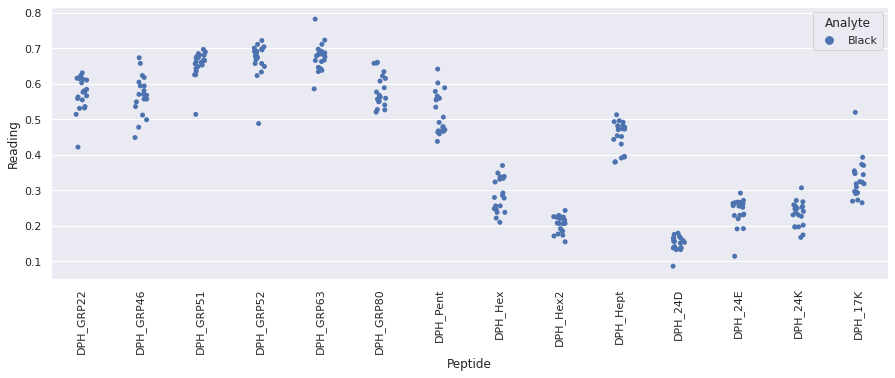

Drawing scatter plot of data spread for Black_YorkshireR6_repeat_10 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

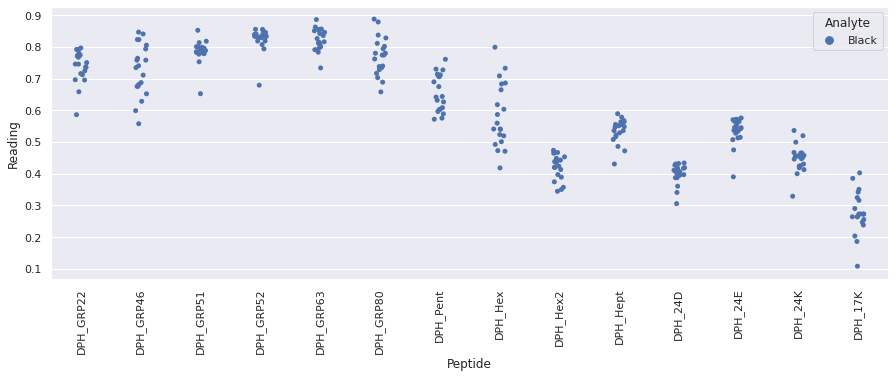

Drawing scatter plot of data spread for Green_TwiningsR1_repeat_10 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

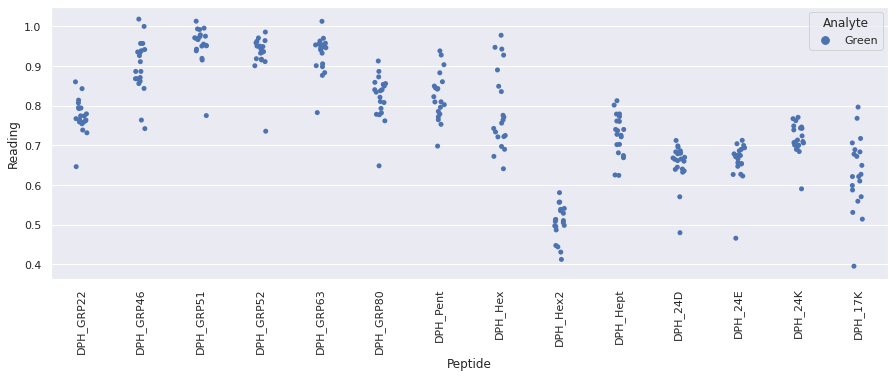

Drawing scatter plot of data spread for Green_TwiningsR2_repeat_10 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

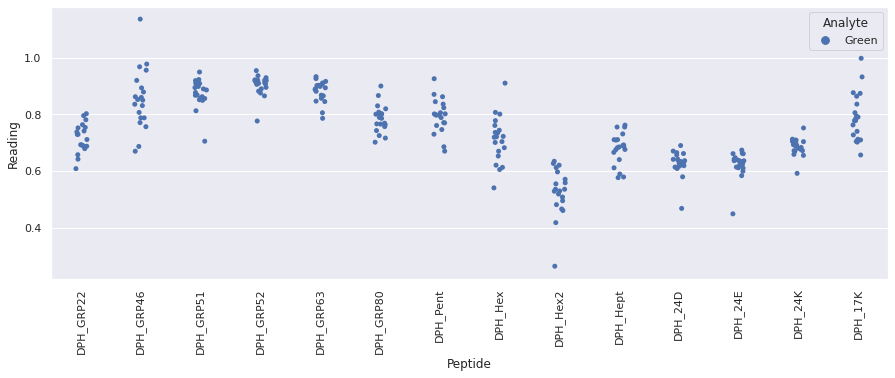

Drawing scatter plot of data spread for Green_TwiningsR3_repeat_10 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

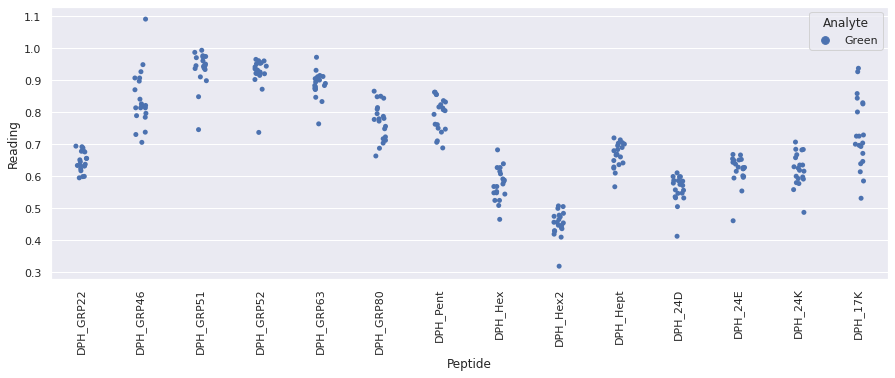

Drawing scatter plot of data spread for Green_TwiningsR4_repeat_10 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

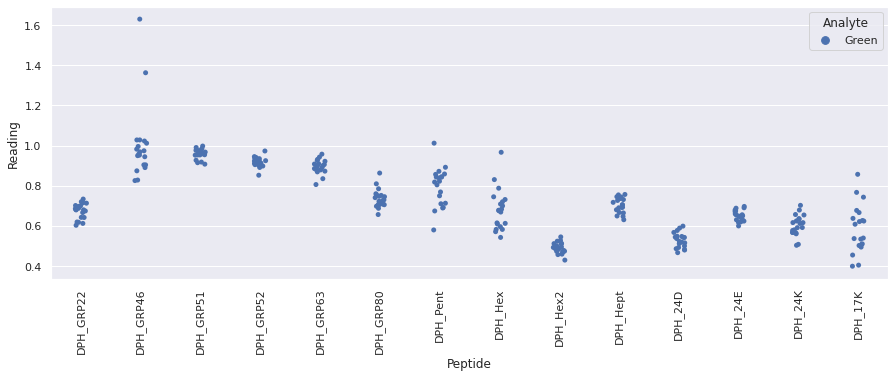

Drawing scatter plot of data spread for Green_TwiningsR5_repeat_10 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

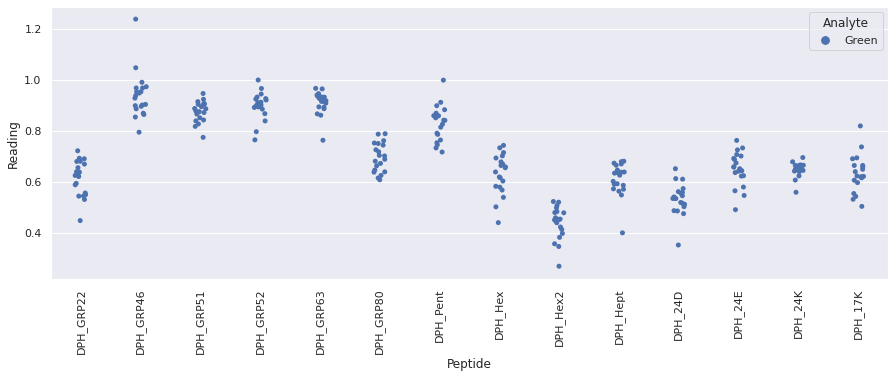

Drawing scatter plot of data spread for Green_TwiningsR6_repeat_10 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

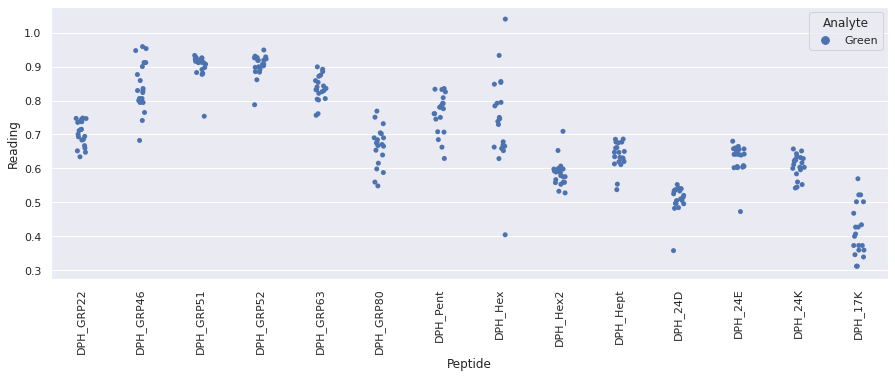

Drawing scatter plot of data spread for Grey_TwiningsR1_repeat_10 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

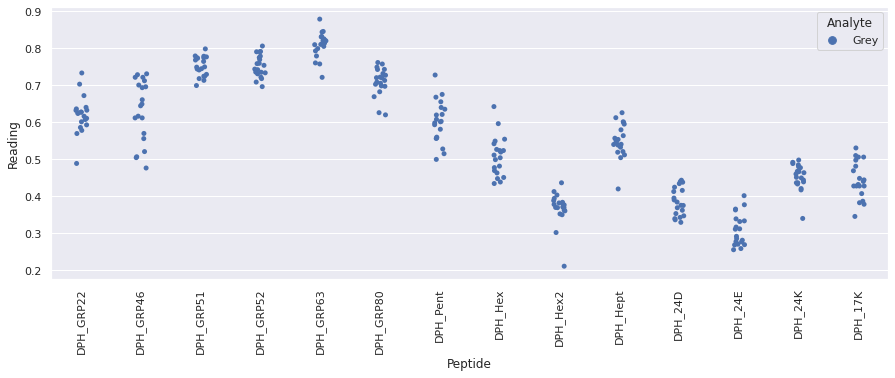

Drawing scatter plot of data spread for Grey_TwiningsR2_repeat_10 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

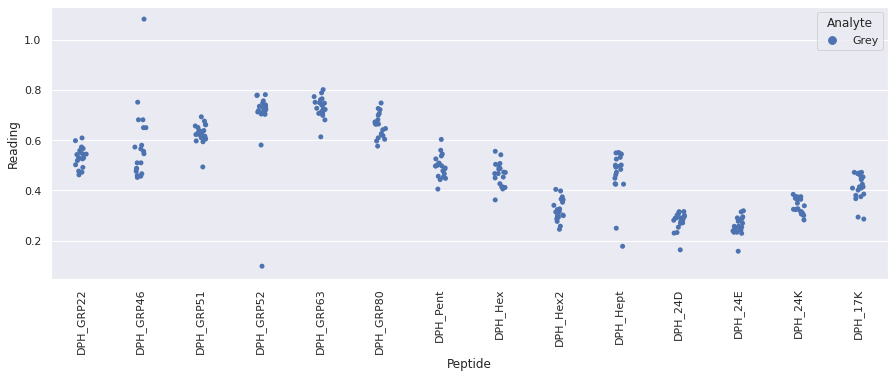

Drawing scatter plot of data spread for Grey_TwiningsR3_repeat_10 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

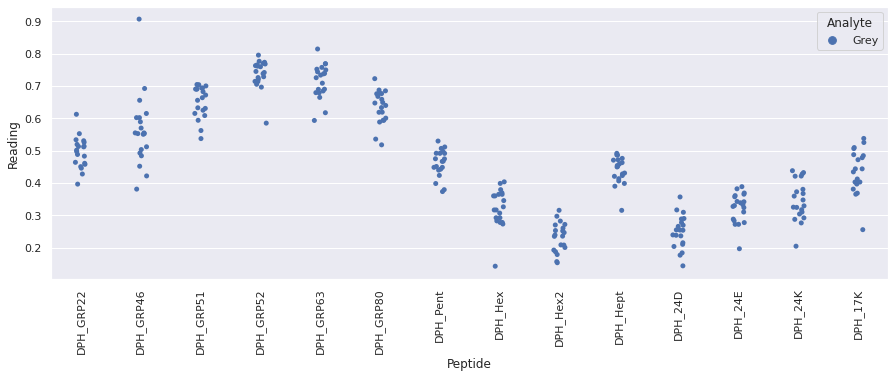

Drawing scatter plot of data spread for Grey_TwiningsR4_repeat_10 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

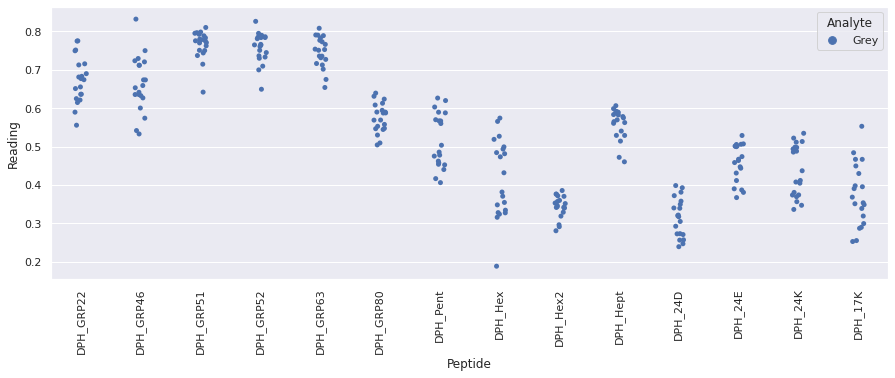

Drawing scatter plot of data spread for Grey_TwiningsR5_repeat_10 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

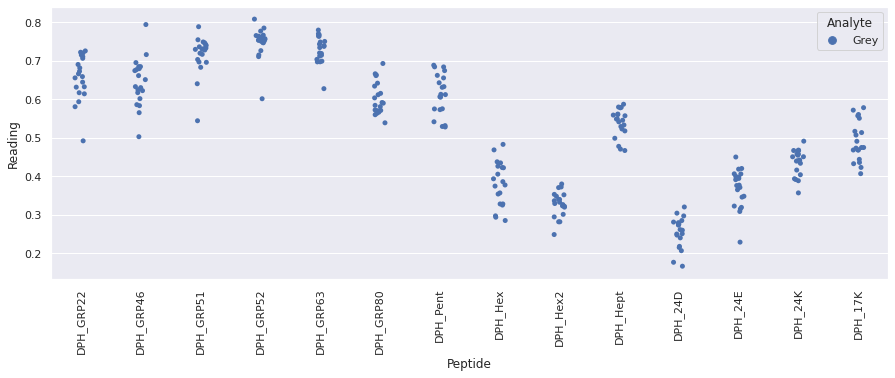

Drawing scatter plot of data spread for Grey_TwiningsR6_repeat_10 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

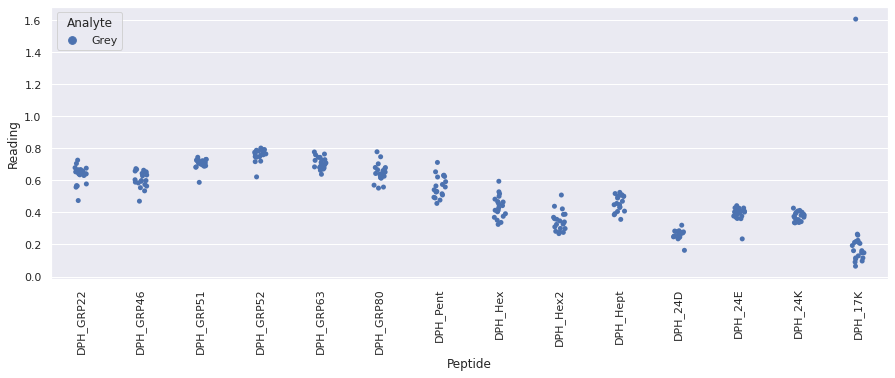



Outliers on the same plate:

/home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Black_ClipperR1_repeat_1.xlsx: blank, DPH_GRP51, 13902.0
/home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Black_ClipperR1_repeat_1.xlsx: blank, DPH_GRP52, 16010.0
/home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Black_ClipperR1_repeat_1.xlsx: Black, DPH_GRP22, 9290.0
/home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Black_ClipperR1_repeat_1.xlsx: Black, DPH_GRP51, 9358.0
/home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Black_ClipperR1_repeat_1.xlsx: Black, DPH_GRP52, 10367.0
/home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_type/Black_ClipperR1_repeat_1.xlsx: Black, DPH_GRP63, 10874.0
/home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_c

In [6]:
tea_fluor_data.xlsx_to_scaled_df(
    no_pep={'DPH': 'No Pep'}, scale_method='analyte_fluorophore', draw_plot=True, plot_dir_name='Tea'
)

At a glance:
- There are no plates in the dataset that by eye are obviously anomalous => no need to discard any of the plates.
- As expected, the collapsed barrel control (GRP35) has very little effect upon DPH fluorescence. Peptides GRP46 and 17K also have a limited (although slightly larger) effect upon DPH fluorescence => variance associated with the readings from these barrels might be quite high.
- In the case of most of the peptides, the analytes cause a noticeable (by eye) change (usually a decrease) in DPH fluorescence => likely that the analytes will generate unique fingerprints.

Combines readings of the same analyte solution across different plates, then calculates the median reading of non-independent repeats of the same analyte. Runs generalised ESD test, discards samples with more than two outlier readings (p=0.05 threshold).

In [7]:
tea_fluor_data.combine_plate_readings(outlier_excl_thresh=0.05, drop_thresh=2)



Outliers across plates:

repeat_1_Black: Black, DPH_GRP46, 0.1864406779661017
repeat_1_Black: Black, DPH_GRP52, 0.5878321747276044
repeat_1_Black: Black, DPH_GRP52, 0.6285121517486663
repeat_1_Black: Black, DPH_GRP63, 1.0650273224043716
repeat_1_Green: Green, DPH_GRP46, 6.358006042296073
repeat_1_Green: Green, DPH_GRP46, 2.071629213483146
repeat_1_Green: Green, DPH_GRP46, 1.7779456193353473
repeat_1_Green: Green, DPH_GRP46, 1.728932584269663
repeat_1_Green: Green, DPH_GRP52, 0.7373984512328376
repeat_1_Green: Green, DPH_GRP52, 0.779141500597526
repeat_1_Green: Green, DPH_GRP52, 0.8103743797925124
repeat_1_Green: Green, DPH_Hex, 1.9106687085247576
repeat_1_Green: Green, DPH_24D, 0.35049956413867095
repeat_1_Green: Green, DPH_24E, 0.5220588235294118
repeat_1_Green: Green, DPH_24E, 0.5463160063173796
repeat_1_Green: Green, DPH_24E, 0.5578993702173766
repeat_1_Green: Green, DPH_24E, 0.5788154546155626
repeat_1_Grey: Grey, DPH_GRP46, 1.694789081885856
repeat_1_Grey: Grey, DPH_GRP46, 0.944

Display range of data points across repeats for the different analytes




Original_data:


Black


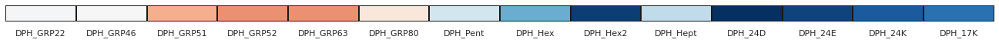


Green


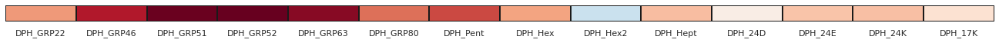


Grey


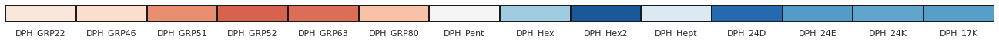




Scaled_data:


Black


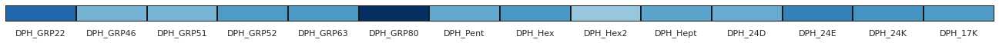


Green


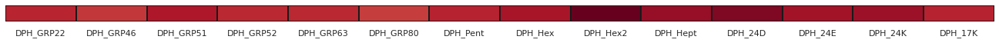


Grey


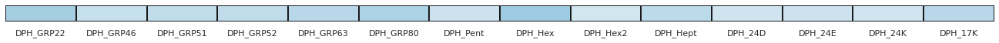




Original_data:



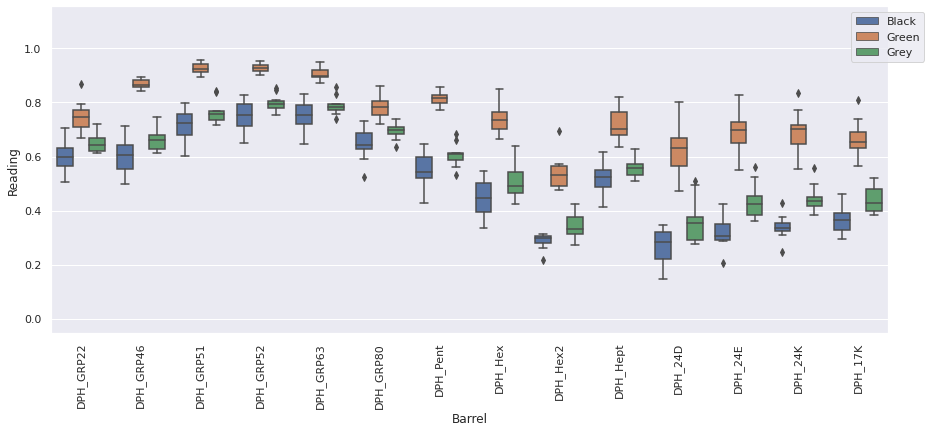

Black


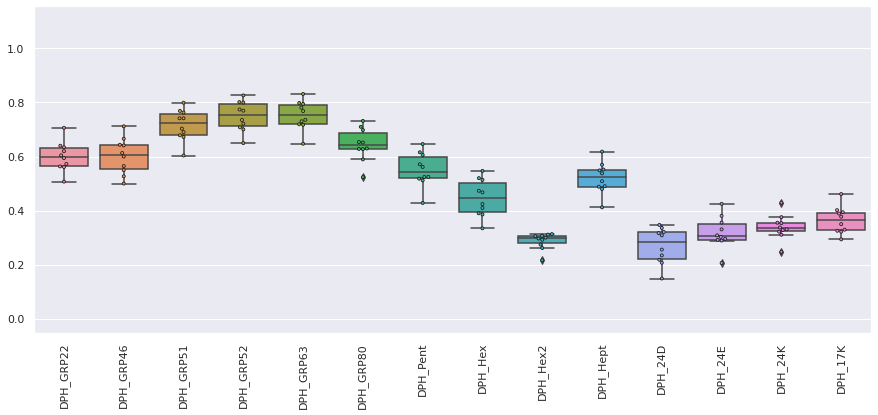

Green


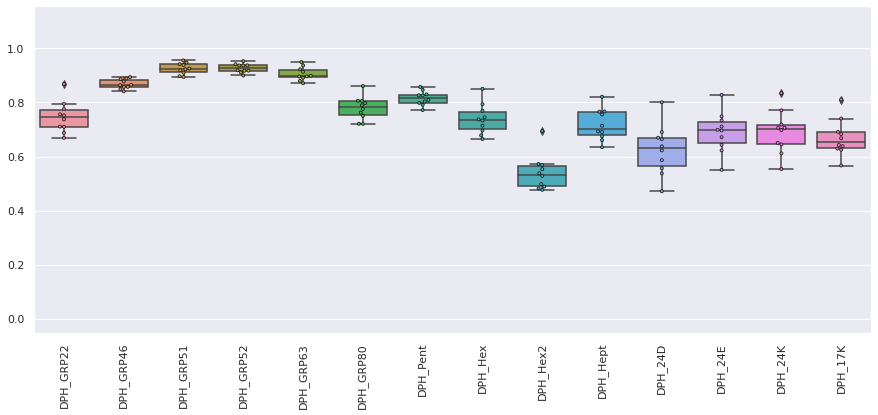

Grey


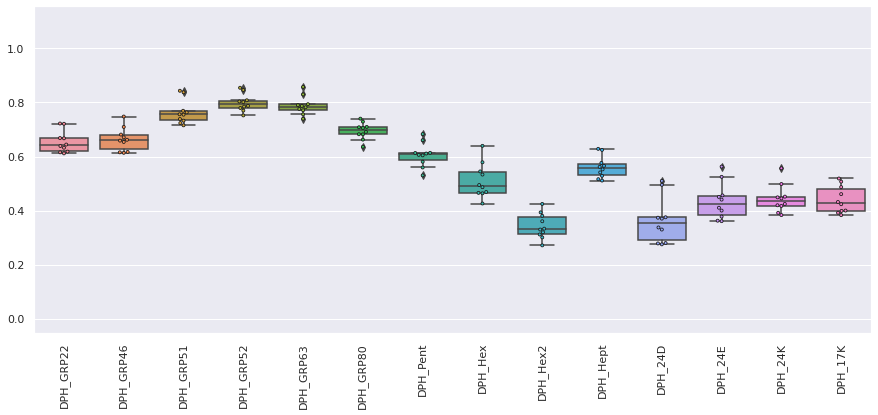




Scaled_data:



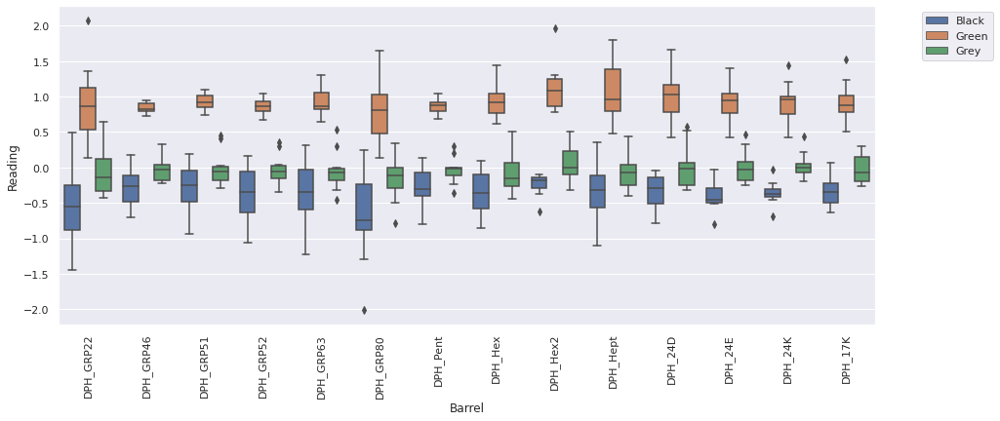

Black


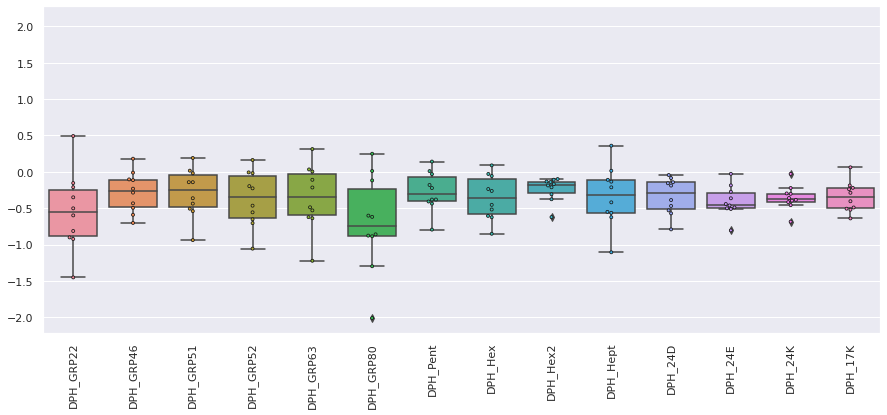

Green


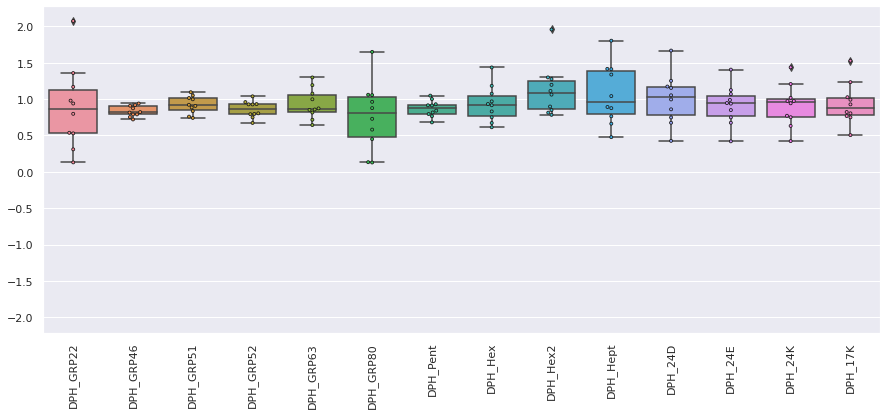

Grey


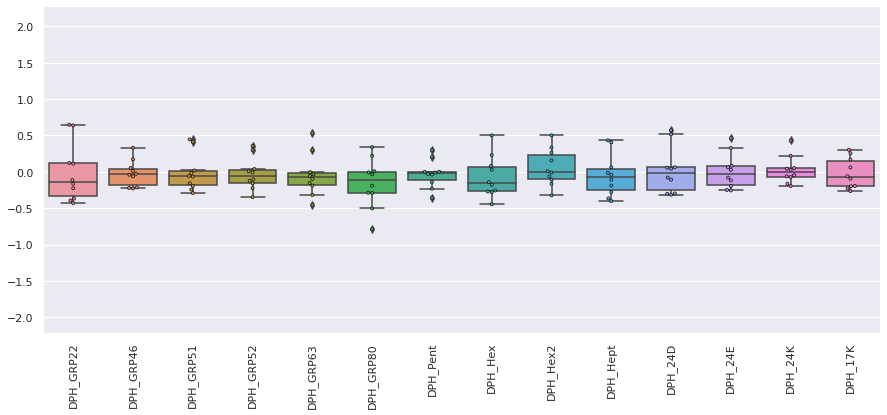

In [8]:
tea_fluor_data.display_data_distribution()

Even by eye there is a clear difference in the readings for the three classes, especially the green tea (which makes sense when one considers that grey tea is black tea plus bergamot, whereas green tea is chemically more different).

In [9]:
tea_fluor_data.ml_fluor_data

,DPH_GRP22,DPH_GRP46,DPH_GRP51,DPH_GRP52,DPH_GRP63,DPH_GRP80,DPH_Pent,DPH_Hex,DPH_Hex2,DPH_Hept,DPH_24D,DPH_24E,DPH_24K,DPH_17K,Analyte
0,0.634210,0.665959,0.768954,0.801515,0.794590,0.710043,0.605965,0.513802,0.299924,0.569701,0.320671,0.355751,0.353622,0.389265,Black
1,0.619971,0.641176,0.741510,0.774131,0.768313,0.653498,0.561545,0.467423,0.311263,0.548677,0.308524,0.380402,0.355056,0.393862,Black
2,0.563493,0.549940,0.672602,0.708145,0.717605,0.627375,0.518281,0.409706,0.274224,0.488357,0.217993,0.295261,0.327696,0.325359,Black
3,0.561232,0.526928,0.690569,0.700468,0.730532,0.629816,0.524476,0.390008,0.261472,0.490256,0.207023,0.289064,0.322041,0.349877,Black
4,0.706396,0.711895,0.799171,0.826216,0.831687,0.731876,0.646331,0.546740,0.305409,0.618230,0.335736,0.425039,0.429401,0.461153,Black
5,0.640073,0.643584,0.762881,0.800018,0.798082,0.698052,0.615772,0.520096,0.292011,0.552190,0.346899,0.330451,0.375765,0.401549,Black
6,0.594527,0.612989,0.703326,0.735230,0.735649,0.589410,0.511684,0.424244,0.296704,0.508683,0.255669,0.291613,0.310515,0.321990,Black
7,0.507156,0.500062,0.603707,0.649699,0.647502,0.523860,0.428227,0.334462,0.215974,0.412125,0.148661,0.206262,0.247717,0.293505,Black
8,0.572543,0.564601,0.678529,0.722013,0.719429,0.628190,0.524651,0.385718,0.306667,0.479880,0.234176,0.308322,0.337566,0.377534,Black
9,0.604457,0.600068,0.741550,0.769772,0.780983,0.651947,0.571305,0.473295,0.312941,0.537713,0.316899,0.302825,0.330593,0.329337,Black


#### ML analysis

In [10]:
plt.rcParams['figure.figsize'] = (10, 10)  # Sets default figure size
ml = RunML(
    results_dir='/home/ks17361/ML_environment/BADASS/Tea_analysis_standard_array/Tea_split_type/Tea_ML_plots',
    fluor_data=tea_fluor_data.ml_fluor_data.drop(['Analyte'], axis=1),
    classes=tea_fluor_data.ml_fluor_data['Analyte'].tolist(), subclasses=None, shuffle=False
)

- Calculate feature correlations

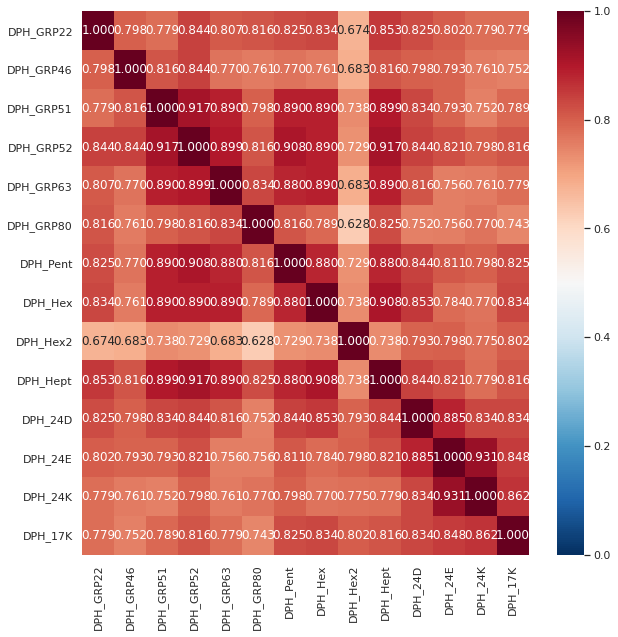

In [11]:
kendall_tau_correlation_matrix = ml.calc_feature_correlations(
    fluor_data=ml.fluor_data, correlation_coeff='kendall', plt_name='', abs_vals=True
)

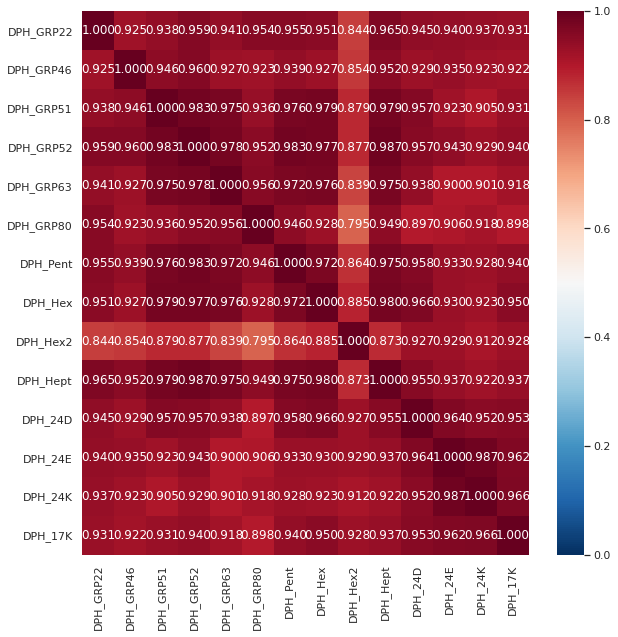

In [12]:
spearman_correlation_matrix = ml.calc_feature_correlations(
    fluor_data=ml.fluor_data, correlation_coeff='spearman', plt_name='', abs_vals=True
)

The readings from all pairs of barrels are strongly correlated => likely they are providing similar information to one another.

- Measure the relative importances of the peptides with KBest using one-way ANOVA

<Figure size 720x720 with 0 Axes>

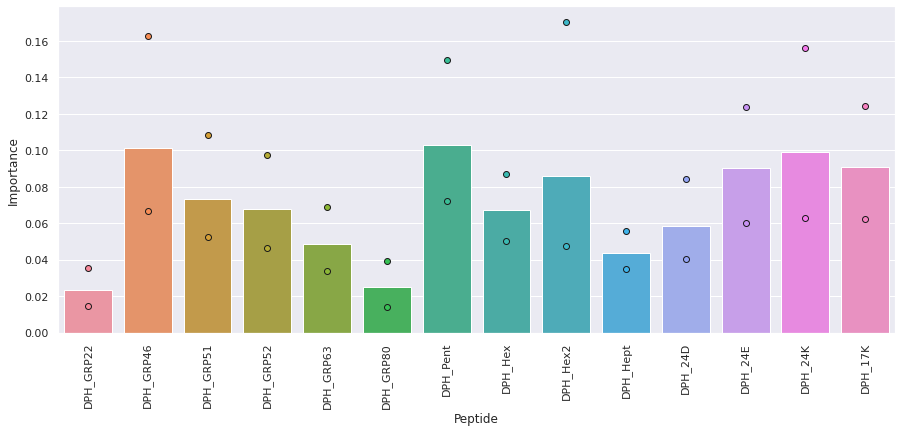

<Figure size 720x720 with 0 Axes>

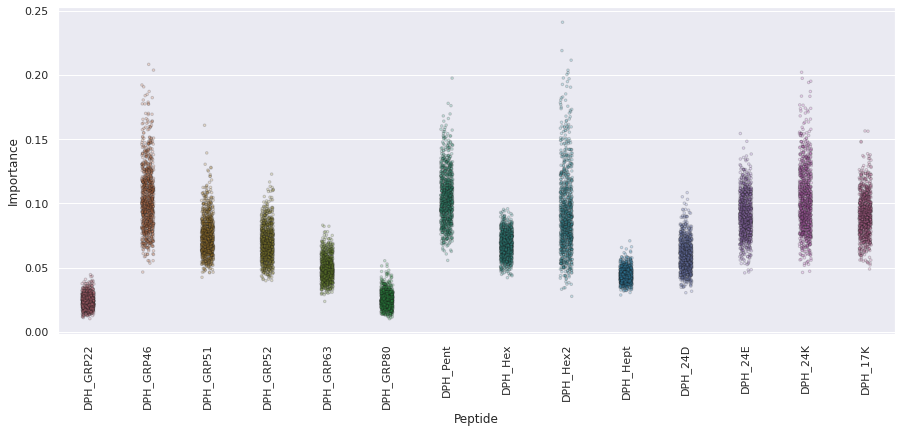

In [13]:
kbest_feat_importances_df, kbest_feat_importances_dict = ml.calc_feature_importances_kbest(
    x=ml.x, y=ml.y, features=None, method_classif='f_classif', num_repeats=1000, scale=True, plt_name=''
)

In [14]:
print('Peptides ordered by F-score:')
kbest_feat_importances_df

Peptides ordered by F-score:


,Feature,Score
0,DPH_Pent,0.103126
1,DPH_GRP46,0.101052
2,DPH_24K,0.099289
3,DPH_17K,0.090774
4,DPH_24E,0.090287
5,DPH_Hex2,0.085795
6,DPH_GRP51,0.073167
7,DPH_GRP52,0.067900
8,DPH_Hex,0.067261
9,DPH_24D,0.058215


KBest analysis is a univariate feature selection method, and hence assumes that the features are independent of one another (the importance scores calculated here are the F-scores from running one-way ANOVA). Consequently, the output importance scores do not reflect correlations between features - the scores represent the information provided by a feature about the output class, rather than the unique information provided by that feature alone. Therefore the most important features highlighted by this method could be providing the same information as one another.

This analysis indicates that many of the peptides provide substantial information about analyte class. 24K, Pent and GRP46 are the three peptides found to provide the most information by this analysis, whilst GRP22 and GRP80 provide the least. The relative importance scores are similar to those for the "brand split" tea data (which is reassuring, as this dataset is the same as the "brand split" dataset except that instead of there being 6 repeat readings for each brand, there is only a single reading (which is the median of those 6 readings)).

- Measure the relative importances of the peptides with decision tree analysis

<Figure size 720x720 with 0 Axes>

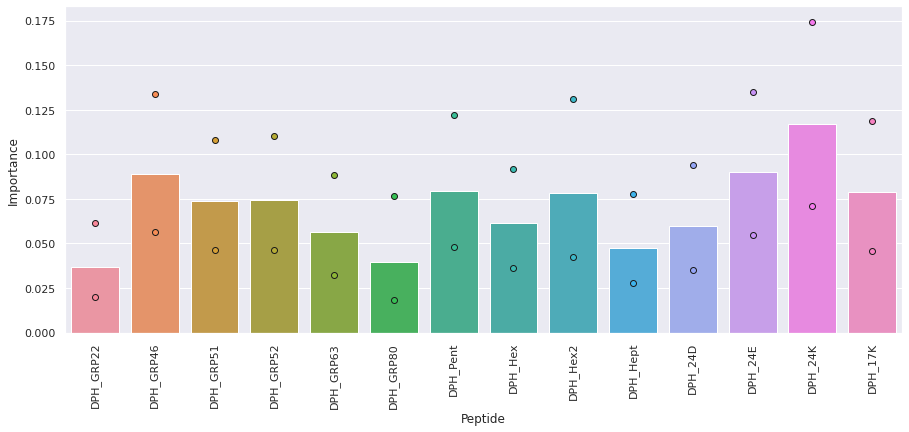

<Figure size 720x720 with 0 Axes>

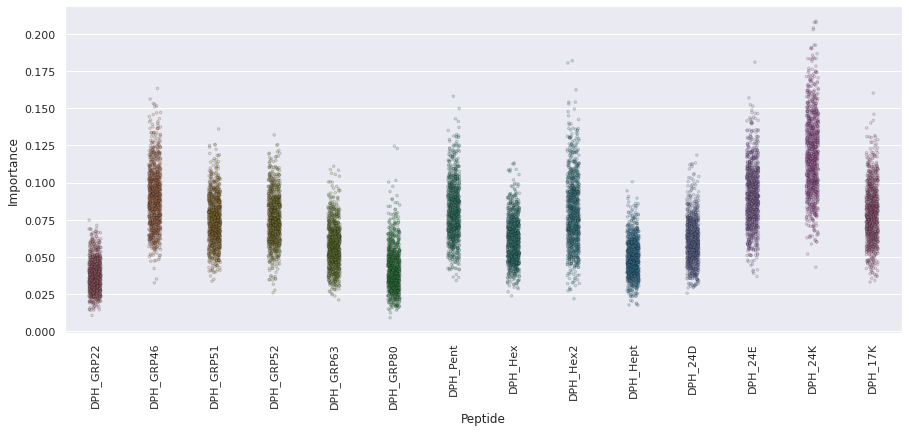

In [15]:
tree_feat_importances_df, tree_feat_importances_dict = ml.calc_feature_importances_tree(
    x=ml.x, y=ml.y, features=None, num_repeats=1000, scale=True, plt_name=''
)

In [16]:
print('Peptides ordered by importance:')
tree_feat_importances_df

Peptides ordered by importance:


,Feature,Score
0,DPH_24K,0.117174
1,DPH_24E,0.089935
2,DPH_GRP46,0.089150
3,DPH_Pent,0.079673
4,DPH_17K,0.078867
5,DPH_Hex2,0.078186
6,DPH_GRP52,0.074527
7,DPH_GRP51,0.073563
8,DPH_Hex,0.061206
9,DPH_24D,0.059645


In this method, an ExtraTrees classifier is used to calculate importance scores. The ExtraTrees classifier trains multiple decision trees on the data. Each tree is trained with a random subset of features on a random subset of dataset, the results of these trees are then averaged to make a prediction. Importance scores are calculated as the 
average increase in purity achieved when using a particular feature to split the data across all trees in which that feature is included (i.e. the Gini importance score of the feature). When looking at the Gini importance scores of features in individual trees, correlations between the included features are reflected in the scores. However, as more and more trees, incorporating different subsets of features, are included in the average, feature correlations have less of an effect upon the importance scores. The  number of trees (plus bootstrap repeats) included here means that the correlation between features will have little effect upon the importance scores.

Whilst there are some small differences in the relative order of the peptides, the ExtraTrees classifier identifies the same peptides as being most and least important as did the KBest analysis.

- Measure the relative importances of the peptides with permutation analysis

<Figure size 720x720 with 0 Axes>

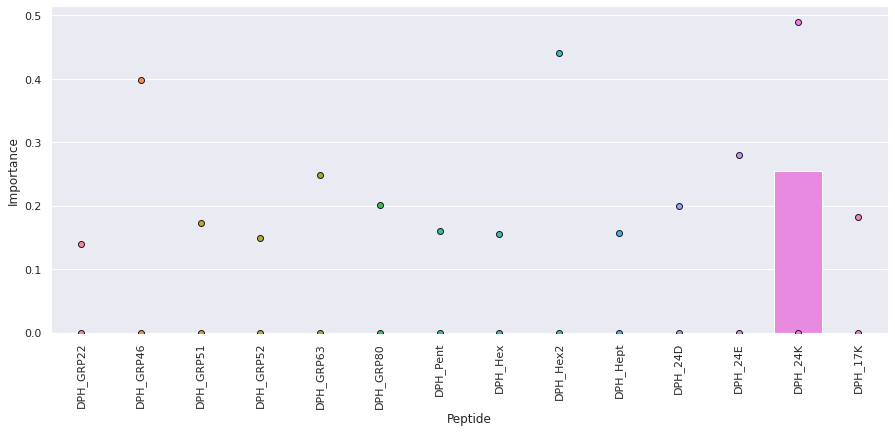

<Figure size 720x720 with 0 Axes>

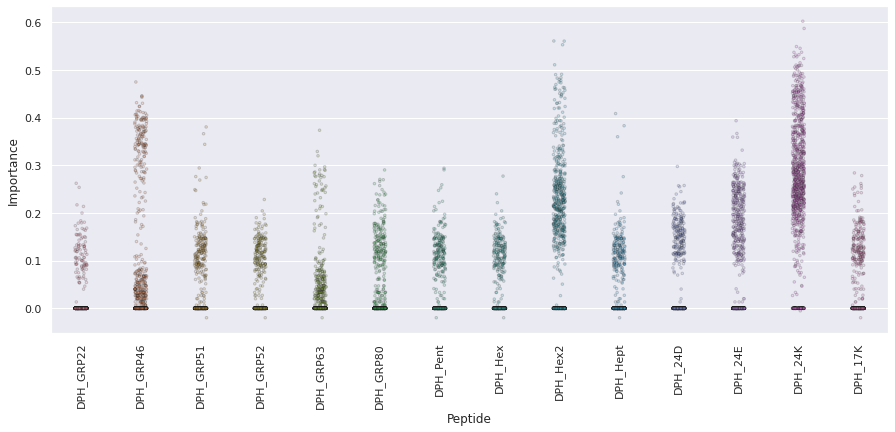

In [17]:
f1 = make_scorer(f1_score, average='weighted')
median_permut_feat_importances_df, permut_feat_importances_dict = ml.calc_feature_importances_permutation(
    x=ml.x, y=ml.y, features=None, classifier=AdaBoostClassifier,
    parameters={'n_estimators': np.array([10, 30, 100, 300, 1000])}, model_metric=f1, num_repeats=1000,
    scale=True, plt_name=''
)

In [18]:
print('Peptides ordered by median importance:')
median_permut_feat_importances_df

Peptides ordered by median importance:


,Feature,Score
0,DPH_24K,0.254879
1,DPH_GRP22,0.000000
2,DPH_GRP46,0.000000
3,DPH_GRP51,0.000000
4,DPH_GRP52,0.000000
5,DPH_GRP63,0.000000
6,DPH_GRP80,0.000000
7,DPH_Pent,0.000000
8,DPH_Hex,0.000000
9,DPH_Hex2,0.000000


In [19]:
mean_permut_feat_importances_df = OrderedDict({})
for feat, score_list in permut_feat_importances_dict.items():
    mean_permut_feat_importances_df[feat] = np.mean(score_list)
mean_permut_feat_importances_df = pd.DataFrame({'Feature': list(mean_permut_feat_importances_df.keys()),
                                                'Score': list(mean_permut_feat_importances_df.values())})
mean_permut_feat_importances_df = mean_permut_feat_importances_df.sort_values(
    by=['Score'], axis=0, ascending=False
).reset_index(drop=True)

In [20]:
print('Peptides ordered by mean importance:')
mean_permut_feat_importances_df

Peptides ordered by mean importance:


,Feature,Score
0,DPH_24K,0.245262
1,DPH_Hex2,0.112852
2,DPH_24E,0.069522
3,DPH_GRP46,0.062923
4,DPH_24D,0.031394
5,DPH_GRP80,0.027689
6,DPH_17K,0.026596
7,DPH_GRP51,0.024453
8,DPH_Pent,0.023794
9,DPH_Hept,0.023691


In permutation analysis, importance scores are calculated by training two ML models (in this case I have selected AdaBoost classifiers). The first model is trained using all features, the second is trained with one of the features randomly scrambled: the importance score of the feature is then calculated as the difference in performance (in this case measured via model F1 score) between the two models. Hence this method does take into account correlations between features, and the output importance scores represent the unique information that a feature provides about the output class label.

The results obtained with permutation look more different as compared to the difference between the KBest and ExtraTrees analysis, which is perhaps not surprising given that as described above permutation analysis takes feature correlation into account (whereas the former two methods do not).

According to permutation analysis, 24K contributes by far the most unique information about the output class. In contrast, although the other two methods also highlight 24K as one of the most important features, it is one of several similarly important peptides. (Note that a similar result is observed in the "brand split data", except that the barrel identified as being most important is GRP52 rather than 24K.)

- What percentage of the signal in the data can be measured by N principal components?

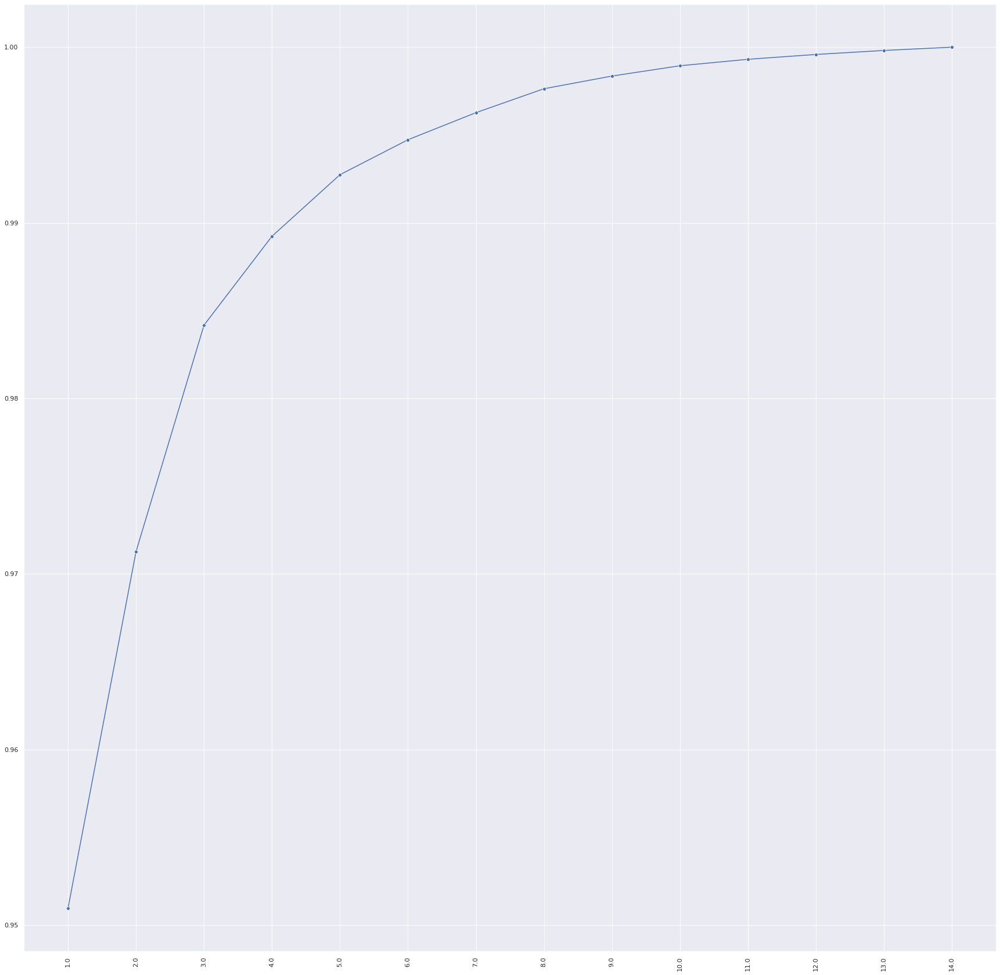

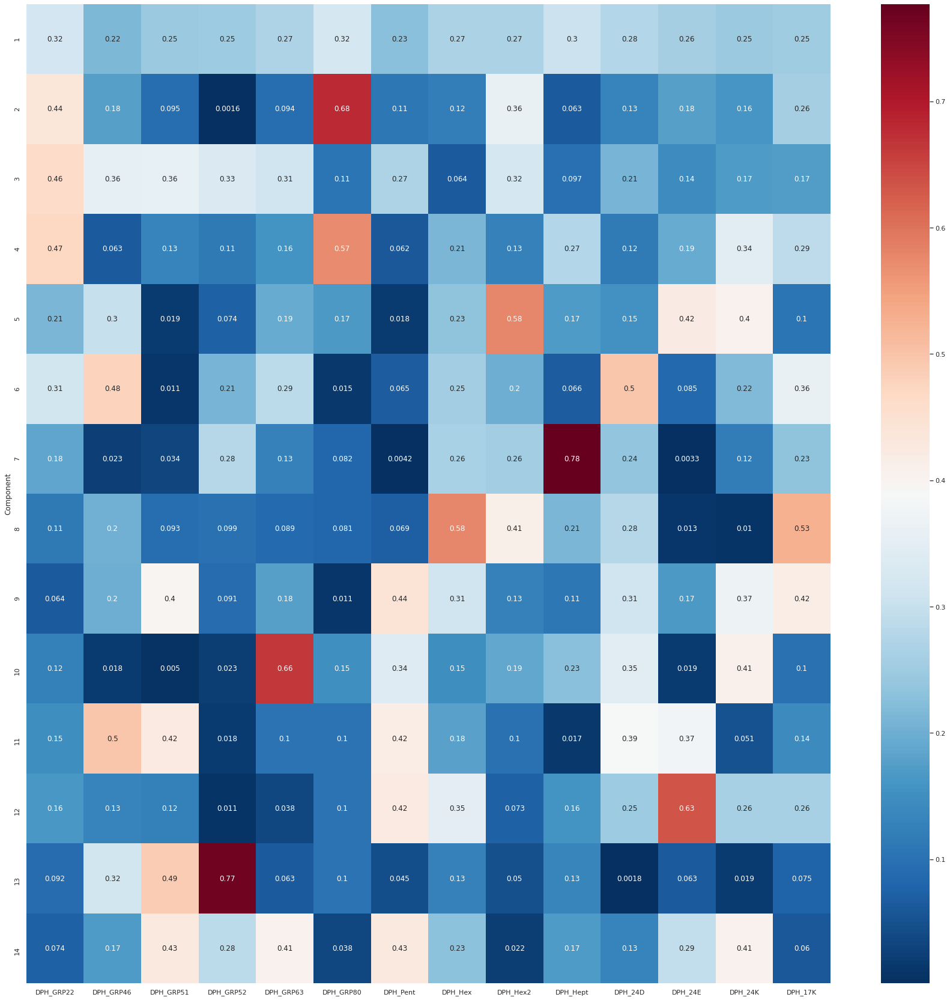

In [21]:
plt.rcParams['figure.figsize'] = (30, 30)  # Sets figure size
pca_model, pca_components = ml.run_pca(fluor_data=ml.fluor_data, scale=True, plt_name='')
plt.rcParams['figure.figsize'] = (10, 10)  # Resets default figure size

Over 95% of the variance in the data can be represented by just one principal component. Most of the peptides make similar contributions to the first component, whereas GRP80 makes the dominant contribution to the second component.

Scatter plots of data transformed to PCA dimensions

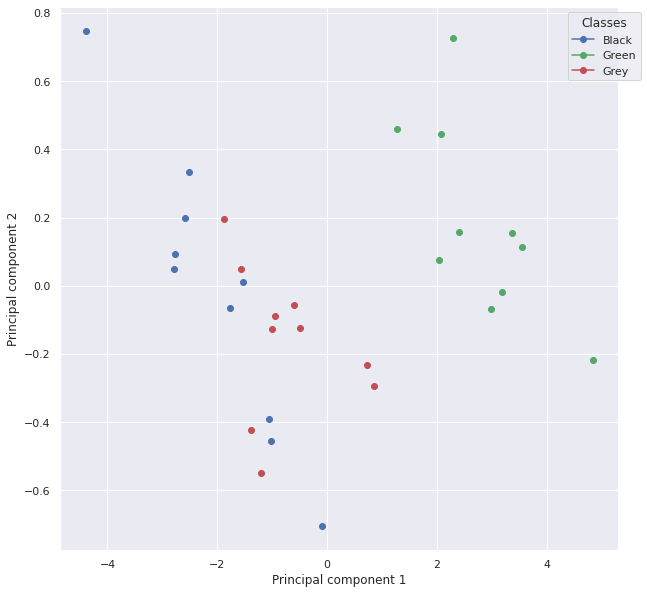

In [22]:
ml.plot_scatter_on_pca_axes(
    x=ml.x, y=ml.y, subclasses=ml.sub_classes, num_dimensions=2, scale=True, plt_name=''
)

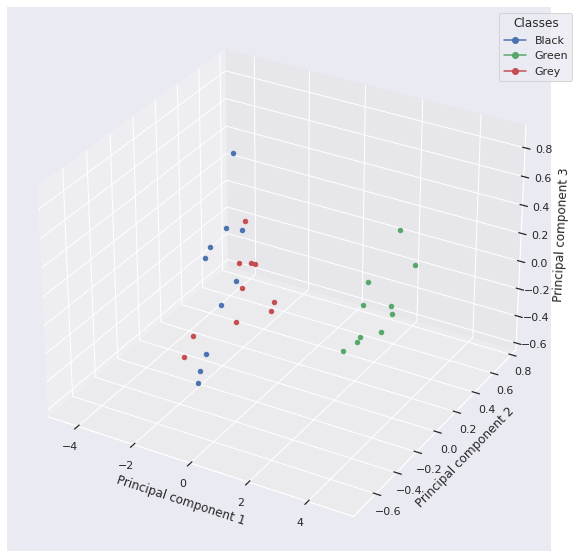

In [23]:
ml.plot_scatter_on_pca_axes(
    x=ml.x, y=ml.y, subclasses=ml.sub_classes, num_dimensions=3, scale=True, plt_name=''
)

As expected based from the scatter and box plots above, the three classes can be distinguished by eye on these scatter plots on PCA axes. In particular, the green tea samples cluster separately, whereas there is more overlap between the black and grey teas (which as described above is what might be predicted given their different chemical compositions). The smaller size of the dataset means that it is more difficult to visualise a decision boundary between the grey and black tea as compared to the "brand split" dataset.

#### How well does a model trained with all features perform?

Runs grid search with nested cross-validation to spot check 5 different ML algorithms. Inner loop identifies the optimal parameter values to use with the ML algorithm; outer loop measures the performance of a model trained using these parameter values.

In [24]:
algorithms = [KNeighborsClassifier, GaussianNB, LinearSVC, SVC, AdaBoostClassifier]
resampling_methods = ['no_balancing']  # Classes are ~balanced, plus the dataset is quite small => decided
# not to test any data resampling methods such as oversampling and SMOTE, etc.

n_components_pca = None
run = 'gridsearch'
n_iter = None
cv_folds_inner_loop = 3
cv_folds_outer_loop = 3
train_scoring_metric = make_scorer(f1_score, average='weighted', zero_division=0)
test_scoring_funcs={accuracy_score: {},
                    recall_score: {'average': 'weighted',
                                   'zero_division': 0},
                    precision_score: {'average': 'weighted',
                                      'zero_division': 0},
                    f1_score: {'average': 'weighted',
                               'zero_division': 0}}

all_feat_searches = OrderedDict({})
all_feat_score_dict = OrderedDict({'Algorithm': [],
                                   'Resampling_method': [],
                                   'Average_accuracy': [],
                                   'Std_dev_accuracy': [],
                                   'Average_recall': [],
                                   'Std_dev_recall': [],
                                   'Average_precision': [],
                                   'Std_dev_precision': [],
                                   'Average_f1': [],
                                   'Std_dev_f1': []})

for algorithm in algorithms:
    for resampling_method in resampling_methods:
        fixed_params = ml.define_fixed_model_params(classifier=algorithm())
        if algorithm.__name__ in ['LinearSVC', 'SVC', 'AdaBoostClassifier']:
            fixed_params['random_state'] = 1
        tuned_params = ml.define_tuned_model_params(
            classifier=algorithm(), x_train=ml.x, n_folds=cv_folds_inner_loop
        )
        nested_cv_search = ml.run_nested_CV(
            clf=algorithm, x=ml.x, y=ml.y, groups=None, selected_features=list(ml.features),
            inner_splits=None, outer_splits=None, const_split=True, resampling_method=resampling_method,
            n_components_pca=n_components_pca, run=run, fixed_params=fixed_params, tuned_params=tuned_params,
            train_scoring_metric=train_scoring_metric, test_scoring_funcs=test_scoring_funcs, n_iter=n_iter,
            cv_folds_inner_loop=cv_folds_inner_loop, cv_folds_outer_loop=cv_folds_outer_loop,
            draw_conf_mat=False, plt_name=''
        )

        all_feat_searches[
            '{}__{}'.format(algorithm.__name__, resampling_method)
        ] = copy.deepcopy(nested_cv_search)

        all_feat_score_dict['Algorithm'].append(algorithm.__name__)
        all_feat_score_dict['Resampling_method'].append(resampling_method)
        all_feat_score_dict['Average_accuracy'].append(nested_cv_search['average_test_scores']['accuracy'])
        all_feat_score_dict['Std_dev_accuracy'].append(nested_cv_search['stddev_test_scores']['accuracy'])
        all_feat_score_dict['Average_recall'].append(nested_cv_search['average_test_scores']['recall'])
        all_feat_score_dict['Std_dev_recall'].append(nested_cv_search['stddev_test_scores']['recall'])
        all_feat_score_dict['Average_precision'].append(nested_cv_search['average_test_scores']['precision'])
        all_feat_score_dict['Std_dev_precision'].append(nested_cv_search['stddev_test_scores']['precision'])
        all_feat_score_dict['Average_f1'].append(nested_cv_search['average_test_scores']['f1'])
        all_feat_score_dict['Std_dev_f1'].append(nested_cv_search['stddev_test_scores']['f1'])

        # Print output of nested CV
        for i, params in enumerate(nested_cv_search['outer_loop_params']):
            print('\n\n\n')
            print('{}: {}'.format(algorithm.__name__, resampling_method))
            print('Parameters: {}'.format(params))
            print('Accuracy: {}'.format(nested_cv_search['test_scores']['accuracy'][i]))
            print('F1: {}'.format(nested_cv_search['test_scores']['f1'][i]))





KNeighborsClassifier: no_balancing
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 2), ('p', 2), ('weights', 'distance')])
Accuracy: 0.7
F1: 0.6599999999999999




KNeighborsClassifier: no_balancing
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 2), ('p', 1), ('weights', 'distance')])
Accuracy: 0.9
F1: 0.8971428571428571




KNeighborsClassifier: no_balancing
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 2), ('p', 1), ('weights', 'distance')])
Accuracy: 0.7
F1: 0.7




GaussianNB: no_balancing
Parameters: OrderedDict()
Accuracy: 0.6
F1: 0.5833333333333333




GaussianNB: no_balancing
Parameters: OrderedDict()
Accuracy: 0.9
F1: 0.8971428571428571




GaussianNB: no_balancing
Parameters: OrderedDict()
Accuracy: 0.7
F1: 0.7




LinearSVC: no_balancing
Parameters: OrderedDict([('dual', False), ('max_iter', 10000), ('random_state', 1), ('C', 4.0)])
Accuracy: 0.6
F1: 0.583333333333333

In [25]:
all_feat_score_df = pd.DataFrame(all_feat_score_dict)

In [26]:
all_feat_score_df

,Algorithm,Resampling_method,Average_accuracy,Std_dev_accuracy,Average_recall,Std_dev_recall,Average_precision,Std_dev_precision,Average_f1,Std_dev_f1
0,KNeighborsClassifier,no_balancing,0.766667,0.094281,0.766667,0.094281,0.830556,0.086156,0.752381,0.103657
1,GaussianNB,no_balancing,0.733333,0.124722,0.733333,0.124722,0.753889,0.127267,0.726825,0.129509
2,LinearSVC,no_balancing,0.766667,0.169967,0.766667,0.169967,0.770556,0.164859,0.756349,0.177285
3,SVC,no_balancing,0.766667,0.169967,0.766667,0.169967,0.778889,0.161253,0.761111,0.175506
4,AdaBoostClassifier,no_balancing,0.766667,0.169967,0.766667,0.169967,0.778889,0.161253,0.761111,0.175506


In [27]:
with open('{}/All_features_CV_search_models.pkl'.format(ml.results_dir), 'wb') as f:
    pickle.dump((all_feat_searches, all_feat_score_df), f)

The algorithms all perform well, but will select KNeighborsClassifier to take forwards as it performs well across all 4 metrics.

In [28]:
all_feat_searches['KNeighborsClassifier__no_balancing']['outer_loop_params']

[OrderedDict([('metric', 'minkowski'),
              ('n_jobs', -1),
              ('n_neighbors', 2),
              ('p', 2),
              ('weights', 'distance')]),
 OrderedDict([('metric', 'minkowski'),
              ('n_jobs', -1),
              ('n_neighbors', 2),
              ('p', 1),
              ('weights', 'distance')]),
 OrderedDict([('metric', 'minkowski'),
              ('n_jobs', -1),
              ('n_neighbors', 2),
              ('p', 1),
              ('weights', 'distance')])]

In [29]:
all_feat_searches['KNeighborsClassifier__no_balancing']['best_outer_loop_params']

OrderedDict([('accuracy',
              OrderedDict([('metric', 'minkowski'),
                           ('n_jobs', -1),
                           ('n_neighbors', 2),
                           ('p', 1),
                           ('weights', 'distance')])),
             ('recall',
              OrderedDict([('metric', 'minkowski'),
                           ('n_jobs', -1),
                           ('n_neighbors', 2),
                           ('p', 1),
                           ('weights', 'distance')])),
             ('precision',
              OrderedDict([('metric', 'minkowski'),
                           ('n_jobs', -1),
                           ('n_neighbors', 2),
                           ('p', 1),
                           ('weights', 'distance')])),
             ('f1',
              OrderedDict([('metric', 'minkowski'),
                           ('n_jobs', -1),
                           ('n_neighbors', 2),
                           ('p', 1),
                      

In [30]:
all_feat_searches['KNeighborsClassifier__no_balancing']['test_scores']['accuracy']

[0.7, 0.9, 0.7]

In [31]:
all_feat_nested_pred = all_feat_searches['KNeighborsClassifier__no_balancing']['predictions']
all_feat_nested_y_true = all_feat_searches['KNeighborsClassifier__no_balancing']['y_true']
all_feat_nested_x_true = all_feat_searches['KNeighborsClassifier__no_balancing']['x_true']

all_feat_flat_pred = np.array([pred for pred_array in all_feat_nested_pred for pred in pred_array])
all_feat_flat_y_true = np.array([y for y_array in all_feat_nested_y_true for y in y_array])
all_feat_flat_x_true = np.array([x for x_array in all_feat_nested_x_true for x in x_array])

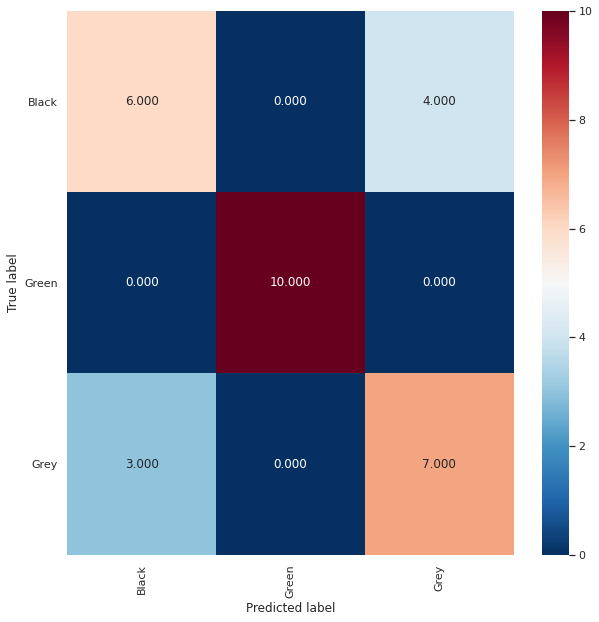

Normalised over true label (rows)


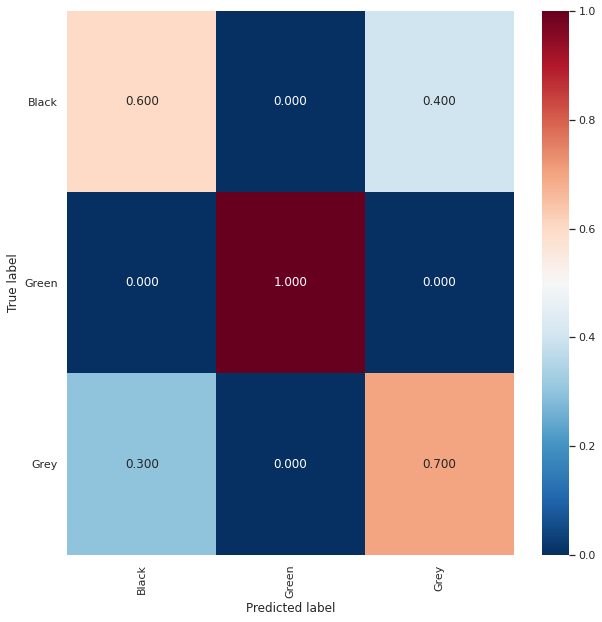

Normalised over pred label (columns)


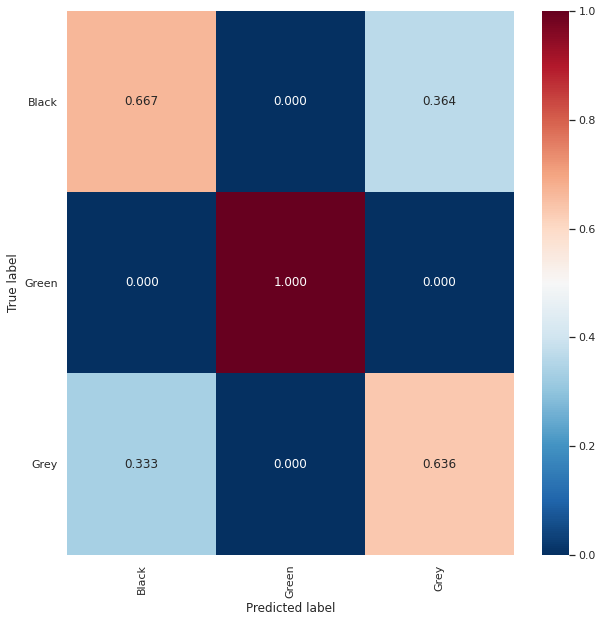

In [32]:
draw_conf_matrices(all_feat_flat_y_true, all_feat_flat_pred, ml.results_dir, 'All_features')

In [33]:
all_feat_true_hue = []
for index, y in enumerate(all_feat_flat_y_true):
    if all_feat_flat_pred[index] == y:
        all_feat_true_hue.append('{}_correct'.format(y))
    else:
        all_feat_true_hue.append('{}_incorrect'.format(y))

sub_all_feat_true_hue = []
sub_all_feat_flat_x_true = []
sub_all_feat_flat_y_true = []
for i, true_hue in enumerate(all_feat_true_hue):
    if true_hue.endswith('_incorrect'):
        sub_all_feat_true_hue.append(true_hue)
        sub_all_feat_flat_x_true.append(all_feat_flat_x_true[i])
        sub_all_feat_flat_y_true.append(all_feat_flat_y_true[i])

all_feat_true_hue = np.array(all_feat_true_hue)
sub_all_feat_true_hue = np.array(sub_all_feat_true_hue)
sub_all_feat_flat_x_true = np.array(sub_all_feat_flat_x_true)
sub_all_feat_flat_y_true = np.array(sub_all_feat_flat_y_true)

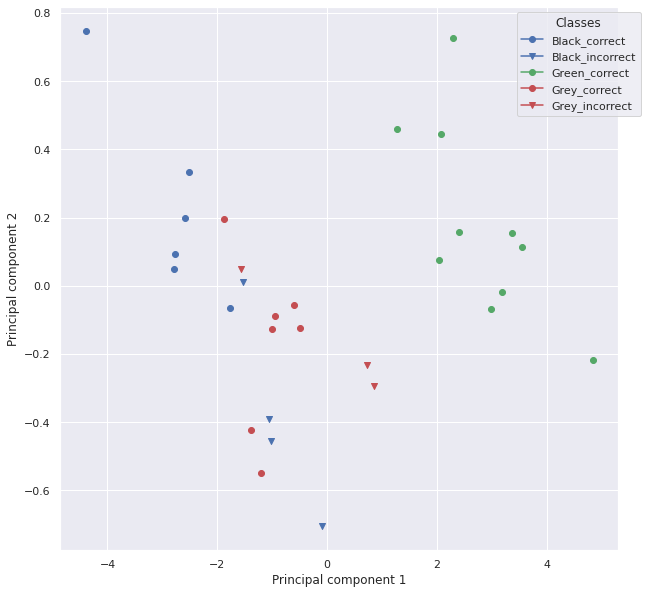

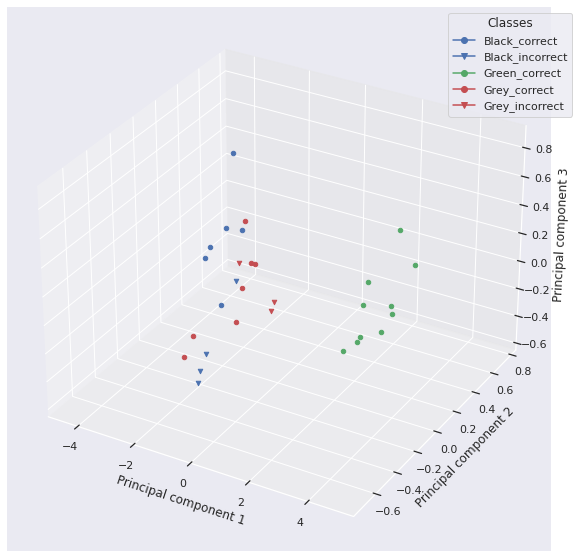

In [34]:
# Scatter plot (axes = top two principal components)
ml.plot_scatter_on_pca_axes(
    x=all_feat_flat_x_true, y=all_feat_flat_y_true, subclasses=all_feat_true_hue, num_dimensions=2,
    scale=True, plt_name='All_features_coloured_by_pred'
)

# Scatter plot (axes = top three principal components)
ml.plot_scatter_on_pca_axes(
    x=all_feat_flat_x_true, y=all_feat_flat_y_true, subclasses=all_feat_true_hue, num_dimensions=3,
    scale=True, plt_name='All_features_coloured_by_pred'
)

# Black_incorrect = Value that is actually black is predicted to be something else

It is possible to train an ML model that is able to identify the class labels of subclasses (in this case brands of tea) it was not exposed to during training. This behaviour will be crucial for future applications of the BADASS technology (e.g. identifying the class of biological samples (such as urine or serum) from diseased and healthy patients, etc.). In agreement with the scatter and box plots earlier in this notebook, the model is better able to distinguish the green tea from the other two classes as compared to between the grey and black tea, although it still predicts most of the black and grey samples correctly.

#### Is it possible to maintain/improve model performance when reducing the number of peptides?

Sequentially include features via their feature importance (as measured via KBest/permutation analysis), measure if there is any difference in trained classifier performance.

In [40]:
algorithms = [KNeighborsClassifier, GaussianNB, LinearSVC, SVC, AdaBoostClassifier]
resampling_methods = ['no_balancing']  # Classes are ~ balanced, plus the dataset is quite small => decided
# not to test any data resampling methods such as oversampling and SMOTE, etc.
num_features_list = [1, 2, 3, 4, 5, 6, 8, 10, 12, 14]

ordered_features = {'KBest_Fscore': kbest_feat_importances_df['Feature'].tolist(),
                    'Permutation_score': mean_permut_feat_importances_df['Feature'].tolist()}

n_components_pca = None
run = 'gridsearch'
n_iter = None
cv_folds_inner_loop = 3
cv_folds_outer_loop = 3
train_scoring_metric = make_scorer(f1_score, average='weighted', zero_division=0)
test_scoring_funcs = {accuracy_score: {},
                      recall_score: {'average': 'weighted',
                                     'zero_division': 0},
                      precision_score: {'average': 'weighted',
                                        'zero_division': 0},
                      f1_score: {'average': 'weighted',
                                 'zero_division': 0}}

red_feat_searches = OrderedDict({})
red_feat_score_dict = OrderedDict({'Algorithm': [],
                                   'Resampling_method': [],
                                   'Feature_selection_method': [],
                                   'Num_features': [],
                                   'Average_accuracy': [],
                                   'Std_dev_accuracy': [],
                                   'Average_recall': [],
                                   'Std_dev_recall': [],
                                   'Average_precision': [],
                                   'Std_dev_precision': [],
                                   'Average_f1': [],
                                   'Std_dev_f1': []})
for algorithm in algorithms:
    for resampling_method in resampling_methods:
        for feat_method, all_features in ordered_features.items():
            for num_features in num_features_list:
                fixed_params = ml.define_fixed_model_params(classifier=algorithm())
                if algorithm.__name__ in ['LinearSVC', 'SVC', 'AdaBoostClassifier']:
                    fixed_params['random_state'] = 1
                tuned_params = ml.define_tuned_model_params(
                    classifier=algorithm(), x_train=ml.x, n_folds=cv_folds_inner_loop
                )
                selected_features = all_features[:num_features]

                nested_cv_search = ml.run_nested_CV(
                    clf=algorithm, x=ml.x, y=ml.y, groups=None, selected_features=selected_features,
                    inner_splits=None, outer_splits=None, const_split=True, resampling_method=resampling_method,
                    n_components_pca=n_components_pca, run=run, fixed_params=fixed_params,
                    tuned_params=tuned_params, train_scoring_metric=train_scoring_metric,
                    test_scoring_funcs=test_scoring_funcs, n_iter=n_iter, cv_folds_inner_loop=cv_folds_inner_loop,
                    cv_folds_outer_loop=cv_folds_outer_loop, draw_conf_mat=False, plt_name=''
                )

                red_feat_searches[
                    '{}__{}__{}__{}'.format(algorithm.__name__, resampling_method, feat_method, num_features)
                ] = copy.deepcopy(nested_cv_search)

                red_feat_score_dict['Algorithm'].append(algorithm.__name__)
                red_feat_score_dict['Resampling_method'].append(resampling_method)
                red_feat_score_dict['Feature_selection_method'].append(feat_method)
                red_feat_score_dict['Num_features'].append(num_features)
                red_feat_score_dict['Average_accuracy'].append(nested_cv_search['average_test_scores']['accuracy'])
                red_feat_score_dict['Std_dev_accuracy'].append(nested_cv_search['stddev_test_scores']['accuracy'])
                red_feat_score_dict['Average_recall'].append(nested_cv_search['average_test_scores']['recall'])
                red_feat_score_dict['Std_dev_recall'].append(nested_cv_search['stddev_test_scores']['recall'])
                red_feat_score_dict['Average_precision'].append(nested_cv_search['average_test_scores']['precision'])
                red_feat_score_dict['Std_dev_precision'].append(nested_cv_search['stddev_test_scores']['precision'])
                red_feat_score_dict['Average_f1'].append(nested_cv_search['average_test_scores']['f1'])
                red_feat_score_dict['Std_dev_f1'].append(nested_cv_search['stddev_test_scores']['f1'])

                # Print output of nested CV
                for index, params in enumerate(nested_cv_search['outer_loop_params']):
                    print('\n\n\n')
                    print('{}: {},  {},  {}'.format(
                        algorithm.__name__, resampling_method, feat_method, num_features
                    ))
                    print('Parameters: {}'.format(params))
                    print('Accuracy: {}'.format(nested_cv_search['test_scores']['accuracy'][index]))
                    print('F1: {}'.format(nested_cv_search['test_scores']['f1'][index]))





KNeighborsClassifier: no_balancing,  KBest_Fscore,  1
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 6), ('p', 1), ('weights', 'uniform')])
Accuracy: 0.5
F1: 0.5




KNeighborsClassifier: no_balancing,  KBest_Fscore,  1
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 2), ('p', 1), ('weights', 'uniform')])
Accuracy: 0.7
F1: 0.6




KNeighborsClassifier: no_balancing,  KBest_Fscore,  1
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 3), ('p', 1), ('weights', 'uniform')])
Accuracy: 0.7
F1: 0.7




KNeighborsClassifier: no_balancing,  KBest_Fscore,  2
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 2), ('p', 1), ('weights', 'uniform')])
Accuracy: 0.5
F1: 0.5




KNeighborsClassifier: no_balancing,  KBest_Fscore,  2
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 2), ('p', 2), ('weights', 'uniform')])
Accuracy: 0.7
F1:





KNeighborsClassifier: no_balancing,  Permutation_score,  5
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 3), ('p', 1), ('weights', 'uniform')])
Accuracy: 0.9
F1: 0.9




KNeighborsClassifier: no_balancing,  Permutation_score,  5
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 8), ('p', 1), ('weights', 'distance')])
Accuracy: 1.0
F1: 1.0




KNeighborsClassifier: no_balancing,  Permutation_score,  5
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 6), ('p', 2), ('weights', 'distance')])
Accuracy: 0.8
F1: 0.7971428571428572




KNeighborsClassifier: no_balancing,  Permutation_score,  6
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 2), ('p', 2), ('weights', 'distance')])
Accuracy: 0.6
F1: 0.5833333333333333




KNeighborsClassifier: no_balancing,  Permutation_score,  6
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors'





GaussianNB: no_balancing,  Permutation_score,  5
Parameters: OrderedDict()
Accuracy: 0.8
F1: 0.8




GaussianNB: no_balancing,  Permutation_score,  5
Parameters: OrderedDict()
Accuracy: 1.0
F1: 1.0




GaussianNB: no_balancing,  Permutation_score,  5
Parameters: OrderedDict()
Accuracy: 0.8
F1: 0.7809523809523808




GaussianNB: no_balancing,  Permutation_score,  6
Parameters: OrderedDict()
Accuracy: 0.6
F1: 0.5833333333333333




GaussianNB: no_balancing,  Permutation_score,  6
Parameters: OrderedDict()
Accuracy: 1.0
F1: 1.0




GaussianNB: no_balancing,  Permutation_score,  6
Parameters: OrderedDict()
Accuracy: 0.8
F1: 0.7809523809523808




GaussianNB: no_balancing,  Permutation_score,  8
Parameters: OrderedDict()
Accuracy: 0.6
F1: 0.5833333333333333




GaussianNB: no_balancing,  Permutation_score,  8
Parameters: OrderedDict()
Accuracy: 1.0
F1: 1.0




GaussianNB: no_balancing,  Permutation_score,  8
Parameters: OrderedDict()
Accuracy: 0.7
F1: 0.6857142857142857




GaussianNB: 





LinearSVC: no_balancing,  Permutation_score,  3
Parameters: OrderedDict([('dual', False), ('max_iter', 10000), ('random_state', 1), ('C', 2.0)])
Accuracy: 0.7
F1: 0.6866666666666666




LinearSVC: no_balancing,  Permutation_score,  3
Parameters: OrderedDict([('dual', False), ('max_iter', 10000), ('random_state', 1), ('C', 16.0)])
Accuracy: 1.0
F1: 1.0




LinearSVC: no_balancing,  Permutation_score,  3
Parameters: OrderedDict([('dual', False), ('max_iter', 10000), ('random_state', 1), ('C', 32.0)])
Accuracy: 0.8
F1: 0.7809523809523808




LinearSVC: no_balancing,  Permutation_score,  4
Parameters: OrderedDict([('dual', False), ('max_iter', 10000), ('random_state', 1), ('C', 2.0)])
Accuracy: 0.7
F1: 0.6866666666666666




LinearSVC: no_balancing,  Permutation_score,  4
Parameters: OrderedDict([('dual', False), ('max_iter', 10000), ('random_state', 1), ('C', 16.0)])
Accuracy: 0.9
F1: 0.8971428571428571




LinearSVC: no_balancing,  Permutation_score,  4
Parameters: OrderedDict([('dua

Range tested: [0.03125, 0.0625, 0.125, 0.25, 0.5, 1.0, 2.0, 4.0, 8.0, 16.0, 32.0, 64.0, 128.0, 256.0, 512.0, 1024.0, 2048.0, 4096.0, 8192.0, 16384.0, 32768.0]
Value selected: 32768.0






SVC: no_balancing,  KBest_Fscore,  10
Parameters: OrderedDict([('random_state', 1), ('C', 8.0), ('gamma', 0.5), ('kernel', 'rbf')])
Accuracy: 0.6
F1: 0.5833333333333333




SVC: no_balancing,  KBest_Fscore,  10
Parameters: OrderedDict([('random_state', 1), ('C', 32.0), ('gamma', 0.25), ('kernel', 'rbf')])
Accuracy: 1.0
F1: 1.0




SVC: no_balancing,  KBest_Fscore,  10
Parameters: OrderedDict([('random_state', 1), ('C', 32768.0), ('gamma', 0.0001220703125), ('kernel', 'rbf')])
Accuracy: 0.9
F1: 0.9




SVC: no_balancing,  KBest_Fscore,  12
Parameters: OrderedDict([('random_state', 1), ('C', 0.5), ('gamma', 0.25), ('kernel', 'rbf')])
Accuracy: 0.6
F1: 0.5833333333333333




SVC: no_balancing,  KBest_Fscore,  12
Parameters: OrderedDict([('random_state', 1), ('C', 512.0), ('gamma', 0.015625), ('kernel', 





AdaBoostClassifier: no_balancing,  KBest_Fscore,  2
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 10)])
Accuracy: 0.5
F1: 0.5




AdaBoostClassifier: no_balancing,  KBest_Fscore,  2
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 316)])
Accuracy: 0.7
F1: 0.6




AdaBoostClassifier: no_balancing,  KBest_Fscore,  2
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 100)])
Accuracy: 0.7
F1: 0.7




AdaBoostClassifier: no_balancing,  KBest_Fscore,  3
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 10)])
Accuracy: 0.8
F1: 0.8




AdaBoostClassifier: no_balancing,  KBest_Fscore,  3
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 10)])
Accuracy: 1.0
F1: 1.0




AdaBoostClassifier: no_balancing,  KBest_Fscore,  3
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 10)])
Accuracy: 0.8
F1: 0.7916666666666666




AdaBoostClassifier: no_balancing,  KBest_Fscore,  4
Parameters: OrderedDict([('random_state', 1),





AdaBoostClassifier: no_balancing,  Permutation_score,  14
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 10)])
Accuracy: 0.5
F1: 0.5




AdaBoostClassifier: no_balancing,  Permutation_score,  14
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 10)])
Accuracy: 1.0
F1: 1.0




AdaBoostClassifier: no_balancing,  Permutation_score,  14
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 10)])
Accuracy: 0.7
F1: 0.7


In [41]:
red_feat_score_df = pd.DataFrame(red_feat_score_dict)

In [42]:
red_feat_score_df

,Algorithm,Resampling_method,Feature_selection_method,Num_features,Average_accuracy,Std_dev_accuracy,Average_recall,Std_dev_recall,Average_precision,Std_dev_precision,Average_f1,Std_dev_f1
0,KNeighborsClassifier,no_balancing,KBest_Fscore,1,0.633333,0.094281,0.633333,0.094281,0.591667,0.090010,0.600000,0.081650
1,KNeighborsClassifier,no_balancing,KBest_Fscore,2,0.700000,0.163299,0.700000,0.163299,0.659444,0.185024,0.665185,0.167934
2,KNeighborsClassifier,no_balancing,KBest_Fscore,3,0.800000,0.163299,0.800000,0.163299,0.826667,0.167597,0.797222,0.163347
3,KNeighborsClassifier,no_balancing,KBest_Fscore,4,0.766667,0.169967,0.766667,0.169967,0.783333,0.209497,0.733333,0.194822
4,KNeighborsClassifier,no_balancing,KBest_Fscore,5,0.800000,0.163299,0.800000,0.163299,0.806667,0.155206,0.794444,0.170149
...,...,...,...,...,...,...,...,...,...,...,...,...
95,AdaBoostClassifier,no_balancing,Permutation_score,6,0.766667,0.169967,0.766667,0.169967,0.823333,0.156276,0.747778,0.181074
96,AdaBoostClassifier,no_balancing,Permutation_score,8,0.800000,0.141421,0.800000,0.141421,0.855556,0.115737,0.786667,0.151731
97,AdaBoostClassifier,no_balancing,Permutation_score,10,0.766667,0.169967,0.766667,0.169967,0.823333,0.156276,0.747778,0.181074
98,AdaBoostClassifier,no_balancing,Permutation_score,12,0.766667,0.169967,0.766667,0.169967,0.778889,0.161253,0.761111,0.175506


In [43]:
with open('{}/Red_features_CV_search_models.pkl'.format(ml.results_dir), 'wb') as f:
    pickle.dump((red_feat_searches, red_feat_score_df), f)

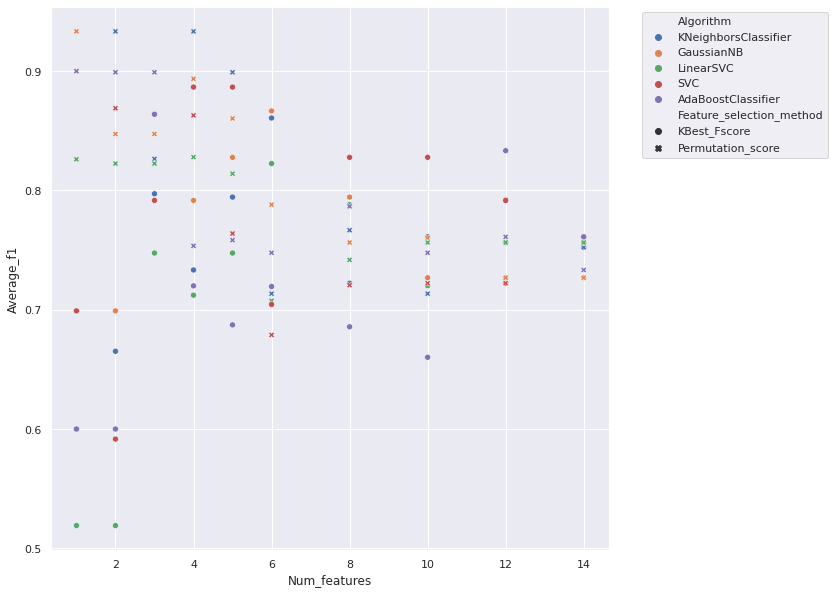

In [44]:
plt.clf()
sns.scatterplot(
    x=red_feat_score_df['Num_features'], y=red_feat_score_df['Average_f1'],
    hue=red_feat_score_df['Algorithm'], style=red_feat_score_df['Feature_selection_method']
)
plt.legend(bbox_to_anchor=(1.05,1))
plt.savefig('{}/Number_of_features_vs_performance_scatter_plot.svg'.format(ml.results_dir))
plt.show()

So, in general, achieve best performance when the model is trained with a smaller number of peptides, performance then decreases when the number of peptides is increased above ~3. Tend to achieve better performance with a smaller number of peptides when those peptides are selected by permutation analysis as compared to KBest analysis.

Given the small size of the dataset, it's very difficult to know whether this apparent improvement in performance when the number of peptides is reduced is real or not, and whether it would hold if a larger dataset were collected.

In [45]:
sub_red_feat_score_df = red_feat_score_df[red_feat_score_df['Num_features'] == 1].reset_index(drop=True)

In [46]:
sub_red_feat_score_df

,Algorithm,Resampling_method,Feature_selection_method,Num_features,Average_accuracy,Std_dev_accuracy,Average_recall,Std_dev_recall,Average_precision,Std_dev_precision,Average_f1,Std_dev_f1
0,KNeighborsClassifier,no_balancing,KBest_Fscore,1,0.633333,0.094281,0.633333,0.094281,0.591667,0.090010,0.600000,0.081650
1,KNeighborsClassifier,no_balancing,Permutation_score,1,0.900000,0.081650,0.900000,0.081650,0.908333,0.082496,0.900000,0.081650
2,GaussianNB,no_balancing,KBest_Fscore,1,0.700000,0.163299,0.700000,0.163299,0.716667,0.170103,0.699048,0.162134
3,GaussianNB,no_balancing,Permutation_score,1,0.933333,0.047140,0.933333,0.047140,0.950000,0.035355,0.933333,0.047140
4,LinearSVC,no_balancing,KBest_Fscore,1,0.600000,0.081650,0.600000,0.081650,0.477778,0.074639,0.519048,0.059856
5,LinearSVC,no_balancing,Permutation_score,1,0.833333,0.124722,0.833333,0.124722,0.856667,0.127628,0.826111,0.130216
6,SVC,no_balancing,KBest_Fscore,1,0.700000,0.163299,0.700000,0.163299,0.716667,0.170103,0.699048,0.162134
7,SVC,no_balancing,Permutation_score,1,0.900000,0.081650,0.900000,0.081650,0.908333,0.082496,0.900000,0.081650
8,AdaBoostClassifier,no_balancing,KBest_Fscore,1,0.633333,0.094281,0.633333,0.094281,0.591667,0.090010,0.600000,0.081650
9,AdaBoostClassifier,no_balancing,Permutation_score,1,0.900000,0.081650,0.900000,0.081650,0.908333,0.082496,0.900000,0.081650


Will select GaussianNB classifier and feature selection via permutation analysis, as this combination achieves the best performance with a single feature across all four metrics.

In [47]:
red_feat_searches['GaussianNB__no_balancing__Permutation_score__1']['outer_loop_params']

[OrderedDict(), OrderedDict(), OrderedDict()]

In [48]:
red_feat_searches['GaussianNB__no_balancing__Permutation_score__1']['best_outer_loop_params']

OrderedDict([('accuracy', OrderedDict()),
             ('recall', OrderedDict()),
             ('precision', OrderedDict()),
             ('f1', OrderedDict())])

In [49]:
red_feat_nested_pred = red_feat_searches['GaussianNB__no_balancing__Permutation_score__1']['predictions']
red_feat_nested_y_true = red_feat_searches['GaussianNB__no_balancing__Permutation_score__1']['y_true']
red_feat_nested_x_true = red_feat_searches['GaussianNB__no_balancing__Permutation_score__1']['x_true']

red_feat_flat_pred = np.array([pred for pred_array in red_feat_nested_pred for pred in pred_array])
red_feat_flat_y_true = np.array([y for y_array in red_feat_nested_y_true for y in y_array])
red_feat_flat_x_true = np.array([x for x_array in red_feat_nested_x_true for x in x_array])

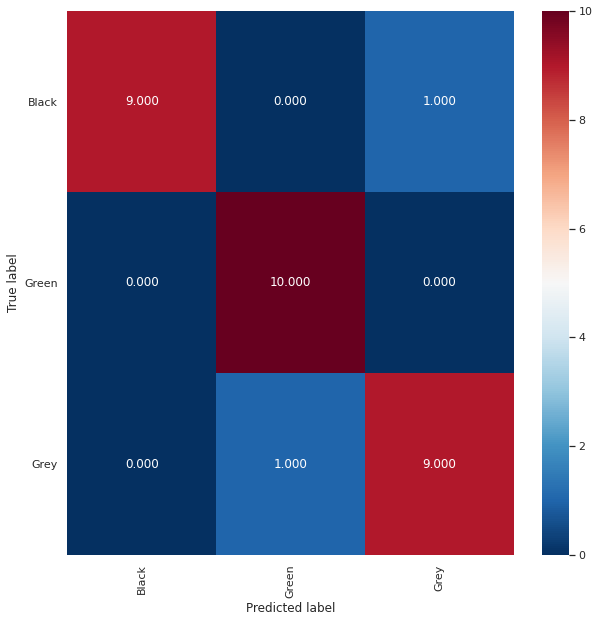

Normalised over true label (rows)


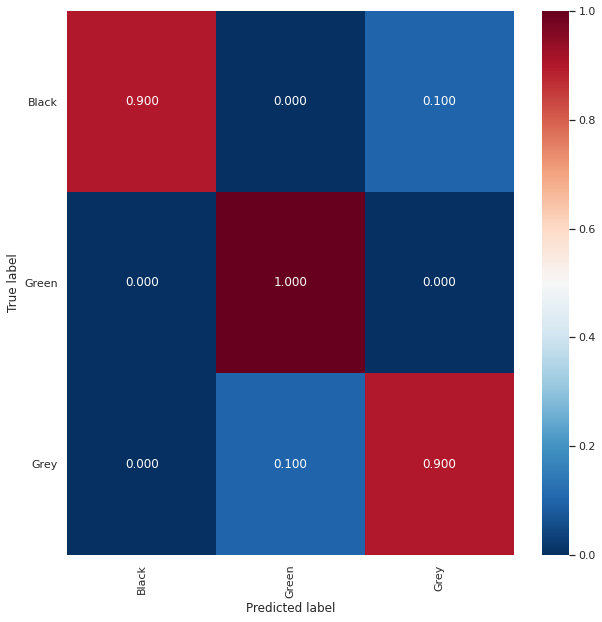

Normalised over pred label (columns)


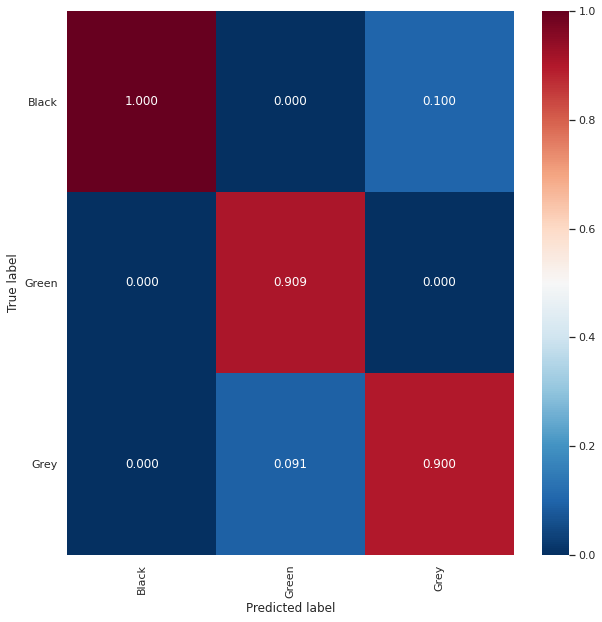

In [50]:
draw_conf_matrices(red_feat_flat_y_true, red_feat_flat_pred, ml.results_dir, 'Red_features')

In [51]:
red_feat_true_hue = []
for index, y in enumerate(red_feat_flat_y_true):
    if red_feat_flat_pred[index] == y:
        red_feat_true_hue.append('{}_correct'.format(y))
    else:
        red_feat_true_hue.append('{}_incorrect'.format(y))

sub_red_feat_true_hue = []
sub_red_feat_flat_x_true = []
sub_red_feat_flat_y_true = []
for i, true_hue in enumerate(red_feat_true_hue):
    if true_hue.endswith('_incorrect'):
        sub_red_feat_true_hue.append(true_hue)
        sub_red_feat_flat_x_true.append(red_feat_flat_x_true[i])
        sub_red_feat_flat_y_true.append(red_feat_flat_y_true[i])

red_feat_true_hue = np.array(red_feat_true_hue)
sub_red_feat_true_hue = np.array(sub_red_feat_true_hue)
sub_red_feat_flat_x_true = np.array(sub_red_feat_flat_x_true)
sub_red_feat_flat_y_true = np.array(sub_red_feat_flat_y_true)

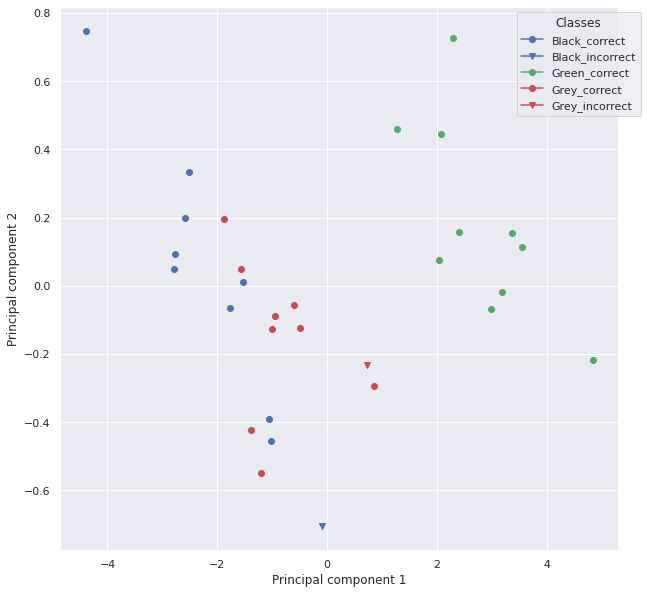

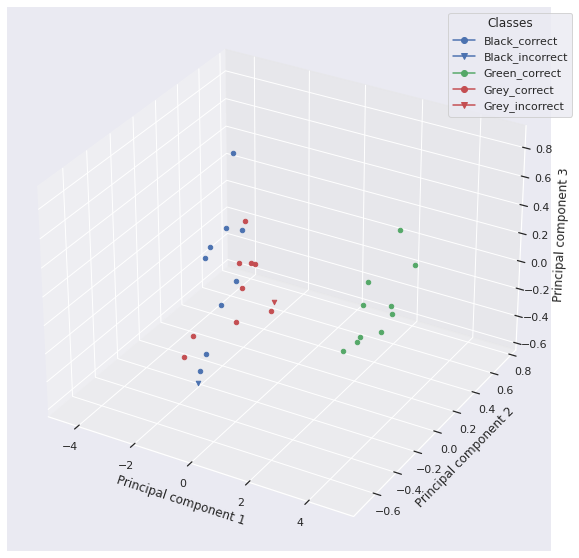

In [52]:
# Scatter plot (axes = top two principal components)
ml.plot_scatter_on_pca_axes(
    x=red_feat_flat_x_true, y=red_feat_flat_y_true, subclasses=red_feat_true_hue, num_dimensions=2,
    scale=True, plt_name='Red_features_coloured_by_pred'
)

# Scatter plot (axes = top three principal components)
ml.plot_scatter_on_pca_axes(
    x=red_feat_flat_x_true, y=red_feat_flat_y_true, subclasses=red_feat_true_hue, num_dimensions=3,
    scale=True, plt_name='Red_features_coloured_by_pred'
)

# Black_incorrect = Value that is actually black is predicted to be something else

So, GaussianNB model trained with just 1 peptide performs equally as well as, if not slightly better than, the KNeighborsClassifier model trained with all 14 peptides.

Is there a significant difference between the two models?

In [53]:
params_1 = all_feat_searches['KNeighborsClassifier__no_balancing']['best_outer_loop_params']['f1']
selected_features_1 = list(ml.features)
params_2 = red_feat_searches['GaussianNB__no_balancing__Permutation_score__1']['best_outer_loop_params']['f1']
selected_features_2 = mean_permut_feat_importances_df['Feature'].tolist()[:1]

print('Model 1:')
print('Algorithm: KNeighborsClassifier')
print('Parameters:\n{}'.format(params_1))
print('Features:\n{}'.format(selected_features_1))
print('\n\n\n')
print('Model 2:')
print('Algorithm: GaussianNB')
print('Parameters:\n{}'.format(params_2))
print('Features:\n{}'.format(selected_features_2))

F, p = ml.run_5x2_CV_combined_F_test(
    x=ml.x, y=ml.y, selected_features_1=selected_features_1, selected_features_2=selected_features_2,
    classifier_1=KNeighborsClassifier, classifier_2=GaussianNB, params_1=params_1, params_2=params_2,
    resampling_method_1='no_balancing', resampling_method_2='no_balancing',
    n_components_pca_1=None, n_components_pca_2=None
)

Model 1:
Algorithm: KNeighborsClassifier
Parameters:
OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 2), ('p', 1), ('weights', 'distance')])
Features:
['DPH_GRP22', 'DPH_GRP46', 'DPH_GRP51', 'DPH_GRP52', 'DPH_GRP63', 'DPH_GRP80', 'DPH_Pent', 'DPH_Hex', 'DPH_Hex2', 'DPH_Hept', 'DPH_24D', 'DPH_24E', 'DPH_24K', 'DPH_17K']




Model 2:
Algorithm: GaussianNB
Parameters:
OrderedDict()
Features:
['DPH_24K']


In [54]:
print('F score: {}'.format(F))
print('p value: {}'.format(p))

F score: 1.1606727168404014
p value: 0.4615012242001181


So, whilst there appears to be an improvement in model performance when the number of peptides is reduced from 14 to 1, in reality when the models are trained across 5 different randomly generated train/test splits there is no significant difference in performance - instead, the difference is likely an artefact of the small dataset. 

(Since there is not a lot of data, the metric values are calculated as the average across just 3 folds, and indeed this is reflected in the large standard deviations associated with the average metric values. Hence this also means that it is very difficult to compare the performance of the above "type split" dataset to the larger "brand split" dataset: in theory one might predict that the "type split" dataset would achieve superior performance as random errors across the assays are more likely to have been smoothed out by the additional (median) averaging in the former dataset, but unfortuately the corresponding increase in standard deviation associated with the average model metrics that result from the smaller dataset prevent this comparison from being made, as they will obscure all but the largest differences.)